# GAN based Korean summarizer using semi abstractive method


---
이훈석(1), 안순홍(2), 김승훈(교신)

---

# Abstract

 최근 NLP 분야는 encoder, decoder 및 attention을 거쳐 각종 transformer 모델이 나오면서 비약적인 발전을 이루고 있다. 문서 요약도 transformer에 의해 추상적인 요약이 가능해 졌다. 하지만 한국어의 경우, 양질의 대량 요약 학습셋이 갖추어져 있지 않아, 추상적인 요약 모델 개발 진행이 느리다. 비지도학습의 추출 요약을 사용할 수 있으나, 전반적 내용이 아닌 지협적 요약이 이루어진다는 단점이 있다. 이러한 단점을 극복하기 위해 본 연구에서는 요약 학습셋 없이 원문에서 요약에 필요한 어절을 추출하여 GAN 알고리즘에 의해 새로운 요약문을 생성하는 반추상적 방법 (Semi Abstractive Method, SAM) 을 제안한다. 
  실험에 의해 비지도학습으로 문서 전반적인 내용의 유사성과 문법의 정합성을 유지하며 요약이 되어짐을 확인하여 본 제안 방법의 우수성을 입증한다.  

Recently, the NLP field is making a leap forward with as various transformer models come out through encoder, decoder and attention. Document summarization is also possible for abstract summarization by transformer. However, in the case of Korean language, the development of abstract summary models is slow because there is no high-quality mass summary learning data set. An extractive summary method as a unsupervised learning can be used, but it has the disadvantage that an isthmus summary is made rather than the overall content. In order to overcome these obvious flaw, In this paper, we proposes a semi-abstractive method (SAM) that extracts words necessary for summary from the original text without a summary learning data set and generates a new summary by GAN algorithm. We show the distinction of this proposed method by demonstrating that it maintains the similarity of the overall contents of the document and the consistency of the grammar through experiments.


#1. Introduction

ref : https://www.machinelearningplus.com/nlp/text-summarization-approaches-nlp-example/

뉴스 사이트를 열 때 모든 뉴스 기사를 처음부터 끝까지 모두 읽지는 않습니다. 일반적으로 짧은 뉴스 요약을 살펴본 다음 관심이있는 경우 자세한 내용을 읽는다. 최근 잡지, 뉴스 애그리 게이터 앱, 조사 사이트 등과 같은 모든 곳에서 뉴스에 대한 짧고 유익한 요약이 제공된다.

중요한 정보를 잃지 않고 원본 거대한 텍스트에서 이러한 요약을 추출하는 방법을 텍스트 요약이라 한다. 요약은 문법적으로 읽기 편하며 중요한 것을 묘사하는 것이 필수적이다.

실제로 Google 뉴스, inshorts 앱 및 기타 다양한 뉴스 수집기 앱은 텍스트 요약 알고리즘을 활용하고 있다.

최근 요약 알고리즘의 트렌드에 대해 살펴본다.

When you open a news site, not all news articles are read from start to finish. In general, go through a short news summary and then read the details if you are interested. Short and informative summaries of news are available everywhere, such as in recent magazines, news aggregator apps, and research sites.

The method of extracting these summaries from the original large text without losing important information is called text summaries. The summary is grammatically easy to read and it is essential to describe what is important.

In fact, Google News, the inshorts app, and many other news aggregator apps utilize text summarization algorithms.

Let's look at the trend of the recent summary algorithm.

텍스트 요약 방법은 추출 방법과 추상 방법의 두 가지 주요 범주로 그룹화 할 수 있습니다.

> * 추출 텍스트 요약

> 먼저 개발 된 전통적인 방법으로서 주요 목표는 텍스트의 중요한 문장을 식별하고 요약에 추가하는 것이다. 얻은 요약에는 원본 텍스트의 정확한 문장이 포함되어 있다는 점에서 많이 활용되고 있다.

> * 추상적인 텍스트 요약

> 그것은 더 진보 된 방법이며, 최근 많은 연구가 진행되고 있다. 접근 방식은 중요한 섹션을 식별하고 컨텍스트를 해석하며 새로운 방식으로 재생산하는 것이다. 이렇게하면 핵심 정보가 가능한 가장 짧은 텍스트를 통해 전달된다. 여기서는 원본 텍스트에서 추출한 문장이 아니라 요약 된 새로운 문장이 생성된다.

본 논문에서는 추상적인 텍스트 요약 방법으로서 원문에서 문장이 아닌 어절 단위로 추출하여 적절한 문법적 흐름과 원문의 내용을 포함한 새로운 문장들을 생성하므로 원본 텍스트를 요약하고자 한다.


Text summary methods can be grouped into two main categories: extractive methods and abstractive methods.

> * Extractive text summary

> As a traditional method developed first, the main goal is to identify important sentences in the text and add them to the summary. The summary obtained is widely used in that it contains the exact sentence of the original text.

> * Abstractive text summary

> It is a more advanced method, and a lot of research is currently underway. The approach is to identify important sections, interpret context, and reproduce in new sentences. In this methods, key information is conveyed through the shortest possible text. In this approach, a new summary sentence is created, not the sentence extracted from the original text.

In this paper, as an abstractive text summary method, the original text is summarized by extracting the original text in terms of words, not sentences, and generating new sentences including the proper grammatical flow and contents of the original text.

#2. Related Work

먼저 추출 방법에 대한 기존 연구들을 살펴 보면 다음과 같다.

> Luhn [4]는 1960 년 Hans Peter Luhn에 의해 개발된 방법으로서 TF-IDF (Term Frequency-Inverse Document Frequency)를 기반으로 문장의 중요도를 채점하여 상위 점수의 문장을 추출하는 방식이다. 
> 이러한 개념을 발전시켜 2004년 Rada Mihalcea and Paul Tarau에 의해 TextRank[1] 방법과  G¨une¸s Erkan에 의해 LexRank [2] 추출 알고리즘이 개발되었다.
> 이후 2005년 Susan T. Dumais에의해 LSA [3] (잠재적 의미 분석) 라는 비지도 학습 알고리즘이 개발되었다. 이는 용어 문서 빈도 행렬에 SVD (Singular Value Decomposition)를 적용하여 의미 론적 의미 문장을 추출한다.
> KL-Sum [5] 은 Aria Haghighi에 의해 2009년 개발 되었다. 원문의 단어 분포와 문장별 단어 분포의 KL-divergence을 계산하여 문장을 선택한다. 

First, looking at the existing studies on the extraction method are as follows.

Luhn [4], a method developed by Hans Peter Luhn in 1960, is a method of extracting the highest scored sentences by scoring the importance of sentences based on TF-IDF (Term Frequency-Inverse Document Frequency). By developing this concept, the TextRank [1] method and the LexRank [2] extraction algorithm were developed by Rada Mihalcea and Paul Tarau in 2004 and by G¨une¼s Erkan. In 2005, Susan T. Dumais developed an unsupervised learning algorithm called LSA [3] (Potential Semantic Analysis). This extracts semantic semantic sentences by applying SVD (Singular Value Decomposition) to the term document frequency matrix. KL-Sum [5] was developed in 2009 by Aria Haghighi. A sentence is selected by calculating the KL-divergence of the word distribution in the original text and the word distribution by sentence.


하지만, 문서 일부 문장의 발췌만으로는 문서 전반적 내용을 포함하는 요약은 할 수는 없다. 
추상적인 요약은 전체 텍스트를 가장 잘 표현할 수있는 새로운 문장을 생성하는 새로운 최첨단 방법입니다. 
이것은 요약을 위해 원본 텍스트에서 문장을 선택하는 추출 방법보다 인간의 요약에 가까운 내용을 만들어 낸다.

> 추상적인 요약은 사실 원문의 문맥이 파악되어야 한다. NLP의 연구에서 문맥이 파악되는 중요한 단계는 바로 2014년에 발표됐던 sequence-to-sequence (Seq2seq)와 Attention 모델이다. (Sutskever et al., 2014, Cho et al., 2014). 이 모델을 기초하여 수많은 개념들이 연구되어 왔다. 이후,  Transformer 모델이 2017년 Google에 의해 소개되며 NLP 학계의 큰 주목을 받게된다. 이는 기존의 CNN 과 RNN 이 주를 이뤘던 연구들에서 벗어나 아예 새로운 모델을 제안하며 Seq2seq와 Attention, 이어 기계번역 성능을 한차원 높일 수 있었기 때문이다.
> 추상적인 요약은 긴 문장을 짧은 문장으로 바꾸는 일종의 기계 번역의 차원으로 다루고 있다. 따라서, 일반적으로 GPT-2, GPT-3, BERT, OpenAI, GPT, T5와 같은 각종 Transformer 모델에서 추상적인 요약 방법이 응용되고 있다.

Abstract summarization is a new state-of-the-art method of generating new sentences that best represent the entire text. This produces a content closer to human summary than the extraction method of selecting sentences from the original text for summary purposes.

> For abstract summaries, in fact, the context of the original text must be grasped. An important step in understanding the context in NLP's research is the sequence-to-sequence (Seq2seq) and Attention model, which was released in 2014. (Sutskever et al., 2014, Cho et al., 2014). Numerous concepts have been studied based on this model. After that, the Transformer model was introduced by Google in 2017 and received great attention from NLP academia. This is because we were able to improve machine translation performance to the next level, following Seq2seq and Attention, by proposing a new model, breaking away from the studies that were dominated by the existing CNN and RNN.

> Abstract summarization is treated as a kind of machine translation that turns long sentences into short sentences. Therefore, in general, abstract summary methods are applied in various Transformer models such as T5[6] (ref : Colin Raffel. (2020). Exploring the Limits of Transfer Learning with a Unified
Text-to-Text Transformer, https://arxiv.org/pdf/1910.10683.pdf), BART Transformer [7] (ref : Mike Lewis, (2019). BART: Denoising Sequence-to-Sequence Pre-training for Natural Language Generation, Translation, and Comprehension, https://arxiv.org/pdf/1910.13461.pdf), GPT-2 Transformers [8] (ref : Alec Radford, (2018). Language Models are Unsupervised Multitask Learners, https://d4mucfpksywv.cloudfront.net/better-language-models/language_models_are_unsupervised_multitask_learners.pdf), XLM Transformers [9] (ref : Guillaume Lample, (2019). Cross-lingual Language Model Pretraining, https://arxiv.org/pdf/1901.07291.pdf)

또한 원문을 '원본'으로 보고 요약을 원문에 대한 '모조'의 개념으로 보면, GAN 학습 알고리즘 또한 추상적인 요약의 주요 뼈대를 이루는 방법론이라 할 수 있다.

> 문장 생성기 출력을 사람이 읽을 수 있도록 만들기 위해 GAN 알고리즘을 적용하는 연구들이 있었다. GAN을 문장 생성에 적용하는 데있어 가장 큰 문제는 자연어의 이산 적 특성입니다. 단어 시퀀스를 생성하기 위해 생성기는 일반적으로 argmax 또는 matching과 같은 원래의 GAN 알고리즘에 대해 실패를 유발하는 기타 샘플 함수와 같은 비차 등 부분을 가지고 있다.
(Gulrajani et al., 2017)에서 저자는 개별 단어 시퀀스를 제공하는 대신 생성기 출력 레이어를 판별기에 직접 제공합니다. 이 방법은 이산 분포와 연속 분포 사이의 거리를 평가할 수있는 (Arjovsky et al., 2017)에서 제안한대로 GAN에서 Earth Mover (EM) distance를 사용하기 때문에 효과적입니다.
SeqGAN (Yu et al., 2017)은 강화 학습으로 시퀀스 생성 문제를 다룹니다. 여기서는이 접근 방식을 적대적 REINFORCE라고합니다. 그러나 판별 기는 전체 시퀀스의 품질 만 측정하므로 보상이 극히 드물고 모든 생성 단계에 할당 된 보상이 모두 동일합니다. MC search (Yu et al., 2017)는 각 시간 단계에서 대략적인 보상을 평가하기 위해 제안되었지만이 방법은 높은 시간 복잡성을 가지고 있습니다.
이 아이디어에 따라 (Li et al., 2017)는 각 시간 단계에서 예상되는 보상을 평가하기위한 부분 평가 접근법을 제안했었다.

 Looking at the original text as the 'original' and the summary as the concept of 'imitation' of the original text, the GAN learning algorithm can also be said to be a methodology that forms the main framework of the abstract summary.

> There have been studies of applying the GAN algorithm to make the output of the sentence generator human-readable. The biggest problem in applying GAN to sentence generation is the discrete nature of natural language. To generate a word sequence, the generator usually has parts such as non-differences, such as argmax or other sample functions that cause failures against the original GAN algorithm, such as matching.
In (Gulrajani et al., 2017), the author provides a generator output layer directly to the discriminator instead of providing individual word sequences. This method is effective because it uses the Earth Mover (EM) distance in GAN, as suggested by (Arjovsky et al., 2017), which allows you to evaluate the distance between the discrete and continuous distributions.
SeqGAN (Yu et al., 2017) deals with sequence generation problems with reinforcement learning. This approach is referred to here as hostile REINFORCE. However, since the discriminator only measures the quality of the entire sequence, the rewards are extremely rare and the rewards assigned to all stages of creation are all the same. MC search (Yu et al., 2017) was proposed to evaluate the approximate reward at each time step, but this method has a high time complexity.
Following this idea (Li et al., 2017) had proposed a partial assessment approach to assess the expected reward at each time step.

이상에서 설펴본 바와 같이, Transformer와 GAN 기법의 머지를 통해 비지도학습적 추상적인 요약을 실현 할 수 있을 것으로 착안하였다. 다음 섹션에서 Transformer를 사용하여 discriminator를 구현하고 GAN 기법에 의해 Generator를 학습하는 본 논문에서 제안하는 요약 방법을 설명한다.


As discussed above, it was conceived that unsupervised learning abstract summarization could be realized through merging of Transformer and GAN techniques. In the next section, we describe a summary method proposed in this paper that implements a discriminator using a transformer and learns a generator using a GAN technique.

#3. Proposed Method

본 논문에서 제안하는 방법은 Extractive 방식을 조합한 Semi Abstractive method라 할 수 있다. 원문을 어절별로 모두 나누고 이를 재조합하여 전체 내용을 요약한 몇개의 문장을 생성한다.

 이를 위해, Generator는 원문 어절의 개수 만큼의 noise를 input으로 받으며 
원문 어절의 개수 만큼의 output을 갖는다. 이때 output은 각 원문의 어절이 요약에 활용되는 확율값에 해당한다. 따라서, 특정 확율값 또는 주어진 어절의 개수에 해당하는 상위 순위의 확률값에 해당하는 어절을 선택하여 요약문을 생성한다. Similarity function에 의해서 원문으로부터 골자 어절들(frame terms)을 추출하고 이를 Generator에 bias로 입력한다. 이를 통해 Generator는 주요 어절들에 높은 확률값을 우선 할당하며, 이후 한국어 문법 discriminator에 의해 임의 생성된 문장이 문법적으로 사람이 읽을 수 있는 문장인지 구분한다. 또한 원문 유사성을 구분하는 유사도 discriminator에 의해 임의 생성된 문장이 원문 내용과 상이하지 않도록 조정한다.
전체 아키텍처는 아래 그림과 같다. 


The method proposed in this paper can be called a semi abstractive method that combines the extractive method. Divide the original text by word and reassemble it to create several sentences that summarize the entire contents.

For this purpose, the Generator receives noise as much as the number of original words as input and has output as much as the number of original words. And then, the output corresponds to the probability value used for summarizing the words of each original text. Therefore, a summary sentence is generated by selecting a word corresponding to a specific probability value or a probability value of the highest ranking corresponding to the number of given words. Frame words are extracted from the original text by similarity function and these are input as bias to the generator. Through this, the Generator first allocates a high probability values to the frame words, and then identifies whether the randomly generated sentences by the Korean grammar discriminator are grammatically human-readable sentences. Also, the similarity, which distinguishes the similarity of the original text, is adjusted so that the randomly generated sentences by the discriminator do not differ from the original text. The overall architecture is shown in the figure below.

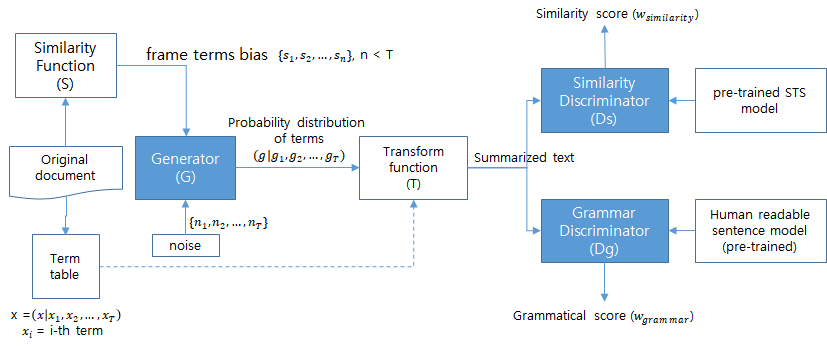

##3.1 Similarity function을 이용한 frame word의 추출

Document를 word 단위(여기서 말하는 word 단위는 띄어쓰기 단위를 의미)로 나눈다. 각각의 word을 xi 라고 할 때 Document는 다음과 같이 나타낼 수 있다.

Document

Split the document into word units (the word unit here means spaces). When each word is called xi, the document can be expressed as follows.

Document

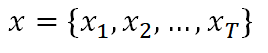


각 word에 대한 전체 document의 Similarity Probability Distribution (SPD)는 아래와 같이 나타낼 수 있다

The Similarity Probability Distribution (SPD) of the entire document for each word can be expressed as follows.


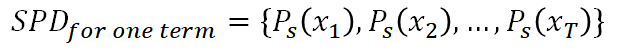


이를 연속적 Signal 이라 보고, Signal의 peak에 해당하는 word을 추출하여 이를 전체 document의 요약에 해당하는 frame words으로 구성하고자 한다.

그러나 document story상, 예를 들어 주인공을 지칭하는 word의 경우 전체 Similarity에 지배적 영향을 주게되고 signal의 peak는 해당 word들로만 구성 될 수가 있다. 결국, 원하는 frame을 얻지 못하게 된다. 이를 극복하기 위한 방법으로 복수의 words으로 구성된 story line의 SPD를 산출하여 사용한다. 만약 2개의 word인 경우 Similarity Probability는 다음과 같다.

This is regarded as a continuous signal, and a word corresponding to the peak of the signal is extracted, and it is composed of frame words corresponding to the summary of the entire document.

However, in the document story, for example, a word that refers to the protagonist has a dominant effect on the overall similarity, and the peak of the signal can consist only of the corresponding words. Eventually, the desired frame cannot be obtained. As a way to overcome this, the SPD of a story line composed of multiple words is calculated and used. If it is two words, the similarity probability is as follows.


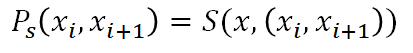


이때, 

At that moment,


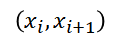

 의 구성은 일종의 Partial story 로서 filter의 역할을 하고, 전체 document를 convolution 한다.
만약 N개의 word을 filter로 사용한다면, 

The composition of this is a kind of Partial story that acts as a filter and convolutions the entire document.
If you use N words as a filter,

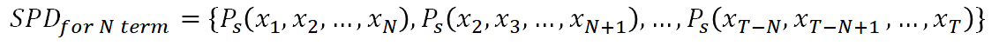


과 같이 된다. 

m개의 filter를 이용하여 frame words = s 를 아래와 같이 구성한다면

If frame words = s are composed as follows using m filters


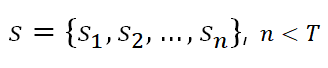



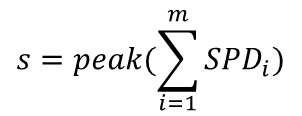


하지만 여기서 문제점은 SPD1~m 에서도 역시 주인공과 같은 지배적 word에 peak가 몰리고 story line에 해당하는 frame이 추출되지 못 할 수 있다는 것이다. 이를 극복하기 위해, peak를 추출하기 전에 SPD1의 값을 빼서 지배적 word의 peak를 회피하고 story line에 해당하는 frame을 추출 할 수 있도록 한다.


However, the problem here is that even in SPD1~m, the peak is concentrated in the dominant word like the main character, and the frame corresponding to the story line may not be extracted. To overcome this, before extracting the peak, the value of SPD1 is subtracted to avoid the peak of the dominant word, and the frame corresponding to the story line can be extracted.


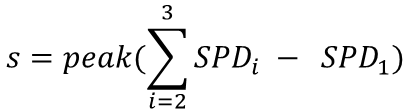

###3.1.1 Similarity function, S (Sentence-BERT)

(ref :Nils Reimers and Iryna Gurevych, (2019). Sentence-BERT: Sentence Embeddings using Siamese BERT-Networks ,https://arxiv.org/pdf/1908.10084.pdf)
를 기반으로 구현한다.

<font color='red'>BERT (Devlin et al., 2018) is a pre-trained transformer network (Vaswani et al., 2017), which set for various NLP tasks new state-of-the-art results, including question answering, sentence classification, and sentence-pair regression. The input for BERT for sentence-pair regression consists of the two sentences, separated by a special [SEP] token. Multi-head attention over 12 (base-model) or 24 layers (large-model) is applied and the output is passed to a simple regression function to derive the final label. Using this setup, BERT set a new state-of-the-art performance on the Semantic Textual Similarity (STS) benchmark (Cer et al.,2017). RoBERTa (Liu et al., 2019) showed, that the performance of BERT can further improved by small adaptations to the pre-training process. and the XLNet (Yang et al., 2019) is also widely used., but it led in general to worse results than BERT. </font>

Sentence-BERT(SBERT), a modification of the pretrained BERT network that use siamese and triplet network structures to derive semantically meaningful sentence embeddings that can be compared using cosine-similarity. <font color='red'>This reduces the effort for finding the most similar pair from 65 hours with BERT / RoBERTa to about 5 seconds with SBERT, while maintaining the accuracy from BERT. </font>

SBERT를 활용할 수 있는 pretrained model은 https://www.sbert.net/docs/pretrained_models.html 여기서 확인 할 수 있다.

본 논문에서는  한국어로 학습된 'xlm-r-large-en-ko-nli-ststb' 모델을 사용하였고, 이 모델의 STS Benchmark score는 84.05% 이다.

Pretrained models that can utilize SBERT can be found here: https://www.sbert.net/docs/pretrained_models.html.

In this paper, the'xlm-r-large-en-ko-nli-ststb' model learned in Korean was used, and the STS Benchmark score of this model was 84.05%.

SBERT를 구현한 python 라이브러리인 sentance-transformer package를 사용하여 Similarity function을 구현 하였다. 본 라이브러리는 BERT기반의 모델들과 유사하게 입력 limit가 있다. maximum 128 tokens을 입력할 수 있으며 1024 차원의 embedding된 vector를 반환한다. 즉, 전체 문서에 대해서 한번에 embedding할 수는 없으며, 이를 해결하기 위해 문서를 문장별로 나누어 N개의 문장에 대해 (N,1024)의 행렬로 embedding 하였다. similarity를 측정하기 위한 문장에 대해서도 (n,1024) 행렬화 하여 pair-wise하게 cosin distance를 계산한 (n,N) 행렬을 취득한 후 각 행별 최소값에 대한 평균값을 통해, 전체 문서에 대한 Similarity를 산출 하였다. 

Similarity function was implemented using sentance-transformer package, a python library implementing SBERT. Similar to BERT-based models, this library has an input limit. The input accepts a maximum of 128 tokens and returns a 1024-dimensional embedding vector. That is, it is not possible to embedding the entire document at once, and to solve this problem, the document is divided by sentence and embedding in a matrix of (N, 1024) for N sentences. After matrixing the sentences for measuring similarity (n,1024), the cosin distance is calculated pair-wisely to obtain the (n,N) matrix. After that, the average value of the minimum value for each row was taken, and the similarity for the entire document was calculated.

##3.2 keyBERT을 이용한 frame term의 추출

ref:Sharma, P., & Li, Y. (2019). Self-Supervised Contextual Keyword and Keyphrase Retrieval with Self-Labelling. https://www.preprints.org/manuscript/201908.0073/download/final_file

##3.3 한국어 문법 Discriminator, D

https://analyticsindiamag.com/how-to-use-bert-transformer-for-grammar-checking/

<font color='red'>
Jacob Devlin, (2019). BERT: Pre-training of Deep Bidirectional Transformers for Language Understanding
</font>

<font color='red'>* Impact of the BERT model<br>
BERT is a language representation model trained by huge data, huge models, and enormous computational overhead. It is optimal in 11 natural language processing tasks (state-of-the-art) , SOTA) results. It is estimated that many people will ridicule experiments of this scale, which are basically out of reach for general laboratories and researchers, but it does give us a lot of valuable experience. The reason for the high-performance of the BERT model is due to two points. In addition to the improvement of the model, it is more important to use a large data set (BooksCorpus 800M + English Wikipedia 2.5G words) and a large computing power. Pre-training on related tasks, achieving monotonous growth in performance on target tasks.

* Overview of Task<br>
Now the task which we are to do is to predict whether a sentence is grammatically correct or not. We choose a dataset in which we are given a piece of text and along with it a label .which is referred to as the “whether it is grammatically correct or not”.<br>
0 means grammatically incorrect and 1 means grammatically correct.<br>
So essentially this problem translates into a text classification problem where we classify whether a sentence is grammatically correct or not.
* Getting started with Modeling<br>
We’ll use [The Corpus of Linguistic Acceptability (CoLA)](https://nyu-mll.github.io/CoLA/) dataset for single sentence classification. It’s a set of sentences labelled as grammatically correct or incorrect. It was first published in May of 2018 and is one of the tests included in the “GLUE Benchmark” on which models like BERT are competing </font>


한국어 문법의 정합성을 구분하기 위해 BERT기반 문장 classification을 구성한다. 한국어 pre-trained model 'monologg/kobert' 을 기반으로 약 3만개의 한국어 단일 문장을 fine-tunning 하였다. 정상 문장의 경우 label = 1, 문법적으로 비정상 문장은 label = 0 으로 labeling하였으며, 비정상 문장은 단순하게 정상문장을 shuffling 해서 만들었다. epoch 4회, 3천개의 validation set으로 성능 측정결과 F1 score 0.99가 나왔다.

In order to classify the consistency of Korean grammar, we construct BERT-based sentence classification. About 30,000 Korean single sentences were fine-tuned based on the Korean pre-trained model'monologg/kobert'. For normal sentences, label = 1, grammatically abnormal sentences were labeled as label = 0, and abnormal sentences were made by simply shuffling the normal sentences. As a result of measuring the performance with epoch 4 times and 3,000 validation sets, an F1 score of 0.99 was obtained.

## 3.4 한국어 Text Generator, G

Text Generator는 단순화 하기 위해 일반 DNN을 사용하였다. 원문의 전체 words의 개수에 해당하는 random noise와 Frame words를 bias로 입력받는다. 즉, 입력항이 2개이며 Output은 어떤 word가 요약에 사용될지 모르기 때문에 입력과 동일하게 원문 전체 word의 개수와 같다.

Text Generator used general DNN for simplification. Random noise and frame words corresponding to the total number of words in the original text are input as a bias. That is, there are two input terms and the output is equal to the number of words in the original text as it is the same as the input because we do not know which word will be used for the summary.


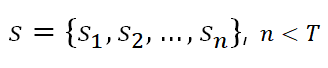

random noise 는 dense layer 몇 개를 거치지만 Frame words bias는 동일 차원의 output 바로 직전에 deep network의 output tensor에 add 된다. 이로서 전체 output은 frame words에 bias 되어 원문이 요약된 문장이 생성된다. 또한 random noise에 의해 frame words 각각의 사이에 적절한 word가 원문에서 추출 되는 것이다. 이후, 생성된 probability distribution (Output)에서 요약에 사용되는 word는 아래의 조건에 의해서 선택된다.

Random noise goes through several dense layers, but frame words bias is added to the output tensor of the deep network just before the output of the same dimension. As a result, the entire output is biased to the frame words, and a sentence summarizing the original text is generated. Also, appropriate words between each frame words are extracted from the original text by random noise. Then, in the generated probability distribution (Output), the word used in the summary is selected according to the following conditions.


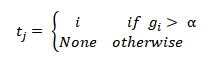

여기서 α 값을 조절 하므로 생성되는 text의 길이를 조절 할 수 있다. 적절한 α값을 통해 문법적으로 읽을 수 있는 글이 생성된다. 
마지막으로 선택된 t vector는 x에서 선택된 order에 해당되며 x[t] 연산에 의해서 text가 생성된다.


전체적인 구성은 아래와 같다. 

Here, you can adjust the length of the generated text by adjusting the α value. A text that can be read grammatically is generated through an appropriate α value.
Finally, the selected t vector corresponds to the order selected from x, and text is created by the x[t] operation.


The overall composition is as follows.

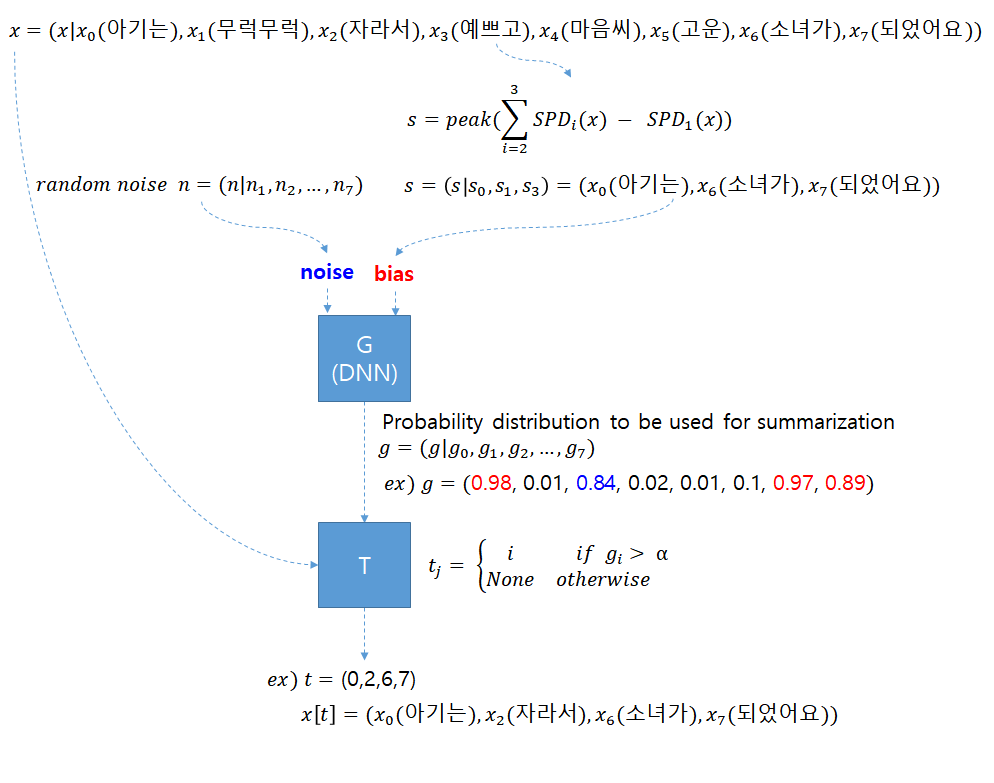

##3.5 GAN Training

GAN의 논문 (ref:Ian J. Goodfellow, (2014). Generative Adversarial Nets, https://arxiv.org/pdf/1406.2661.pdf) 에서 보면 value function V(G,D)에 대하여 다음을 만족시키는 과정에 의하여 학습이 이루어 진다.

In GAN's paper (ref:Ian J. Goodfellow, (2014). Generative Adversarial Nets, https://arxiv.org/pdf/1406.2661.pdf), the process that satisfies the following for value function V(G,D) Learning is achieved by

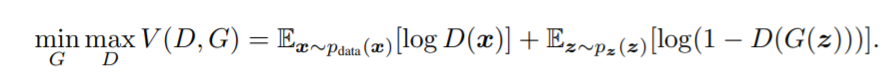

즉, D에 대한 cross-entory 

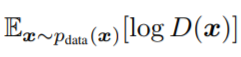

와 G에 대한 cross-entropy 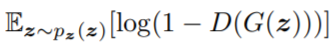

에 대한 최적화의 과정임을 알 수 있다.

본 논문에서 다루는 전체 목적함수는 아래와 같이 나타낼수 있다.


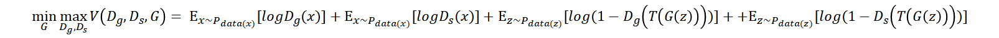

문제는 Discriminator 전에 Transform function T에 의해 G에서 생성한 probability distribution을 readable text 로 변환 하는 과정이 있는 것이다. 즉, T는 미분 불가능한 절차적 함수로서 D(T(G(z)))는 학습에 필요한 backward를 할 수 없다. 

이러한 문제는 GAN을 통한 Text 생성 알고리즘에서 빈번히 봉착하는 문제이며 논문 
(ref : Yau-ShianWang, (2018). Learning to Encode Text as Human-Readable Summaries using Generative Adversarial Networks) 에서는 'Self-Critic Adversarial REINFORCE'을 제안하였다. 해당 기법에서는 이산 시퀀스 ys를 판별기에 공급하기 때문에 판별 기의 기울기가 생성기로 직접 역 전파 할 수 없습니다. 여기에서는 정책 그라데이션 방법을 사용합니다. 타임 스텝 i에서, 우리는 식별기의 i ㆍ 1 타임 스텝 점수 si ㆍ 1를 자기 임계 기준선으로 사용합니다. 보상 rD i는 시간 단계 i의 시퀀스 품질이 시간 단계 i의 시퀀스 품질보다 더 좋은지 또는 더 나쁜지를 평가합니다. 1. D2의 생성자 보상 rD i는 다음과 같습니다.

The problem is that there is a process of converting the probability distribution generated in G into readable text by the transform function T before the discriminator. That is, T is a procedural function that cannot be differentiated, and D(T(G(z))) cannot perform backward required for learning.

These problems are frequently encountered in the text generation algorithm through GAN, and the paper (ref: Yau-ShianWang, (2018).Learning to Encode Text as Human-Readable Summaries using Generative Adversarial Networks) Suggested 'Self-Critic Adversarial REINFORCE'. In that technique generator feed a discrete sequence ys to the discriminator, the gradient from the discriminator cannot directly back-propagate to the generator. Here, we use the policy gradient method. At timestep i, we use the i 􀀀 1 timestep score si􀀀1 from the discriminator as its self-critical baseline. The reward rD i evaluates whether the quality of sequence in timestep i is better or worse than that in timestep i 􀀀 1. The generator reward rD i from D2 is

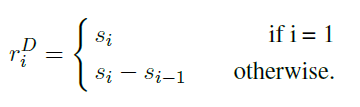

However, some sentences may be judged as bad sentences at the previous timestep, but at later timesteps judged as good sentences, and vice-versa. Hence we use the discounted expected reward d with discount factor to calculate the discounted reward di at time step i as


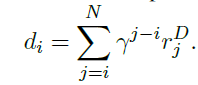

To maximize the expected discounted reward di, the loss of generator is:


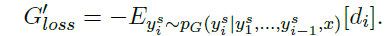


We use the likelihood ratio trick to approximate the gradient to minimize 

하지만 이러한 방식은 RNN에 의한 timeseries로 접근 할 때 가능하며, discounted reward d의 적용은 loss의 미분 폭이 매우 좁아서, 상당히 많은 시행 (epoch)과정이 필요하다.

따라서 본 논문에서는 cross-entropy를 loss로 사용하지 않고 변형된  wasserstein distance (Martin Arjovsky, (2017). Wasserstein GAN, https://arxiv.org/pdf/1701.07875.pdf)를 사용고자 한다. 

G(z)의 output (g|g1,g2,...gT)에 대하여 T 함수는 내부에 다음의 과정이 있다. 



We use the likelihood ratio trick to approximate the gradient to minimize

However, this method is possible when approaching the timeseries by RNN, and the application of discounted reward d has a very narrow differential width of the loss, requiring a considerable amount of epoch.

Therefore, in this paper, we intend to use the modified wasserstein distance (Martin Arjovsky, (2017). Wasserstein GAN, https://arxiv.org/pdf/1701.07875.pdf) without using cross-entropy as a loss.

For the output of G(z) (g|g1,g2,...gT), the T function has the following process inside.

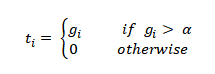

위에서 [알파]의 값은 요약 결과고 얻고자 하는 어절의 개수에 따라 결정된다. [알파]값이 크면 요약 결과 어절의 수가 작아지고 알파값이 작을 수로 요약 어절의 수가 많아 진다.

T(G(z))의 output의 예를 들면 다음과 같다.
(t|t1,t2,...tT) ~ (t|g1,0,0,g4,0,g6,...,0,gT)

이때
D(T(G(z))) = w

우리는 wasserstein distance을 loss로 사용하기 위해 

The value of [alpha] above is a summary result and is determined by the number of words to be obtained. The larger the [alpha] value, the smaller the number of words in the summary result, and the smaller the alpha value, the larger the number of summary words.

An example of the output of T(G(z)) is as follows. (t|t1,t2,...tT) ~ (t|g1,0,0,g4,0,g6,...,0,gT)

At this time, D(T(G(z))) = w

We use the wasserstein distance as the loss

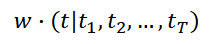

을 output으로 설정한다.

결과적으로 Generator의 loss는

Set to output.

As a result, the generator's loss is

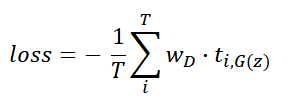

이렇게 함으로서 ti는 G의 output (g|g1...gT)의 일부로서, 미분가능 하고 backward를 통해 학습이 이루어 질 수 있다.

전체 목적 함수는 아래와 같다.

By doing this, ti is a part of G's output (g|g1...gT), which can be differentiated, and learning can be achieved through backward.

The overall objective function is as follows.

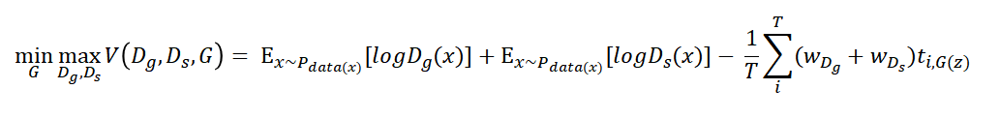

문법, 유사도 측정을 위한 각 Discriminator는 pre-trained model을 이용하여 일반화된 구분자로서 적용하였다.
그러나, 학습의 과정에서 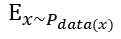

를 정의 할 수 없다. 이미, 요약된 실데이터를 만들수 없기 때문이다. 
그래서, 원문의 일부 문장을 대입하였더니, 학습이 진행되면서 원문의 일부로 overfitting 되는 경향이 나타났다. 즉, Extractive 방법의 결과로 수렴되는 것이다.
그래서, 본 논문에서는 Discriminator가 이미 pre-trained model에 의해 학습되어 있으므로 Discriminator를 학습에 참여 시키지 않았다. 따라서 최종 목적함수는 아래와 같이 단순화 하였다.

Each discriminator for measuring grammar and similarity was applied as a generalized delimiter using a pre-trained model. However, in the process of learning

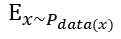


Cannot be defined. This is because it is not possible to create summarized real data already. So, after substituting some sentences from the original text, there was a tendency to overfitting as part of the original text as learning progressed. In other words, it converges as a result of the extractive method. So, in this paper, Discriminator was not involved in learning because the Discriminator has already been learned by the pre-trained model. Therefore, the final objective function is simplified as follows.

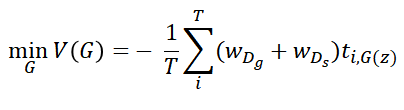

#4. Implementation


## 4.1 기본 설정...

In [ ]:
if True:
    from google.colab import drive
    drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!pip install keybert
!pip install sentence-transformers==0.3.0
!pip install transformers==3.0.2

     |████████████████████████████████| 71kB 11.3MB/s 
     |████████████████████████████████| 1.9MB 40.8MB/s 
     |████████████████████████████████| 1.2MB 53.6MB/s 
     |████████████████████████████████| 3.2MB 57.9MB/s 
     |████████████████████████████████| 890kB 55.1MB/s 
  Created wheel for keybert: filename=keybert-0.2.0-cp37-none-any.whl size=10599 sha256=c92278458f54ec828a03a401b7f48f9363457b61962b310cae45435a2cf7bfca
  Stored in directory: /root/.cache/pip/wheels/59/d7/16/04bab6677a4dfa9fd8ab2b350bac915d60f5378b83d6f5a372
  Created wheel for sentence-transformers: filename=sentence_transformers-0.4.1.2-cp37-none-any.whl size=103068 sha256=31883a3a8d8dad8d30df335c9ecac8953a436d04e3ad108ebd20c8bb73595462
  Stored in directory: /root/.cache/pip/wheels/3d/33/d1/5703dd56199c09d4a1b41e0c07fb4e7765a84d787cbdc48ac3
  Created wheel for sacremoses: filename=sacremoses-0.0.43-cp37-none-any.whl size=893262 sha256=cbe02a76ed87a1e0fb0892ac65036836bd12937f30ff88b75f96b0a55f187ca9
  Stored 

In [ ]:
import matplotlib.pyplot as plt
# set seeds for reproducability
from numpy.random import seed
seed(1)

import pandas as pd
import numpy as np
import string, os 

import urllib.request
import nltk
nltk.download('punkt')

import warnings
warnings.filterwarnings("ignore")
warnings.simplefilter(action='ignore', category=FutureWarning)

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


In [ ]:
import tensorflow as tf
# Get the GPU device name.
device_name = tf.test.gpu_device_name()

# The device name should look like the following:
if device_name == '/device:GPU:0':
    print('Found GPU at: {}'.format(device_name))
else:
    print('GPU device not found')

Found GPU at: /device:GPU:0


In [ ]:
import torch

# If there's a GPU available...
if torch.cuda.is_available():    

    # Tell PyTorch to use the GPU.    
    device = torch.device("cuda")

    print('There are %d GPU(s) available.' % torch.cuda.device_count())

    print('We will use the GPU:', torch.cuda.get_device_name(0))

# If not...
else:
    print('No GPU available, using the CPU instead.')
    device = torch.device("cpu")

There are 1 GPU(s) available.
We will use the GPU: Tesla T4


In [ ]:
import random

SEED = 1234

random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)
torch.cuda.manual_seed(SEED)
torch.backends.cudnn.deterministic = True

In [ ]:
# Print iterations progress
class ProgressBar:

    def __init__(self,total=20, prefix = '', suffix = '', decimals = 1, length = 20, fill = '|', printEnd = "\r"):
        self.total = total
        self.prefix = prefix
        self.suffix = suffix
        self.decimals = decimals
        self.length = length
        self.fill = fill
        self.printEnd = printEnd
        self.ite = 0

    def printProgress(self,iteration, text):
        self.ite += iteration
        percent = ("{0:." + str(self.decimals) + "f}").format(100 * (self.ite / float(self.total)))

        filledLength = int(self.length * self.ite // self.total)
        bar = self.fill * filledLength + '.' * (self.length - filledLength)
        print(f'\r{self.prefix} |{bar}| {percent}% {self.suffix}  {text}', end="", flush=True)
        # Print New Line on Complete
        if self.ite == self.total: 
            print()

In [ ]:
import torch
import torchvision
import torch.nn as nn
import torch.nn.functional as F

from torch.utils.data import DataLoader
from torchvision import datasets
from torchvision import transforms

##4.2 Grammar Discriminator Class

In [ ]:
# coding=utf-8
# Copyright 2018 Google AI, Google Brain and Carnegie Mellon University Authors and the HuggingFace Inc. team and Jangwon Park
#
# Licensed under the Apache License, Version 2.0 (the "License");
# you may not use this file except in compliance with the License.
# You may obtain a copy of the License at
#
#     http://www.apache.org/licenses/LICENSE-2.0
#
# Unless required by applicable law or agreed to in writing, software
# distributed under the License is distributed on an "AS IS" BASIS,
# WITHOUT WARRANTIES OR CONDITIONS OF ANY KIND, either express or implied.
# See the License for the specific language governing permissions and
# limitations under the License.
""" Tokenization classes for KoBert model."""


import logging
import os
import unicodedata
from shutil import copyfile

from transformers import PreTrainedTokenizer


logger = logging.getLogger(__name__)

VOCAB_FILES_NAMES = {"vocab_file": "tokenizer_78b3253a26.model",
                     "vocab_txt": "vocab.txt"}

PRETRAINED_VOCAB_FILES_MAP = {
    "vocab_file": {
        "monologg/kobert": "https://s3.amazonaws.com/models.huggingface.co/bert/monologg/kobert/tokenizer_78b3253a26.model",
        "monologg/kobert-lm": "https://s3.amazonaws.com/models.huggingface.co/bert/monologg/kobert-lm/tokenizer_78b3253a26.model",
        "monologg/distilkobert": "https://s3.amazonaws.com/models.huggingface.co/bert/monologg/distilkobert/tokenizer_78b3253a26.model"
    },
    "vocab_txt": {
        "monologg/kobert": "https://s3.amazonaws.com/models.huggingface.co/bert/monologg/kobert/vocab.txt",
        "monologg/kobert-lm": "https://s3.amazonaws.com/models.huggingface.co/bert/monologg/kobert-lm/vocab.txt",
        "monologg/distilkobert": "https://s3.amazonaws.com/models.huggingface.co/bert/monologg/distilkobert/vocab.txt"
    }
}

PRETRAINED_POSITIONAL_EMBEDDINGS_SIZES = {
    "monologg/kobert": 512,
    "monologg/kobert-lm": 512,
    "monologg/distilkobert": 512
}

PRETRAINED_INIT_CONFIGURATION = {
    "monologg/kobert": {"do_lower_case": False},
    "monologg/kobert-lm": {"do_lower_case": False},
    "monologg/distilkobert": {"do_lower_case": False}
}

SPIECE_UNDERLINE = u'▁'


class KoBertTokenizer(PreTrainedTokenizer):
    """
        SentencePiece based tokenizer. Peculiarities:
            - requires `SentencePiece <https://github.com/google/sentencepiece>`_
    """
    vocab_files_names = VOCAB_FILES_NAMES
    pretrained_vocab_files_map = PRETRAINED_VOCAB_FILES_MAP
    pretrained_init_configuration = PRETRAINED_INIT_CONFIGURATION
    max_model_input_sizes = PRETRAINED_POSITIONAL_EMBEDDINGS_SIZES

    def __init__(
            self,
            vocab_file,
            vocab_txt,
            do_lower_case=False,
            remove_space=True,
            keep_accents=False,
            unk_token="[UNK]",
            sep_token="[SEP]",
            pad_token="[PAD]",
            cls_token="[CLS]",
            mask_token="[MASK]",
            **kwargs):
        super().__init__(
            unk_token=unk_token,
            sep_token=sep_token,
            pad_token=pad_token,
            cls_token=cls_token,
            mask_token=mask_token,
            **kwargs
        )

        # Build vocab
        self.token2idx = dict()
        self.idx2token = []
        with open(vocab_txt, 'r', encoding='utf-8') as f:
            for idx, token in enumerate(f):
                token = token.strip()
                self.token2idx[token] = idx
                self.idx2token.append(token)

        try:
            import sentencepiece as spm
        except ImportError:
            logger.warning("You need to install SentencePiece to use KoBertTokenizer: https://github.com/google/sentencepiece"
                           "pip install sentencepiece")

        self.do_lower_case = do_lower_case
        self.remove_space = remove_space
        self.keep_accents = keep_accents
        self.vocab_file = vocab_file
        self.vocab_txt = vocab_txt

        self.sp_model = spm.SentencePieceProcessor()
        self.sp_model.Load(vocab_file)

    @property
    def vocab_size(self):
        return len(self.idx2token)

    def get_vocab(self):
        return dict(self.token2idx, **self.added_tokens_encoder)

    def __getstate__(self):
        state = self.__dict__.copy()
        state["sp_model"] = None
        return state

    def __setstate__(self, d):
        self.__dict__ = d
        try:
            import sentencepiece as spm
        except ImportError:
            logger.warning("You need to install SentencePiece to use KoBertTokenizer: https://github.com/google/sentencepiece"
                           "pip install sentencepiece")
        self.sp_model = spm.SentencePieceProcessor()
        self.sp_model.Load(self.vocab_file)

    def preprocess_text(self, inputs):
        if self.remove_space:
            outputs = " ".join(inputs.strip().split())
        else:
            outputs = inputs
        outputs = outputs.replace("``", '"').replace("''", '"')

        if not self.keep_accents:
            outputs = unicodedata.normalize('NFKD', outputs)
            outputs = "".join([c for c in outputs if not unicodedata.combining(c)])
        if self.do_lower_case:
            outputs = outputs.lower()

        return outputs

    def _tokenize(self, text, return_unicode=True, sample=False):
        """ Tokenize a string. """
        text = self.preprocess_text(text)

        if not sample:
            pieces = self.sp_model.EncodeAsPieces(text)
        else:
            pieces = self.sp_model.SampleEncodeAsPieces(text, 64, 0.1)
        new_pieces = []
        for piece in pieces:
            if len(piece) > 1 and piece[-1] == str(",") and piece[-2].isdigit():
                cur_pieces = self.sp_model.EncodeAsPieces(piece[:-1].replace(SPIECE_UNDERLINE, ""))
                if piece[0] != SPIECE_UNDERLINE and cur_pieces[0][0] == SPIECE_UNDERLINE:
                    if len(cur_pieces[0]) == 1:
                        cur_pieces = cur_pieces[1:]
                    else:
                        cur_pieces[0] = cur_pieces[0][1:]
                cur_pieces.append(piece[-1])
                new_pieces.extend(cur_pieces)
            else:
                new_pieces.append(piece)

        return new_pieces

    def _convert_token_to_id(self, token):
        """ Converts a token (str/unicode) in an id using the vocab. """
        return self.token2idx.get(token, self.token2idx[self.unk_token])

    def _convert_id_to_token(self, index, return_unicode=True):
        """Converts an index (integer) in a token (string/unicode) using the vocab."""
        return self.idx2token[index]

    def convert_tokens_to_string(self, tokens):
        """Converts a sequence of tokens (strings for sub-words) in a single string."""
        out_string = "".join(tokens).replace(SPIECE_UNDERLINE, " ").strip()
        return out_string

    def build_inputs_with_special_tokens(self, token_ids_0, token_ids_1=None):
        """
        Build model inputs from a sequence or a pair of sequence for sequence classification tasks
        by concatenating and adding special tokens.
        A KoBERT sequence has the following format:
            single sequence: [CLS] X [SEP]
            pair of sequences: [CLS] A [SEP] B [SEP]
        """
        if token_ids_1 is None:
            return [self.cls_token_id] + token_ids_0 + [self.sep_token_id]
        cls = [self.cls_token_id]
        sep = [self.sep_token_id]
        return cls + token_ids_0 + sep + token_ids_1 + sep

    def get_special_tokens_mask(self, token_ids_0, token_ids_1=None, already_has_special_tokens=False):
        """
        Retrieves sequence ids from a token list that has no special tokens added. This method is called when adding
        special tokens using the tokenizer ``prepare_for_model`` or ``encode_plus`` methods.
        Args:
            token_ids_0: list of ids (must not contain special tokens)
            token_ids_1: Optional list of ids (must not contain special tokens), necessary when fetching sequence ids
                for sequence pairs
            already_has_special_tokens: (default False) Set to True if the token list is already formated with
                special tokens for the model
        Returns:
            A list of integers in the range [0, 1]: 0 for a special token, 1 for a sequence token.
        """

        if already_has_special_tokens:
            if token_ids_1 is not None:
                raise ValueError(
                    "You should not supply a second sequence if the provided sequence of "
                    "ids is already formated with special tokens for the model."
                )
            return list(map(lambda x: 1 if x in [self.sep_token_id, self.cls_token_id] else 0, token_ids_0))

        if token_ids_1 is not None:
            return [1] + ([0] * len(token_ids_0)) + [1] + ([0] * len(token_ids_1)) + [1]
        return [1] + ([0] * len(token_ids_0)) + [1]

    def create_token_type_ids_from_sequences(self, token_ids_0, token_ids_1=None):
        """
        Creates a mask from the two sequences passed to be used in a sequence-pair classification task.
        A KoBERT sequence pair mask has the following format:
        0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1
        | first sequence    | second sequence
        if token_ids_1 is None, only returns the first portion of the mask (0's).
        """
        sep = [self.sep_token_id]
        cls = [self.cls_token_id]
        if token_ids_1 is None:
            return len(cls + token_ids_0 + sep) * [0]
        return len(cls + token_ids_0 + sep) * [0] + len(token_ids_1 + sep) * [1]

    def save_vocabulary(self, save_directory):
        """ Save the sentencepiece vocabulary (copy original file) and special tokens file
            to a directory.
        """
        if not os.path.isdir(save_directory):
            logger.error("Vocabulary path ({}) should be a directory".format(save_directory))
            return

        # 1. Save sentencepiece model
        out_vocab_model = os.path.join(save_directory, VOCAB_FILES_NAMES["vocab_file"])

        if os.path.abspath(self.vocab_file) != os.path.abspath(out_vocab_model):
            copyfile(self.vocab_file, out_vocab_model)

        # 2. Save vocab.txt
        index = 0
        out_vocab_txt = os.path.join(save_directory, VOCAB_FILES_NAMES["vocab_txt"])
        with open(out_vocab_txt, "w", encoding="utf-8") as writer:
            for token, token_index in sorted(self.token2idx.items(), key=lambda kv: kv[1]):
                if index != token_index:
                    logger.warning(
                        "Saving vocabulary to {}: vocabulary indices are not consecutive."
                        " Please check that the vocabulary is not corrupted!".format(out_vocab_txt)
                    )
                    index = token_index
                writer.write(token + "\n")
                index += 1

        return out_vocab_model, out_vocab_txt

In [ ]:
from transformers import BertTokenizer, AutoTokenizer, BertForSequenceClassification, AdamW, BertConfig, get_linear_schedule_with_warmup
from torch.utils.data import DataLoader, RandomSampler, SequentialSampler, TensorDataset, random_split

import time
import random
import datetime

# 간단한 전처리
def clean_text(txt):
    txt = txt.replace('\n',' ')
    txt = txt.replace('\r',' ')    
    txt = txt.replace('=','')
    txt = txt.replace('\"','')   
    txt = txt.replace('\'','')
    #txt = txt.replace(',','')
    txt = txt.replace('..','')
    txt = txt.replace('...','')
    #txt = txt.replace('.','. ')
    txt = txt.replace('.','. ')
    txt = txt.replace('  ',' ')
    txt = txt.replace('  ',' ')    
    txt = txt.replace('  ',' ')   
    txt = txt.replace('  ',' ')           
    txt = txt.replace('  ',' ')
    txt = txt.replace('  ',' ')    
    txt = txt.replace('  ',' ')   
    txt = txt.replace('  ',' ')             
    return txt.strip()

def shuffling(txt):
    txt_list = txt.split(' ')
    random.shuffle(txt_list)
    return ' '.join(txt_list)

def collect_training_dataset_for_grammar_discriminator(source_urls=[]):
    ko_sentences_dataset = []
    for url in source_urls:
        raw_text = urllib.request.urlopen(url).read().decode('utf-8')
        ko_sentences_dataset += nltk.sent_tokenize(clean_text(raw_text))

    sentences = []
    labels = []

    for txt in ko_sentences_dataset:
        txt = txt.strip()
        if len(txt) > 40:
            #ko_grammar_dataset.append([txt,1])
            txt = txt.replace('.','')
            tf = random.choice([True,False])
            # 정상 또는 비정상 둘중에 하나만 데이터셋에 추가
            if (tf):
                sentences.append(txt) # '.'의 위치를 보고 True, False를 판단 하기 땜에...
                labels.append(1)
            else:
                sentences.append(shuffling(txt))
                labels.append(0)

    return sentences,labels

# Function to calculate the accuracy of our predictions vs labels
def flat_accuracy(preds, labels):
    pred_flat = np.argmax(preds, axis=1).flatten()
    labels_flat = labels.flatten()
    return np.sum(pred_flat == labels_flat) / len(labels_flat)

def format_time(elapsed):
    '''
    Takes a time in seconds and returns a string hh:mm:ss
    '''
    # Round to the nearest second.
    elapsed_rounded = int(round((elapsed)))
    
    # Format as hh:mm:ss
    return str(datetime.timedelta(seconds=elapsed_rounded))

class Grammar_Discriminator:
    """
    # dataset 주입하고 train해서 사용하는 경우, 
    gd = Grammar_Discriminator(pretraoned_kobert_model_name='monologg/kobert')
    gd.set_dataset(dataset = (sentences,labels))
    gd.train(epochs = 4)


    # 기존에 학습한 모델을 load 할 경우
    gd = Grammar_Discriminator(input_dir = './drive/MyDrive/Colab Notebooks/summary/grammar_check_model')
    
    """

    def __init__(self, pretraoned_kobert_model_name='monologg/kobert', input_dir=None):

        if input_dir is None:
            self.tokenizer = KoBertTokenizer.from_pretrained(pretraoned_kobert_model_name)
            self.discriminator = BertForSequenceClassification.from_pretrained(
                                    pretraoned_kobert_model_name, # Use the 12-layer BERT model, with an uncased vocab.
                                    num_labels = 2, # The number of output labels--2 for binary classification.
                                                    # You can increase this for multi-class tasks.   
                                    output_attentions = False, # Whether the model returns attentions weights.
                                    output_hidden_states = False, # Whether the model returns all hidden-states.
                                )            
        else:
            self.__load_model(input_dir)



    def set_dataset(self, sentences,labels):
        # Print the original sentence.
        print(' Original: ', sentences[0])

        # Print the sentence split into tokens.
        print('Tokenized: ', self.tokenizer.tokenize(sentences[0]))

        # Print the sentence mapped to token ids.
        print('Token IDs: ', self.tokenizer.convert_tokens_to_ids(self.tokenizer.tokenize(sentences[0])))   

        # Tokenize all of the sentences and map the tokens to thier word IDs.
        input_ids = []
        attention_masks = []

        # For every sentence...
        for sent in sentences:
            # `encode_plus` will:
            #   (1) Tokenize the sentence.
            #   (2) Prepend the `[CLS]` token to the start.
            #   (3) Append the `[SEP]` token to the end.
            #   (4) Map tokens to their IDs.
            #   (5) Pad or truncate the sentence to `max_length`
            #   (6) Create attention masks for [PAD] tokens.
            encoded_dict = self.tokenizer.encode_plus(
                                sent,                      # Sentence to encode.
                                add_special_tokens = True, # Add '[CLS]' and '[SEP]'
                                max_length = 64,           # Pad & truncate all sentences.
                                pad_to_max_length = True,
                                return_attention_mask = True,   # Construct attn. masks.
                                return_tensors = 'pt',     # Return pytorch tensors.
                                truncation = True,
                        )
            
            # Add the encoded sentence to the list.    
            input_ids.append(encoded_dict['input_ids'])
            
            # And its attention mask (simply differentiates padding from non-padding).
            attention_masks.append(encoded_dict['attention_mask'])

        # Convert the lists into tensors.
        input_ids = torch.cat(input_ids, dim=0)
        attention_masks = torch.cat(attention_masks, dim=0)
        labels = torch.tensor(labels)

        # Print sentence 0, now as a list of IDs.
        print('Original: ', sentences[0])
        print('Token IDs:', input_ids[0])

        # Training & Validation Split
        # Divide up our training set to use 90% for training and 10% for validation.

        # Combine the training inputs into a TensorDataset.
        dataset = TensorDataset(input_ids, attention_masks, labels)

        # Create a 90-10 train-validation split.

        # Calculate the number of samples to include in each set.
        train_size = int(0.9 * len(dataset))
        val_size = len(dataset) - train_size

        # Divide the dataset by randomly selecting samples.
        train_dataset, val_dataset = random_split(dataset, [train_size, val_size])

        print('{:>5,} training samples'.format(train_size))
        print('{:>5,} validation samples'.format(val_size))

        # The DataLoader needs to know our batch size for training, so we specify it 
        # here. For fine-tuning BERT on a specific task, the authors recommend a batch 
        # size of 16 or 32.
        self.batch_size = 32

        # Create the DataLoaders for our training and validation sets.
        # We'll take training samples in random order. 
        self.train_dataloader = DataLoader(
                    train_dataset,  # The training samples.
                    sampler = RandomSampler(train_dataset), # Select batches randomly
                    batch_size = self.batch_size # Trains with this batch size.
                )

        # For validation the order doesn't matter, so we'll just read them sequentially.
        self.validation_dataloader = DataLoader(
                    val_dataset, # The validation samples.
                    sampler = SequentialSampler(val_dataset), # Pull out batches sequentially.
                    batch_size = self.batch_size # Evaluate with this batch size.
                )        



    def train(self,epochs=4):
        # Tell pytorch to run this model on the GPU.
        self.discriminator.cuda()

        # Get all of the model's parameters as a list of tuples.
        params = list(self.discriminator.named_parameters())

        print('The BERT model has {:} different named parameters.\n'.format(len(params)))

        print('==== Embedding Layer ====\n')

        for p in params[0:5]:
            print("{:<55} {:>12}".format(p[0], str(tuple(p[1].size()))))

        print('\n==== First Transformer ====\n')

        for p in params[5:21]:
            print("{:<55} {:>12}".format(p[0], str(tuple(p[1].size()))))

        print('\n==== Output Layer ====\n')

        for p in params[-4:]:
            print("{:<55} {:>12}".format(p[0], str(tuple(p[1].size()))))  

        # Note: AdamW is a class from the huggingface library (as opposed to pytorch) 
        # I believe the 'W' stands for 'Weight Decay fix"
        self.optimizer = AdamW(self.discriminator.parameters(),
                        lr = 2e-5, # args.learning_rate - default is 5e-5, our notebook had 2e-5
                        eps = 1e-8 # args.adam_epsilon  - default is 1e-8.
                        )

        # Number of training epochs. The BERT authors recommend between 2 and 4. 
        # We chose to run for 4, but we'll see later that this may be over-fitting the
        # training data.
        #epochs = 2

        # Total number of training steps is [number of batches] x [number of epochs]. 
        # (Note that this is not the same as the number of training samples).
        total_steps = len(self.train_dataloader) * epochs

        # Create the learning rate scheduler.
        scheduler = get_linear_schedule_with_warmup(self.optimizer, 
                                                    num_warmup_steps = 0, # Default value in run_glue.py
                                                    num_training_steps = total_steps)
            
        # This training code is based on the `run_glue.py` script here:
        # https://github.com/huggingface/transformers/blob/5bfcd0485ece086ebcbed2d008813037968a9e58/examples/run_glue.py#L128

        # Set the seed value all over the place to make this reproducible.
        seed_val = 42

        random.seed(seed_val)
        np.random.seed(seed_val)
        torch.manual_seed(seed_val)
        torch.cuda.manual_seed_all(seed_val)

        # We'll store a number of quantities such as training and validation loss, 
        # validation accuracy, and timings.
        training_stats = []

        # Measure the total training time for the whole run.
        total_t0 = time.time()

        # For each epoch...
        for epoch_i in range(0, epochs):
            
            # ========================================
            #               Training
            # ========================================
            
            # Perform one full pass over the training set.

            print("")
            print('======== Epoch {:} / {:} ========'.format(epoch_i + 1, epochs))
            print('Training...')

            # Measure how long the training epoch takes.
            t0 = time.time()

            # Reset the total loss for this epoch.
            total_train_loss = 0

            # Put the model into training mode. Don't be mislead--the call to 
            # `train` just changes the *mode*, it doesn't *perform* the training.
            # `dropout` and `batchnorm` layers behave differently during training
            # vs. test (source: https://stackoverflow.com/questions/51433378/what-does-model-train-do-in-pytorch)
            self.discriminator.train()

            # For each batch of training data...
            for step, batch in enumerate(self.train_dataloader):

                # Progress update every 40 batches.
                if step % 40 == 0 and not step == 0:
                    # Calculate elapsed time in minutes.
                    elapsed = format_time(time.time() - t0)
                    
                    # Report progress.
                    print('  Batch {:>5,}  of  {:>5,}.    Elapsed: {:}.'.format(step, len(self.train_dataloader), elapsed))

                # Unpack this training batch from our dataloader. 
                #
                # As we unpack the batch, we'll also copy each tensor to the GPU using the 
                # `to` method.
                #
                # `batch` contains three pytorch tensors:
                #   [0]: input ids 
                #   [1]: attention masks
                #   [2]: labels 
                b_input_ids = batch[0].to(device)
                b_input_mask = batch[1].to(device)
                b_labels = batch[2].to(device)

                # Always clear any previously calculated gradients before performing a
                # backward pass. PyTorch doesn't do this automatically because 
                # accumulating the gradients is "convenient while training RNNs". 
                # (source: https://stackoverflow.com/questions/48001598/why-do-we-need-to-call-zero-grad-in-pytorch)
                self.discriminator.zero_grad()        

                # Perform a forward pass (evaluate the model on this training batch).
                # The documentation for this `model` function is here: 
                # https://huggingface.co/transformers/v2.2.0/model_doc/bert.html#transformers.BertForSequenceClassification
                # It returns different numbers of parameters depending on what arguments
                # arge given and what flags are set. For our useage here, it returns
                # the loss (because we provided labels) and the "logits"--the model
                # outputs prior to activation.
                loss, logits = self.discriminator(b_input_ids, 
                                    token_type_ids=None, 
                                    attention_mask=b_input_mask, 
                                    labels=b_labels)

                # Accumulate the training loss over all of the batches so that we can
                # calculate the average loss at the end. `loss` is a Tensor containing a
                # single value; the `.item()` function just returns the Python value 
                # from the tensor.
                total_train_loss += loss.item()

                # Perform a backward pass to calculate the gradients.
                loss.backward()

                # Clip the norm of the gradients to 1.0.
                # This is to help prevent the "exploding gradients" problem.
                torch.nn.utils.clip_grad_norm_(self.discriminator.parameters(), 1.0)

                # Update parameters and take a step using the computed gradient.
                # The optimizer dictates the "update rule"--how the parameters are
                # modified based on their gradients, the learning rate, etc.
                self.optimizer.step()

                # Update the learning rate.
                scheduler.step()

            # Calculate the average loss over all of the batches.
            avg_train_loss = total_train_loss / len(self.train_dataloader)            
            
            # Measure how long this epoch took.
            training_time = format_time(time.time() - t0)

            print("")
            print("  Average training loss: {0:.2f}".format(avg_train_loss))
            print("  Training epcoh took: {:}".format(training_time))
                
            # ========================================
            #               Validation
            # ========================================
            # After the completion of each training epoch, measure our performance on
            # our validation set.

            print("")
            print("Running Validation...")

            t0 = time.time()

            # Put the model in evaluation mode--the dropout layers behave differently
            # during evaluation.
            self.discriminator.eval()

            # Tracking variables 
            total_eval_accuracy = 0
            total_eval_loss = 0
            nb_eval_steps = 0

            # Evaluate data for one epoch
            for batch in self.validation_dataloader:
                
                # Unpack this training batch from our dataloader. 
                #
                # As we unpack the batch, we'll also copy each tensor to the GPU using 
                # the `to` method.
                #
                # `batch` contains three pytorch tensors:
                #   [0]: input ids 
                #   [1]: attention masks
                #   [2]: labels 
                b_input_ids = batch[0].to(device)
                b_input_mask = batch[1].to(device)
                b_labels = batch[2].to(device)
                
                # Tell pytorch not to bother with constructing the compute graph during
                # the forward pass, since this is only needed for backprop (training).
                with torch.no_grad():        

                    # Forward pass, calculate logit predictions.
                    # token_type_ids is the same as the "segment ids", which 
                    # differentiates sentence 1 and 2 in 2-sentence tasks.
                    # The documentation for this `model` function is here: 
                    # https://huggingface.co/transformers/v2.2.0/model_doc/bert.html#transformers.BertForSequenceClassification
                    # Get the "logits" output by the model. The "logits" are the output
                    # values prior to applying an activation function like the softmax.
                    (loss, logits) = self.discriminator(b_input_ids, 
                                        token_type_ids=None, 
                                        attention_mask=b_input_mask,
                                        labels=b_labels)
                    
                # Accumulate the validation loss.
                total_eval_loss += loss.item()

                # Move logits and labels to CPU
                logits = logits.detach().cpu().numpy()
                label_ids = b_labels.to('cpu').numpy()

                # Calculate the accuracy for this batch of test sentences, and
                # accumulate it over all batches.
                total_eval_accuracy += flat_accuracy(logits, label_ids)
                

            # Report the final accuracy for this validation run.
            avg_val_accuracy = total_eval_accuracy / len(self.validation_dataloader)
            print("  Accuracy: {0:.2f}".format(avg_val_accuracy))

            # Calculate the average loss over all of the batches.
            avg_val_loss = total_eval_loss / len(self.validation_dataloader)
            
            # Measure how long the validation run took.
            validation_time = format_time(time.time() - t0)
            
            print("  Validation Loss: {0:.2f}".format(avg_val_loss))
            print("  Validation took: {:}".format(validation_time))

            # Record all statistics from this epoch.
            training_stats.append(
                {
                    'epoch': epoch_i + 1,
                    'Training Loss': avg_train_loss,
                    'Valid. Loss': avg_val_loss,
                    'Valid. Accur.': avg_val_accuracy,
                    'Training Time': training_time,
                    'Validation Time': validation_time
                }
            )

        print("")
        print("Training complete!")

        print("Total training took {:} (h:mm:ss)".format(format_time(time.time()-total_t0)))
            

        return training_stats

    def save_model(self, output_dir = './model_save/'):
        # Create output directory if needed
        if not os.path.exists(output_dir):
            os.makedirs(output_dir)

        print("Saving model to %s" % output_dir)

        # Save a trained model, configuration and tokenizer using `save_pretrained()`.
        # They can then be reloaded using `from_pretrained()`
        model_to_save = self.discriminator.module if hasattr(self.discriminator, 'module') else self.discriminator  # Take care of distributed/parallel training
        model_to_save.save_pretrained(output_dir)
        self.tokenizer.save_pretrained(output_dir)

        # Good practice: save your training arguments together with the trained model
        # torch.save(args, os.path.join(output_dir, 'training_args.bin'))

    def __load_model(self, input_dir = './drive/MyDrive/Colab Notebooks/summary/grammar_check_model'):
        print('Loading BERT tokenizer...')
        self.tokenizer = KoBertTokenizer.from_pretrained(input_dir)
        self.discriminator = BertForSequenceClassification.from_pretrained(input_dir)

    def transfer_learning(self, sentences, train_for = True):
        
        input_ids = []
        attention_masks = []

        # For every sentence...
        for sent in sentences:
            # `encode_plus` will:
            #   (1) Tokenize the sentence.
            #   (2) Prepend the `[CLS]` token to the start.
            #   (3) Append the `[SEP]` token to the end.
            #   (4) Map tokens to their IDs.
            #   (5) Pad or truncate the sentence to `max_length`
            #   (6) Create attention masks for [PAD] tokens.
            encoded_dict = self.tokenizer.encode_plus(
                                sent,                      # Sentence to encode.
                                add_special_tokens = True, # Add '[CLS]' and '[SEP]'
                                max_length = 64,           # Pad & truncate all sentences.
                                pad_to_max_length = True,
                                return_attention_mask = True,   # Construct attn. masks.
                                return_tensors = 'pt',     # Return pytorch tensors.
                                truncation = True,
                        )
            # Add the encoded sentence to the list.    
            input_ids.append(encoded_dict['input_ids'])

            # And its attention mask (simply differentiates padding from non-padding).
            attention_masks.append(encoded_dict['attention_mask'])
        
        if train_for:
            b_labels = torch.ones(len(sentences),dtype=torch.long).to(device)
        else:
            b_labels = torch.zeros(len(sentences),dtype=torch.long).to(device)
        #print(b_labels)
        # Convert the lists into tensors.
        input_ids = torch.cat(input_ids, dim=0).to(device)
        attention_masks = torch.cat(attention_masks, dim=0).to(device)    
        #if str(discriminator1.device) == 'cpu':
        #    pass
        #else:
        #    input_ids = input_ids.to(device)
        #    attention_masks = attention_masks.to(device)        

        loss, logits = self.discriminator(input_ids, 
                            token_type_ids=None, 
                            attention_mask=attention_masks, 
                                labels=b_labels)
        #return torch.sigmoid(outputs[0][:,1])
        #return outputs[0][:,1]
        return loss, logits


###4.2.1 한국어 문장 Dataset

In [ ]:
use_pretrained_model = True

if use_pretrained_model:
    g_discriminator = Grammar_Discriminator(input_dir = './drive/MyDrive/Colab Notebooks/summary/grammar_check_model')
else:
    urls = ['https://raw.githubusercontent.com/dolmani38/Summary/master/data/korean_sample.txt',
            'https://raw.githubusercontent.com/dolmani38/Summary/master/data/%EC%95%A0%EA%B1%B0%EC%84%9C%ED%81%AC%EB%A6%AC%EC%8A%A4%ED%8B%B0-ABC%20%EC%82%B4%EC%9D%B8%EC%82%AC%EA%B1%B4.txt',
            'https://raw.githubusercontent.com/dolmani38/Summary/master/data/%EC%95%A0%EA%B1%B0%EC%84%9C%ED%81%AC%EB%A6%AC%EC%8A%A4%ED%8B%B0-%EA%B7%B8%EB%A6%AC%EA%B3%A0%20%EC%95%84%EB%AC%B4%EB%8F%84%20%EC%97%86%EC%97%88%EB%8B%A4.txt',
            'https://raw.githubusercontent.com/dolmani38/Summary/master/data/%EC%95%A0%EA%B1%B0%EC%84%9C%ED%81%AC%EB%A6%AC%EC%8A%A4%ED%8B%B0-%EB%82%98%EC%9D%BC%EA%B0%95%EC%9D%98%20%EC%A3%BD%EC%9D%8C.txt',
            'https://raw.githubusercontent.com/dolmani38/Summary/master/data/%EC%95%A0%EA%B1%B0%EC%84%9C%ED%81%AC%EB%A6%AC%EC%8A%A4%ED%8B%B0-%EB%A7%8C%EC%B0%AC%ED%9A%8C%EC%9D%98%2013%EC%9D%B8.txt',
            'https://raw.githubusercontent.com/dolmani38/Summary/master/data/%EC%95%A0%EA%B1%B0%EC%84%9C%ED%81%AC%EB%A6%AC%EC%8A%A4%ED%8B%B0-%EB%A9%94%EC%86%8C%ED%8F%AC%ED%83%80%EB%AF%B8%EC%95%84%EC%9D%98%20%EC%A3%BD%EC%9D%8C.txt',
            'https://raw.githubusercontent.com/dolmani38/Summary/master/data/%EC%95%A0%EA%B1%B0%EC%84%9C%ED%81%AC%EB%A6%AC%EC%8A%A4%ED%8B%B0-%EB%AA%A9%EC%82%AC%EA%B4%80%EC%82%B4%EC%9D%B8.txt',
            'https://raw.githubusercontent.com/dolmani38/Summary/master/data/%EC%95%A0%EA%B1%B0%EC%84%9C%ED%81%AC%EB%A6%AC%EC%8A%A4%ED%8B%B0-%EB%B2%99%EC%96%B4%EB%A6%AC%20%EB%AA%A9%EA%B2%A9%EC%9E%90.txt',
            'https://raw.githubusercontent.com/dolmani38/Summary/master/data/%EC%95%A0%EA%B1%B0%EC%84%9C%ED%81%AC%EB%A6%AC%EC%8A%A4%ED%8B%B0-%EB%B9%84%EB%B0%80%20%EC%84%9C%EB%A5%98%EB%A5%BC%20%EB%85%B8%EB%A0%A4%EB%9D%BC.txt',
            'https://raw.githubusercontent.com/dolmani38/Summary/master/data/%EC%95%A0%EA%B1%B0%EC%84%9C%ED%81%AC%EB%A6%AC%EC%8A%A4%ED%8B%B0-%EC%8A%A4%ED%8E%98%EC%9D%B8%EA%B6%A4%EC%A7%9D%EC%9D%98%20%EB%B9%84%EB%B0%80.txt',
            'https://raw.githubusercontent.com/dolmani38/Summary/master/data/%EC%95%A0%EA%B1%B0%EC%84%9C%ED%81%AC%EB%A6%AC%EC%8A%A4%ED%8B%B0-%EC%95%84%ED%8C%8C%ED%8A%B8%EC%97%90%20%EB%82%98%ED%83%80%EB%82%9C%20%EC%9A%94%EC%A0%95.txt',
            'https://raw.githubusercontent.com/dolmani38/Summary/master/data/%EC%95%A0%EA%B1%B0%EC%84%9C%ED%81%AC%EB%A6%AC%EC%8A%A4%ED%8B%B0-%EC%95%A0%ED%81%AC%EB%A1%9C%EC%9D%B4%EB%93%9C%20%EC%82%B4%EC%9D%B8%20%EC%82%AC%EA%B1%B4.txt',
            'https://raw.githubusercontent.com/dolmani38/Summary/master/data/%EC%95%A0%EA%B1%B0%EC%84%9C%ED%81%AC%EB%A6%AC%EC%8A%A4%ED%8B%B0-%EC%98%88%EA%B3%A0%20%EC%82%B4%EC%9D%B8.txt',
            'https://raw.githubusercontent.com/dolmani38/Summary/master/data/%EC%95%A0%EA%B1%B0%EC%84%9C%ED%81%AC%EB%A6%AC%EC%8A%A4%ED%8B%B0-%EC%A5%90%EB%8D%AB.txt',
            'https://raw.githubusercontent.com/dolmani38/Summary/master/data/%EC%95%A0%EA%B1%B0%EC%84%9C%ED%81%AC%EB%A6%AC%EC%8A%A4%ED%8B%B0-%EC%BB%A4%ED%8A%BC.txt',
            'https://raw.githubusercontent.com/dolmani38/Summary/master/data/%EC%95%A0%EA%B1%B0%EC%84%9C%ED%81%AC%EB%A6%AC%EC%8A%A4%ED%8B%B0-%ED%81%AC%EB%A6%AC%EC%8A%A4%EB%A7%88%EC%8A%A4%20%ED%91%B8%EB%94%A9%EC%9D%98%20%EB%AA%A8%ED%97%98.txt',
            'https://raw.githubusercontent.com/dolmani38/Summary/master/data/%EC%95%A0%EA%B1%B0%EC%84%9C%ED%81%AC%EB%A6%AC%EC%8A%A4%ED%8B%B0-%ED%91%B8%EB%A5%B8%EC%97%B4%EC%B0%A8%EC%9D%98%EC%A3%BD%EC%9D%8C.txt',
            'https://raw.githubusercontent.com/dolmani38/Summary/master/data/%EC%95%A0%EA%B1%B0%EC%84%9C%ED%81%AC%EB%A6%AC%EC%8A%A4%ED%8B%B0-%ED%99%94%EC%9A%94%EC%9D%BC%20%ED%81%B4%EB%9F%BD%EC%9D%98%20%EC%82%B4%EC%9D%B8.txt']
    sentences,labels = collect_training_dataset_for_grammar_discriminator(source_urls=urls)
    g_discriminator = Grammar_Discriminator()
    g_discriminator.set_dataset(sentences,labels)
    g_discriminator.train(epochs=2)
    g_discriminator.save_model()

Loading BERT tokenizer...


##4.3 Static similarity discriminator class

In [ ]:
from sentence_transformers import SentenceTransformer
from transformers import BertTokenizer
from scipy.signal import find_peaks
import matplotlib.pyplot as plt
from scipy.misc import electrocardiogram
import scipy


class Similarity_Discriminator:

    _instance = None
    _embedder = None
    def __new__(cls,pre_trained_model_name='xlm-r-large-en-ko-nli-ststb'):
        if cls._instance is None:
            print('Creating Similarity_Discriminator object')
            cls._instance = super(Similarity_Discriminator, cls).__new__(cls)
            # Put any initialization here.
            cls._embedder = SentenceTransformer(pre_trained_model_name)
        return cls._instance

    def encode(self,texts):
        return self._embedder.encode(texts,show_progress_bar=False)

    def similarity(self, query_text, org_text_emb):
        queries = nltk.sent_tokenize(query_text)
        query_embeddings = self._embedder.encode(queries,show_progress_bar=False)
        #query_embeddings = self._embedder.encode(queries,show_progress_bar=False)
        #print(queries)
        #print(org_text_emb)
        
        if len(query_embeddings) == 0:
            return 0.0

        cos_scores = scipy.spatial.distance.cdist(query_embeddings, org_text_emb, "cosine")
        similarity_score = 1.0 - np.mean(np.min(cos_scores,axis=0))
        '''
        for query, query_embedding in zip(queries, query_embeddings):
            distances = scipy.spatial.distance.cdist([query_embedding], [org_text_emb], "cosine")[0]
            results = zip(range(len(distances)), distances)
            for idx, distance in results:
                scores.append(1-distance)
        '''
        return similarity_score  

###4.3.1 한국어 문장 유사도 pre-trained model 적용

In [ ]:
s_discriminator = Similarity_Discriminator()

Creating Similarity_Discriminator object


100%|██████████| 1.80G/1.80G [01:20<00:00, 22.3MB/s]


##4.4 Document source class

###4.4.1 keyBERT를 위한 pre-trained model의 적재

In [ ]:
from keybert import KeyBERT
key_model = KeyBERT('distilbert-base-nli-mean-tokens')

100%|██████████| 245M/245M [00:12<00:00, 19.5MB/s]


###4.4.2 frame term 추출을 위한 source class 구현

In [ ]:


class Source:

    def __init__(self,org_text):
        self.org_text = org_text

    def __crean_text(self, txt):
        txt = txt.replace('\n',' ')
        txt = txt.replace('\r',' ')    
        txt = txt.replace('=','')
        txt = txt.replace('\"','')   
        txt = txt.replace('\'','')
        #txt = txt.replace(',','')
        txt = txt.replace('..','')
        txt = txt.replace('...','')
        #txt = txt.replace('.','. ')
        txt = txt.replace('.','. ')
        txt = txt.replace('  ',' ')
        txt = txt.replace('  ',' ')    
        txt = txt.replace('  ',' ')   
        txt = txt.replace('  ',' ')           
        txt = txt.replace('  ',' ')
        txt = txt.replace('  ',' ')    
        txt = txt.replace('  ',' ')   
        txt = txt.replace('  ',' ')           
        return txt.strip()


    def extract_keywords(self,s_discriminator,key_model,story_filters=np.array([[0,1],[0,1,2],[0,1,2,3]]),peak_base_line = 0.0,comp_rate=0.2):
        self.org_text = self.__crean_text(self.org_text.strip())
        print('------------------------------------------------------------------')
        print(self.org_text)
        print('------------------------------------------------------------------')
        self.org_sentences = np.array(nltk.sent_tokenize(self.org_text))
        self.org_term_set = (' ' + self.org_text + ' ').split(' ')
        self.org_source_length = len(self.org_term_set)
        self.term_table = {}
        #morp_table = {}
        index_table = {}
        for index, word in zip(range(len(self.org_term_set)),self.org_term_set):
            self.term_table[index] = word
        '''
        print('Token table of origin text')
        print('---------------------------------------------')
        print(' Code     Token     ')
        for k in self.term_table.keys():
            print( f'  {str(k).ljust(5)}     {self.term_table[k]}')
        print('---------------------------------------------')
        '''
        self.s_discriminator = s_discriminator
        # 원문의 embedding...
        self.org_text_emb = self.s_discriminator.encode(self.org_sentences)




        # weight 들의 초기화
        terms = np.array(list(self.term_table.values()))

        word_filters=np.array([[0]])

        story_weights = np.zeros(self.org_source_length,)
        word_weights = np.zeros(self.org_source_length,)

        #terms = np.array(list(self.term_table.values()))

        # story에 지배적인 word를 찾는다.
        # 먼저 word의 강세 분석
        for filter in word_filters:
            #print(filter)
            last_idx = len(terms)-(max(filter)+1)
            pb = ProgressBar(last_idx,prefix='word density scan :')
            for conv in range(last_idx,0,-1):
                pb.printProgress(+1,f'filer:{filter} {conv}/{last_idx}       ')
                t = np.array(filter) + conv
                part_sen = ' '.join(terms[t]) 
                #print('\n part_sen:',part_sen)
                score = self.s_discriminator.similarity(part_sen.strip(),self.org_text_emb)
                word_weights[t] += score 

        # story의 강세 분석
        for filter in story_filters:
            #print(filter)
            last_idx = len(terms)-(max(filter)+1)
            pb = ProgressBar(last_idx,prefix='story density scan:')
            for conv in range(last_idx,0,-1):
                pb.printProgress(+1,f'filer:{filter} {conv}/{last_idx}       ')
                t = np.array(filter) + conv
                part_sen = ' '.join(terms[t]) 
                score = self.s_discriminator.similarity(part_sen.strip(),self.org_text_emb)
                story_weights[t] += score

        #각각의 peak를 산출
        word_peaks, _ = find_peaks(word_weights, height=0)
        story_peaks, _ = find_peaks(story_weights, height=0)

        #두개의 peak가 겹치는 word에 대해 한개 word가 유사도에 미치는 영향이 큰것으로 간주
        #해당 word를 유사도 판단 필터에서 제외하고 다시 필터링...
        #이를 통해 story에 대한 word를 최대한 추출 한다.

        dup_order = []
        for i in range(self.org_source_length):
            #lst = ""
            if (i in word_peaks) and (i in story_peaks):
                if terms[i].endswith('.'):
                    pass
                else:
                    dup_order.append(i)
                    
        # Story에 대한 weight을 추출하기 위해, word에 유독 강세가 있는 term을 제외 시킨다.
        print('Negative words:',terms[dup_order])


        top_n = int(len(self.term_table) * comp_rate)

        self.story_peaks = []
        keywords = key_model.extract_keywords(org_text,top_n=top_n)
        print('keywords len',len(keywords))
        print('keywords',keywords)
        for keyword,p in keywords:
            for k in self.term_table.keys():
                if self.term_table[k] == keyword and k not in dup_order:
                    self.story_peaks.append(k)

        self.story_peaks.append(len(self.term_table)-2)
        self.story_peaks = np.sort(np.asarray(self.story_peaks))
        print('story_peaks:',self.story_peaks)
        print('Peak count:',len(self.story_peaks))          


        # story skeleton 추출
        self.frame_text = ""
        for k in self.story_peaks:
            #print(k,term_weight[k],word_table[k])
            self.frame_text += self.term_table[k]+' '  

        print('Frame text:',self.frame_text)


    def analysis_frame_terms(self,s_discriminator,story_filters=np.array([[0,1],[0,1,2],[0,1,2,3]]),peak_base_line = 0.0,comp_rate=0.2,except_key=True):

        self.org_text = self.__crean_text(self.org_text.strip())
        print('------------------------------------------------------------------')
        print(self.org_text)
        print('------------------------------------------------------------------')
        self.org_sentences = np.array(nltk.sent_tokenize(self.org_text))
        self.org_term_set = (' ' + self.org_text + ' ').split(' ')
        self.org_source_length = len(self.org_term_set)
        self.term_table = {}
        #morp_table = {}

        for index, word in zip(range(len(self.org_term_set)),self.org_term_set):
            self.term_table[index] = word
        '''
        print('Token table of origin text')
        print('---------------------------------------------')
        print(' Code     Token     ')
        for k in self.term_table.keys():
            print( f'  {str(k).ljust(5)}     {self.term_table[k]}')
        print('---------------------------------------------')
        '''

        self.s_discriminator = s_discriminator
        # 원문의 embedding...
        self.org_text_emb = self.s_discriminator.encode(self.org_sentences)

        # weight 들의 초기화
        terms = np.array(list(self.term_table.values()))

        word_filters=np.array([[0]])

        story_weights = np.zeros(self.org_source_length,)
        word_weights = np.zeros(self.org_source_length,)

        #terms = np.array(list(self.term_table.values()))

        # story에 지배적인 word를 찾는다.
        # 먼저 word의 강세 분석
        for filter in word_filters:
            #print(filter)
            last_idx = len(terms)-(max(filter)+1)
            pb = ProgressBar(last_idx,prefix='Frame token scan:')
            for conv in range(last_idx,0,-1):
                pb.printProgress(+1,f'filer:{filter} {conv}/{last_idx}       ')
                t = np.array(filter) + conv
                part_sen = ' '.join(terms[t]) 
                score = self.s_discriminator.similarity(part_sen.strip(),self.org_text_emb)
                word_weights[t] += score 

        # story의 강세 분석
        for filter in story_filters:
            #print(filter)
            last_idx = len(terms)-(max(filter)+1)
            pb = ProgressBar(last_idx,prefix='Frame token scan:')
            for conv in range(last_idx,0,-1):
                pb.printProgress(+1,f'filer:{filter} {conv}/{last_idx}       ')
                t = np.array(filter) + conv
                part_sen = ' '.join(terms[t]) 
                score = self.s_discriminator.similarity(part_sen.strip(),self.org_text_emb)
                story_weights[t] += score

        #각각의 peak를 산출
        word_peaks, _ = find_peaks(word_weights, height=0)
        story_peaks, _ = find_peaks(story_weights, height=0)

        #두개의 peak가 겹치는 word에 대해 한개 word가 유사도에 미치는 영향이 큰것으로 간주
        #해당 word를 유사도 판단 필터에서 제외하고 다시 필터링...
        #이를 통해 story에 대한 word를 최대한 추출 한다.

        dup_order = []
        for i in range(self.org_source_length):
            #lst = ""
            if (i in word_peaks) and (i in story_peaks):
                if terms[i].endswith('.'):
                    pass
                else:
                    dup_order.append(i)
                    
        # Story에 대한 weight을 추출하기 위해, word에 유독 강세가 있는 term을 제외 시킨다.
        print('Negative words:',terms[dup_order])
        if except_key:
            terms[dup_order] = '---'
        '''
        print('Token table of origin text')
        print('---------------------------------------------')
        print(' Code         Token      ')
        print('')
        for index, word in zip(range(len(terms)),terms):
            print( f'  {str(index).ljust(8)}    {word}')
        print('---------------------------------------------')
        '''
        self.story_weights = np.zeros(self.org_source_length,)
        # 그리고 다시 story 분석 스캔
        for filter in story_filters:
            #print(filter)
            last_idx = len(terms)-(max(filter)+1)
            pb = ProgressBar(last_idx,prefix='Frame token scan:')
            for conv in range(last_idx):
                pb.printProgress(+1,f'filer:{filter} {conv}/{last_idx}       ')
                t = np.array(filter) + conv
                part_sen = ' '.join(terms[t]) 
                #part_sen = part_sen.replace('소녀','---')
                score = self.s_discriminator.similarity(part_sen.strip(),self.org_text_emb)
                self.story_weights[t] += score        


        # base line
        base_line = peak_base_line
        # 다시 peak 추출
        story_peaks, _ = find_peaks(self.story_weights, height=base_line)

        top_n = int(len(self.term_table) * comp_rate)

        if len(story_peaks) > top_n:
            peak_dict = {}
            for i,peak in zip(range(len(story_peaks)),story_peaks):
                peak_dict[peak] = self.story_weights[peak]
            #print(peak_dict)
            peaks = sorted(peak_dict, key=peak_dict.get, reverse=True)
            #print(peaks)
            peaks = peaks[:top_n]
            #print(peaks)
            peaks.sort()
            story_peaks = peaks
            #print(story_peaks)

        #print('top_n:',top_n,'story_peaks:',len(story_peaks))
        #print(story_peaks)
        
        self.story_peaks = np.append(story_peaks,len(story_weights)-2)
        #print(self.story_peaks)
        # story density 표출
        plt.figure(figsize=(12, 6))
        plt.plot(self.story_weights)
        plt.plot(self.story_peaks, self.story_weights[self.story_peaks], "x")
        plt.plot(np.zeros_like(self.story_weights)+base_line, "--", color="gray")
        plt.show() 
        print('Peak count:',len(self.story_peaks))          


        # story skeleton 추출
        self.frame_text = ""
        for k in self.story_peaks:
            #print(k,term_weight[k],word_table[k])
            self.frame_text += self.term_table[k]+' '  

        print('Frame tokens:',self.frame_text)
        print('')
        print(f'Similarity : {self.s_discriminator.similarity(self.frame_text.strip(),self.org_text_emb)}')      
        ''' 
        for index, word in zip(range(len(self.org_term_set)),self.org_term_set):
            self.term_table[index] = word
   
        print('Token table of origin text')
        print('---------------------------------------------')
        print(' Code     Score        Token              ')
        print('')
        for k in self.term_table.keys(): 
            print( f'  {str(k).ljust(5)}   {str(round(self.story_weights[k],4)).ljust(8)}  {self.term_table[k]}')

        print('---------------------------------------------') 
        '''
    def get_org_sample(self, num):
        return self.org_sentences[np.random.choice(len(self.org_sentences), num)]

    def get_source_embedded_code(self):
        return self.org_text_emb

##4.5 Generator class

In [ ]:
from functools import reduce

class Generator(nn.Module):
    """
        Simple Generator w/ MLP
    """
    def __init__(self, input_size=1024):
        super(Generator, self).__init__()
        self.layer = nn.Sequential(
            nn.Linear(input_size, input_size*2),
            nn.LeakyReLU(0.2),
            
            nn.Linear(input_size*2, input_size*3),
            nn.LeakyReLU(0.2),
            nn.Linear(input_size*3, input_size*2),
            nn.LeakyReLU(0.2),

            nn.Linear(input_size*2, input_size),
            #nn.BatchNorm1d(term_length*4),
            nn.Tanh() # -1 ~ 1
        )
    '''
    def forward(self, x, story_peaks, bias):
        #biased_noise = torch.randn(N,_NOISE_DIM)
        # stroy peak에 해당하는 term에게 평균값에 해당하는 bias를 추가 한다.
                 
        y_ = self.layer(x)
        y_[:,story_peaks] += bias
        y_ = nn.Sigmoid()(y_)
        #reduce(torch.add, [y_,bias]) / 2
        return y_
    '''

    
    def forward(self, x, bias):
        #biased_noise = torch.randn(N,_NOISE_DIM)
        # stroy peak에 해당하는 term에게 평균값에 해당하는 bias를 추가 한다.
                 
        y_ = self.layer(x)
        y = torch.add(y_,bias)
        #y = nn.Sigmoid()(y)

        return y, y_

    '''    
    def forward(self, x):
        #biased_noise = torch.randn(N,_NOISE_DIM)
        # stroy peak에 해당하는 term에게 평균값에 해당하는 bias를 추가 한다.
                 
        y_ = self.layer(x)
        #y = torch.add(y_,bias)
        y = nn.Sigmoid()(y_)

        return y, y_    
    '''    

##4.6 Summarizer class (GAN training)

In [ ]:
import random
import numpy as np


class SAM_Summarizer:

    def __init__(self,g_discriminator,s_discriminator):
        self.g_discriminator = g_discriminator
        self.s_discriminator = s_discriminator

    def ready(self,source):
        self.source = source  
        #self.source.analysis_frame_terms(self.s_discriminator)
        self.generator = Generator(input_size=self.source.org_source_length)

        return self

    def summarize(self,epochs=10,batch_size=2,frame_expansion_ratio = 0.8,init_bias = 1.0,learning_rate=2e-4):
        self.frame_expansion_ratio = frame_expansion_ratio
        history = self.__train(epochs,batch_size,init_bias,learning_rate)

        plt.figure(figsize=(12, 6))
        plt.plot(history['gen_g_loss'],label='generator grammar loss')
        plt.plot(history['gen_s_loss'],label='generator similarity loss')
        #if 'dis_loss' in history:
        #    plt.plot(history['dis_loss'],label='discriminator grammar loss')
        plt.legend()
        plt.show()

        return self

    # text의 생성 for torch
    def __text_gen2(self, noise, gen_length):
        gtext = []
        sorted_noise, i = torch.sort(noise, descending=True)
        order, i = torch.sort(i[:gen_length], descending=False)
        #print(len(order))
        assert len(order) == gen_length
        order = order.cpu().detach().numpy()
        for k in order:
            gtext.append((self.source.term_table[k],k))
        return gtext

    def __discrete_gradient(self,weights,gen_length,use_gpu=False, verbose=0):
        fake_gen_out = torch.zeros(weights.shape).to(device)
        fake_sim_out = torch.zeros(weights.shape).to(device)

        real_text = self.source.get_org_sample(weights.shape[0])
        fake_outs = []
        real_outs = []
        apply_order = []
        for i, noise in enumerate(weights):
            gtext = self.__text_gen2(noise,gen_length)
            tw = ""
            tk = []
            fake_scores = []
            for (w,k) in gtext:
                tw += w + ' '
                tk.append(k)
                if w.endswith('.'):
                    fake_outs.append(tw.strip())
                    real_outs.append(real_text[i])
                    apply_order.append((i,tk))
                    tw = ""
                    tk = []
                    
            if len(tk) > 0:
                fake_outs.append(tw.strip())
                real_outs.append(real_text[i])
                apply_order.append((i,tk))

        D_z_loss, fake_gmr_out=self.g_discriminator.transfer_learning(fake_outs,train_for = False)
        D_x_loss, real_gmr_out=self.g_discriminator.transfer_learning(real_outs,train_for = True)   # not use of 'real_gmr_out'

        f_sim_out = []
        for fake_text in fake_outs:
            f_sim_out.append(self.s_discriminator.similarity(fake_text,self.source.org_text_emb))

        #if use_gpu:
        #    apply_order = torch.FloatTensor(apply_order).to(device)  
        
        #print(fake_dis_out)
        
        for j, (i,tk) in enumerate(apply_order):
            #fake_gen_out[i,tk] += fake_dis_out[j].numpy() --> 이거는 tf 용...
            #fake_gen_out[i,tk] += fake_dis_out[j] #.cpu().detach().numpy()
            # 
            try:
                #print('fake_gmr_out:',fake_gmr_out[j,1])
                #print('real_gmr_out:',real_gmr_out[j,1])
                #fake_gen_out[i,tk] += torch.sigmoid(fake_gmr_out[j,1])
                fake_gen_out[i,tk] += torch.tanh( fake_gmr_out[j,1])
                fake_sim_out[i,tk] += f_sim_out[j]*2
            except Exception as ex:
                print(j,i,tk)
                print(fake_gmr_out)
                raise ex

        return fake_gen_out, fake_sim_out, D_z_loss, D_x_loss


    def __train(self, epochs=10,batch_size=10,init_bias = 1.0,learning_rate=2e-4):
        # In the Deepmind paper they use RMSProp however then Adam optimizer
        # improves training time
        #generator_optimizer = tf.keras.optimizers.Adam(1e-4)
        # This method returns a helper function to compute cross entropy loss
        #cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)

        # Set the seed value all over the place to make this reproducible.
        seed_val = 10

        random.seed(seed_val)
        np.random.seed(seed_val)
        torch.manual_seed(seed_val)
        torch.cuda.manual_seed_all(seed_val)
        
        criterion = nn.BCELoss()
        #D_opt = torch.optim.Adam(D.parameters(), lr=0.0002, betas=(0.5, 0.999))
        G_opt = torch.optim.Adam(self.generator.parameters(), lr=learning_rate)
        D1_opt = AdamW(self.g_discriminator.discriminator.parameters(),
                        lr = 2e-5, # args.learning_rate - default is 5e-5, our notebook had 2e-5
                        eps = 1e-8 # args.adam_epsilon  - default is 1e-8.
                        )

        
        gen_length = len(self.source.story_peaks) + int(len(self.source.story_peaks)*self.frame_expansion_ratio)
        pb = ProgressBar(epochs,prefix='Train...')
        gen_gmr_loss_history = []
        gen_sim_loss_history = []
        dis_loss_history = []    

        #model 들은 cuda로 보낸다.
        self.g_discriminator.discriminator.to(device)
        self.g_discriminator.discriminator.eval() # 학습하지 않는다...

        self.generator.to(device)       
        self.generator.train()

        self.bias_w = init_bias
        initial_bias = 0
        G_s_loss = torch.tensor(0)
        G_g_loss = torch.tensor(0)

        for i in range(epochs):
            '''
            noise = torch.randn(batch_size,self.source.org_source_length).to(device)
            bias = torch.zeros_like(noise).to(device)
            bias[:,self.source.story_peaks] += self.bias_w 
            with torch.no_grad():        
                sw, sw0 = self.generator(noise,bias)

            self.g_discriminator.discriminator.train()          #discriminator는 evaluation 모드로 전환
            fake_gmr_out, fake_sim_out, D_z_loss, D_x_loss = self.__discrete_gradient(sw,gen_length)
            
            D_loss = D_x_loss + D_z_loss      

            self.g_discriminator.discriminator.zero_grad()
            D_loss.backward()
            D1_opt.step()
            self.g_discriminator.discriminator.eval()
            '''
            if True:
                noise = torch.randn(batch_size,self.source.org_source_length).to(device)
                bias = torch.zeros_like(noise).to(device)
                bias[:,self.source.story_peaks] += self.bias_w

                sw, sw0 = self.generator(noise,bias)

                with torch.no_grad():                
                    fake_gmr_out, fake_sim_out, D_z_loss, D_x_loss = self.__discrete_gradient(sw,gen_length)
                
                if i%2 == 0:  # grammar와 similarity를 각각 한번씩 교대로 학습한다?
                    # grammar loss function...
                    #G_g_loss = criterion(sw,fake_gmr_out)
                    # similarity loss function...
                    #label_sim = torch.ones_like(fake_sim_out)
                    sw1 = sw * fake_sim_out
                    G_s_loss = -torch.mean(sw1)
                    G_loss = G_s_loss    
                else: #if i%2 == 1:
                    #label_gmr = torch.ones_like(fake_gmr_out)
                    #sw1 = sw * (label_gmr/sw - fake_gmr_out)
                    sw1 = sw * fake_gmr_out
                    G_g_loss = -torch.mean(sw1)
                    #print(G_loss)
                    #label_gmr = torch.ones_like(fake_gmr_out) # * (gen_length/self.source.org_source_length)
                    #ins2 = torch.mean(label_gmr)
                    #print(ins2)
                    #G_g_loss = criterion(sw1,label_gmr)
                    G_loss = G_g_loss

                self.generator.zero_grad()
                G_loss.backward()
                #print('backward:')
                G_opt.step()
                #self.generator.eval()
            #print('step:')
            gen_gmr_loss_history.append(G_g_loss.cpu().detach().numpy())
            gen_sim_loss_history.append(G_s_loss.cpu().detach().numpy())
            #dis_loss_history.append(D_loss.cpu().detach().numpy())

            pb.printProgress(+1,f'{i+1}/{epochs} epochs, Generator / grammar loss:{G_g_loss}   similarity loss:{G_s_loss}') #,   Discriminator grammar_loss:{D_loss}        ')
            
            
        self.generator.eval()
        self.g_discriminator.discriminator.eval()
        
        plt.figure(figsize=(12, 6))
        plt.plot(sw0[0].cpu().detach().numpy(),label='before activation weights')
        plt.plot(sw[0].cpu().detach().numpy(),label='after activation weights')
        plt.plot(bias[0].cpu().detach().numpy(),label='bias weights')
        plt.legend()        
        plt.show()

        return  {'gen_g_loss':gen_gmr_loss_history,'gen_s_loss':gen_sim_loss_history} #,'dis_loss':dis_loss_history }

    def get_summary(self, count):
        texts = []
        self.generator.cpu()
        self.generator.eval()
        gen_length = len(self.source.story_peaks) + int(len(self.source.story_peaks)*self.frame_expansion_ratio)
        noise = torch.randn(count,self.source.org_source_length)
        bias = torch.zeros_like(noise)
        #bias = torch.randn(1,self.source.org_source_length)
        bias[:,self.source.story_peaks] += self.bias_w #self.last_bias_max.cpu().detach().numpy()
        #bias = 0
        with torch.no_grad():
            sw,sw0 = self.generator(noise,bias)
            #sw,sw0 = self.generator(noise)

        for noise in sw:
            gtext = self.__text_gen2(noise,gen_length)
            text = ' '.join([w for (w,k) in gtext])
            #print(text)
            texts.append(text)
        return texts

#5. Experiment

##5.1 Experiment plan

한국어의 abstractive summarizer는 현재 비교 대상이 없기 때문에, 
한국어 BERT를 이용하여 Extractive 방법으로 요약한 결과와 비교 검증한다.<br>
1) sentence-transformer에 의해 BERT기반으로 문장별 Embedding한 후 LexRank으로 Extractive 요약한 방법<br>
2) bert-extractive-summarizer 방법<br>
3) bert-extractive-summarizer + koBERT 모델 적용 방법<br>
과 이번 제안 방법의 Similarity 를 비교 한다.
하지만 전체 스토리를 포함여부를 판단하기 위해, 원문을 3등분하여 각 부분과 유사도를 어떻게 갖는지 확인 한다.
비교적 단문 스토리와 장문 스토리를 구분하여 실험한다.


Since the Korean abstractive summarizer is currently not subject to comparison, the results summarized by the extractive method using Korean BERT are compared and verified.

1) Method of extractive summary with LexRank after embedding each sentence based on BERT by sentence-transformer

2) bert-extractive-summarizer method

3) How to apply bert-extractive-summarizer + koBERT model

And the similarity of this proposed method. However, in order to determine whether the entire story is included or not, the original text is divided into three part and checked how it has similarity with each part. Experiment by dividing a relatively short story and a long story document.

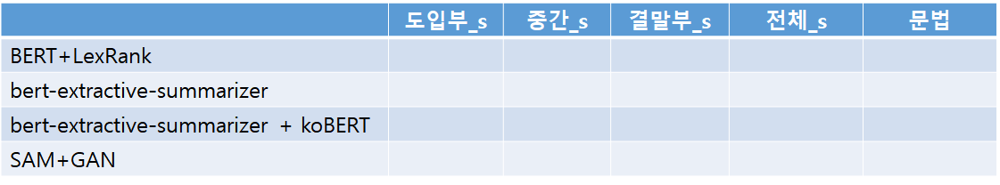

## 비교 대상 요약 알고리즘 준비

In [ ]:
def similarity(query_text, org_text):
    sentences = nltk.sent_tokenize(org_text)
    #print("Num sentences:", len(sentences))
    querys = nltk.sent_tokenize(query_text)
    #print("Num querys:", len(querys))

    #Compute the sentence embeddings
    org_embeddings = s_discriminator._embedder.encode(sentences,show_progress_bar=False)
    query_embeddings = s_discriminator._embedder.encode(querys,show_progress_bar=False)

    #Compute the pair-wise cosine similarities
    cos_scores = scipy.spatial.distance.cdist(query_embeddings, org_embeddings, "cosine")
    similarity_score = 1.0 - np.mean(np.min(cos_scores,axis=0))

    return similarity_score

def grammarity(text):
    
    input_ids = []
    attention_masks = []

    sentences = np.asarray(nltk.sent_tokenize(text))
    # For every sentence...
    for sent in sentences:
        # `encode_plus` will:
        #   (1) Tokenize the sentence.
        #   (2) Prepend the `[CLS]` token to the start.
        #   (3) Append the `[SEP]` token to the end.
        #   (4) Map tokens to their IDs.
        #   (5) Pad or truncate the sentence to `max_length`
        #   (6) Create attention masks for [PAD] tokens.
        encoded_dict = g_discriminator.tokenizer.encode_plus(
                            sent,                      # Sentence to encode.
                            add_special_tokens = True, # Add '[CLS]' and '[SEP]'
                            max_length = 64,           # Pad & truncate all sentences.
                            pad_to_max_length = True,
                            return_attention_mask = True,   # Construct attn. masks.
                            return_tensors = 'pt',     # Return pytorch tensors.
                            truncation = True,
                       )
        # Add the encoded sentence to the list.    
        input_ids.append(encoded_dict['input_ids'])

        # And its attention mask (simply differentiates padding from non-padding).
        attention_masks.append(encoded_dict['attention_mask'])

    # Convert the lists into tensors.
    input_ids = torch.cat(input_ids, dim=0).to(device)
    attention_masks = torch.cat(attention_masks, dim=0).to(device)
    g_discriminator.discriminator.to(device)
    #if str(discriminator1.device) == 'cpu':
    #    pass
    #else:
    #    input_ids = input_ids.to(device)
    #    attention_masks = attention_masks.to(device)        

    with torch.no_grad():        
        outputs = g_discriminator.discriminator(input_ids, 
                               token_type_ids=None, 
                               attention_mask=attention_masks)
    #return torch.sigmoid(outputs[0][:,1])
    return torch.mean(outputs[0][:,1]).detach().cpu().numpy()
    #return outputs

In [ ]:
import pandas as pd
import numpy as np

def evaluate(method_name, text, org_text_1,org_text_2,org_text_3):
    result = {}
    result['method'] = [method_name]
    org_text = org_text_1 + ' ' + org_text_2 + ' ' + org_text_3
    result['comp ratio'] = [len(text)/len(org_text)]
    result['intro'] = [similarity(text,org_text_1)]
    result['body'] = [similarity(text,org_text_2)]
    result['ending'] = [similarity(text,org_text_3)]
    result['var'] = [np.var([result['intro'][0],result['body'][0],result['ending'][0]])]
    result['total'] = [similarity(text,org_text)]
    result['grammar'] = [np.tanh(float(grammarity(text)))]
    return pd.DataFrame(result),result

In [ ]:
"""
LexRank implementation
Source: https://github.com/crabcamp/lexrank/tree/dev
"""

import numpy as np
from scipy.sparse.csgraph import connected_components

def degree_centrality_scores(
    similarity_matrix,
    threshold=None,
    increase_power=True,
):
    if not (
        threshold is None
        or isinstance(threshold, float)
        and 0 <= threshold < 1
    ):
        raise ValueError(
            '\'threshold\' should be a floating-point number '
            'from the interval [0, 1) or None',
        )

    if threshold is None:
        markov_matrix = create_markov_matrix(similarity_matrix)

    else:
        markov_matrix = create_markov_matrix_discrete(
            similarity_matrix,
            threshold,
        )

    scores = stationary_distribution(
        markov_matrix,
        increase_power=increase_power,
        normalized=False,
    )

    return scores


def _power_method(transition_matrix, increase_power=True):
    eigenvector = np.ones(len(transition_matrix))

    if len(eigenvector) == 1:
        return eigenvector

    transition = transition_matrix.transpose()

    while True:
        eigenvector_next = np.dot(transition, eigenvector)

        if np.allclose(eigenvector_next, eigenvector):
            return eigenvector_next

        eigenvector = eigenvector_next

        if increase_power:
            transition = np.dot(transition, transition)


def connected_nodes(matrix):
    _, labels = connected_components(matrix)

    groups = []

    for tag in np.unique(labels):
        group = np.where(labels == tag)[0]
        groups.append(group)

    return groups


def create_markov_matrix(weights_matrix):
    n_1, n_2 = weights_matrix.shape
    if n_1 != n_2:
        raise ValueError('\'weights_matrix\' should be square')

    row_sum = weights_matrix.sum(axis=1, keepdims=True)

    return weights_matrix / row_sum


def create_markov_matrix_discrete(weights_matrix, threshold):
    discrete_weights_matrix = np.zeros(weights_matrix.shape)
    ixs = np.where(weights_matrix >= threshold)
    discrete_weights_matrix[ixs] = 1

    return create_markov_matrix(discrete_weights_matrix)


def graph_nodes_clusters(transition_matrix, increase_power=True):
    clusters = connected_nodes(transition_matrix)
    clusters.sort(key=len, reverse=True)

    centroid_scores = []

    for group in clusters:
        t_matrix = transition_matrix[np.ix_(group, group)]
        eigenvector = _power_method(t_matrix, increase_power=increase_power)
        centroid_scores.append(eigenvector / len(group))

    return clusters, centroid_scores


def stationary_distribution(
    transition_matrix,
    increase_power=True,
    normalized=True,
):
    n_1, n_2 = transition_matrix.shape
    if n_1 != n_2:
        raise ValueError('\'transition_matrix\' should be square')

    distribution = np.zeros(n_1)

    grouped_indices = connected_nodes(transition_matrix)

    for group in grouped_indices:
        t_matrix = transition_matrix[np.ix_(group, group)]
        eigenvector = _power_method(t_matrix, increase_power=increase_power)
        distribution[group] = eigenvector

    if normalized:
        distribution /= n_1

    return distribution


* Hands-on Guide To Extractive Text Summarization With BERTSum<br>
https://analyticsindiamag.com/hands-on-guide-to-extractive-text-summarization-with-bertsum/ <br>
https://pypi.org/project/bert-extractive-summarizer/

In [ ]:
!pip install bert-extractive-summarizer

In [ ]:
from transformers import *

SQUAD_MODEL = "monologg/kobert"

# Load model, model config and tokenizer via Transformers
custom_config = AutoConfig.from_pretrained(SQUAD_MODEL)
custom_config.output_hidden_states=True
custom_tokenizer = AutoTokenizer.from_pretrained(SQUAD_MODEL)
custom_model = AutoModel.from_pretrained(SQUAD_MODEL, config=custom_config)

In [ ]:
def sam_wgan(org_text):
    source = Source(org_text[0] + org_text[1] + org_text[2])
    source.analysis_frame_terms(s_discriminator,comp_rate=0.08,except_key=True)
    summarizer = SAM_Summarizer(g_discriminator,s_discriminator)
    summarizer.ready(source)
    summarizer.summarize(epochs=500,batch_size=1,frame_expansion_ratio = 1.0,init_bias=0.8,learning_rate=5e-5)
    summary_text = summarizer.get_summary(3)[0]
    print('-'*50)
    print('summary:')
    print(summary_text)
    print('-'*50)
    df,arr = evaluate('SAM+WGAN',summary_text,org_text[0],org_text[1],org_text[2])
    return df,arr

In [ ]:
def bert_lexrank_sum(org_text,n_top=8):
    input_text = org_text[0] + org_text[1] + org_text[2]
    #Split the document into sentences
    sentences = nltk.sent_tokenize(input_text)
    #print("Num sentences:", len(sentences))

    #Compute the sentence embeddings
    embeddings = s_discriminator._embedder.encode(sentences,show_progress_bar=False)

    #Compute the pair-wise cosine similarities
    cos_scores = scipy.spatial.distance.cdist(embeddings, embeddings, "cosine")
    #util.pytorch_cos_sim(embeddings, embeddings).numpy()
    #print(cos_scores)
    #Compute the centrality for each sentence
    centrality_scores = degree_centrality_scores(cos_scores, threshold=None)

    #We argsort so that the first element is the sentence with the highest score
    most_central_sentence_indices = np.argsort(-centrality_scores)

    #Print the 5 sentences with the highest scores
    summary_text = ""
    for idx in most_central_sentence_indices[0:n_top]:
        summary_text += sentences[idx].strip()

    df,arr = evaluate('BERT+LexRank',summary_text,org_text[0],org_text[1],org_text[2])
    return df,arr


In [ ]:
from summarizer import Summarizer

def besm(org_text):
    model1 = Summarizer()
    result = model1(org_text[0] + org_text[1] + org_text[2], num_sentences=5)
    summary_text = "".join(result)
    df,arr = evaluate('BESM',summary_text,org_text[0],org_text[1],org_text[2])
    return df,arr

In [ ]:
def besm_bert(org_text):
    model2 = Summarizer(custom_model=custom_model, custom_tokenizer=custom_tokenizer)
    result = model2(org_text[0] + org_text[1] + org_text[2], num_sentences=5)
    summary_text = "".join(result)
    df,arr = evaluate('BESM+kobert',summary_text,org_text[0],org_text[1],org_text[2])
    return df,arr

## 신데렐라 Story 실험

In [ ]:
org_text_1 = """
옛날 어느 집에 귀여운 여자 아기가 태어났어요.
아기는 무럭무럭 자라서, 예쁘고 마음씨 고운 소녀가 되었어요.
그러던 어느날, 소녀의 어머니가 병이들어 그만 세상을 떠나고 말았어요.
소녀의 아버지는 홀로 남은 소녀가 걱정되었어요.
그래서 얼마 후 새어머니를 맞이했어요.
새어머니는 소녀보다 나이가 위인 두 딸을 데리고 왔어요.
그러나 새어머니와 언니들은 성질이 고약한 심술쟁이들이었어요.
새어머니는 소녀가 자기 딸들보다 예쁘고 착한 게 못마땅했어요.
그런데 이번에는 아버지마저 돌아가셨어요.
소녀는 하녀처럼 하루 종일 쓸고, 닦고, 집안일을 도맡아 했어요.
해도 해도 끝이 없는 집안일이 힘들어 지칠때면
난롯가에 앉아서 잠시 쉬곤 했지요.
"""

org_text_2 = """
어느 날, 왕궁에서 무도회가 열렸어요.
신데렐라의 집에도 초대장이 왔어요.
새어머니는 언니들을 데리고 무도회장으로 떠났어요.
신데렐라도 무도회에 가고 싶었어요.
혼자 남은 신데렐라는 훌쩍훌쩍 울기 시작했어요.
신데렐라, 너도 무도회에 가고 싶니?
신데렐라가 고개를 들어보니, 마법사 할머니가 빙그레 웃고 있었어요.
내가 너를 무도회에 보내주마 호박 한개와 생쥐 두마리, 도마뱀을 구해 오렴.
마법사 할머니가 주문을 외웠어요.
그리고 지팡이로 호박을 건드리자, 호박이 화려한 황금 마차로 변했어요.
이번에는 생쥐와 도마뱀을 건드렸어요.
그랬더니 생쥐는 흰말로, 도마뱀은 멋진 마부로 변했답니다.
신데렐라의 옷도 구슬 장식이 반짝이는 예쁜 드레스로 바뀌웠어요.
신데렐라, 발을 내밀어 보거라.
할머니는 신데렐라에게 반짝반짝 빛나는 유리 구두를 신겨 주었어요.
신데렐라, 밤 열두시가 되면 모든게 처음대로 돌아간단다. 황금 마차는 호박으로, 흰말은 생쥐로, 마부는 도마뱀으로 변하게 돼. 그러니까 반드시 밤 열두 시가 되기 전에 돌아와야 해. 알겠지?
왕자님도 아름다운 신데렐라에게 마음을 빼았겼어요.
왕자님은 무도회장에 모인 다른 아가씨들은 쳐다보지도 않고,신데렐라하고만 춤을 추었어요.
신데렐라는 왕자님과 춤을 추느라 시간 가는 줄도 몰랐어요.
땡, 땡, 땡...... 벽시계가 열두 시를 알리는 소리에 신데렐라는 화들짝 놀랐어요.
신데렐라가 허둥지둥 왕궁을 빠져나가는데,
유리 구두 한 짝이 벗겨졌어요.
하지만 구두를 주울 틈이 없었어요.
신데렐라를 뛰쫓아오던 왕자님은 층계에서 유리 구두 한 짝을 주웠어요.
왕자님은 유리 구두를 가지고 임금님께 가서 말했어요.
이 유리 구두의 주인과 결혼하겠어요.
"""

org_text_3 = """
그래서 신하들은 유리 구두의 주인을 찾아 온 나라를 돌아다녔어요.
언니들은 발을 오므려도 보고, 구두를 늘려도 보았지만 한눈에 보기에도 유리 구두는 너무 작았어요.
그때, 신데렐라가 조용히 다가와 말했어요.
저도 한번 신어 볼 수 있나요?
신데렐라는 신하게 건넨 유리 구두를 신었어요,
유리 구두는 신데렐라의 발에 꼭 맞았어요.
신하들은 신데렐라를 왕궁으로 데리고 갔어요.
그 뒤 신데렐라는 왕자님과 결혼하여 오래오래 행복하게 살았대요.
"""

------------------------------------------------------------------
옛날 어느 집에 귀여운 여자 아기가 태어났어요. 아기는 무럭무럭 자라서, 예쁘고 마음씨 고운 소녀가 되었어요. 그러던 어느날, 소녀의 어머니가 병이들어 그만 세상을 떠나고 말았어요. 소녀의 아버지는 홀로 남은 소녀가 걱정되었어요. 그래서 얼마 후 새어머니를 맞이했어요. 새어머니는 소녀보다 나이가 위인 두 딸을 데리고 왔어요. 그러나 새어머니와 언니들은 성질이 고약한 심술쟁이들이었어요. 새어머니는 소녀가 자기 딸들보다 예쁘고 착한 게 못마땅했어요. 그런데 이번에는 아버지마저 돌아가셨어요. 소녀는 하녀처럼 하루 종일 쓸고, 닦고, 집안일을 도맡아 했어요. 해도 해도 끝이 없는 집안일이 힘들어 지칠때면 난롯가에 앉아서 잠시 쉬곤 했지요. 어느 날, 왕궁에서 무도회가 열렸어요. 신데렐라의 집에도 초대장이 왔어요. 새어머니는 언니들을 데리고 무도회장으로 떠났어요. 신데렐라도 무도회에 가고 싶었어요. 혼자 남은 신데렐라는 훌쩍훌쩍 울기 시작했어요. 신데렐라, 너도 무도회에 가고 싶니? 신데렐라가 고개를 들어보니, 마법사 할머니가 빙그레 웃고 있었어요. 내가 너를 무도회에 보내주마 호박 한개와 생쥐 두마리, 도마뱀을 구해 오렴. 마법사 할머니가 주문을 외웠어요. 그리고 지팡이로 호박을 건드리자, 호박이 화려한 황금 마차로 변했어요. 이번에는 생쥐와 도마뱀을 건드렸어요. 그랬더니 생쥐는 흰말로, 도마뱀은 멋진 마부로 변했답니다. 신데렐라의 옷도 구슬 장식이 반짝이는 예쁜 드레스로 바뀌웠어요. 신데렐라, 발을 내밀어 보거라. 할머니는 신데렐라에게 반짝반짝 빛나는 유리 구두를 신겨 주었어요. 신데렐라, 밤 열두시가 되면 모든게 처음대로 돌아간단다. 황금 마차는 호박으로, 흰말은 생쥐로, 마부는 도마뱀으로 변하게 돼. 그러니까 반드시 밤 열두 시가 되기 전에 돌아와야 해. 알겠지? 왕자님도 아름다운 신데렐라에게 마음을 빼았겼어요. 왕자님은 무도회장에 모인 다른 

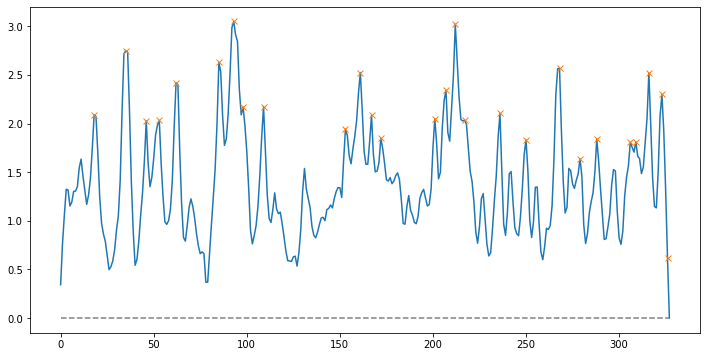

Peak count: 27
Frame tokens: 소녀의 맞이했어요. 언니들은 딸들보다 소녀는 왕궁에서 언니들을 무도회에 무도회에 마부로 드레스로 할머니는 구두를 왕자님도 무도회장에 않고,신데렐라하고만 춤을 왕궁을 왕자님은 결혼하겠어요. 발을 구두는 구두를 구두는 왕궁으로 결혼하여 살았대요. 

Similarity : 0.4804127106017074
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, Generator / grammar loss:-0.21451283991336823   similarity loss:-0.08078118413686752


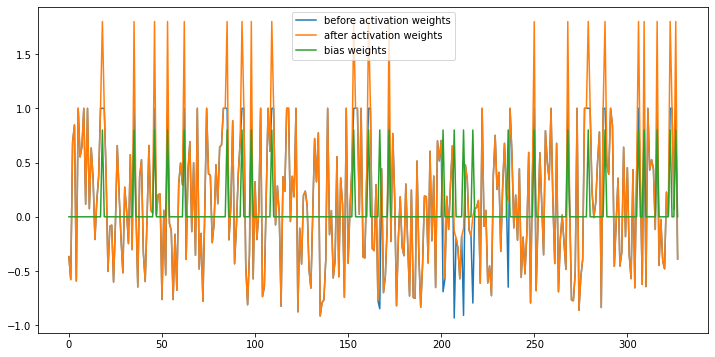

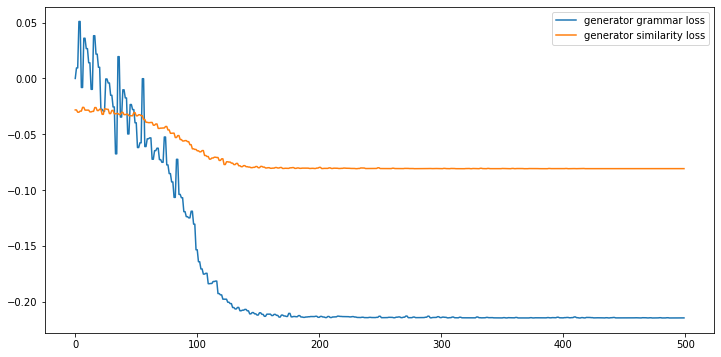

--------------------------------------------------
summary:
여자 아기는 자라서, 어느날, 소녀의 어머니가 맞이했어요. 언니들은 딸들보다 소녀는 도맡아 없는 어느 날, 왕궁에서 언니들을 데리고 무도회에 신데렐라는 신데렐라, 무도회에 가고 빙그레 웃고 무도회에 호박이 생쥐는 마부로 변했답니다. 신데렐라의 구슬 드레스로 바뀌웠어요. 구두를 몰랐어요. 빠져나가는데, 왕자님은 구두를 결혼하겠어요. 주인을 돌아다녔어요. 언니들은 발을 오므려도 유리 구두는 그때, 구두를 구두는 발에 왕궁으로 결혼하여 오래오래 살았대요.
--------------------------------------------------


,method,comp ratio,intro,body,ending,var,total,grammar
0,SAM+WGAN,0.174724,0.496569,0.563307,0.650655,0.003981,0.560640,0.999401
1,BERT+LexRank,0.150552,0.225772,0.244255,0.181226,0.000700,0.230244,0.999879
2,BESM,0.162983,0.411179,0.611856,0.599732,0.008441,0.562023,0.999894
3,BESM+kobert,0.162983,0.411179,0.611856,0.599732,0.008441,0.562023,0.999894


In [ ]:
df1,_ = sam_wgan([org_text_1,org_text_2,org_text_3])
df2,_ = bert_lexrank_sum([org_text_1,org_text_2,org_text_3])
df3,_ = besm([org_text_1,org_text_2,org_text_3])
df4,_ = besm_bert([org_text_1,org_text_2,org_text_3])
result = pd.concat([df1, df2, df3, df4 ], ignore_index=True)
result


Test용 Data 준비

In [ ]:
urls = ['https://raw.githubusercontent.com/dolmani38/Summary/master/data/%EC%95%A0%EA%B1%B0%EC%84%9C%ED%81%AC%EB%A6%AC%EC%8A%A4%ED%8B%B0-ABC%20%EC%82%B4%EC%9D%B8%EC%82%AC%EA%B1%B4.txt',
        'https://raw.githubusercontent.com/dolmani38/Summary/master/data/%EC%95%A0%EA%B1%B0%EC%84%9C%ED%81%AC%EB%A6%AC%EC%8A%A4%ED%8B%B0-%EA%B7%B8%EB%A6%AC%EA%B3%A0%20%EC%95%84%EB%AC%B4%EB%8F%84%20%EC%97%86%EC%97%88%EB%8B%A4.txt',
        'https://raw.githubusercontent.com/dolmani38/Summary/master/data/%EC%95%A0%EA%B1%B0%EC%84%9C%ED%81%AC%EB%A6%AC%EC%8A%A4%ED%8B%B0-%EB%82%98%EC%9D%BC%EA%B0%95%EC%9D%98%20%EC%A3%BD%EC%9D%8C.txt',
        'https://raw.githubusercontent.com/dolmani38/Summary/master/data/%EC%95%A0%EA%B1%B0%EC%84%9C%ED%81%AC%EB%A6%AC%EC%8A%A4%ED%8B%B0-%EB%A7%8C%EC%B0%AC%ED%9A%8C%EC%9D%98%2013%EC%9D%B8.txt',
        'https://raw.githubusercontent.com/dolmani38/Summary/master/data/%EC%95%A0%EA%B1%B0%EC%84%9C%ED%81%AC%EB%A6%AC%EC%8A%A4%ED%8B%B0-%EB%A9%94%EC%86%8C%ED%8F%AC%ED%83%80%EB%AF%B8%EC%95%84%EC%9D%98%20%EC%A3%BD%EC%9D%8C.txt',
        'https://raw.githubusercontent.com/dolmani38/Summary/master/data/%EC%95%A0%EA%B1%B0%EC%84%9C%ED%81%AC%EB%A6%AC%EC%8A%A4%ED%8B%B0-%EB%AA%A9%EC%82%AC%EA%B4%80%EC%82%B4%EC%9D%B8.txt',
        'https://raw.githubusercontent.com/dolmani38/Summary/master/data/%EC%95%A0%EA%B1%B0%EC%84%9C%ED%81%AC%EB%A6%AC%EC%8A%A4%ED%8B%B0-%EB%B2%99%EC%96%B4%EB%A6%AC%20%EB%AA%A9%EA%B2%A9%EC%9E%90.txt',
        'https://raw.githubusercontent.com/dolmani38/Summary/master/data/%EC%95%A0%EA%B1%B0%EC%84%9C%ED%81%AC%EB%A6%AC%EC%8A%A4%ED%8B%B0-%EB%B9%84%EB%B0%80%20%EC%84%9C%EB%A5%98%EB%A5%BC%20%EB%85%B8%EB%A0%A4%EB%9D%BC.txt',
        'https://raw.githubusercontent.com/dolmani38/Summary/master/data/%EC%95%A0%EA%B1%B0%EC%84%9C%ED%81%AC%EB%A6%AC%EC%8A%A4%ED%8B%B0-%EC%8A%A4%ED%8E%98%EC%9D%B8%EA%B6%A4%EC%A7%9D%EC%9D%98%20%EB%B9%84%EB%B0%80.txt',
        'https://raw.githubusercontent.com/dolmani38/Summary/master/data/%EC%95%A0%EA%B1%B0%EC%84%9C%ED%81%AC%EB%A6%AC%EC%8A%A4%ED%8B%B0-%EC%95%84%ED%8C%8C%ED%8A%B8%EC%97%90%20%EB%82%98%ED%83%80%EB%82%9C%20%EC%9A%94%EC%A0%95.txt',
        'https://raw.githubusercontent.com/dolmani38/Summary/master/data/%EC%95%A0%EA%B1%B0%EC%84%9C%ED%81%AC%EB%A6%AC%EC%8A%A4%ED%8B%B0-%EC%95%A0%ED%81%AC%EB%A1%9C%EC%9D%B4%EB%93%9C%20%EC%82%B4%EC%9D%B8%20%EC%82%AC%EA%B1%B4.txt',
        'https://raw.githubusercontent.com/dolmani38/Summary/master/data/%EC%95%A0%EA%B1%B0%EC%84%9C%ED%81%AC%EB%A6%AC%EC%8A%A4%ED%8B%B0-%EC%98%88%EA%B3%A0%20%EC%82%B4%EC%9D%B8.txt',
        'https://raw.githubusercontent.com/dolmani38/Summary/master/data/%EC%95%A0%EA%B1%B0%EC%84%9C%ED%81%AC%EB%A6%AC%EC%8A%A4%ED%8B%B0-%EC%A5%90%EB%8D%AB.txt',
        'https://raw.githubusercontent.com/dolmani38/Summary/master/data/%EC%95%A0%EA%B1%B0%EC%84%9C%ED%81%AC%EB%A6%AC%EC%8A%A4%ED%8B%B0-%EC%BB%A4%ED%8A%BC.txt',
        'https://raw.githubusercontent.com/dolmani38/Summary/master/data/%EC%95%A0%EA%B1%B0%EC%84%9C%ED%81%AC%EB%A6%AC%EC%8A%A4%ED%8B%B0-%ED%81%AC%EB%A6%AC%EC%8A%A4%EB%A7%88%EC%8A%A4%20%ED%91%B8%EB%94%A9%EC%9D%98%20%EB%AA%A8%ED%97%98.txt',
        'https://raw.githubusercontent.com/dolmani38/Summary/master/data/%EC%95%A0%EA%B1%B0%EC%84%9C%ED%81%AC%EB%A6%AC%EC%8A%A4%ED%8B%B0-%ED%91%B8%EB%A5%B8%EC%97%B4%EC%B0%A8%EC%9D%98%EC%A3%BD%EC%9D%8C.txt',
        'https://raw.githubusercontent.com/dolmani38/Summary/master/data/%EC%95%A0%EA%B1%B0%EC%84%9C%ED%81%AC%EB%A6%AC%EC%8A%A4%ED%8B%B0-%ED%99%94%EC%9A%94%EC%9D%BC%20%ED%81%B4%EB%9F%BD%EC%9D%98%20%EC%82%B4%EC%9D%B8.txt']


In [ ]:
ko_sentences_dataset = []
for url in urls:
    raw_text = urllib.request.urlopen(url).read().decode('utf-8')
    ko_sentences_dataset += nltk.sent_tokenize(clean_text(raw_text))


In [ ]:
len(ko_sentences_dataset)

95889

In [ ]:
document = []
offset = 0
while (offset < len(ko_sentences_dataset)):
    intro_cnt = random.choice([5,8,10,13])
    body_cnt = random.choice([10,15,18,20,25])
    conclu_cnt = random.choice([5,8,10,13])
    intro = ' '.join(ko_sentences_dataset[offset:offset+intro_cnt])
    body = ' '.join(ko_sentences_dataset[offset+intro_cnt:offset+intro_cnt+body_cnt])
    conclu = ' '.join(ko_sentences_dataset[offset+intro_cnt+body_cnt:offset+intro_cnt+body_cnt+conclu_cnt])
    offset = offset+intro_cnt+body_cnt+conclu_cnt
    document.append([intro,body,conclu])

print(len(document))

document[0]

2680


['이 이야기에서는 내가 직접 입회한 사건이나 장면만을 이야기하는 전의 내 방법을 바꿔 보았다. 그래서 몇몇 장은 3인칭으로 씌어 있다. 이제부터의 각 장에서 이야기되는 사건들은 모두 내가 확증 할 수 있었던 것임을 밝혀둔다. 여러 인물들의 생각이나 감정을 서술하는 데 있어 얼마쯤 내가 시인의 특권을 행사했다 해도 그것은 아주 정확을 기해서 한 일이다. 또한 그것들은 모두 내 친구 에르큘 포아로의 검토를 받았음을 덧붙여 둔다.',
 '끝으로, 나는 이 이상한 연쇄 범죄의 결과로서 일어나는 부차적인 인간관계에 대해 너무 많은 이야기를 했는지도 모른다. 하지만 인간적, 개인적 요소란 빠뜨려선 안 되는 것이다. 에르큘 포아로가 언젠가 과장된 몸짓으로 나에게 가르쳐 준 일이 있다. 로맨스란 범죄의 부산물일 경우가 있다고. ABC 수수께끼의 해결에 대해 말한다면, 에르큘 포아로는 이제까지 그가 다뤄 온 어느 사건과도 다른 방법으로 문제에 뛰어들어 그 진정한 천재성을 발휘했다고 말해도 좋으리라. < 편지 > 1935년 6월, 나는 남아메리카의 내 농장에서 떠나 여섯 달쯤 머무를 예정으로 귀국했다. 그때는 어려웠던 시대로, 다른 사람들과 마찬가지로 우리 역시 세계적인 불황에 어려움을 겪고 있었다. 영국에서 나 자신이 손대지 않으면 도저히 잘되어 나가지 않을 것 같은 볼일이 여러 가지 있었다. 농장 관리를 위해 아내가 뒤에 남았다. 영국에 와 닿아 내가 맨 먼저 한 일의 하나는 말할 나위도 없이 오랜 친구인 에르큘 포아로를 찾아간 것이었다. 그는 런던의 어떤 최신형 아파트에 살고 있었다. 내가 그것을 지적하며, 그가 이 특별한 건물을 고른 것은 완전히 그 기하학적이 겉모습과 넓이 때문일 거라고 말하자 그는 고개를 끄덕였다. “그러나 아주 기분 좋게 균형이 잡혀 있지. 그렇게 생각되지 않나?” 나는 좀 너무 모난 것같이 생각된다고 말했다. 그리고 오래된 농담이 생각나 이 아파트에서는 암탉에게 네모난 달걀을 낳게 할 수 있을 듯하다고 말했다. 포아로는 크게 웃었다. “아니, 자

In [ ]:
def get_test_statistics():
    df_data = {}
    df_data['method'] = []
    df_data['comp rate'] = []
    df_data['intro'] = []
    df_data['body'] = []
    df_data['conclusion'] = []
    df_data['isthmus'] = []
    df_data['simlirality'] = []
    df_data['grammarity'] = []
    for key in test_result:
        df_data['method'].append(key)
        data = np.asarray(test_result[key])
        df_data['comp rate'].append(np.mean(data[:,0]))
        df_data['intro'].append(np.mean(data[:,1]))
        df_data['body'].append(np.mean(data[:,2]))
        df_data['conclusion'].append(np.mean(data[:,3]))
        df_data['isthmus'].append(np.mean(data[:,4]))
        df_data['simlirality'].append(np.mean(data[:,5]))
        df_data['grammarity'].append(np.mean(data[:,6]))

    df = pd.DataFrame(df_data)
    return df

1 / 100
------------------------------------------------------------------
이 이야기에서는 내가 직접 입회한 사건이나 장면만을 이야기하는 전의 내 방법을 바꿔 보았다. 그래서 몇몇 장은 3인칭으로 씌어 있다. 이제부터의 각 장에서 이야기되는 사건들은 모두 내가 확증 할 수 있었던 것임을 밝혀둔다. 여러 인물들의 생각이나 감정을 서술하는 데 있어 얼마쯤 내가 시인의 특권을 행사했다 해도 그것은 아주 정확을 기해서 한 일이다. 또한 그것들은 모두 내 친구 에르큘 포아로의 검토를 받았음을 덧붙여 둔다. 끝으로, 나는 이 이상한 연쇄 범죄의 결과로서 일어나는 부차적인 인간관계에 대해 너무 많은 이야기를 했는지도 모른다. 하지만 인간적, 개인적 요소란 빠뜨려선 안 되는 것이다. 에르큘 포아로가 언젠가 과장된 몸짓으로 나에게 가르쳐 준 일이 있다. 로맨스란 범죄의 부산물일 경우가 있다고. ABC 수수께끼의 해결에 대해 말한다면, 에르큘 포아로는 이제까지 그가 다뤄 온 어느 사건과도 다른 방법으로 문제에 뛰어들어 그 진정한 천재성을 발휘했다고 말해도 좋으리라. < 편지 > 1935년 6월, 나는 남아메리카의 내 농장에서 떠나 여섯 달쯤 머무를 예정으로 귀국했다. 그때는 어려웠던 시대로, 다른 사람들과 마찬가지로 우리 역시 세계적인 불황에 어려움을 겪고 있었다. 영국에서 나 자신이 손대지 않으면 도저히 잘되어 나가지 않을 것 같은 볼일이 여러 가지 있었다. 농장 관리를 위해 아내가 뒤에 남았다. 영국에 와 닿아 내가 맨 먼저 한 일의 하나는 말할 나위도 없이 오랜 친구인 에르큘 포아로를 찾아간 것이었다. 그는 런던의 어떤 최신형 아파트에 살고 있었다. 내가 그것을 지적하며, 그가 이 특별한 건물을 고른 것은 완전히 그 기하학적이 겉모습과 넓이 때문일 거라고 말하자 그는 고개를 끄덕였다. “그러나 아주 기분 좋게 균형이 잡혀 있지. 그렇게 생각되지 않나?” 나는 좀 너무 모난 것같이 생각된다고 말했다. 그리고 오래된 

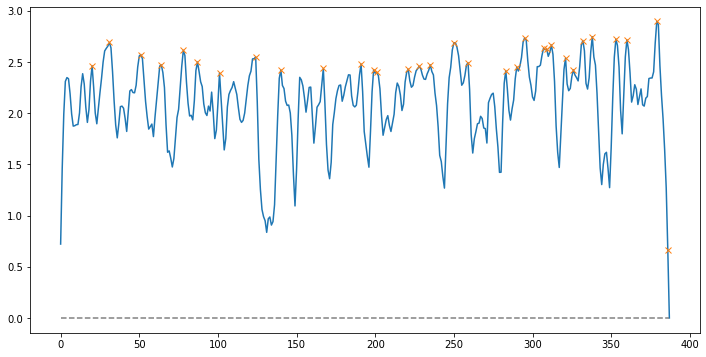

Peak count: 32
Frame tokens: 이제부터의 것임을 일이다. 나는 모른다. 에르큘 있다고. 좋으리라. 그때는 있었다. 것이었다. 내가 지적하며, 기분 않나?” 말했다. 말했다. 있나? ” 그는 만났을 포아로. 나이를 전에 그런 ” “어째서 진짜 ” ” 있군. 못하는구먼! 

Similarity : 0.4761393482784624
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, Generator / grammar loss:-0.19889944791793823   similarity loss:-0.11072205752134323


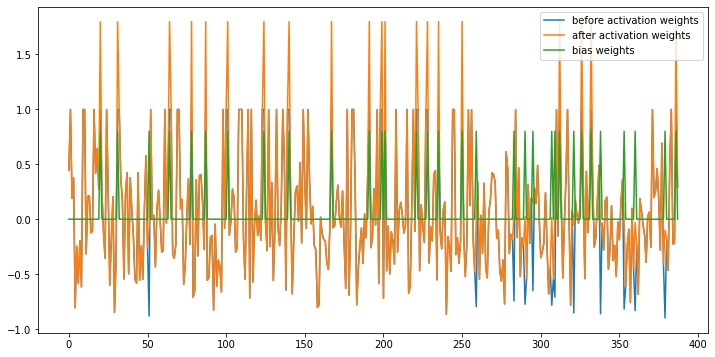

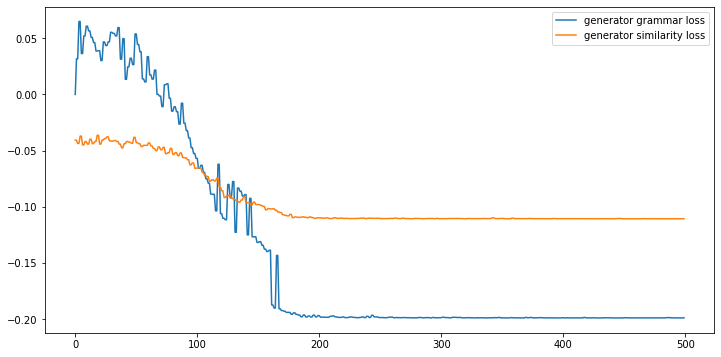

--------------------------------------------------
summary:
이 전의 내 장은 이제부터의 사건들은 것임을 밝혀둔다. 또한 덧붙여 나는 이 결과로서 일어나는 모른다. 에르큘 범죄의 경우가 있다고. 포아로는 이제까지 그가 사건과도 방법으로 말해도 좋으리라. > 내 달쯤 귀국했다. 그때는 불황에 있었다. 있었다. 내가 한 일의 것이었다. 아파트에 있었다. 내가 지적하며, 완전히 말하자 “그러나 기분 좋게 생각되지 않나?” 말했다. 달걀을 낳게 말했다. “아니, 아직도 나는 안 전에 적어졌다고 ” “어째서 자네는 마음은 못하는구먼!
--------------------------------------------------
         method  comp ratio     intro  ...       var     total   grammar
0      SAM+WGAN    0.172823  0.549638  ...  0.000356  0.530550  0.998079
1  BERT+LexRank    0.211741  0.077188  ...  0.004519  0.140658  0.999900
2          BESM    0.204485  0.676792  ...  0.012374  0.470436  0.999899
3   BESM+kobert    0.187995  0.569549  ...  0.002759  0.480377  0.999905

[4 rows x 8 columns]
Current result ==================================================
         method  comp rate     intro  ...   isthmus  simlirality  grammarity
0      SAM+WGAN   0.172823  0.549638  ...  0.000356     0.530550    0.998079
1  BERT+LexRank   0

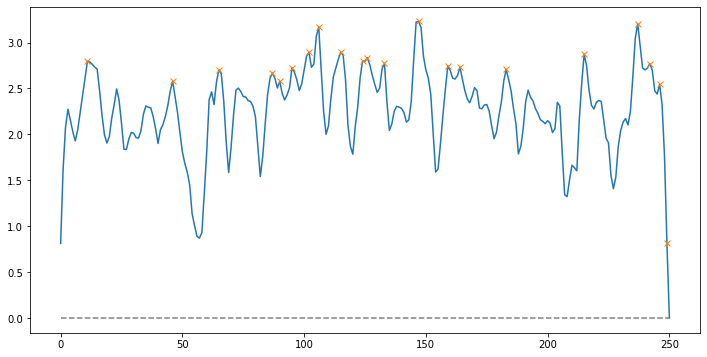

Peak count: 21
Frame tokens: 자기 르비비 나는 놀라움이 말했다. 가짜 가짜 수염은 자랑했다. “아닐세, 않아. 가짜 아직 가짜 ” 그 셈일세. 말일세. 그대로라네. 마지막이라고 안돼. 

Similarity : 0.5371195518335706
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, Generator / grammar loss:-0.21276704967021942   similarity loss:-0.13937188684940338


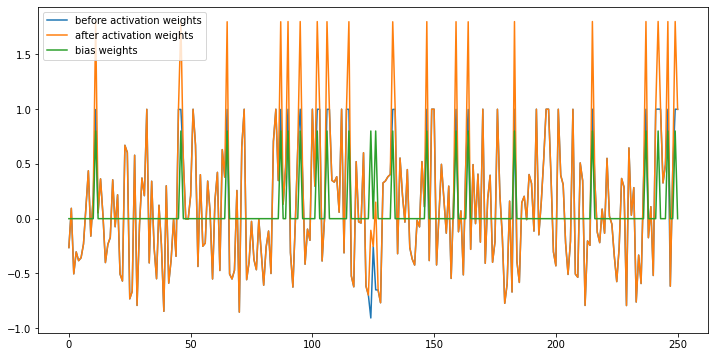

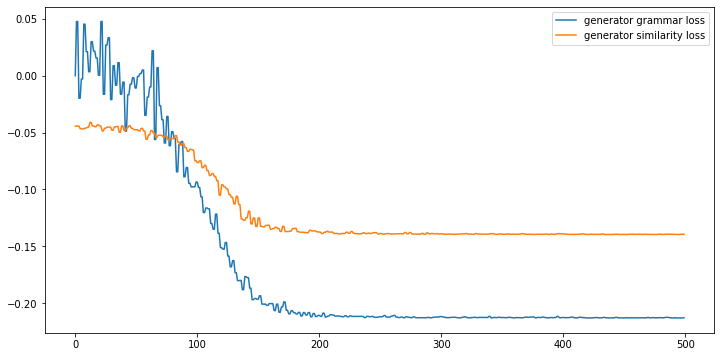

--------------------------------------------------
summary:
자기 나에게 있었다. 르비비 회색, 나는 겨우 “그렇지. 놀라움이 말했다. 가짜 아니면 가짜 수염인가?” 수염은 늘 그는 터무니없이 자랑했다. 가짜 수염이라니? 아직 꽤 많군. 가짜 ” 생각했다. 포아로의 그 “자네가 은퇴한 것은 대대적으로 살인 셈일세. 말일세. “실로 그대로라네. 그때마다 마지막이라고 안돼. 
--------------------------------------------------
         method  comp ratio     intro  ...       var     total   grammar
0      SAM+WGAN    0.177846  0.403249  ...  0.011448  0.578564  0.997541
1  BERT+LexRank    0.299797  0.150094  ...  0.002480  0.237493  0.999901
2          BESM    0.265244  0.561184  ...  0.005747  0.437320  0.999900
3   BESM+kobert    0.265244  0.561184  ...  0.005747  0.437320  0.999900

[4 rows x 8 columns]
Current result ==================================================
         method  comp rate     intro  ...   isthmus  simlirality  grammarity
0      SAM+WGAN   0.175334  0.476443  ...  0.005902     0.554557    0.997810
1  BERT+LexRank   0.255769  0.113641  ...  0.003500     0.189076    0.999900
2          BESM   0.234865  0

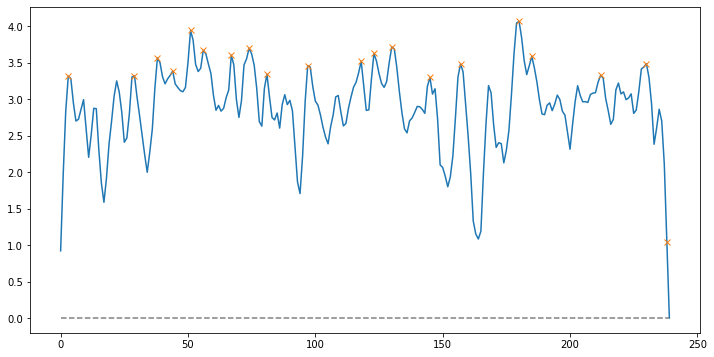

Peak count: 20
Frame tokens: 일어나거든. ” ” 있지. 뻔했었어. 듯했다. 뻔했었지. ” 하지만 ” 생각된다네. 하지만 뭔가 아니면 말투였다. 정말이야. 운명이라 것이지. 진수라고 아직은. 

Similarity : 0.5267095185205739
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, Generator / grammar loss:-0.21638701856136322   similarity loss:-0.1675417721271515


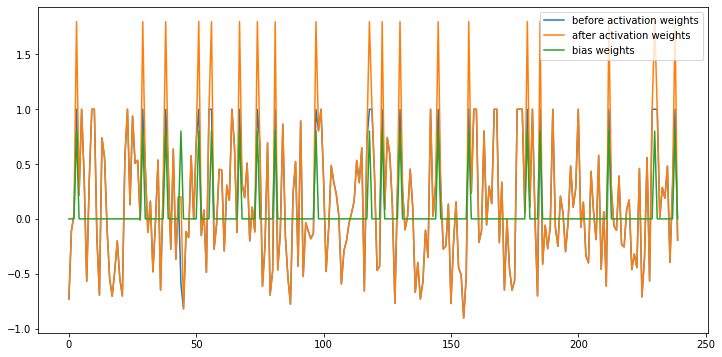

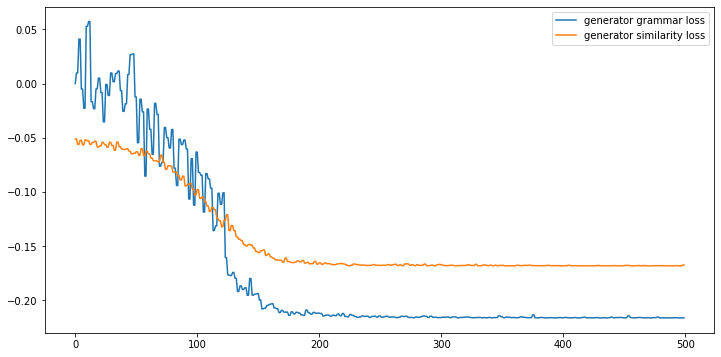

--------------------------------------------------
summary:
일어나거든. 나는 없다네. 나는 “알았네. ” ” 뻔했었어. 놀라운 듯했다. 포아로가 뻔했었지. ” 하지만 ” 어떤 생각된다네. 예전처럼 하지만 뭔가 미묘하고 아니면 말투였다. 남이 들으면 줄로 생각하겠네. 있는 게 아닌데 정말이야. 나는 운명이라 붙어 게 것이지. 그 진수라고 할 아직은.
--------------------------------------------------
         method  comp ratio     intro  ...       var     total   grammar
0      SAM+WGAN    0.166154  0.583634  ...  0.002790  0.577050  0.996914
1  BERT+LexRank    0.211282  0.229108  ...  0.000502  0.238637  0.999886
2          BESM    0.236923  0.471931  ...  0.001400  0.524845  0.999516
3   BESM+kobert    0.236923  0.471931  ...  0.001400  0.524845  0.999516

[4 rows x 8 columns]
Current result ==================================================
         method  comp rate     intro  ...   isthmus  simlirality  grammarity
0      SAM+WGAN   0.172274  0.512174  ...  0.004864     0.562055    0.997512
1  BERT+LexRank   0.240940  0.152130  ...  0.002501     0.205596    0.999896
2          BESM   0.235551  0.569969  ... 

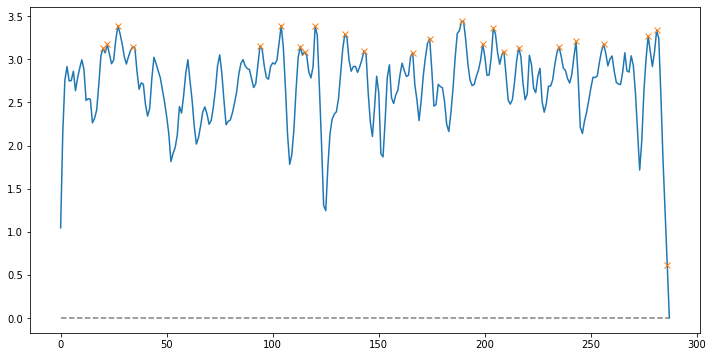

Peak count: 24
Frame tokens: 그는 말했다. ” 나는 말했다. 바았다. 에르큘 너는 아닐까. 자신이라고? 다오. 내가 말했다. 짓이겠지. 여겨지네. 나는 “자네는 포아로. 그러나 걸세. ” 뜻일세. 그 있네. 

Similarity : 0.47309449230015355
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, Generator / grammar loss:-0.197271928191185   similarity loss:-0.12655311822891235


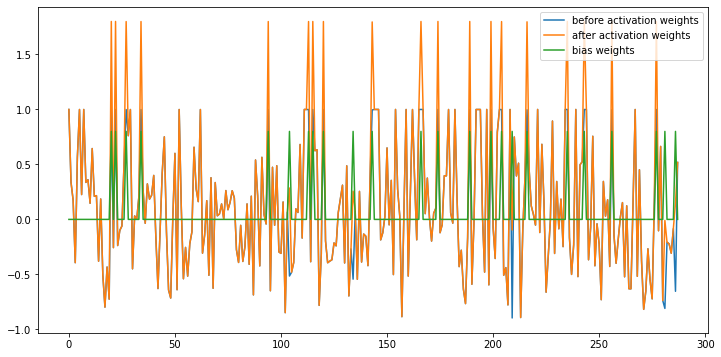

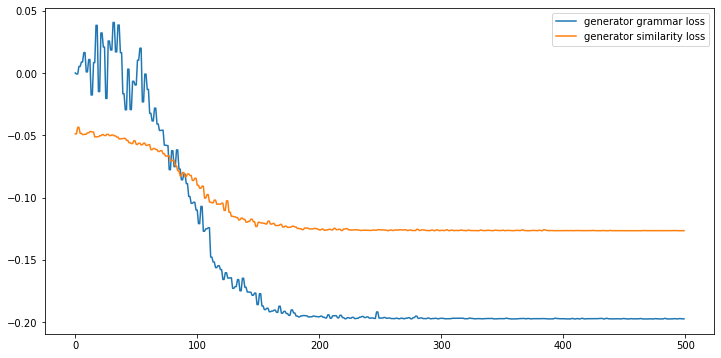

--------------------------------------------------
summary:
 끊었다. 난처한 그는 말했다. ” 말투에 나는 책상 없이 말했다. 씌어 있었다. 에르큘 너는 아닐까. 다오. 하지만 너에게는 이 경계하라. 봉투에 역시 있었다. 내가 소인에 말했다. 어떻게 어깨를 짓이겠지. “자네한테는 미치광이로 여겨지지 “아니, 여겨지네. 진지했다. 나는 보았다. 포아로. 하지. 못했어. 그러나 우스꽝스러운 걸세. 누군가, ” 취한 뜻일세.
--------------------------------------------------
         method  comp ratio     intro  ...       var     total   grammar
0      SAM+WGAN    0.175758  0.613519  ...  0.000077  0.600796  0.992993
1  BERT+LexRank    0.248485  0.137137  ...  0.003992  0.234585  0.999897
2          BESM    0.183550  0.499357  ...  0.000341  0.472895  0.999308
3   BESM+kobert    0.183550  0.499357  ...  0.000341  0.472895  0.999308

[4 rows x 8 columns]
Current result ==================================================
         method  comp rate     intro  ...   isthmus  simlirality  grammarity
0      SAM+WGAN   0.173145  0.537510  ...  0.003667     0.571740    0.996382
1  BERT+LexRank   0.242826  0.148382  ...  0.002873     0.212844    0.999896
2

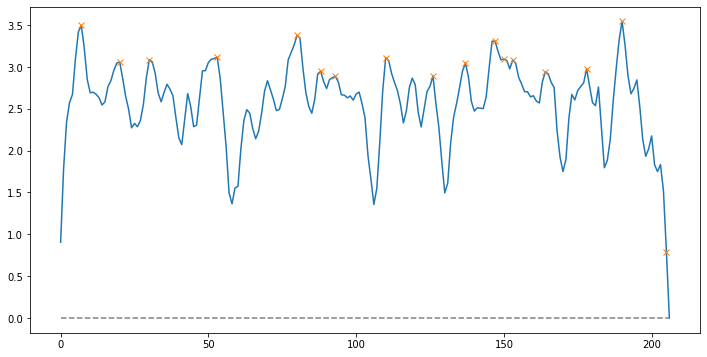

Peak count: 17
Frame tokens: 모르지만. 생각하나?” 나는 말일세. 대답했다. 게 말투가 “자네가 어떻게 주지 ” 육감 없단 그 해보였다. 말일세. 그야말로……. 

Similarity : 0.48985229805470476
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, Generator / grammar loss:-0.16401025652885437   similarity loss:-0.12467815726995468


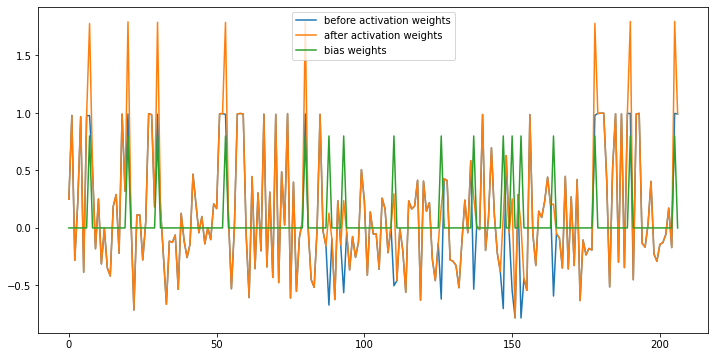

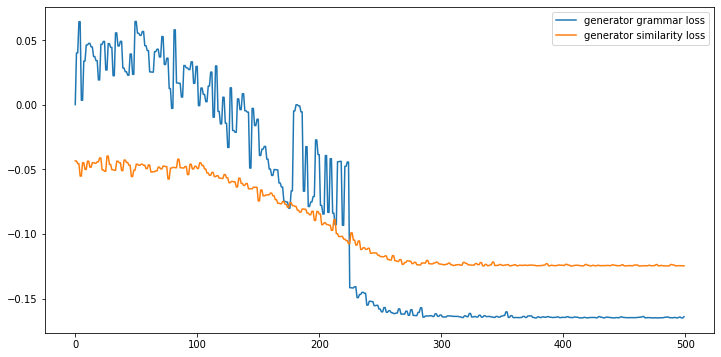

--------------------------------------------------
summary:
자네 이상의 없는지도 모르지만. 무엇이 생각하나?” 말도 하지 나는 녀석의 장난이라고 말일세. 런던 경찰국에서는 거의 바람에 ” 편지를 대답했다. 마음에 없고, 아닐세, 해보였다. 그리고 또 머리를 만들어 하고 모르지만 말일세. 기다려 보는 그야말로……. 
--------------------------------------------------
         method  comp ratio     intro  ...       var     total   grammar
0      SAM+WGAN    0.171053  0.567887  ...  0.001275  0.520370  0.995008
1  BERT+LexRank    0.287081  0.286860  ...  0.000190  0.277839  0.999909
2          BESM    0.104067  0.414099  ...  0.001927  0.380027  0.999898
3   BESM+kobert    0.104067  0.414099  ...  0.001927  0.380027  0.999898

[4 rows x 8 columns]
Current result ==================================================
         method  comp rate     intro  ...   isthmus  simlirality  grammarity
0      SAM+WGAN   0.172727  0.543585  ...  0.003189     0.561466    0.996107
1  BERT+LexRank   0.251677  0.176077  ...  0.002337     0.225843    0.999898
2          BESM   0.198854  0.524673  ...  0.004358     0.457

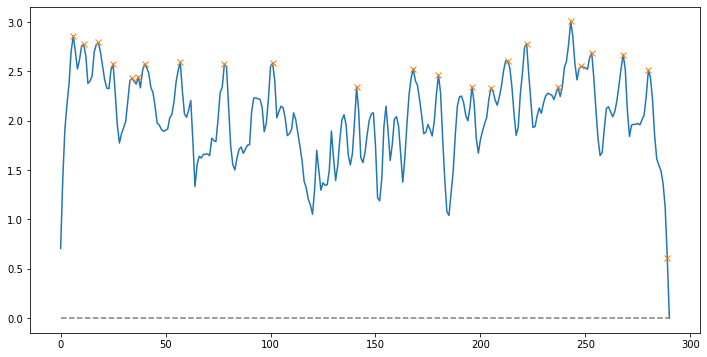

Peak count: 24
Frame tokens: 되겠나. 없었다. 들렸다. 기분전환이라고 잘못 자네는 모르고 걸세. 둘러보았다. 그의 시작했다. 인상을 좋다. 냈다. 때문에 큰소리로 드디어 게다가 벗겨졌는가요? 나도 놀랐다. 것이다. 그래서 동의했다. 

Similarity : 0.47540295009975475
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, Generator / grammar loss:-0.20775292813777924   similarity loss:-0.11765456944704056


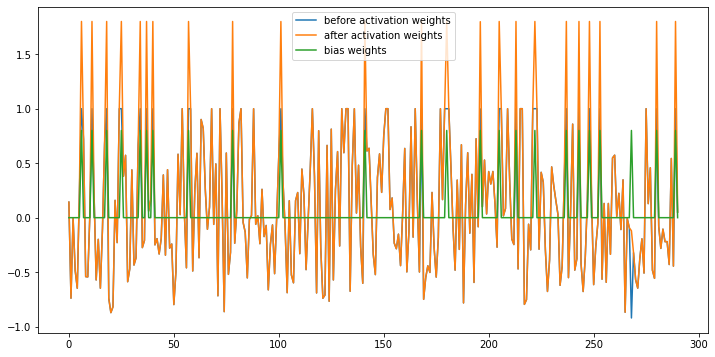

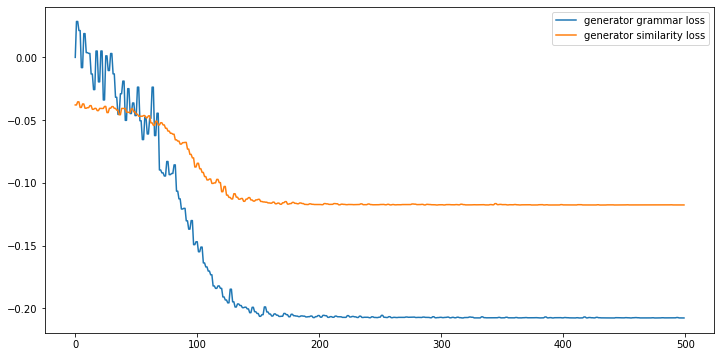

--------------------------------------------------
summary:
되겠나. 없었다. 들렸다. 모르지만 기분전환이라고 잘못 자네는 모르고 놓을 걸세. ” 보너퍼트 일어나 둘러보았다. 때문에 쭉 그의 외투로 철도 집어 들고 이윽고 시작했다. 6월 20일 그의 인상을 사라져 해도 좋다. 실제로 냈다. 때문에 그는 진심으로 큰소리로 “여, 내가 있겠습니까. 드디어 당신의 게다가 벗겨졌는가요? 나도 놀랐다. 머리가 그래서 동의했다.
--------------------------------------------------
         method  comp ratio     intro  ...       var     total   grammar
0      SAM+WGAN    0.177719  0.499191  ...  0.005282  0.506927  0.994724
1  BERT+LexRank    0.265252  0.048142  ...  0.019799  0.144463  0.999905
2          BESM    0.262599  0.375442  ...  0.005966  0.465938  0.999901
3   BESM+kobert    0.240495  0.336334  ...  0.006948  0.458690  0.999904

[4 rows x 8 columns]
Current result ==================================================
         method  comp rate     intro  ...   isthmus  simlirality  grammarity
0      SAM+WGAN   0.173559  0.536186  ...  0.003538     0.552376    0.995877
1  BERT+LexRank   0.253940  0.154755  ...  0.005247     0.212279    0.999900
2  

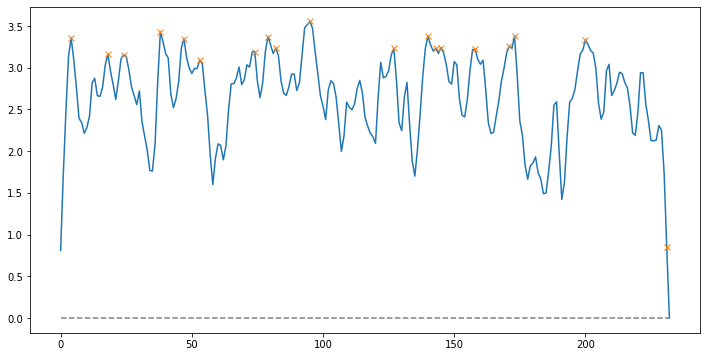

Peak count: 19
Frame tokens: “그러나 늘그막에 말입니다. 정말이지 ” 말했었지요. ” 포아로는 해보였다. 농담입니다. 모양이다. “저번에 ” 소리쳤다. 그래서 그랬더니 장난이었지요. 인정했다. 쓰지요. 

Similarity : 0.5176160005404107
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, Generator / grammar loss:-0.22123286128044128   similarity loss:-0.1317799985408783


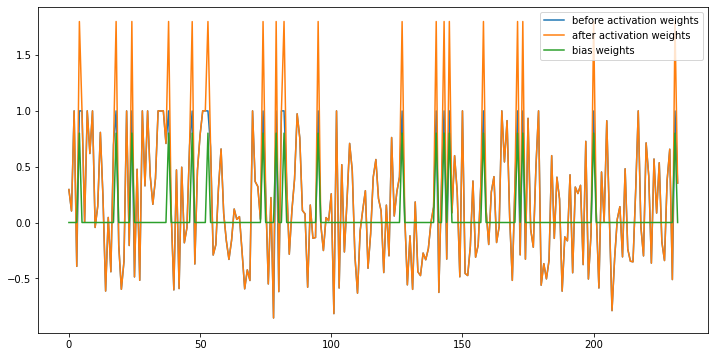

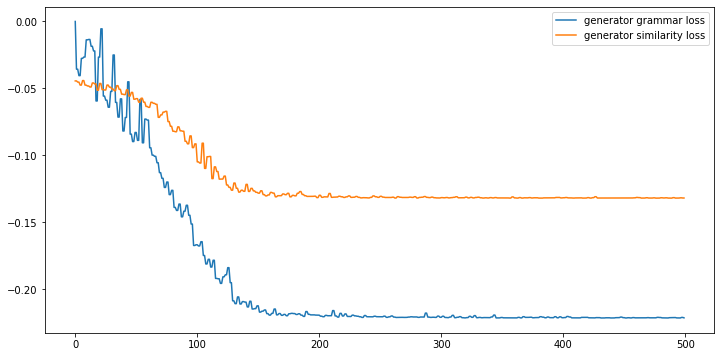

--------------------------------------------------
summary:
경감은 “그러나 이 씨만은 헤어토닉의 늘그막에 각광받게 말입니다. 모조리 계시지요. 사건, 사교계 살인 정말이지 ” “요전에도 헤이스팅즈에게 말했었지요. 생각인데, ” 포아로는 눈짓을 해보였다. 농담입니다. 여겨졌다. 모양이다. “저번에 ” 소리쳤다. 있었어. 그래서 어젯밤 그랬더니 장난이었지요. 던져 인정했다. 것을 쓰지요.
--------------------------------------------------
         method  comp ratio     intro  ...       var     total   grammar
0      SAM+WGAN    0.181909  0.557829  ...  0.001318  0.536900  0.996293
1  BERT+LexRank    0.254473  0.143653  ...  0.001841  0.166288  0.999898
2          BESM    0.255467  0.493051  ...  0.000239  0.516133  0.999717
3   BESM+kobert    0.242545  0.493051  ...  0.001331  0.516825  0.999702

[4 rows x 8 columns]
Current result ==================================================
         method  comp rate     intro  ...   isthmus  simlirality  grammarity
0      SAM+WGAN   0.174751  0.539278  ...  0.003221     0.550165    0.995936
1  BERT+LexRank   0.254016  0.153169  ...  0.004761     0.205709    0.999899
2          BESM   0.2

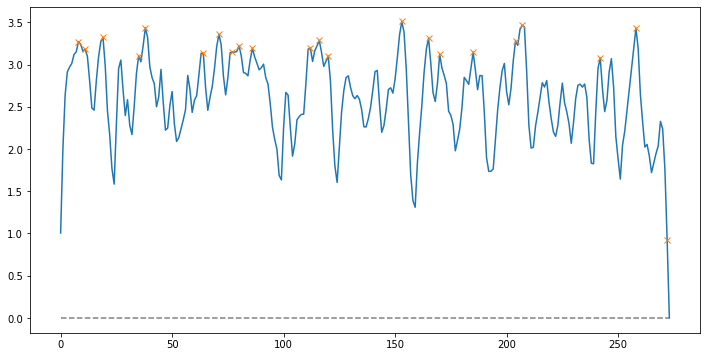

Peak count: 22
Frame tokens: 흥분에서지요. 말했다. 짓이었습니다. ” 속담입니다. ” 말했다. 않았지?” 말했다. ” 그건 알겠지만. “포아로, 그런 말이야. ” 않았지. ” 없단 ‘ 장난이었어. 보네. 

Similarity : 0.5151443311130919
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, Generator / grammar loss:-0.1796301156282425   similarity loss:-0.14495238661766052


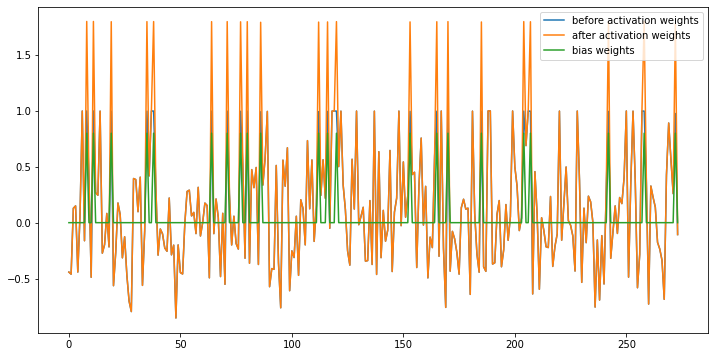

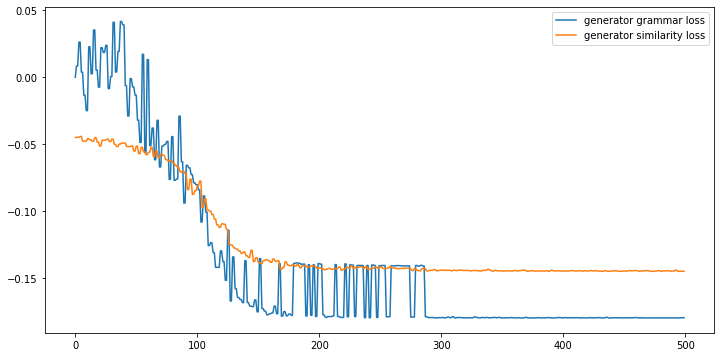

--------------------------------------------------
summary:
뭐, 흥분에서지요. 말했다. 진지하게 짓이었습니다. ” “아니, 속담입니다. ” 말했다. 않았지?” 말했다. ” 하고 그건 알겠지만. 나는 으르렁댔다. “포아로, 치미는 좋네. 건가?” 아니겠지?” 그런 말이야. 질좋은 ” 아니야. 않았지. 센스도 없어. ” ” 센스가 없단 얼마쯤 아주 ‘ 어쩐지 같은 단순한 장난이었어. 의심이 보네.
--------------------------------------------------
         method  comp ratio     intro  ...       var     total   grammar
0      SAM+WGAN    0.168761  0.540424  ...  0.000479  0.569665  0.990025
1  BERT+LexRank    0.207361  0.215872  ...  0.001876  0.248117  0.999906
2          BESM    0.239677  0.331691  ...  0.013388  0.439523  0.999893
3   BESM+kobert    0.239677  0.331691  ...  0.013388  0.439523  0.999893

[4 rows x 8 columns]
Current result ==================================================
         method  comp rate     intro  ...   isthmus  simlirality  grammarity
0      SAM+WGAN   0.174003  0.539421  ...  0.002878     0.552603    0.995197
1  BERT+LexRank   0.248184  0.161007  ...  0.004400     0.211010    0.999900
2          BESM 

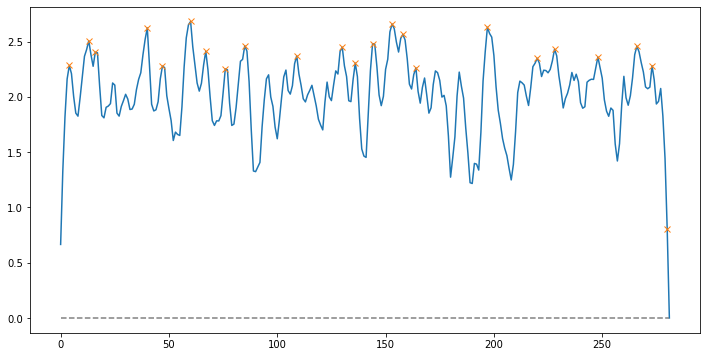

Peak count: 23
Frame tokens: 말했다. 멋진 되겠군. 말했다. 강도? 좋겠군. 것으로. 요리)로군. 좋겠어. 흉기는 하지만 같네. 할까. “그녀는 농담이군. 잘못된 이들이 되겠지. 범죄인가?” ” “아주 범죄. 내밀스러운. 

Similarity : 0.4932667813761009
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, Generator / grammar loss:-0.19164878129959106   similarity loss:-0.0919664204120636


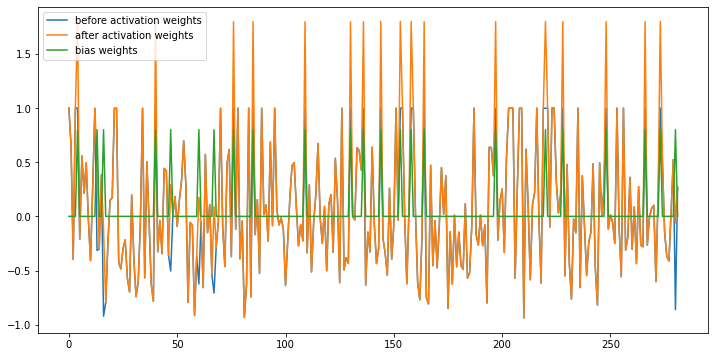

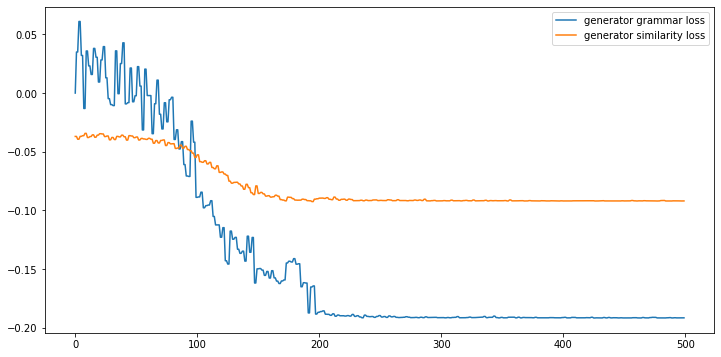

--------------------------------------------------
summary:
 웃으며 말했다. 모아진 했던 말을 고르겠나?” 말했다. 오르되브르(식사 요리)로군. “피해자는 역시 좋겠어. 미국의 인물. 흉기는 쉬었다. 하지만 같네. 할까. 친구는 “그녀는 빨강머리겠지. 농담이군. 물론 잘못된 경쟁 이들이 성실한 사나이인 해고된 관리인 등이 얼치기 이쯤이면 되겠지. ” 자네가 말한 범죄인가?” 보았다. ” 할 눈을 “아주 범죄.
--------------------------------------------------
         method  comp ratio     intro  ...       var     total   grammar
0      SAM+WGAN    0.171752  0.589795  ...  0.001805  0.521616  0.989559
1  BERT+LexRank    0.217088  0.200135  ...  0.000843  0.245266  0.999884
2          BESM    0.220575  0.475468  ...  0.000088  0.481775  0.999433
3   BESM+kobert    0.298169  0.361035  ...  0.001646  0.425678  0.999882

[4 rows x 8 columns]
Current result ==================================================
         method  comp rate     intro  ...   isthmus  simlirality  grammarity
0      SAM+WGAN   0.173753  0.545018  ...  0.002759     0.549160    0.994571
1  BERT+LexRank   0.244729  0.165354  ...  0.004005     0.214816    0.999898
2      

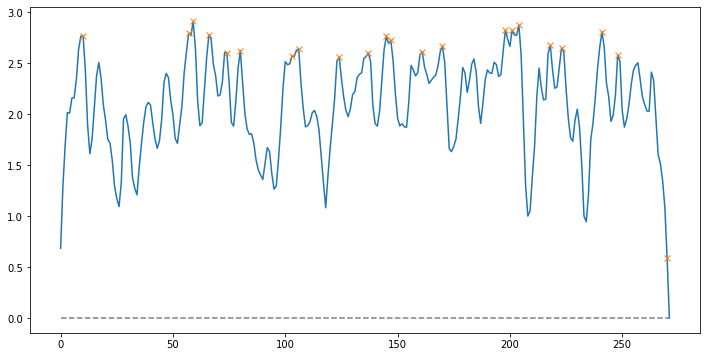

Peak count: 22
Frame tokens: 말했다. 자, 사건이네. 아시겠죠? ” “없지. 멜러 자네는 제1장에서 따분하지. “여보세요, 포아로입니다. “그랬군요……물론, 곧. “앤도버?” 말했다. 살해되었다는군. 앤도버라는 어리둥절해졌다. 신통찮다. 이었다. 같네. 

Similarity : 0.5385241800831204
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, Generator / grammar loss:-0.22556377947330475   similarity loss:-0.12135136872529984


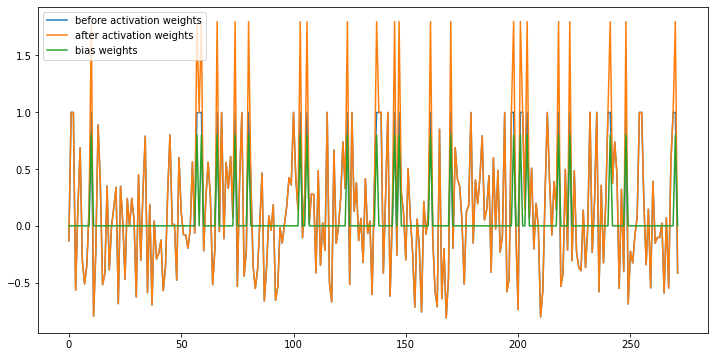

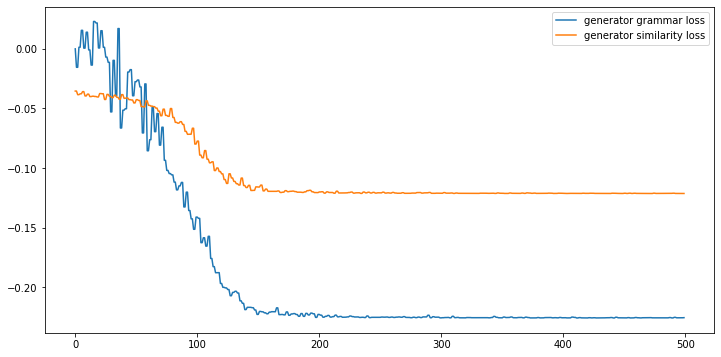

--------------------------------------------------
summary:
” “범죄에 말했다. 자, 이것이 사건이네. 아시겠죠? ) ” 눈길로 “없지. 헤이스팅즈, 멜러 자네는 “그렇네, 제1장에서 일어나 따분하지. ‘ 전화가 일어나 “여보세요, 포아로입니다. “그랬군요……물론, 곧. 돌아왔다. ” 소리쳤다. “앤도버?” 말했다. “노파가 살해되었다는군. ” 앤도버라는 어리둥절해졌다. 조그만 노파가 그리 신통찮다. 이었다. 있다고 생각하는 것 같네.
--------------------------------------------------
         method  comp ratio     intro  ...       var     total   grammar
0      SAM+WGAN    0.184348  0.519673  ...  0.002709  0.593710  0.999157
1  BERT+LexRank    0.274783  0.328372  ...  0.001397  0.283386  0.999913
2          BESM    0.245217  0.472973  ...  0.007006  0.372622  0.999907
3   BESM+kobert    0.266087  0.517256  ...  0.004312  0.497064  0.999898

[4 rows x 8 columns]
Current result ==================================================
         method  comp rate     intro  ...   isthmus  simlirality  grammarity
0      SAM+WGAN   0.174812  0.542484  ...  0.002754     0.553615    0.995029
1  BERT+LexRank   0.247734  0.181656  ...  0.003744     0.221673    0

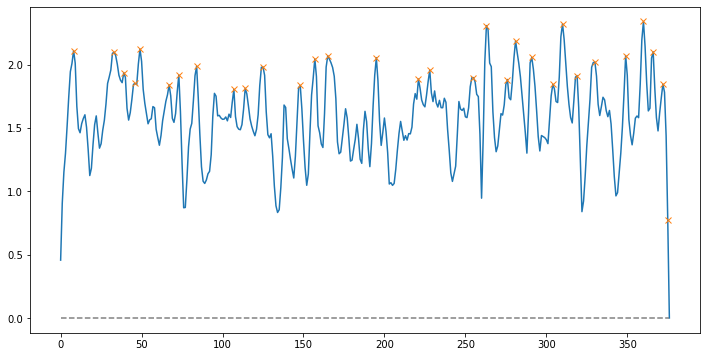

Peak count: 31
Frame tokens: 협박했었다는군. 기운을 틀림없다. 벌써 흘렀다. 되살아났다. 시작이다. 받았다. 범죄는 발견되었다. 들어가자 아마도 듯했다. 행해진 그냥 이제부터입니다. 체포하는 몇 급사일을 그래서 되었지요. 급료를 마누라가 했답니다. 되었습니다. 못했지요. 시작했습니다. 애셔가 했는데, 줘서 했지요. 

Similarity : 0.4596457752448492
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, Generator / grammar loss:-0.20361186563968658   similarity loss:-0.08494116365909576


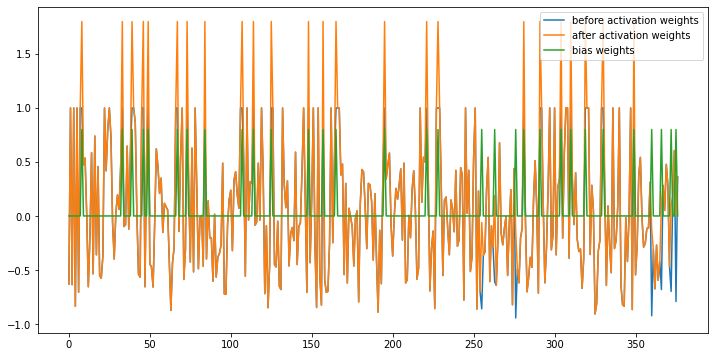

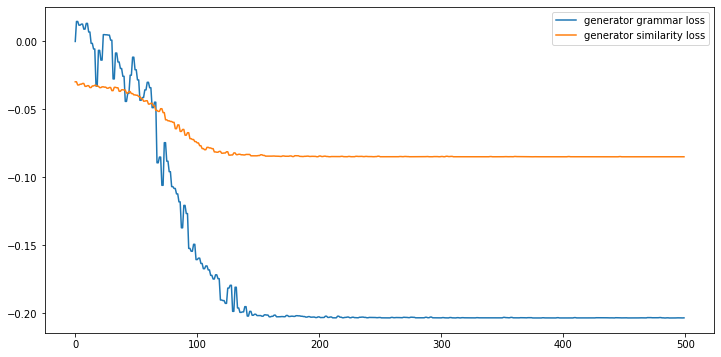

--------------------------------------------------
summary:
남편은 질나쁜 종종 죽이겠다고 협박했었다는군. 나는 함께 기운을 틀림없다. 내가 관계하고부터 벌써 흘렀다. 속에 되살아났다. 이렇게 시작이다. > 받았다. 좋으리라. 범죄는 1시에 발견되었다. 밀어 들어가자 처음에는 회중전등을 강하게 아마도 선반에서 꺼내는 듯했다. 아홉 행해진 것 같았다. 그냥 아직 이제부터입니다. 있었습니다. 체포하는 대로 사람입니다. 살고 되었지요. 급료를 받아 주었던 몽땅 마누라가 가서 소동을 했답니다. 되었습니다. 거기는 앤도버에서 찾아가지 못했지요. 부인은 그래서 조그만 시작했습니다.
--------------------------------------------------
         method  comp ratio     intro  ...       var     total   grammar
0      SAM+WGAN    0.191108  0.540732  ...  0.000808  0.513997  0.994929
1  BERT+LexRank    0.171201  0.201489  ...  0.000286  0.224827  0.999897
2          BESM    0.202389  0.345744  ...  0.003215  0.412661  0.999906
3   BESM+kobert    0.179827  0.338885  ...  0.003488  0.424223  0.999905

[4 rows x 8 columns]
Current result ==================================================
         method  comp rate     intro  ...   isthmus  simlirality  grammarity
0      SAM+WGAN   0.176294  0.542325  ...  0.002577     0.550013    0.

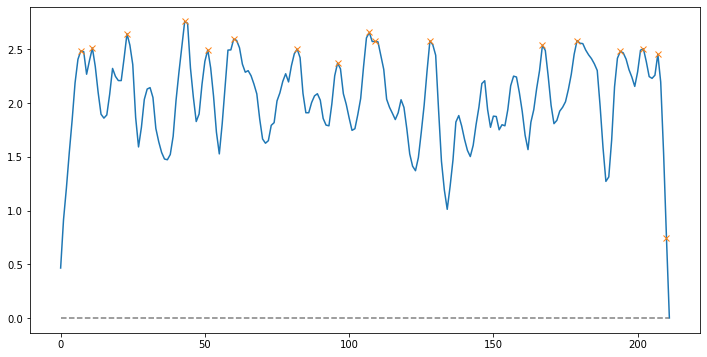

Peak count: 17
Frame tokens: 포아로가 “없습니다. ” 했답니다. ” 부지런한 성급한 씨. ” 꽤 ” 없으니까요. 말했다. 턱이 말입니다. 없습니다. 산송장입니다. 

Similarity : 0.43084062977600823
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, Generator / grammar loss:-0.20061999559402466   similarity loss:-0.09971404820680618


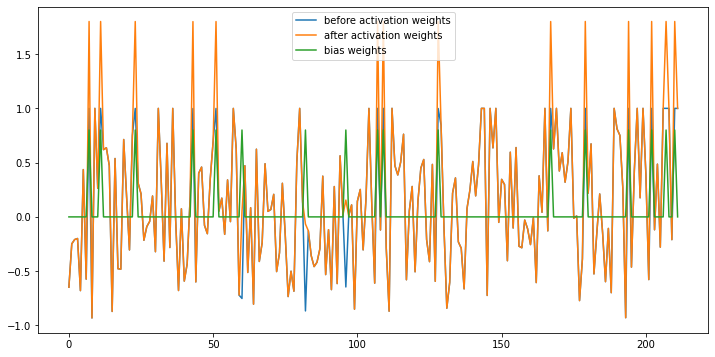

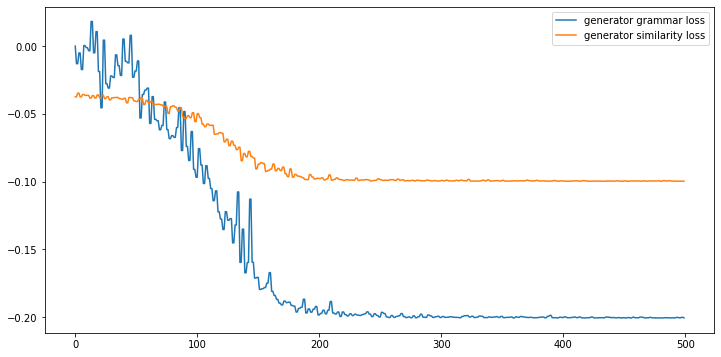

--------------------------------------------------
summary:
포아로가 “아이들은 “없습니다. ” “그렇습니다. 변해서 했답니다. ” 되었지요. 건 좋겠지만, ” 꽤 끊었다. ” 그것이 가장 해석이겠지요. 당신이 알 없으니까요. 포아로가 찌푸리고 말했다. 영국 턱이 각별히 행동하려는 말입니다. 머리가 없습니다. 그는 산송장입니다. 
--------------------------------------------------
         method  comp ratio     intro  ...       var     total   grammar
0      SAM+WGAN    0.170045  0.455772  ...  0.009405  0.480831  0.998393
1  BERT+LexRank    0.302928  0.172410  ...  0.000316  0.184344  0.999901
2          BESM    0.262387  0.474888  ...  0.002503  0.501866  0.999686
3   BESM+kobert    0.299550  0.480275  ...  0.003881  0.498129  0.999693

[4 rows x 8 columns]
Current result ==================================================
         method  comp rate     intro  ...   isthmus  simlirality  grammarity
0      SAM+WGAN   0.175773  0.535112  ...  0.003146     0.544248    0.995301
1  BERT+LexRank   0.245956  0.182538  ...  0.003170     0.218825    0.999900
2          BESM   0.223548  0.466052  ...  0.004516  

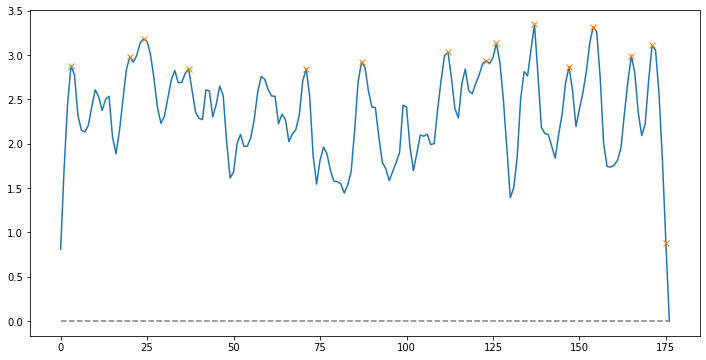

Peak count: 15
Frame tokens: 버렸지요. 물론 “그렇겠지요. ” ” 거기서 ” ” 데려오게. 데려오게. 그는 했다. 거야. 날 너무하잖아. 

Similarity : 0.46558393023446465
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, Generator / grammar loss:-0.2126380205154419   similarity loss:-0.12165864557027817


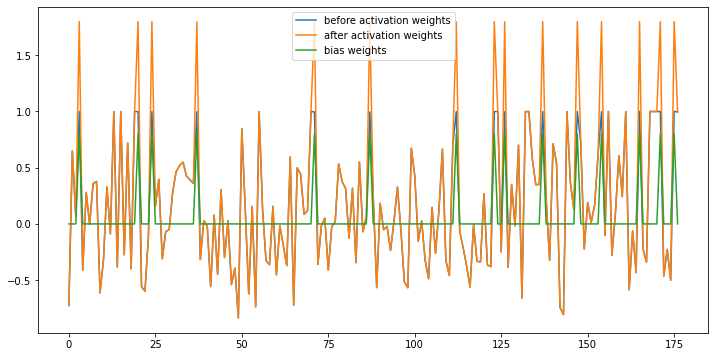

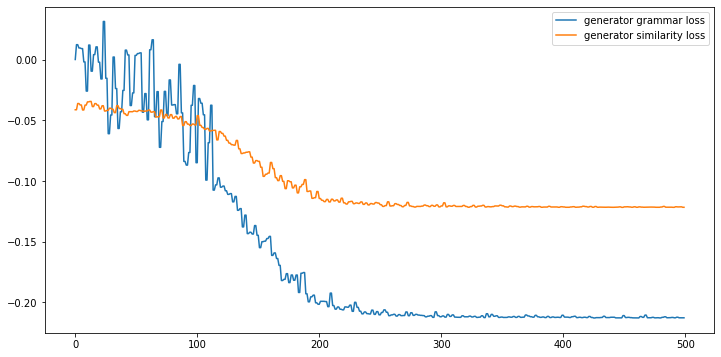

--------------------------------------------------
summary:
버렸지요. 고급품이고. 편지에는 이상하군요. 물론 “그렇겠지요. ” 도움이 좋은데요. ” 거기서 ” ” “좋아. 데려오게. 숨어 있었습니다. 데려오게. 초라한 그는 했다. 짓무른 얼굴을 거야. 짓도 안 했어. 날 너무하잖아. 
--------------------------------------------------
         method  comp ratio     intro  ...       var     total   grammar
0      SAM+WGAN    0.171429  0.634087  ...  0.015731  0.580951  0.992747
1  BERT+LexRank    0.323810  0.097456  ...  0.004050  0.192690  0.999872
2          BESM    0.133333  0.202674  ...  0.005826  0.264174  0.999901
3   BESM+kobert    0.133333  0.202674  ...  0.005826  0.264174  0.999901

[4 rows x 8 columns]
Current result ==================================================
         method  comp rate     intro  ...   isthmus  simlirality  grammarity
0      SAM+WGAN   0.175439  0.542725  ...  0.004114     0.547071    0.995105
1  BERT+LexRank   0.251945  0.175994  ...  0.003238     0.216815    0.999898
2          BESM   0.216609  0.445792  ...  0.004617     0.441555    0.999759
3

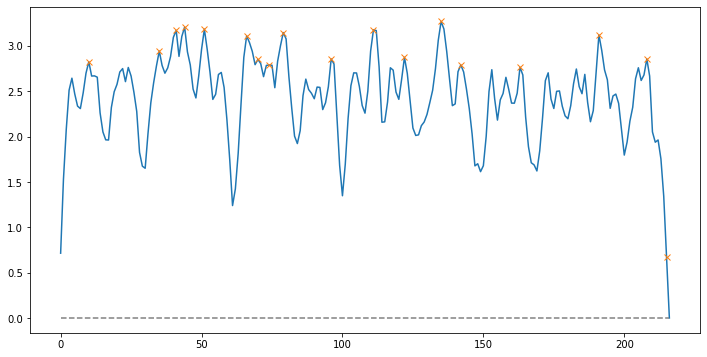

Peak count: 18
Frame tokens: “아니, ” “그만해 정신차려요. 지금으로서는. ” 가로막았다. 같았다. 않았어! 않았어. 그건 ” 있고말고. 친구들하고 있었지. “데려가. 없군요. 분명한데요. 

Similarity : 0.5083555969164265
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, Generator / grammar loss:-0.2177284210920334   similarity loss:-0.12211886793375015


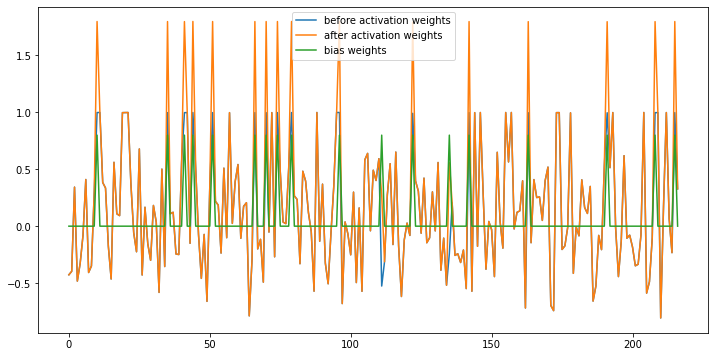

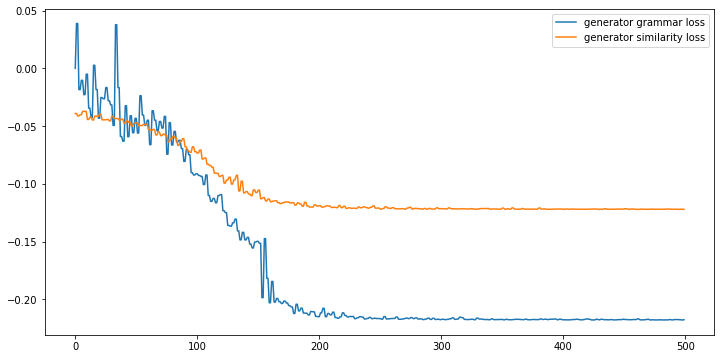

--------------------------------------------------
summary:
“아니, 아니, 짓을 하고 있소. ” “그만해 두오, 정신차려요. 지금으로서는. 좋소. ” 가로막았다. 목소리는 같았다. 않았어! 내게 죽이지 않았어. ” 친구들하고 멋있는 <세븐 기침이 말이 있었지. 나는 앨리스에게 맹세코 “데려가. 구금시켜. 말했다. 없군요. 그 저 분명한데요.
--------------------------------------------------
         method  comp ratio     intro  ...       var     total   grammar
0      SAM+WGAN    0.179545  0.549995  ...  0.000295  0.541314  0.997274
1  BERT+LexRank    0.265909  0.143260  ...  0.000333  0.171624  0.999906
2          BESM    0.157955  0.585913  ...  0.006462  0.450614  0.998563
3   BESM+kobert    0.157955  0.585913  ...  0.006462  0.450614  0.998563

[4 rows x 8 columns]
Current result ==================================================
         method  comp rate     intro  ...   isthmus  simlirality  grammarity
0      SAM+WGAN   0.175732  0.543245  ...  0.003841     0.546660    0.995260
1  BERT+LexRank   0.252942  0.173656  ...  0.003030     0.213587    0.999898
2          BESM   0.212419  0.455801  ...  0.0

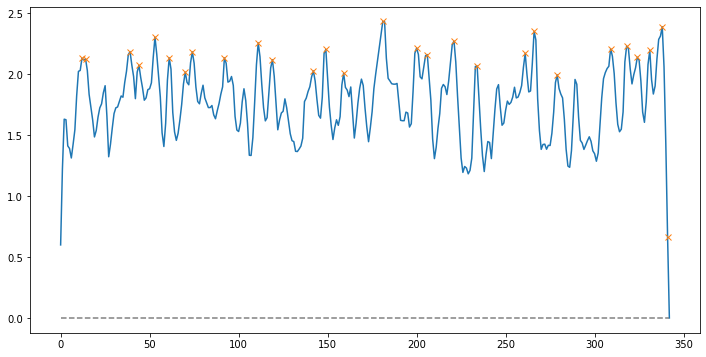

Peak count: 28
Frame tokens: 손쉽게 녀석들이지요. “ “가게에서 “그야 모릅니다. ” 좋을까. 있었습니다. 것처럼. ” ” “철도 “정말, 생각된다. 범죄여서 나는 당연히 그런데 시시한 시작했다. 경찰서를 시작했다. 경관이 조금도 오히려 사람이었는데. 말했다. 

Similarity : 0.4809416742864424
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, Generator / grammar loss:-0.21106985211372375   similarity loss:-0.08834373205900192


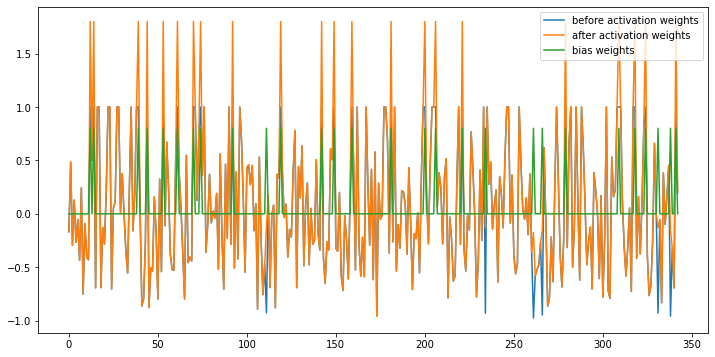

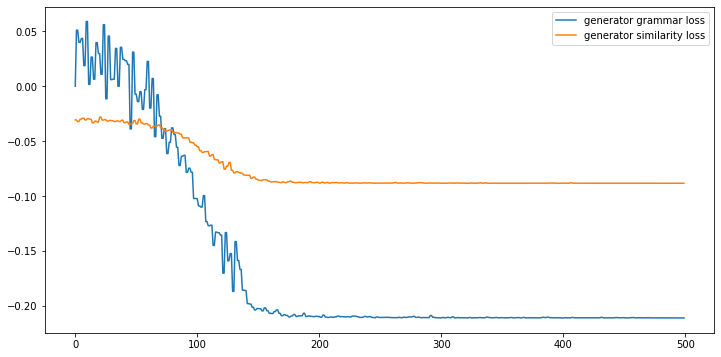

--------------------------------------------------
summary:
손쉽게 녀석들이지요. 저 늙은이가 그들과 함께 6시 사이에 있는지 봐야겠지요. “ “가게에서 “그야 모릅니다. ” “게다가 좋을까. 온 “철도 있었습니다. “그렇습니다. ” ” “철도 “정말, ABC였습니다. > 때 비로서 생각된다. 나는 흔해빠진 범죄여서 못했던 것이다. 나는 생각하고 당연히 여겼다. 지금 등장하자 내 이것은 사라진 경찰서를 먼저 시체를 안치소로 보고 들기 시작했다. 너무나 느낌이었다. 경관이 조금도 말했다.
--------------------------------------------------
         method  comp ratio     intro  ...       var     total   grammar
0      SAM+WGAN    0.168776  0.563585  ...  0.000623  0.522296  0.998249
1  BERT+LexRank    0.208861  0.263973  ...  0.001369  0.206047  0.999909
2          BESM    0.229255  0.512429  ...  0.002323  0.434908  0.999905
3   BESM+kobert    0.292546  0.419614  ...  0.004331  0.451038  0.999906

[4 rows x 8 columns]
Current result ==================================================
         method  comp rate     intro  ...   isthmus  simlirality  grammarity
0      SAM+WGAN   0.175268  0.544601  ...  0.003627     0.545036    0.995459
1  BERT+LexRank   0.250003  0.179677  ...

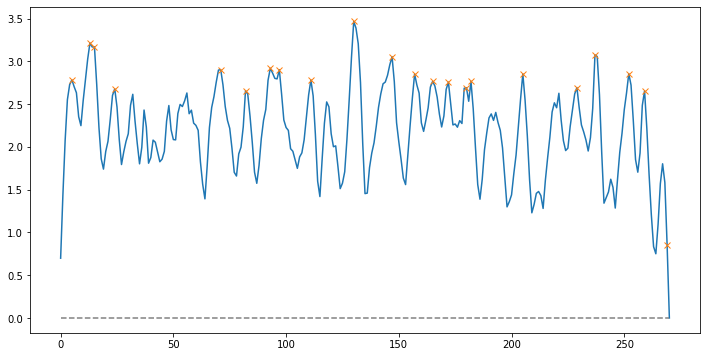

Peak count: 22
Frame tokens: ” “그럴까. “그렇네. 보게. ” 보았다. 네, 있습니다. 있습니다. “여자도? 가능합니다. ” “그렇습니다. 그러나 시체는 있었겠지요. 한다. “이로써 확실하네. 걸세. 틀림없이 거야. 

Similarity : 0.5044585305287523
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, Generator / grammar loss:-0.21709606051445007   similarity loss:-0.10961617529392242


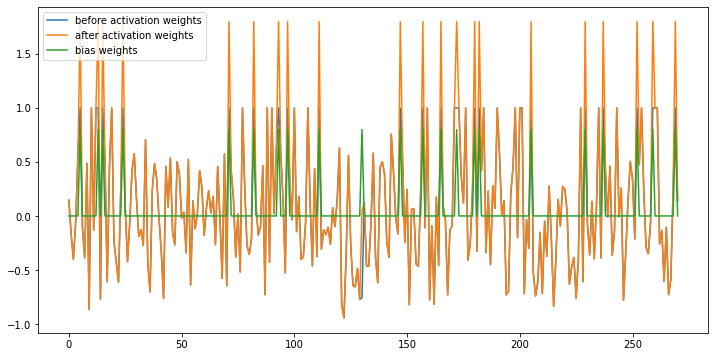

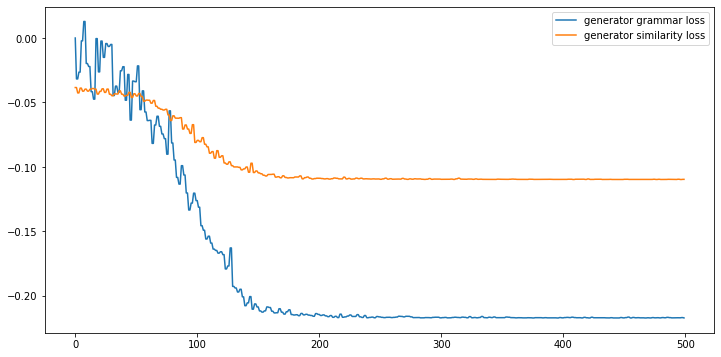

--------------------------------------------------
summary:
” 마음이 중얼거렸다. “그럴까. “그렇네. 뼈 보게. ” 필요합니까?” 보았다. 노인으로서도 수 네, 있습니다. 부분에 사람도 있습니다. 가능합니다. ” 그 “그렇습니다. 일입니다. 그러나 모든 두지 시체는 있었겠지요. 모습이었습니까?” 설명했다. 계산대 등을 돌리고―따라서 한다. 포아로가 “이로써 다가선 확실하네. 협박한 걸세. 그녀는 틀림없이 그녀는 손님에게 거야.
--------------------------------------------------
         method  comp ratio     intro  ...       var     total   grammar
0      SAM+WGAN    0.187895  0.570412  ...  0.002453  0.553429  0.994708
1  BERT+LexRank    0.296296  0.048012  ...  0.009606  0.121084  0.999903
2          BESM    0.259259  0.296852  ...  0.003737  0.361040  0.999908
3   BESM+kobert    0.254743  0.320123  ...  0.002090  0.386099  0.999906

[4 rows x 8 columns]
Current result ==================================================
         method  comp rate     intro  ...   isthmus  simlirality  grammarity
0      SAM+WGAN   0.176058  0.546214  ...  0.003553     0.545560    0.995412
1  BERT+LexRank   0.252897  0.171448  ...  0.003338     0.207334    0.999

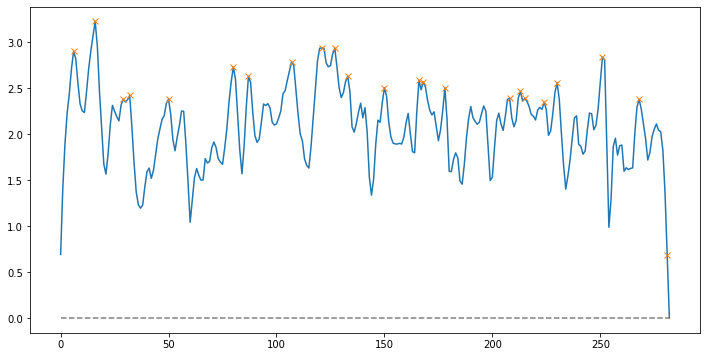

Peak count: 23
Frame tokens: “기분이 여자일세. 거기 조카딸을 있어서. 집이었다. 나왔다. 메리예요. 애셔 외출중이세요. ” “아주머니가 아, 일이에요! 당하시다니……너무해요. 주인에게 ” 부드럽게 좋아했어요. 어머니가 했어요. 그는 짐승이에요. 

Similarity : 0.491661105006583
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, Generator / grammar loss:-0.17407678067684174   similarity loss:-0.10715369135141373


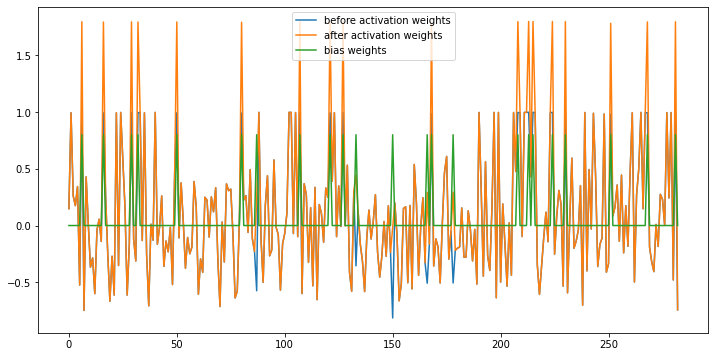

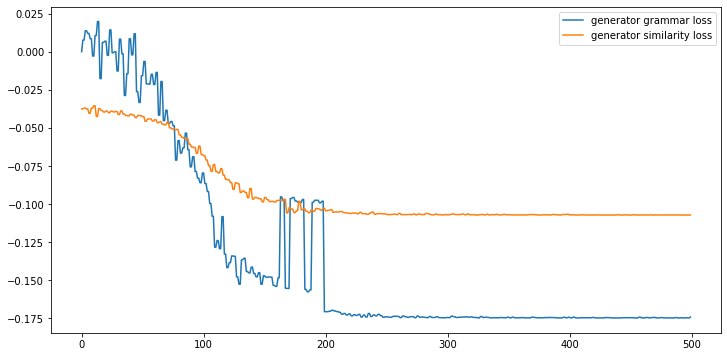

--------------------------------------------------
summary:
” “기분이 여자일세. 흘끗 “여기서 거기 조카딸을 만나 어떻겠나?” 먼저 있어서. 집이었다. 지금까지 메리 드로워 “그렇습니다. 메리예요. 애셔 대한 외출중이세요. 일이에요! 하지만 이젠 가게로 하녀가 주인에게 폐 싶지도 않아요. ” 부드럽게 물었다. “정말 좋아했어요. 어머니가 갔어요. 하러 꼭 했어요. 남자를 악마>라고 하셨지요. 그는 돈만 가는 짐승이에요.
--------------------------------------------------
         method  comp ratio     intro  ...       var     total   grammar
0      SAM+WGAN    0.175107  0.544302  ...  0.000123  0.528025  0.994591
1  BERT+LexRank    0.181974  0.139591  ...  0.007940  0.222400  0.999906
2          BESM    0.126180  0.342731  ...  0.005894  0.402016  0.999898
3   BESM+kobert    0.126180  0.342731  ...  0.005894  0.402016  0.999898

[4 rows x 8 columns]
Current result ==================================================
         method  comp rate     intro  ...   isthmus  simlirality  grammarity
0      SAM+WGAN   0.176002  0.546101  ...  0.003352     0.544529    0.995364
1  BERT+LexRank   0.248725  0.169574  ...  0.003608     0.208220    0.999900


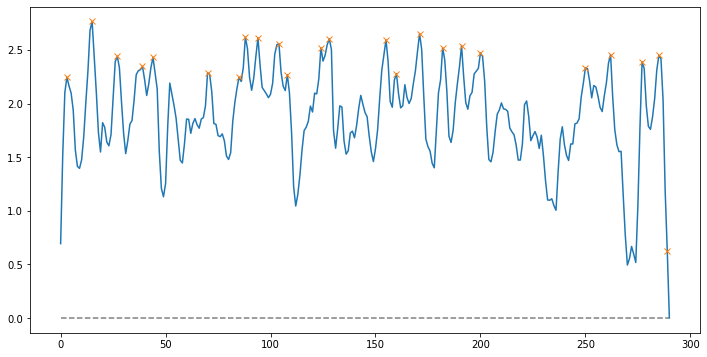

Peak count: 24
Frame tokens: 말투는 아가씨는 ” 했어요. 저주스럽게 그런데 않았겠군요?” 놀랐어요. 않았으니까요. 무서워하고 않아요. 무서워하고 “그런데도 않았다고요?” “그렇습니다. 없습니까?” 없어요. 무서워한 무서워하지 그녀는 없어요. 몰라요. 없어요. 했었습니까? 

Similarity : 0.4801020376325894
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, Generator / grammar loss:-0.20197544991970062   similarity loss:-0.11363006383180618


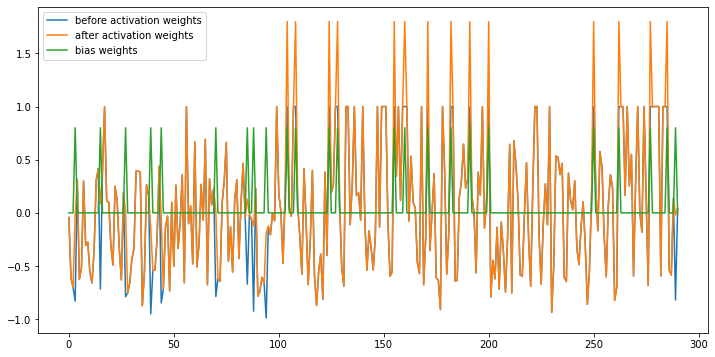

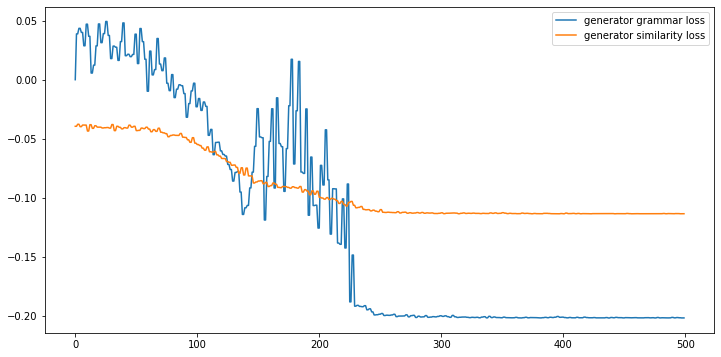

--------------------------------------------------
summary:
그러나 아주 그 무서워하고 같지 않아요. 무서워하고 ” “그런데도 있었습니까?” “남편인걸요. 아까도 포아로는 결국 남자는 아주머니를 죽이지 않았다고요?” 눈을 떠보였다. “그렇습니다. 누군가 ……달리 없습니까?” 얼굴을 없어요. 하지만 무서워한 저었다. 무서워하지 ” “익명의 “개인적인 그녀는 없어요. 열 남매였는데 사람은 돌아가시고, 남아메리카로 몰라요. 그리고 또 제 어머니는 때문에 저밖에 없어요.
--------------------------------------------------
         method  comp ratio     intro  ...       var     total   grammar
0      SAM+WGAN    0.179447  0.506657  ...  0.001913  0.577115  0.999138
1  BERT+LexRank    0.135178  0.254590  ...  0.001463  0.199916  0.999892
2          BESM    0.189723  0.440541  ...  0.000604  0.421500  0.999912
3   BESM+kobert    0.239526  0.515618  ...  0.009568  0.459072  0.999907

[4 rows x 8 columns]
Current result ==================================================
         method  comp rate     intro  ...   isthmus  simlirality  grammarity
0      SAM+WGAN   0.176193  0.543910  ...  0.003272     0.546339    0.995573
1  BERT+LexRank   0.242417  0.174297  ...  0.003489   

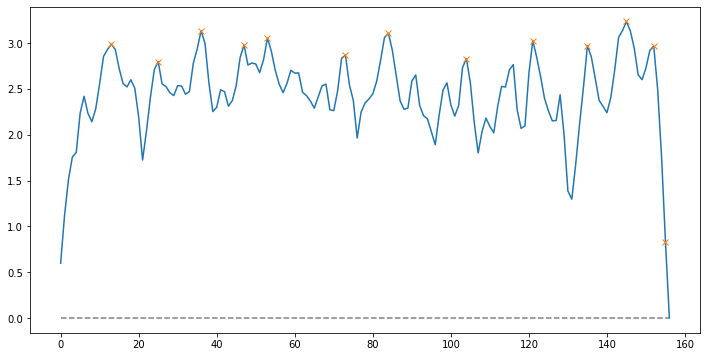

Peak count: 13
Frame tokens: 하셨지요. ” 중얼거렸다. 만일 “만일 아주머니 이젠……. ” 그녀는 ” 말했다. 좀 있지요. 

Similarity : 0.4609576946043058
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, Generator / grammar loss:-0.21426625549793243   similarity loss:-0.12249153107404709


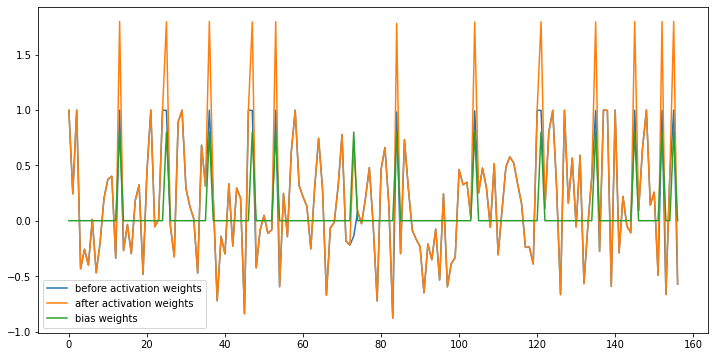

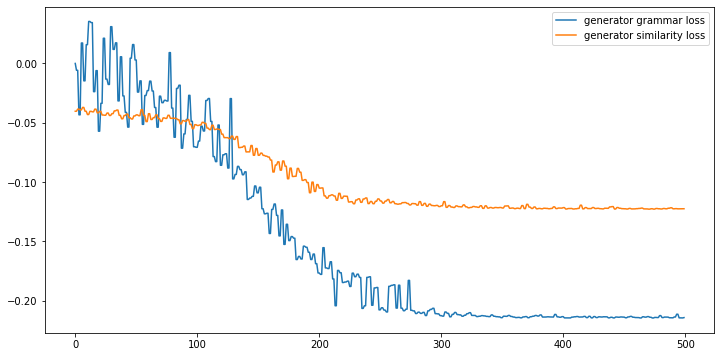

--------------------------------------------------
summary:
 모으고 하셨지요. 악마가 그렇겠어요. ” 고개를 중얼거렸다. 없어. 만일 “만일 편지하지요. 이젠……. ” 건네주었다. 그녀는 이마에 그것을 ” 선 채로 말없이 말했다. 점이라고 좀 있지요.
--------------------------------------------------
         method  comp ratio     intro  ...       var     total   grammar
0      SAM+WGAN    0.162861  0.506557  ...  0.000065  0.492617  0.990336
1  BERT+LexRank    0.296804  0.180640  ...  0.000798  0.172447  0.999898
2          BESM    0.149163  0.398033  ...  0.001768  0.435726  0.999199
3   BESM+kobert    0.149163  0.398033  ...  0.001768  0.435726  0.999199

[4 rows x 8 columns]
Current result ==================================================
         method  comp rate     intro  ...   isthmus  simlirality  grammarity
0      SAM+WGAN   0.175491  0.541944  ...  0.003103     0.543512    0.995298
1  BERT+LexRank   0.245279  0.174631  ...  0.003347     0.205901    0.999899
2          BESM   0.206708  0.440621  ...  0.004253     0.434001    0.999697
3   BESM+kobert   0.

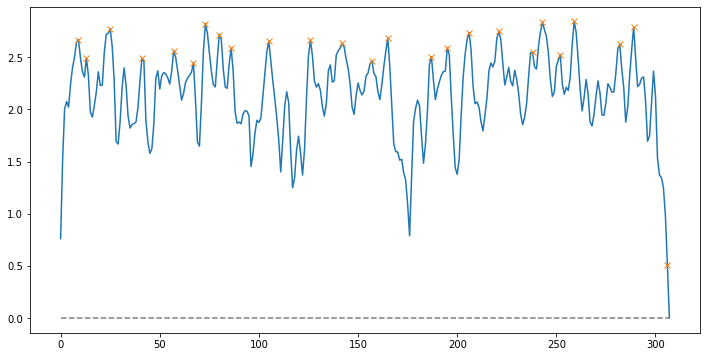

Peak count: 25
Frame tokens: ” 하겠어요. 감동적이었다. 골목이었다. 그래서 알았다. 그는 것이다. 이 있었다. 그런데 있었다. 가까이 있었다. 그는 시작했다. 그러나 포아로는 포아로는 애셔. 안으로 바였다. 우리는 들어갔다. 어두웠다. 

Similarity : 0.47239866241319084
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, Generator / grammar loss:-0.18092571198940277   similarity loss:-0.10244732350111008


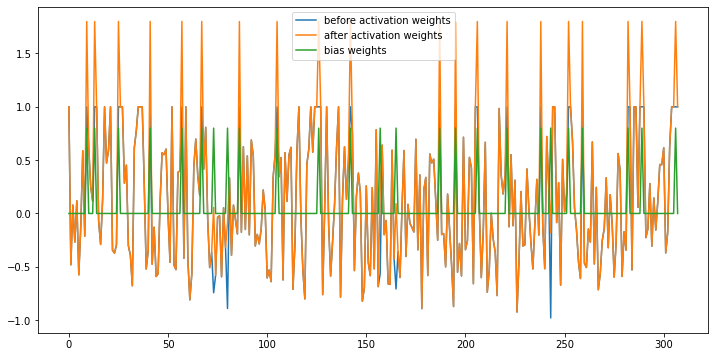

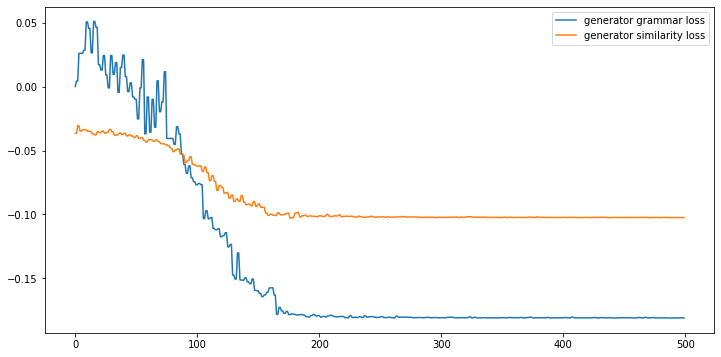

--------------------------------------------------
summary:
 ” 하겠어요. 아주머니가 아니니까요. 기묘한 감동적이었다. 우리는 곧 > 참극이 일어난 골목이었다. 때, 그래서 그가 알았다. 이 있었다. 또 아이들이 있을 뿐이었다. 그런데 이때는 쭉 그것이 있었다. 그는 시작했다. 돌아갔다. 그러나 포아로는 포아로는 그렇지, 어쩌면……. 안으로 들어가 바였다. 우리는 구경꾼들의 찬 눈길을 안으로 들어갔다. 블라인드가 안은 여전히 어두웠다. 
--------------------------------------------------
         method  comp ratio     intro  ...       var     total   grammar
0      SAM+WGAN    0.175453  0.579095  ...  0.002926  0.538877  0.990149
1  BERT+LexRank    0.243822  0.147344  ...  0.010276  0.179631  0.999905
2          BESM    0.257825  0.358122  ...  0.003015  0.444111  0.999906
3   BESM+kobert    0.244646  0.360835  ...  0.003520  0.407673  0.999906

[4 rows x 8 columns]
Current result ==================================================
         method  comp rate     intro  ...   isthmus  simlirality  grammarity
0      SAM+WGAN   0.175489  0.543802  ...  0.003094     0.543280    0.995040
1  BERT+LexRank   0.245206  0.173266  ...  0.003694     0.204587    

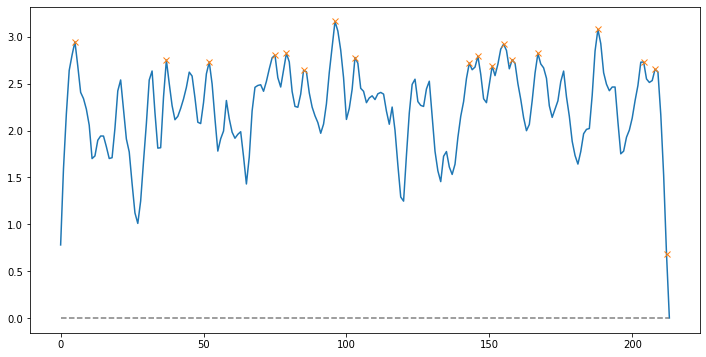

Peak count: 18
Frame tokens: 둘러보았다. 흔해빠진 “거기 ” “없었습니다. 있었지요. 둘러보았다. “여기입니다. ” 보았다. “곧바로 없었지요. 물었다. ” “그렇습니다. ” 들어갔다. 따라갔다. 

Similarity : 0.4732339762746426
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, Generator / grammar loss:-0.20256288349628448   similarity loss:-0.11006365716457367


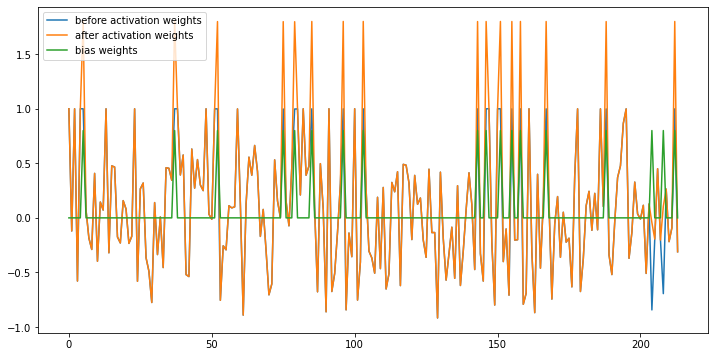

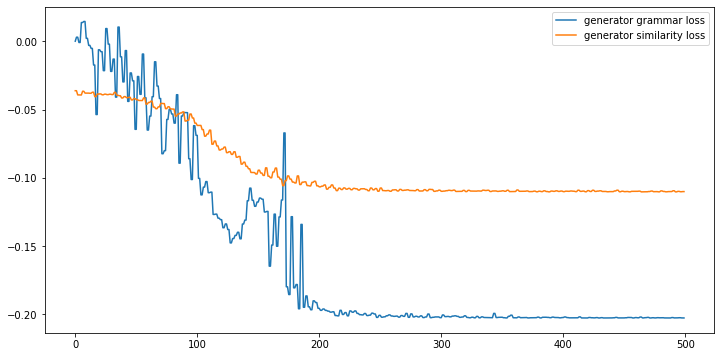

--------------------------------------------------
summary:
 가게 빙 둘러보았다. 흩어져 천장까지 흔해빠진 구멍가게로 햄프셔 설명했다. “거기 할머니는 ” “없었습니다. 다만 <플레이어즈>꾸러미가 있었지요. 눈은 둘러보았다. 철도 “여기입니다. ” 보았다. “지문은?” 저었다. “곧바로 없었지요. 물었다. 많았습니다. ” 고개를 있었느냐고 “그렇습니다. 됩니다. 함께 따라갔다.
--------------------------------------------------
         method  comp ratio     intro  ...       var     total   grammar
0      SAM+WGAN    0.201577  0.491607  ...  0.004642  0.594188  0.993147
1  BERT+LexRank    0.226351  0.327203  ...  0.011795  0.156669  0.999905
2          BESM    0.288288  0.680716  ...  0.008716  0.512536  0.999578
3   BESM+kobert    0.299550  0.667476  ...  0.029859  0.389450  0.999890

[4 rows x 8 columns]
Current result ==================================================
         method  comp rate     intro  ...   isthmus  simlirality  grammarity
0      SAM+WGAN   0.176732  0.541316  ...  0.003168     0.545704    0.994950
1  BERT+LexRank   0.244308  0.180597  ...  0.004080     0.202305    0.999900
2          BESM   0.21302

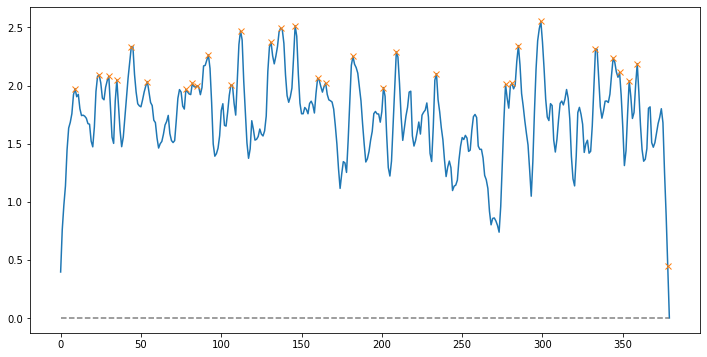

Peak count: 31
Frame tokens: 그곳은 있었다. 왔다. 한 사진이었다. 있었다. 부인을 사진이었다. 있었다. 즉 오래된 얼마쯤 말했다. 헤이스팅즈. 시대에 아가씨의 나는 도저히 떨었다. 있었다. 한 이러한 부인이 재산이었다. “가엾게도. 가게였다. 나는 들어갔다. 중이었다. 포아로는 있나. 

Similarity : 0.4806211616293512
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, Generator / grammar loss:-0.19819685816764832   similarity loss:-0.09286881238222122


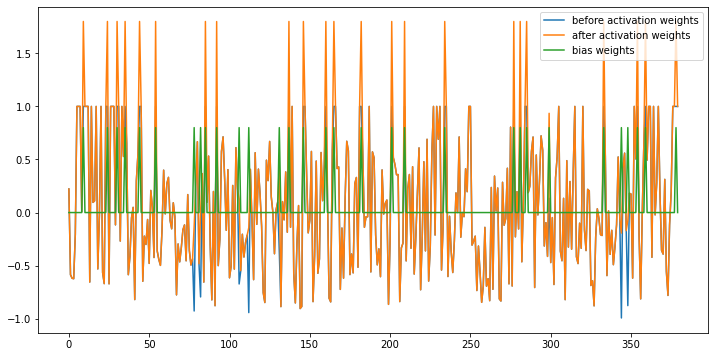

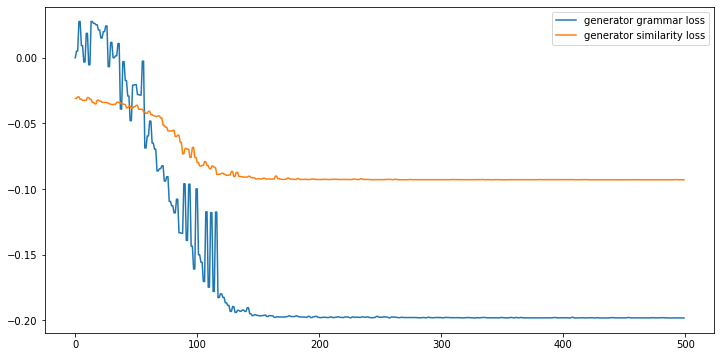

--------------------------------------------------
summary:
조그만 거실로 되어 그곳은 깨끗하게 정리되어 있었지만 느낌이 거의 위에 장 있었다. 다가가서 들여다보자 포아로도 왔다. 사진은 세 한 사진이었다. 그녀는 있었다. 있었다. 즉 헤이스팅즈. 아름다웠을 시대에 뒤떨어진 아가씨의 나는 옆에 애셔였다고는 도저히 곁눈질을 떨었다. 있었다. 털이 낡은 두 한 서랍에는 표지가 달린 이러한 부인이 남긴 재산이었다. 없네. 바로 야채 가게였다. 사고 중이었다. 포아로는 싸주는 뚱뚱한 큰소리로 “그 끔찍한 일이 있나. 
--------------------------------------------------
         method  comp ratio     intro  ...       var     total   grammar
0      SAM+WGAN    0.168659  0.580041  ...  0.002916  0.523861  0.989544
1  BERT+LexRank    0.154714  0.156347  ...  0.006983  0.146243  0.999901
2          BESM    0.266932  0.513881  ...  0.006992  0.413082  0.999903
3   BESM+kobert    0.198539  0.439206  ...  0.000795  0.404550  0.999902

[4 rows x 8 columns]
Current result ==================================================
         method  comp rate     intro  ...   isthmus  simlirality  grammarity
0      SAM+WGAN   0.176365  0.543077  ...  0.003156     0.544711    0.994704
1  BERT+LexRank   0.240236 

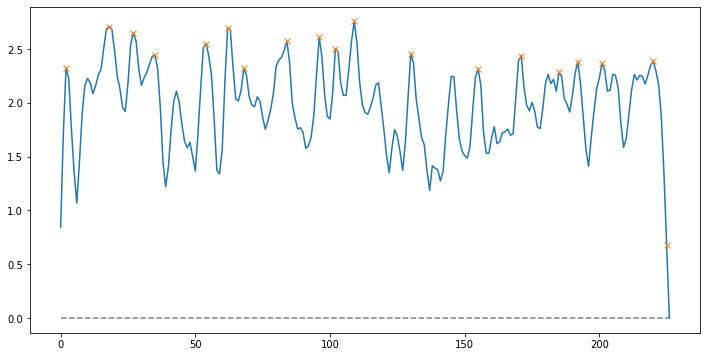

Peak count: 19
Frame tokens: 놀랐겠습니까!” 모양이다. 대체 꽤 여자가 ” “외국 없었어요. 비나가니까요. 남자라니……아니에요. 않는데요. 들었습니다만. 나오고, 겨우 물었다. 다만 것뿐일세. 보아서는 없다네. 

Similarity : 0.4562909005607907
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, Generator / grammar loss:-0.22036181390285492   similarity loss:-0.11884436011314392


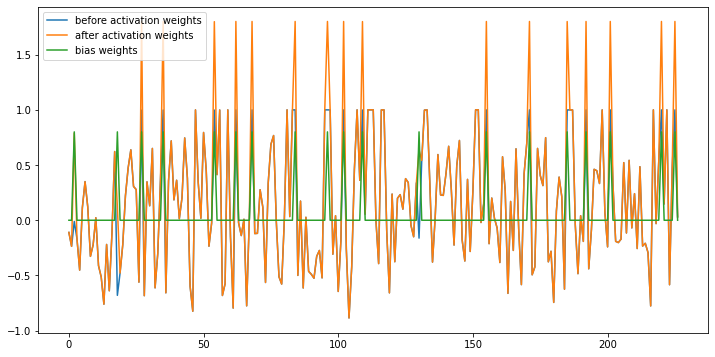

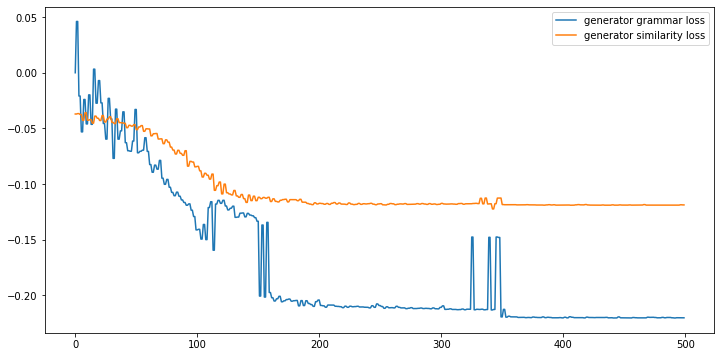

--------------------------------------------------
summary:
대체 꽤 남자로 여자가 돌아보았다. 했다고요?” ” “외국 “아니, 기회가 없었어요. 많이 비나가니까요. 키가 남자라니……아니에요. 있었다고는 않는데요. 그래서 내가 대사를 포아로에게 말했다. 그리하여 이 네 사람이나 나오고, 겨우 물었다. “대체 그건 다만 어떤지 것뿐일세. 것처럼 보아서는 대답도 없다네.
--------------------------------------------------
         method  comp ratio     intro  ...       var     total   grammar
0      SAM+WGAN    0.180483  0.492801  ...  0.005137  0.508667  0.998260
1  BERT+LexRank    0.363064  0.191350  ...  0.000558  0.232479  0.999858
2          BESM    0.285414  0.501426  ...  0.002895  0.563810  0.999525
3   BESM+kobert    0.324239  0.502429  ...  0.003444  0.550380  0.999898

[4 rows x 8 columns]
Current result ==================================================
         method  comp rate     intro  ...   isthmus  simlirality  grammarity
0      SAM+WGAN   0.176544  0.540891  ...  0.003242     0.543144    0.994859
1  BERT+LexRank   0.245576  0.180010  ...  0.004053     0.201180    0.999898
2          BESM   0.218518  0.45

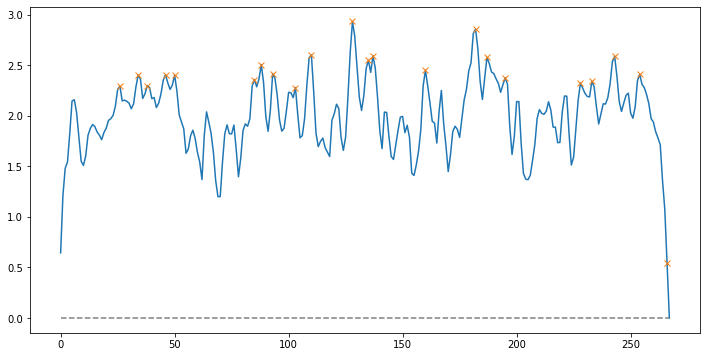

Peak count: 22
Frame tokens: 이 버리지. 어떤 말이라도 풀려나온다네. ” 끊었다. 말투로 헤이스팅즈. 보게, 당황했다. 그 깜짝 딸기란 말했다. 어쩌나. 모자라기 없어서 두드렸다. 말했다. 말했다. 걸렸다. 

Similarity : 0.5039481148959719
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, Generator / grammar loss:-0.21305200457572937   similarity loss:-0.12115854024887085


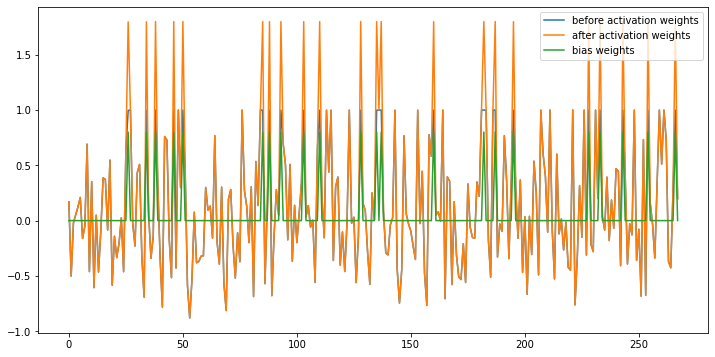

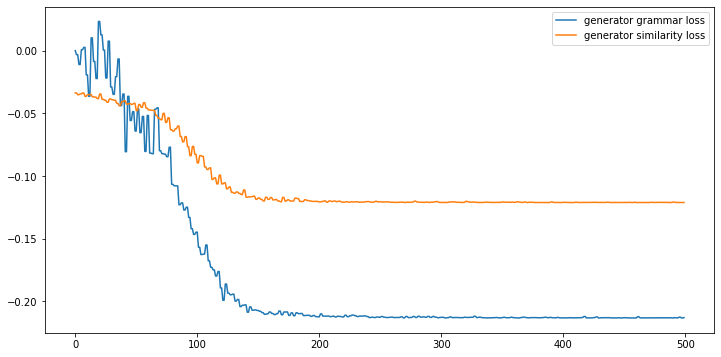

--------------------------------------------------
summary:
이 사람들에게 버리지. 어떤 말이라도 금방 풀려나온다네. 거야. 헤이스팅즈. ” 끊었다. 말투로 헤이스팅즈. 보게, 물이 나와 정말 당황했다. 그 아이는 깜짝 포아로도 “허름한 딸기란 아니면 변명하듯 말했다. “막 났으니 어쩌나. 모자라기 딸린 창에 있었다. 걸어갔는데 없어서 몇 두드렸다. 말했다. 아이는 말했다. 아이는 말을 걸렸다.
--------------------------------------------------
         method  comp ratio     intro  ...       var     total   grammar
0      SAM+WGAN    0.175373  0.527382  ...  0.000228  0.550592  0.997256
1  BERT+LexRank    0.254664  0.198936  ...  0.003439  0.214228  0.999912
2          BESM    0.248134  0.665211  ...  0.007925  0.544020  0.999736
3   BESM+kobert    0.293843  0.580246  ...  0.006005  0.490611  0.999902

[4 rows x 8 columns]
Current result ==================================================
         method  comp rate     intro  ...   isthmus  simlirality  grammarity
0      SAM+WGAN   0.176495  0.540328  ...  0.003117     0.543455    0.994959
1  BERT+LexRank   0.245955  0.180798  ...  0.004027     0.201723    0.999898
2          BESM 

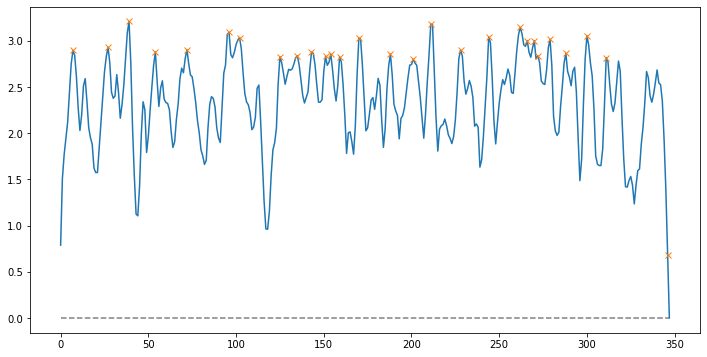

Peak count: 28
Frame tokens: “엄마, ” 아주머니. 왔습니다. 이쪽으로. “죄송해요. 드려서요. 그들은 금방 말예요. “갑작스러운 부인, “글쎄요. “애셔 그녀로부터 얻어 주었다. 있었다. 그러나 왔다. 일어나다니……. 데까지 것이다. 이야기했었다. 내 그리고 것이다. 있어요. 

Similarity : 0.5209522126731667
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, Generator / grammar loss:-0.1925065964460373   similarity loss:-0.11403892934322357


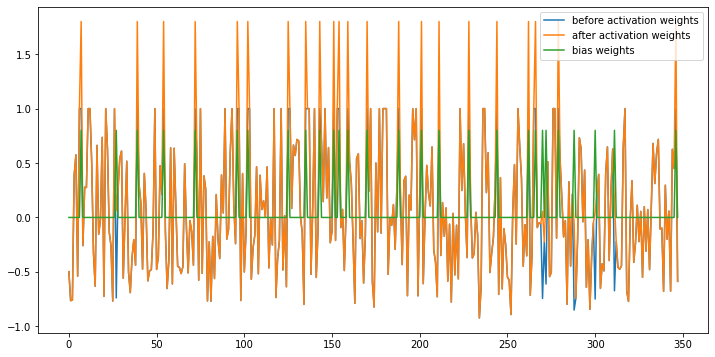

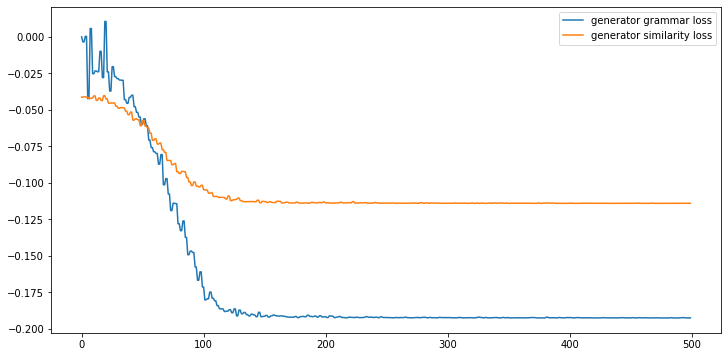

--------------------------------------------------
summary:
소리쳤다. “엄마, 어두컴컴한 안쪽으로 내려다보고 낭비예요. 아주머니. 기사가 왔습니다. 이쪽으로. ” 딱딱한 여자는 “죄송해요. 조금 드려서요. 그렇지만 양말이니 온갖 그들은 정말 금방 외워서 이쪽은 저쪽은 말예요. 그 “갑작스러운 파울러 부인, “글쎄요. “애셔 알고 보면. 포아로는 얼른 안심시키듯 그녀로부터 쓴다고 주었다. 얻어 주었다. 가엾은 있었다. 프란츠 애셔는 그러나 그리고 왔다. 일이 일어나다니……. 번이고 되풀이 이야기했었다. 물었다. 있어요.
--------------------------------------------------
         method  comp ratio     intro  ...       var     total   grammar
0      SAM+WGAN    0.180488  0.577549  ...  0.001587  0.564931  0.993170
1  BERT+LexRank    0.220906  0.134276  ...  0.001640  0.150006  0.999911
2          BESM    0.197909  0.458105  ...  0.001349  0.484641  0.999901
3   BESM+kobert    0.218815  0.438032  ...  0.000624  0.474635  0.999902

[4 rows x 8 columns]
Current result ==================================================
         method  comp rate     intro  ...   isthmus  simlirality  grammarity
0      SAM+WGAN   0.176655  0.541817  ...  0.003056     0.544314    0.994887
1  BERT+LexRank   0.24

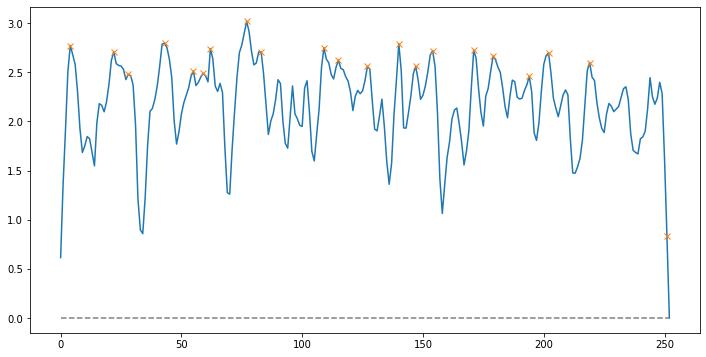

Peak count: 21
Frame tokens: 큰소리로 물론 말했을 만일 이번 전 뻔했어요. 놀랐어요. ‘저 나는 결국 말했는데. 모르니까요. ” 물었다. 말했다. “ 못했다. 애셔가 ” 그것만으로는. 

Similarity : 0.49925238404851047
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, Generator / grammar loss:-0.20840391516685486   similarity loss:-0.10481438785791397


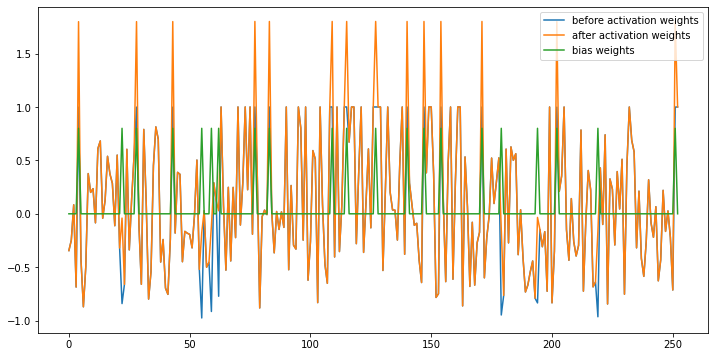

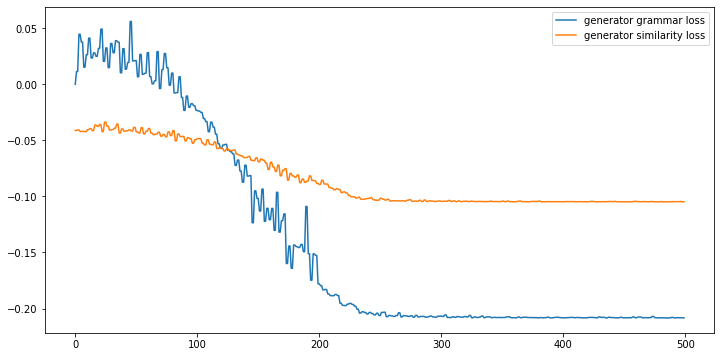

--------------------------------------------------
summary:
큰소리로 말했을 만일 딸 순경들이 있어. 말예요. 놀랐어요. ‘저 아니었어. 좋았을걸. 정말 남편은 없어. 나는 아주머니한테 말했었는데, 결국 말대로 되어 남자는 거라고 말했는데. ’ 그 해치운 짓을 모르니까요. ” 숨을 헐떡이며 물었다. 가게로 아무도 못 말했다. 그녀는 애셔가 잘 되풀이하는 그것만으로는. 
--------------------------------------------------
         method  comp ratio     intro  ...       var     total   grammar
0      SAM+WGAN    0.178351  0.512451  ...  0.000051  0.514791  0.998287
1  BERT+LexRank    0.196907  0.079821  ...  0.002621  0.147328  0.999894
2          BESM    0.307216  0.537170  ...  0.002250  0.481154  0.999907
3   BESM+kobert    0.307216  0.537170  ...  0.002250  0.481154  0.999907

[4 rows x 8 columns]
Current result ==================================================
         method  comp rate     intro  ...   isthmus  simlirality  grammarity
0      SAM+WGAN   0.176720  0.540687  ...  0.002940     0.543178    0.995018
1  BERT+LexRank   0.243105  0.175125  ...  0.003881     0.197642    0.999899
2          BESM   0.222276  0.4

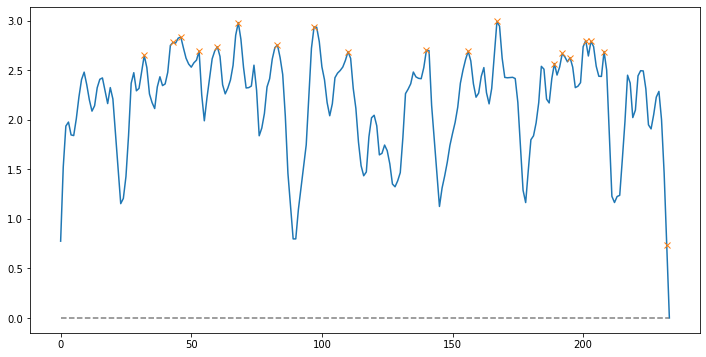

Peak count: 19
Frame tokens: 있지. 꽤 그러나 걸세. 위해서라네. 그리고 있는 포아로가 흘끔거리는 있는 정도입니다. “없습니다. ” 말했다. 생각하오. 참으로 사건입니다. 않습니다. 사람이었다. 

Similarity : 0.4491635705211753
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, Generator / grammar loss:-0.2097756564617157   similarity loss:-0.10933846980333328


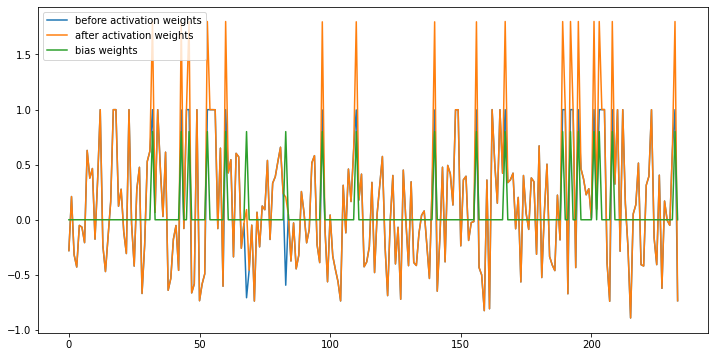

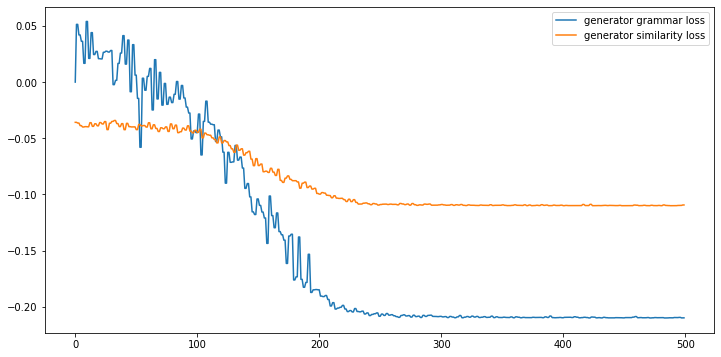

--------------------------------------------------
summary:
무엇을 위치에 놓여 숨바꼭질하고 있지. 부인은 꽤 해가면서. 그러나 진술이 걸세. 5파운드를 투자한 건 위해서라네. 포아로가 흘끔거리는 있는 범행을 저지르는 정도입니다. “애셔라는 사람은 “없습니다. ” 포아로는 말했다. “나도 생각하오. 참으로 사건입니다. 저는 아무래도 않습니다. 우리는 돌아가기 씨는 사람이었다.
--------------------------------------------------
         method  comp ratio     intro  ...       var     total   grammar
0      SAM+WGAN    0.194292  0.612461  ...  0.001639  0.551439  0.998114
1  BERT+LexRank    0.342481  0.145743  ...  0.003507  0.142203  0.999913
2          BESM    0.330406  0.365631  ...  0.019715  0.468671  0.999906
3   BESM+kobert    0.362239  0.357707  ...  0.018101  0.463094  0.999909

[4 rows x 8 columns]
Current result ==================================================
         method  comp rate     intro  ...   isthmus  simlirality  grammarity
0      SAM+WGAN   0.177371  0.543345  ...  0.002892     0.543484    0.995133
1  BERT+LexRank   0.246786  0.174037  ...  0.003867     0.195589    0.999899
2          BESM   0.226281 

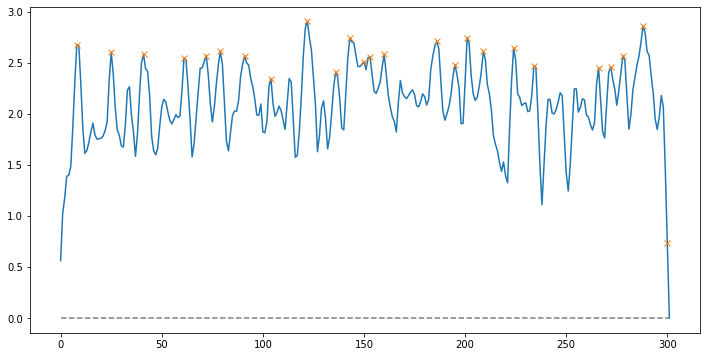

Peak count: 25
Frame tokens: 것이다. 그는 “네, 분이시니까요. 보았다. 씨. ” “그들은 중얼거렸다. 곧 그래서 “정말 저에게도 “알겠습니다. 울렸습니다. 그때가 직전이었습니다. 샀습니다. ” 모릅니다. ” 어제 없었습니까? 대답했다. 일어섰다. 

Similarity : 0.48363269702341216
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, Generator / grammar loss:-0.22590622305870056   similarity loss:-0.11627878248691559


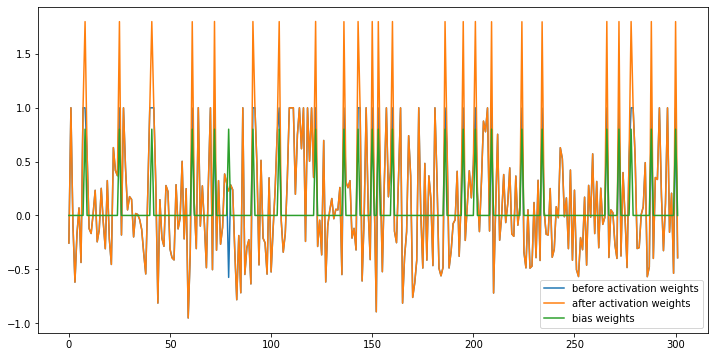

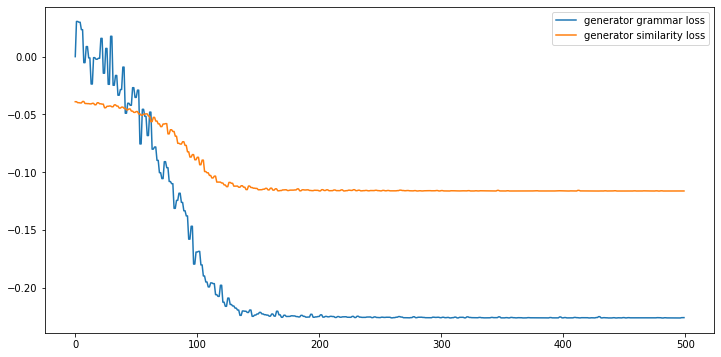

--------------------------------------------------
summary:
그는 샀던 것이다. 그는 잘 말했다. “네, 포아로 분이시니까요. 씨는 들여다보듯 보았다. 부인한테서 ” “그렇더라도 “그들은 갖고 있지 않으니까요, ” 부엉이처럼 너머로 보았다. 중얼거렸다. 곧 그래서 바로 포아로는 “정말 저에게도 들려주실 “알겠습니다. 길이었는데, 시간을 좀 울렸습니다. 그때가 직전이었습니다. “네, 샀습니다. ” 모릅니다. ” 어제 없었습니까? 흥분해 대답했다. 여느 전혀 일어섰다.
--------------------------------------------------
         method  comp ratio     intro  ...       var     total   grammar
0      SAM+WGAN    0.179528  0.458466  ...  0.001590  0.516190  0.997584
1  BERT+LexRank    0.262992  0.281394  ...  0.002271  0.213185  0.999880
2          BESM    0.172441  0.474894  ...  0.001496  0.422776  0.999867
3   BESM+kobert    0.181102  0.442093  ...  0.001154  0.409815  0.999868

[4 rows x 8 columns]
Current result ==================================================
         method  comp rate     intro  ...   isthmus  simlirality  grammarity
0      SAM+WGAN   0.177448  0.540314  ...  0.002845     0.542509    0.995220
1  BERT+LexRank   0.247364  0.177871  ...  0.003810  

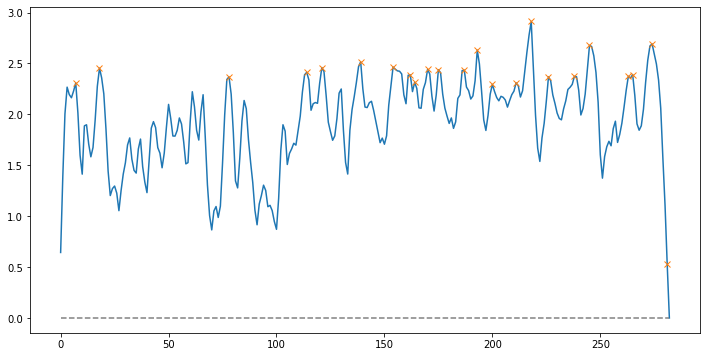

Peak count: 23
Frame tokens: 그런데 ” 씨 으르렁거렸다. 대체 않으면 열었다. 어쨌든 사건이니까요. 되지요. 말했다. “잠자코 끼어들었다. ” 아니잖소. 나름이지요. 싶어했습니다. 있소. 곤란한데. 안 것입니다. “어째서 뿐이었다. 

Similarity : 0.4751590169580753
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, Generator / grammar loss:-0.21818028390407562   similarity loss:-0.11327960342168808


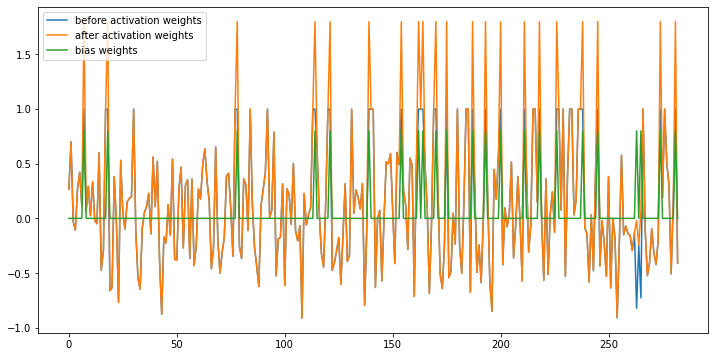

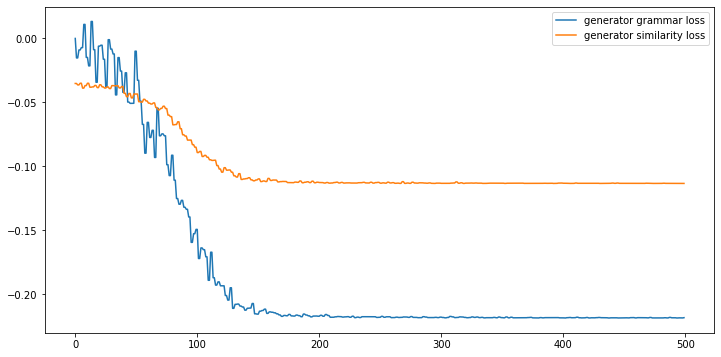

--------------------------------------------------
summary:
그런데 싶어서요. ” 현대 리딜 씨 이야기가 한 그는 으르렁거렸다. 아는데, 대체 이번엔 않으면 안 된다는 열었다. 어쨌든 살인 사건이니까요. 안 되지요. 말했다. 모조리 ” 거인이 “잠자코 끼어들었다. ” 아니잖소. 않게 말했다. 나름이지요. 싶어했습니다. 저는 자진해서 뭐랄까, 자연스럽다고 “나한테는 일이 있소. 곤란한데. 그런데 “어째서 않겠소?” 뿐이었다.
--------------------------------------------------
         method  comp ratio     intro  ...       var     total   grammar
0      SAM+WGAN    0.178791  0.330582  ...  0.014750  0.529881  0.997574
1  BERT+LexRank    0.296231  0.217847  ...  0.003572  0.183896  0.999902
2          BESM    0.318142  0.597700  ...  0.003190  0.505314  0.999508
3   BESM+kobert    0.316389  0.594917  ...  0.003731  0.497947  0.999326

[4 rows x 8 columns]
Current result ==================================================
         method  comp rate     intro  ...   isthmus  simlirality  grammarity
0      SAM+WGAN   0.177494  0.533082  ...  0.003256     0.542074    0.995302
1  BERT+LexRank   0.249050  0.179250  ...  0.003802     0.195792    0.999899


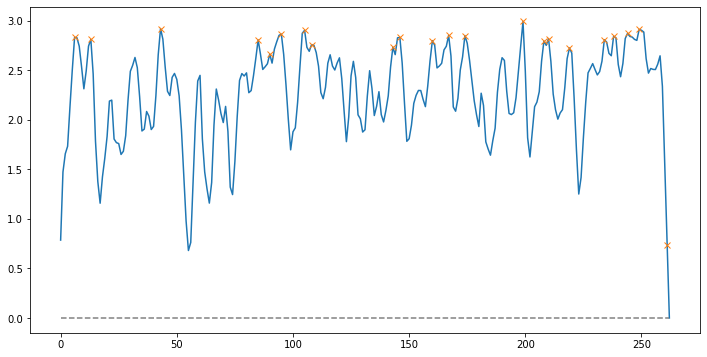

Peak count: 22
Frame tokens: 당신은. 없잖소. 대체 버트, ” 저는 그런데 저에게는 내가 ” 생각했소. 없었소. 보았소. 않았다면. 그래서 생각했소. 보다고. 지금 않았소. 누가 “못 일어섰다. 

Similarity : 0.4679802620771476
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, Generator / grammar loss:-0.21705932915210724   similarity loss:-0.10767572373151779


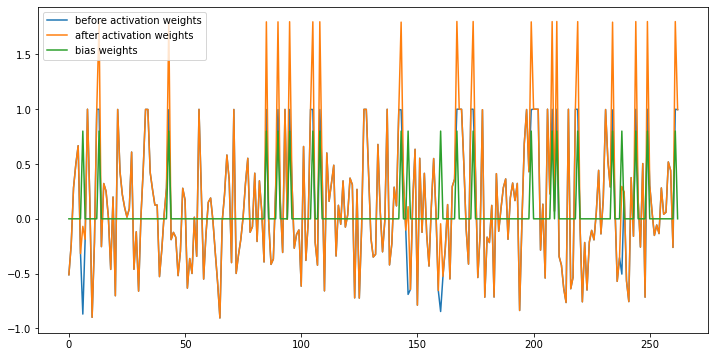

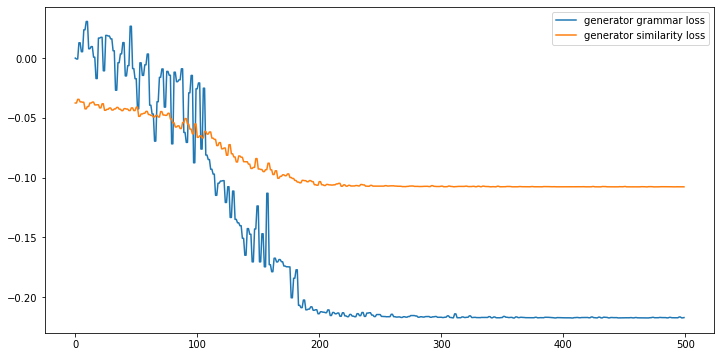

--------------------------------------------------
summary:
뭘 리 없잖소. 있어. ‘ “나한테 대체 담배를 일어섰다. 버트, ” “좀 저는 것뿐입니다. 그런데 저에게는 ‘ “가게에 있었소. 사려고. 내가 없었소. 그래서 계산대를 기다려 보았소. 않길래 찾기라도 않았다면. ” “철도 안내서는 펼쳐져서 그래서 생각했소. 나가느라 잊었나 보다고. 그런 지금 누가 “못 일어섰다. 
--------------------------------------------------
         method  comp ratio     intro  ...       var     total   grammar
0      SAM+WGAN    0.169540  0.377128  ...  0.008815  0.499366  0.998231
1  BERT+LexRank    0.204981  0.232733  ...  0.005373  0.114989  0.999896
2          BESM    0.046935  0.334121  ...  0.002109  0.407300  0.988469
3   BESM+kobert    0.046935  0.334121  ...  0.002109  0.407300  0.988469

[4 rows x 8 columns]
Current result ==================================================
         method  comp rate     intro  ...   isthmus  simlirality  grammarity
0      SAM+WGAN   0.177229  0.527883  ...  0.003441     0.540650    0.995399
1  BERT+LexRank   0.247581  0.181033  ...  0.003855     0.193099    0.999899
2          BESM   0.221570 

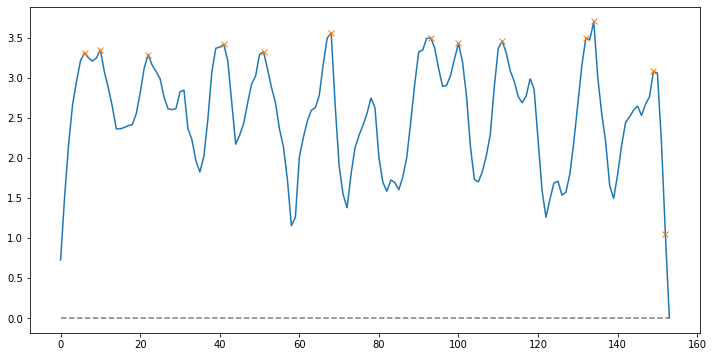

Peak count: 13
Frame tokens: 단계에서는. ” 나는 가세. “그래서?” 말했다. “포아로!” 그러나 되풀이했다. 그런데 말일세. 없네. 중얼거렸다. 

Similarity : 0.5027403615702976
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, Generator / grammar loss:-0.23236514627933502   similarity loss:-0.1334230750799179


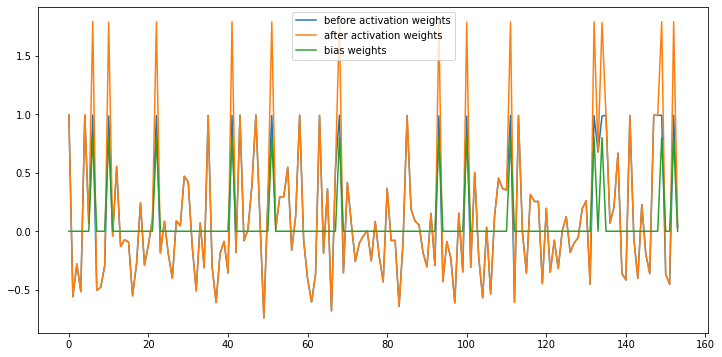

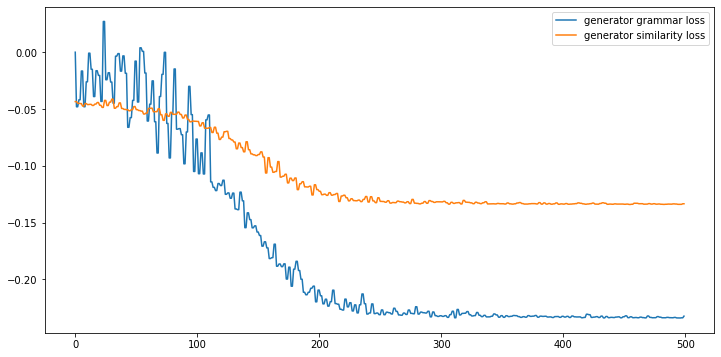

--------------------------------------------------
summary:
 아직 단계에서는. ” 나는 기차를 가세. < > “그래서?” 차칸에 막 말했다. 왼쪽 “포아로!” 그러나 되풀이했다. 나무라듯이 그런데 말일세. 살인범이 하면 알 수 없네. 중얼거렸다.
--------------------------------------------------
         method  comp ratio     intro  ...       var     total   grammar
0      SAM+WGAN    0.178082  0.513184  ...  0.007759  0.537028  0.998199
1  BERT+LexRank    0.511986 -0.012454  ...  0.016965  0.131427  0.999903
2          BESM    0.255137  0.420283  ...  0.019610  0.517605  0.999553
3   BESM+kobert    0.255137  0.420283  ...  0.019610  0.517605  0.999553

[4 rows x 8 columns]
Current result ==================================================
         method  comp rate     intro  ...   isthmus  simlirality  grammarity
0      SAM+WGAN   0.177256  0.527409  ...  0.003581     0.540533    0.995489
1  BERT+LexRank   0.256110  0.174791  ...  0.004277     0.191110    0.999899
2          BESM   0.222653  0.460615  ...  0.005164     0.451969    0.999355
3   BESM+kobert   0.230

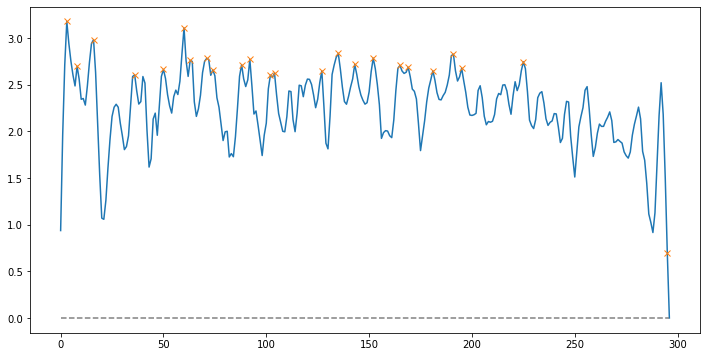

Peak count: 24
Frame tokens: 단서라도 단서. 걸세. 그렇지, 아니겠나!“ 일부러 걸세. “지문이 그걸세. 그런 띄지. 죄없는 지문을 되지. 셈일세. “사실을 이 뒤를 표시를 뜻에서는. 이윽고 “그 어떤 반대했다. 

Similarity : 0.5057607878117222
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, Generator / grammar loss:-0.18788835406303406   similarity loss:-0.12355586141347885


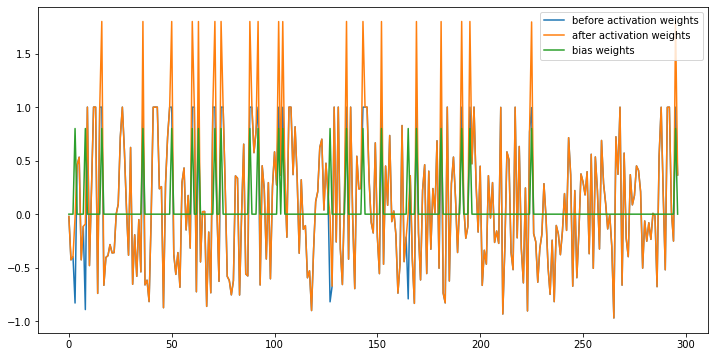

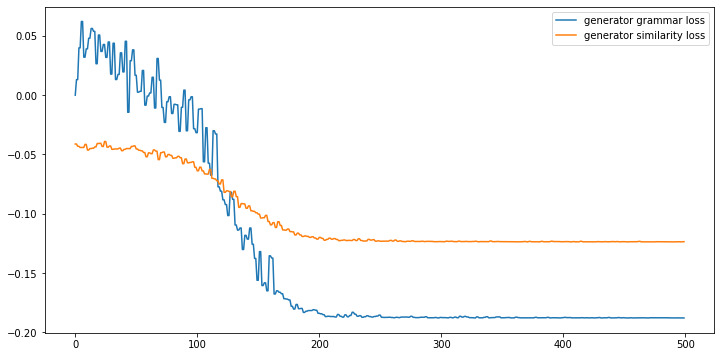

--------------------------------------------------
summary:
언제나 끄는 건 단서라는 걸세. 않았고, 그렇지, 그러나 적어도 철도 단서가 아니겠나!“ 일부러 두고 걸세. ” “지문이 그걸세. 어제는 그런 사나이는 띄지. 죄없는 지문을 죄가 있는 누군가가 갖다 셈일세. “그 “사실을 말하면, 헤이스팅즈. 이 표시를 뜻에서는. 뜻에서라면 이윽고 “그 <있다>일세. 속에 그는 어떤 그것을 열차에 된 걸세. 반대했다.
--------------------------------------------------
         method  comp ratio     intro  ...       var     total   grammar
0      SAM+WGAN    0.172656  0.623380  ...  0.002273  0.560594  0.996685
1  BERT+LexRank    0.266433  0.224153  ...  0.003037  0.218982  0.999916
2          BESM    0.270815  0.383204  ...  0.006910  0.451100  0.999905
3   BESM+kobert    0.270815  0.362923  ...  0.013523  0.414127  0.999907

[4 rows x 8 columns]
Current result ==================================================
         method  comp rate     intro  ...   isthmus  simlirality  grammarity
0      SAM+WGAN   0.177113  0.530408  ...  0.003540     0.541160    0.995527
1  BERT+LexRank   0.256432  0.176334  ...  0.004239     0.191981    0.999899
2      

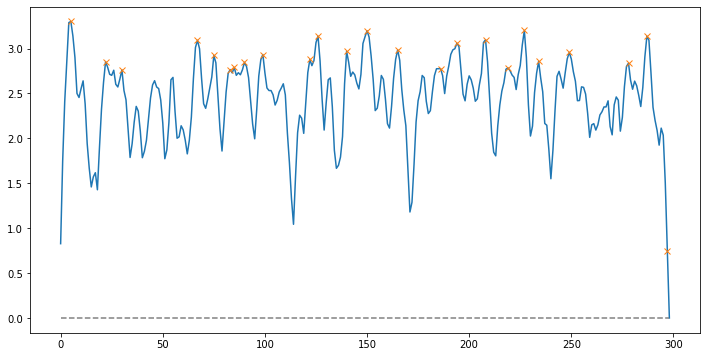

Peak count: 24
Frame tokens: 지나지 보군. 않으면 “사실을 않았네. 수도 ‘ 범인이 걸세. 그 모르잖나. 말일세. ” ” 자신의 걸세. 하지. 그런 그는 것 ” 빼놓을 남자일세. 법이지. 

Similarity : 0.5167645930592739
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, Generator / grammar loss:-0.20961880683898926   similarity loss:-0.13195417821407318


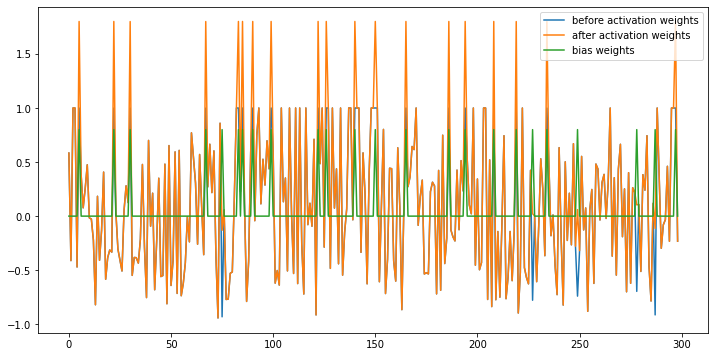

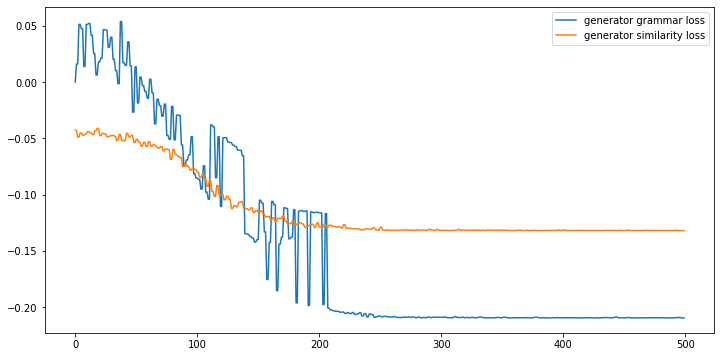

--------------------------------------------------
summary:
것은 모두 지나지 보군. 않으면 “사실을 무시할 수도 ‘ 범인이 그 걸세. 우리들의 대답이 그날 시간 것으로 그 쪽이 모르잖나. 그리고 가운데 아님을 아무것도 나타나지 말일세. ‘ 나는 리딜일지도 모르지. ” “그런데 ” “그 자신의 걸세. 사람들은 크나큰 허영심과 하지. 그런 그 것 할 그러나 잘 씌어지는 법이지.
--------------------------------------------------
         method  comp ratio     intro  ...       var     total   grammar
0      SAM+WGAN    0.149746  0.483790  ...  0.000591  0.521760  0.997133
1  BERT+LexRank    0.211506  0.195727  ...  0.001328  0.208978  0.999895
2          BESM    0.211506  0.561525  ...  0.000690  0.516265  0.999514
3   BESM+kobert    0.215736  0.533482  ...  0.000010  0.531306  0.999524

[4 rows x 8 columns]
Current result ==================================================
         method  comp rate     intro  ...   isthmus  simlirality  grammarity
0      SAM+WGAN   0.176283  0.528996  ...  0.003450     0.540572    0.995576
1  BERT+LexRank   0.255071  0.176921  ...  0.004151     0.192496    0.999899
2          BESM   0.223774 

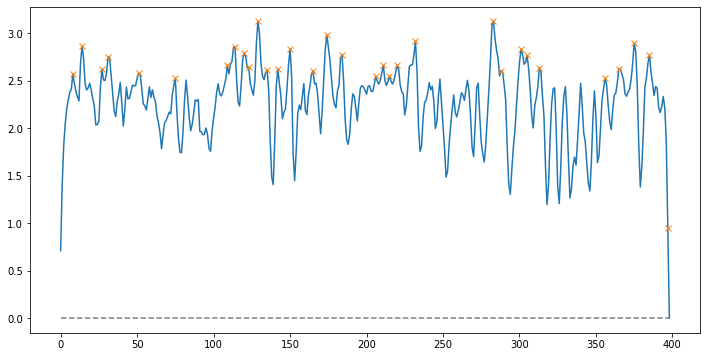

Peak count: 32
Frame tokens: ” 말했다. “아니, “아무것도. 보고 말했다. 줄 ” 없었다. 이상하게도 듯했다. 못 나는 있었다. 잇따른 그런 것이다. 흥분이 있었다. 흥분이 있었다. 없으리라. 이야깃거리가 될 곧 사실을 있었다. 포아로가 “왔네. 없었다. 멍해진 것이다. 

Similarity : 0.5072397004519628
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, Generator / grammar loss:-0.20553259551525116   similarity loss:-0.11928687989711761


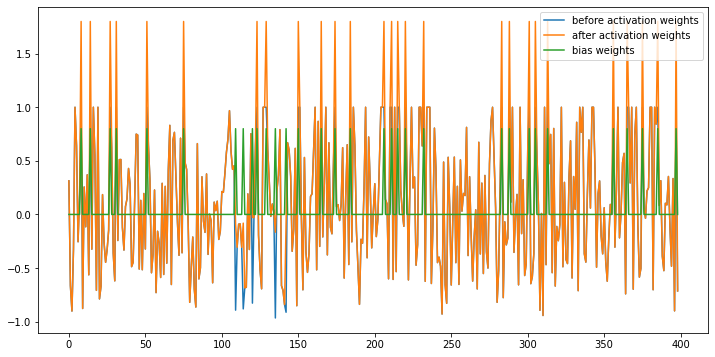

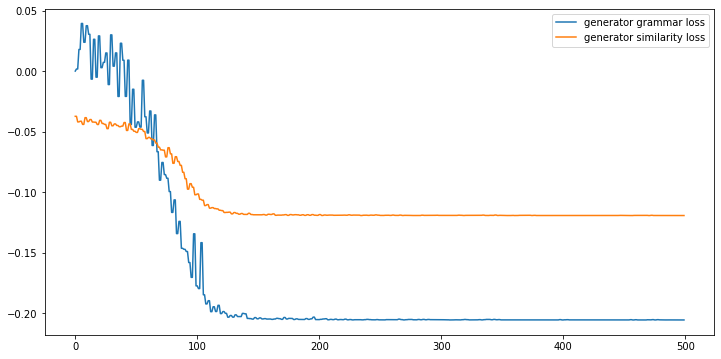

--------------------------------------------------
summary:
넣어두지 ” 말했다. 뭘 “오, “아니, “아무것도. 보고 말했다. 이상하게도 토론을 피하는 듯했다. 있었다. 애셔 그에게 잇따른 있던 그런 것이다. 분명 냉정한 경우는 그 흥분이 되고 있었다. 경우는 흥분이 몇 있었다. 겨우 그리 이상할 없으리라. 친구의 약점을 존중하여 기사들 이야깃거리가 될 데도 따윈 곧 사실을 사라져 있었다. 수 가 때문에 오후에 돌아왔는데, 포아로가 숨을 “왔네. ” 말했다. 쳐다보았으나 없었다. 사건의 제2장일세. 나는 멍해진 것이다.
--------------------------------------------------
         method  comp ratio     intro  ...       var     total   grammar
0      SAM+WGAN    0.170492  0.533706  ...  0.004471  0.569330  0.996430
1  BERT+LexRank    0.187541  0.167833  ...  0.001634  0.220927  0.999900
2          BESM    0.200000  0.528479  ...  0.001323  0.549436  0.999688
3   BESM+kobert    0.182295  0.413698  ...  0.003584  0.499020  0.999906

[4 rows x 8 columns]
Current result ==================================================
         method  comp rate     intro  ...   isthmus  simlirality  grammarity
0      SAM+WGAN   0.176113  0.529134  ...  0.003480     0.541418    0.995601
1  BERT+LexRank   0.2

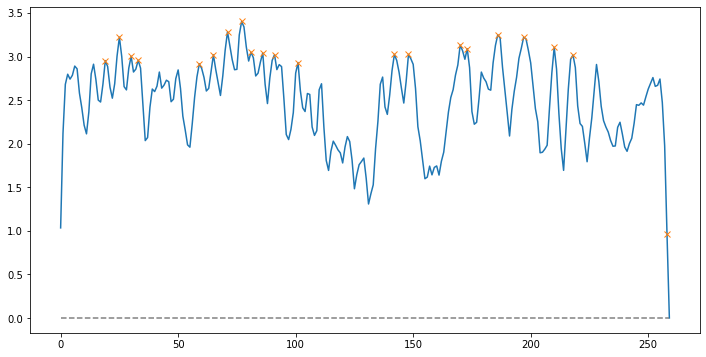

Peak count: 21
Frame tokens: 건가? 앤도버 그러나 시작이다. “물론이지, 앤도버 자네는 <무서운 일이군. ” ” 나는 포아로의 사건은 있었다. 말했다. 겁니다. ” 있습니다. 어떤 있습니다. 

Similarity : 0.5173261591517624
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, Generator / grammar loss:-0.1901927888393402   similarity loss:-0.12145454436540604


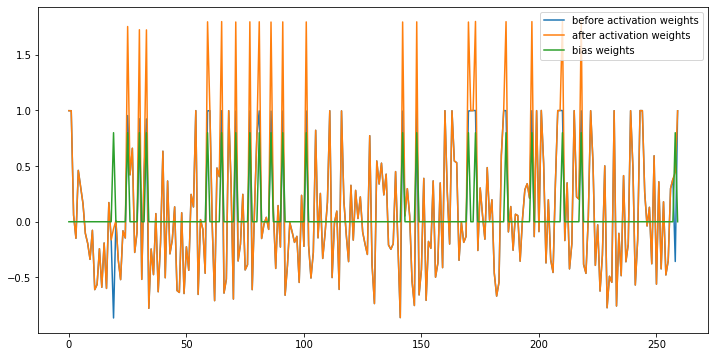

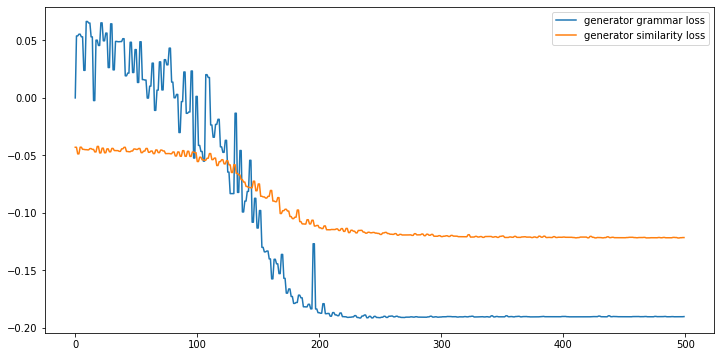

--------------------------------------------------
summary:
 “읽어보게. 앤도버 그러나 시작이다. 다른 “물론이지, 헤이스팅즈. 앤도버 끝날 자네는 <무서운 일이군. ” ” 나는 서섹스 앤도버의 포아로의 사건은 불구하고 피해 있었다. 범죄 수사과장이 말했다. 씌어진 겁니다. ” 그렇습니다. 지금 예고를 받고 있습니다. 벡스힐로 어떤 서섹스 할까?” 예정된 단서도 없습니다. 
--------------------------------------------------
         method  comp ratio     intro  ...       var     total   grammar
0      SAM+WGAN    0.164651  0.577819  ...  0.000241  0.593755  0.996969
1  BERT+LexRank    0.202791  0.153657  ...  0.002238  0.222848  0.999903
2          BESM    0.214884  0.267218  ...  0.004167  0.348792  0.999901
3   BESM+kobert    0.214884  0.267218  ...  0.004167  0.348792  0.999901

[4 rows x 8 columns]
Current result ==================================================
         method  comp rate     intro  ...   isthmus  simlirality  grammarity
0      SAM+WGAN   0.175786  0.530525  ...  0.003388     0.542914    0.995640
1  BERT+LexRank   0.251648  0.175997  ...  0.004024     0.194175    0.999899
2          BESM   0.222841 

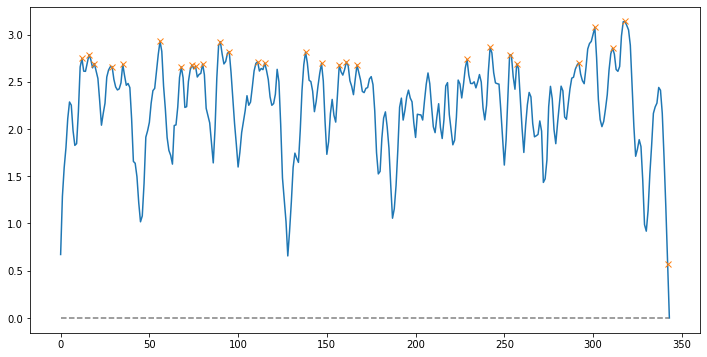

Peak count: 28
Frame tokens: ” 말했다. 생각일 ” 겁니다. 겁니다. 떠올랐지요. 그러나 애셔라는 모릅니다. 알겠습니까? 있습니다. “미치광이에게도 있습니다. 믿지요. 법입니다. 앤도버 아마 ” “우리는 “애셔 애셔도. 미행시키겠습니다. 이렇게 걱정이네. 일이군. 걱정일세. 생각된다. 

Similarity : 0.5462127245852775
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, Generator / grammar loss:-0.20878316462039948   similarity loss:-0.10177471488714218


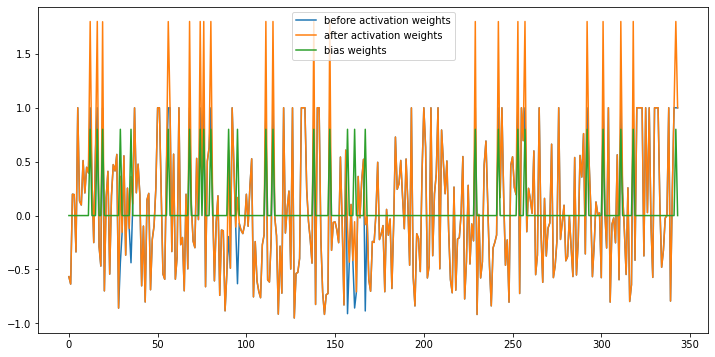

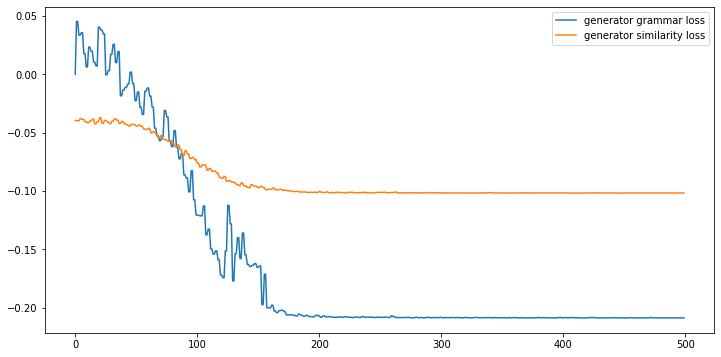

--------------------------------------------------
summary:
돌려졌다. ” 말했다. 생각일 이상은 씌어져 있는 겁니다. 벡스힐이라고 피해자도 떠올랐지요. 그러나 애셔라는 모릅니다. 한 “미치광이에게도 있습니다. 논리적이라는 의사 좋은데, 이들을 죽이게끔 믿지요. 배후에는 하나같이 법입니다. 밖에는 없어. 주의해야 ” “우리는 “애셔 관계있는 애셔도. 앤도버를 미행시키겠습니다. 산만한 “포아로, 이렇게 걱정이네. 그 일이군. 걱정일세. 걱정이야. ” < 벡스힐 살인 나는 25일 아침, 잠에서 그것은 30분쯤이었다고 생각된다. 
--------------------------------------------------
         method  comp ratio     intro  ...       var     total   grammar
0      SAM+WGAN    0.187948  0.492321  ...  0.004178  0.565330  0.998534
1  BERT+LexRank    0.251076  0.115386  ...  0.000311  0.145467  0.999897
2          BESM    0.226686  0.436992  ...  0.001210  0.380445  0.999870
3   BESM+kobert    0.240316  0.387991  ...  0.000901  0.406365  0.999655

[4 rows x 8 columns]
Current result ==================================================
         method  comp rate     intro  ...   isthmus  simlirality  grammarity
0      SAM+WGAN   0.176123  0.529464  ...  0.003410     0.543536    0.995720
1  BERT+LexRank   0

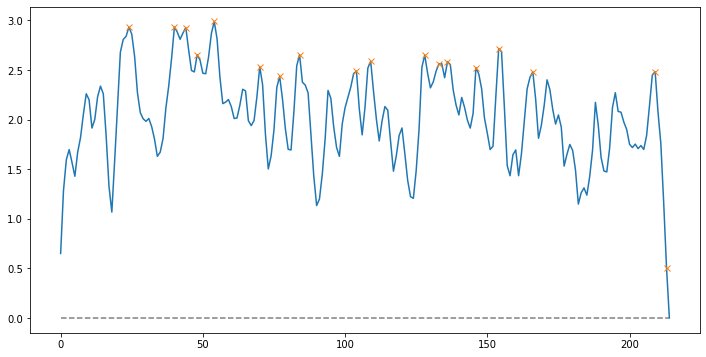

Peak count: 18
Frame tokens: 일어나면서 “일어났네. “뭐라고? ” 일어났네. 들려주었다. 그녀는 이 ” “그러나 ” 이야기로군. 헤이스팅즈. ” 그리고 있네. 훨씬 남자였다. 

Similarity : 0.43493923790038946
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, Generator / grammar loss:-0.22733938694000244   similarity loss:-0.11041880398988724


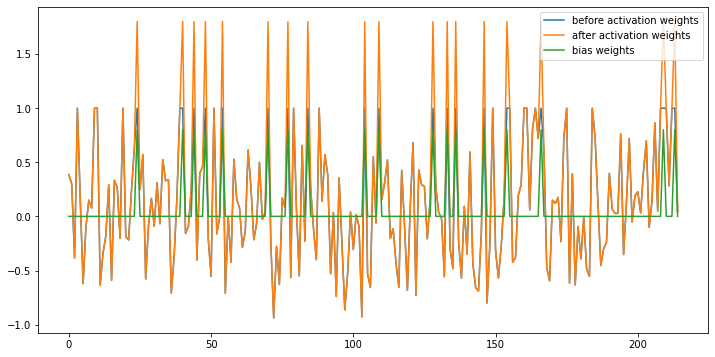

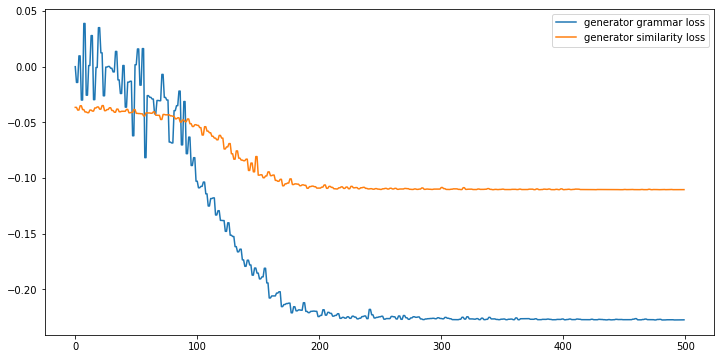

--------------------------------------------------
summary:
옆에 있었다. 그의 상태에서 일어나면서 있었다. “일어났네. “뭐라고? ” 오늘 일어났네. 들려주었다. 그녀는 버너드(Barnard)라는 이 지은 ” “그러나 ” 이야기로군. 헤이스팅즈. ” 맥이 그리고 물었다. 곧 경찰차가 오게 있네. 없으니까. 템즈 경관이었다. 훨씬 젊고 적은 남자였다.
--------------------------------------------------
         method  comp ratio     intro  ...       var     total   grammar
0      SAM+WGAN    0.194048  0.611327  ...  0.007276  0.526621  0.996807
1  BERT+LexRank    0.357143  0.151156  ...  0.004595  0.180531  0.999898
2          BESM    0.286905  0.527427  ...  0.006680  0.442346  0.999900
3   BESM+kobert    0.286905  0.527427  ...  0.006680  0.442346  0.999900

[4 rows x 8 columns]
Current result ==================================================
         method  comp rate     intro  ...   isthmus  simlirality  grammarity
0      SAM+WGAN   0.176608  0.531677  ...  0.003514     0.543079    0.995750
1  BERT+LexRank   0.254484  0.173687  ...  0.003939     0.192490    0.999899
2          BESM   0.224676  0.459024  ...

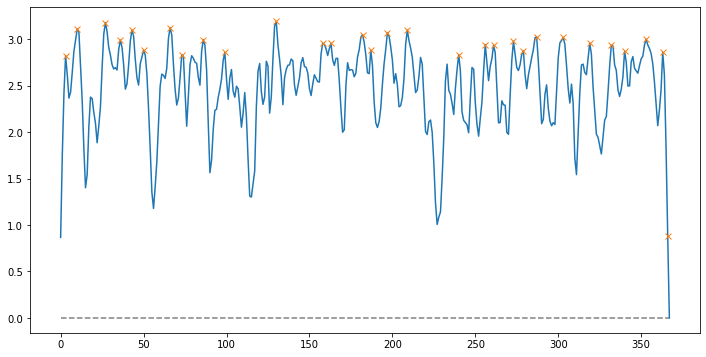

Peak count: 30
Frame tokens: 지녔으나, 듯했다. 참이었다. 그것을 생각되었다. 체하는 그가 했습니다. 산물입니다. ” 참으로 한 이쪽이 “우리 있었지요. 말했다. “이 아름다웠다든가……. ” 있었다. “그런 하지만 그것에 대답했다. 계속되었다. 대답했다. ” 당신은 대답했다. 모르겟습니다. 

Similarity : 0.5113186506569307
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, Generator / grammar loss:-0.20647720992565155   similarity loss:-0.13156460225582123


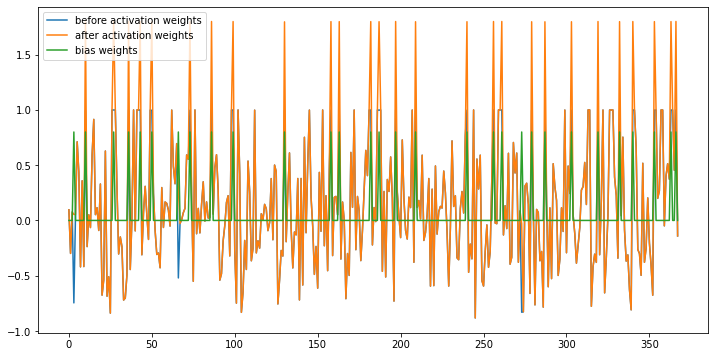

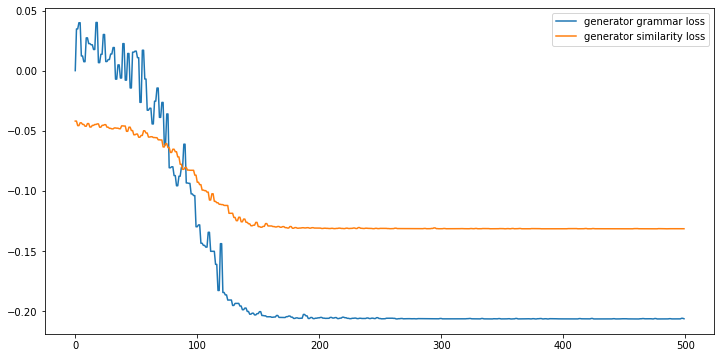

--------------------------------------------------
summary:
듯했다. 떨친 참이었다. 그는 그것을 지나치게 있는 듯 생각되었다. 잘난 체하는 것같이 했습니다. 살인 산물입니다. 없지요. ” 했다. 머스윌 참으로 있잖습니까. 전에는 한 이쪽이 들지요. 말했다. “우리 흔히 있었지요. ” 말했다. 크롬이 “이 아름다웠다든가……. 당할 ” 이렇게 말하고 있었다. 하지만 그것에 있는 대답했다. 이르러 포아로가 계속되었다. 어떤 졸렸는지, 당신은 모르오?” 대답했다. ” 포아로의 당신은 그것이 단서라고 생각하지 대답했다. “저로서는 모르겟습니다.
--------------------------------------------------
         method  comp ratio     intro  ...       var     total   grammar
0      SAM+WGAN    0.176278  0.570079  ...  0.000171  0.582300  0.995812
1  BERT+LexRank    0.244430  0.242694  ...  0.002292  0.172574  0.999914
2          BESM    0.199869  0.670255  ...  0.009133  0.524581  0.999664
3   BESM+kobert    0.228702  0.680189  ...  0.022261  0.451450  0.999906

[4 rows x 8 columns]
Current result ==================================================
         method  comp rate     intro  ...   isthmus  simlirality  grammarity
0      SAM+WGAN   0.176599  0.532687  ...  0.003426     0.544111    0.995751
1  BERT+LexR

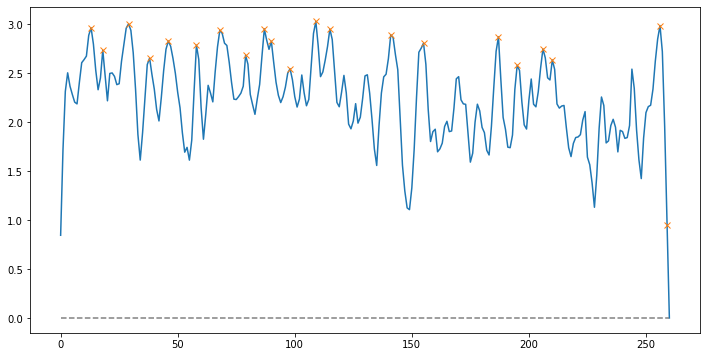

Peak count: 21
Frame tokens: 말했다. 되잖소. ” 거기에는 있었다. 생각되었다. 받았다. 있었다. 것이었다. 말했다. 사건의 해보게. “잘 되겠네. 알렸지요. 있네. 아마 것이지. 알아봤네. 직감했지. 거야. 

Similarity : 0.444114705593355
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, Generator / grammar loss:-0.20805330574512482   similarity loss:-0.10906215012073517


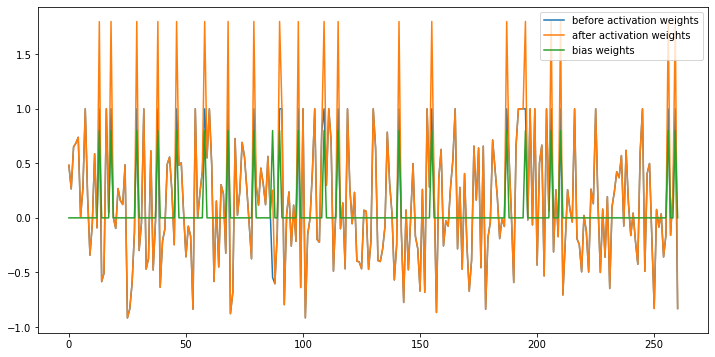

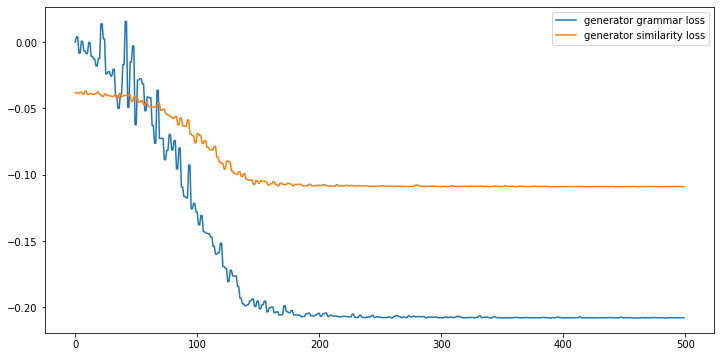

--------------------------------------------------
summary:
없는 말했다. 품질 되잖소. ” 좀 거기에는 있었다. 말은 생각되었다. 입을 받았다. 있었다. 말했다. “크롬, 사건의 점을 또 해보게. 크롬 “잘 부모님에게는 심문은 되겠네. 그녀한테도 알렸지요. 함께 있네. 페이지가 펼쳐져 있었지. 아마 듯 흔적은 있는 것이지. 알아봤네. 일어나 대령이라는 대령이 직감했지. 거야.
--------------------------------------------------
         method  comp ratio     intro  ...       var     total   grammar
0      SAM+WGAN    0.170335  0.512222  ...  0.001092  0.554488  0.995744
1  BERT+LexRank    0.250718  0.079606  ...  0.001881  0.148228  0.999898
2          BESM    0.244019  0.419982  ...  0.002722  0.429419  0.999906
3   BESM+kobert    0.253589  0.518237  ...  0.007711  0.493383  0.999747

[4 rows x 8 columns]
Current result ==================================================
         method  comp rate     intro  ...   isthmus  simlirality  grammarity
0      SAM+WGAN   0.176439  0.532162  ...  0.003366     0.544377    0.995751
1  BERT+LexRank   0.254129  0.173044  ...  0.003844     0.190844    0.999900
2          BESM   0.224536

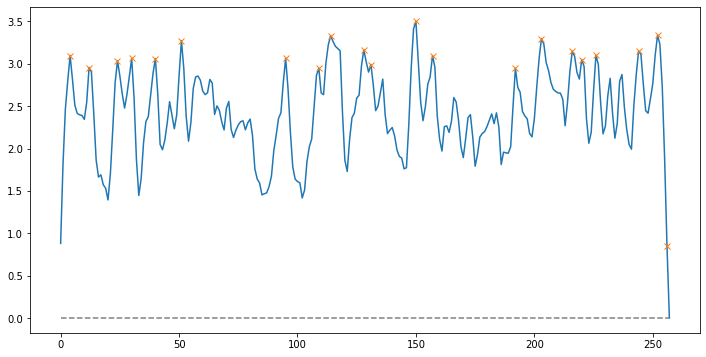

Peak count: 21
Frame tokens: 잘했네. 왔거든. 이건 있네. 있지. 말일세. 걸세. 어쨌든 ” 켈서, 가세. 가보지요. 모양이었다. 포아로 생각됩니다만. 같군요. 말했다. ‘ 알맞지요. “그럼, 출발했다. 

Similarity : 0.5005945386330736
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, Generator / grammar loss:-0.21991156041622162   similarity loss:-0.12851135432720184


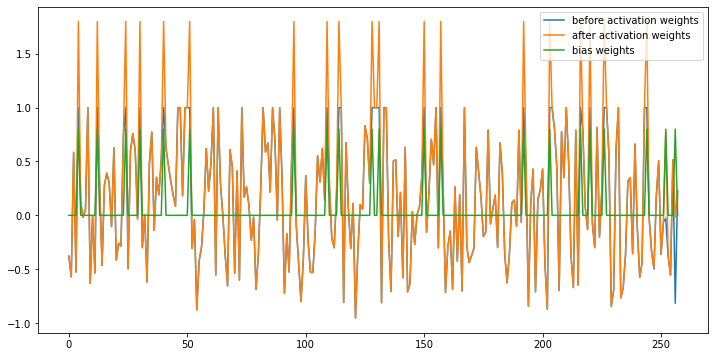

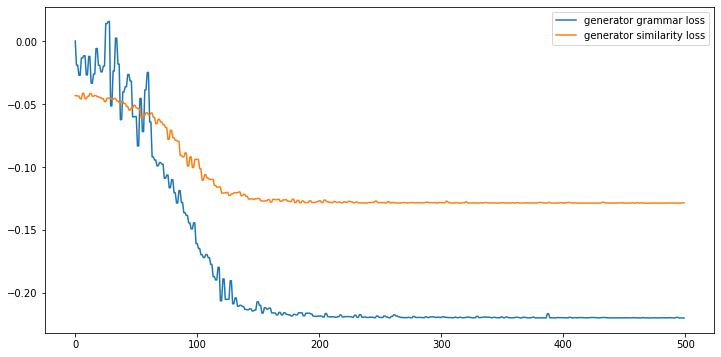

--------------------------------------------------
summary:
잘했네. 바로 왔거든. 이건 있네. 있지. 어쩌다 몇 차이는 있을지라도 말일세. 이 기질이지요. 없습니까?” 어젯밤 흰 여자를 걸세. 어쨌든 ” “알겠습니다. 켈서, 자네도 함께 가세. 카터 경감이 가보지요. 내키지 모양이었다. 사람들이 포아로 생각됩니다만. ‘ 필요는 같군요. 말했다. ‘ “그렇지요. 만일 곡 알맞지요.
--------------------------------------------------
         method  comp ratio     intro  ...       var     total   grammar
0      SAM+WGAN    0.177866  0.516829  ...  0.000246  0.538349  0.998460
1  BERT+LexRank    0.292490  0.205309  ...  0.003733  0.136264  0.999905
2          BESM    0.181818  0.445523  ...  0.000360  0.472225  0.998320
3   BESM+kobert    0.181818  0.445523  ...  0.000360  0.472225  0.998320

[4 rows x 8 columns]
Current result ==================================================
         method  comp rate     intro  ...   isthmus  simlirality  grammarity
0      SAM+WGAN   0.176474  0.531779  ...  0.003288     0.544227    0.995819
1  BERT+LexRank   0.255088  0.173851  ...  0.003841     0.189480    0.999900
2          BESM   0.2234

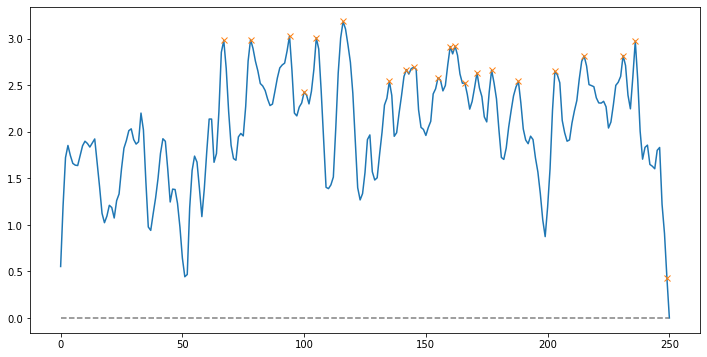

Peak count: 21
Frame tokens: 여주인은 “미스……저……메리언이지요?” 큰일이에요. 정말 ” 여자였다. 있었다. “인기가 두고 테니까요. “견딜 없어요. 없어요. ” 있었다. 말했다. ” 친절하고. 말했다. 아가씨였어요. 닫지요. 

Similarity : 0.5461645026439341
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, Generator / grammar loss:-0.2252296358346939   similarity loss:-0.11253443360328674


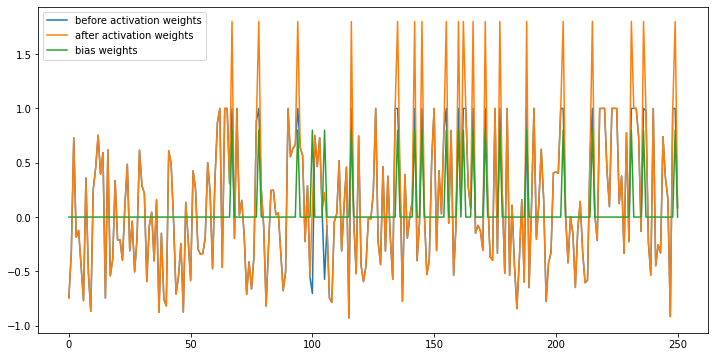

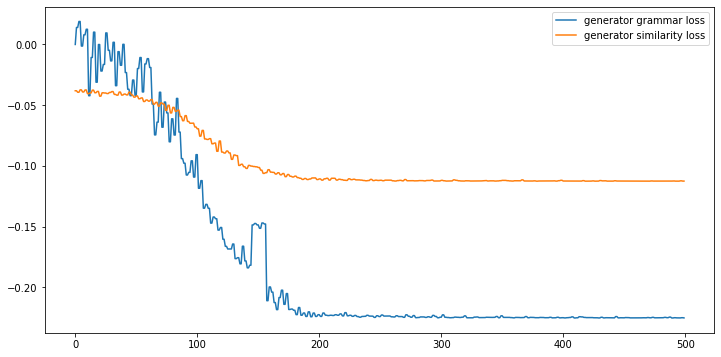

--------------------------------------------------
summary:
마침 준비되어 있는 여주인은 우리를 “미스……저……메리언이지요?” 그래요. 큰일이에요. 여자였다. 그대로였다. 만지고 있었다. “인기가 두고 낼 테니까요. “견딜 없어요. 정말 없어요. ” 눈은 있었다. 대해 말했다. 없어요. 돼요. ” 친절하고. 물었다. “아름다웠겠지요, 물론?” 메리언이 정말 외국사람이란 말했다. “기분 좋은 아가씨였어요. 물었다. 가게문을 닫지요.
--------------------------------------------------
         method  comp ratio     intro  ...       var     total   grammar
0      SAM+WGAN    0.201355  0.508317  ...  0.002402  0.574715  0.996377
1  BERT+LexRank    0.278800  0.162806  ...  0.003687  0.101533  0.999885
2          BESM    0.294288  0.522433  ...  0.008357  0.402319  0.999889
3   BESM+kobert    0.294288  0.522433  ...  0.008357  0.402319  0.999889

[4 rows x 8 columns]
Current result ==================================================
         method  comp rate     intro  ...   isthmus  simlirality  grammarity
0      SAM+WGAN   0.177081  0.531207  ...  0.003267     0.544970    0.995832
1  BERT+LexRank   0.255667  0.173582  ...  0.003837     0.187335    0.999

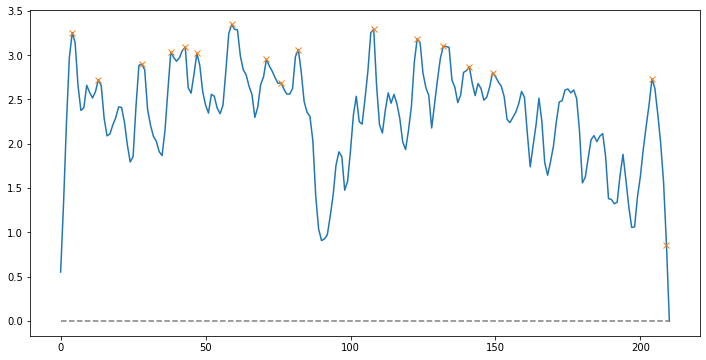

Peak count: 17
Frame tokens: 주문이 떨었다. “그 않았습니까?” “아니오, 아니었어요. ” 않았습니까?” “거기에 ” “버너드 ” ” 말이에요?” ” 들어왔다. 말했다. 

Similarity : 0.44935158398380837
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, Generator / grammar loss:-0.1280457079410553   similarity loss:-0.09864619374275208


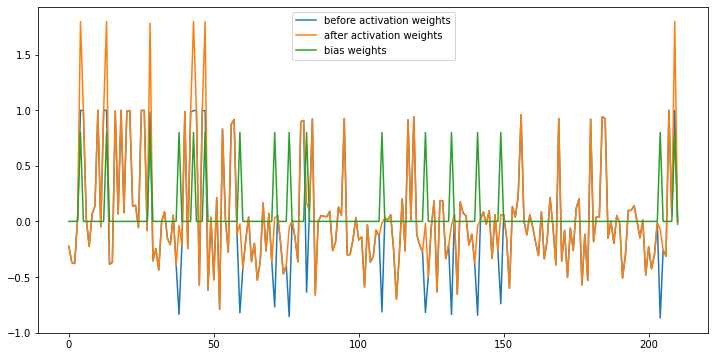

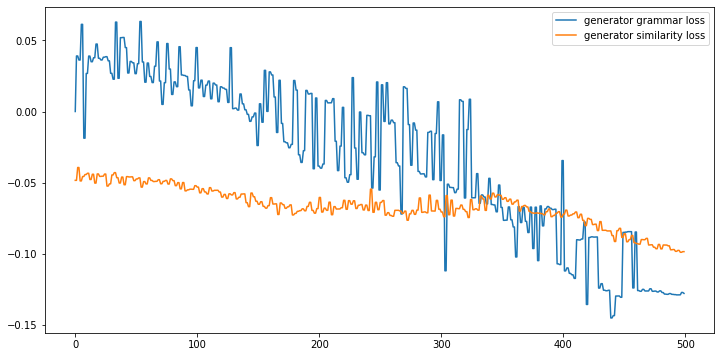

--------------------------------------------------
summary:
주문이 없으니가요. 이때 몸을 떨었다. 7시나 따라서는 늦게까지도 계시지만, 6시 30분까지예요. “그 메리언은 말했다. “아니오, 우리는 사이가 아니었어요. 않았습니까? 비슷한 일이라도?” 수 없어요. 몇 끝 “히글리 말인가요?그녀는 대로 진저 형사가 거만스럽던 태도를 들이마시듯 말했다.
--------------------------------------------------
         method  comp ratio     intro  ...       var     total   grammar
0      SAM+WGAN    0.186636  0.727859  ...  0.014915  0.538413  0.993248
1  BERT+LexRank    0.306452  0.256118  ...  0.000252  0.231144  0.999890
2          BESM    0.271889  0.321719  ...  0.001183  0.381789  0.999905
3   BESM+kobert    0.271889  0.321719  ...  0.001183  0.381789  0.999905

[4 rows x 8 columns]
Current result ==================================================
         method  comp rate     intro  ...   isthmus  simlirality  grammarity
0      SAM+WGAN   0.177309  0.535889  ...  0.003544     0.544814    0.995771
1  BERT+LexRank   0.256876  0.175547  ...  0.003752     0.188378    0.999899
2          BESM   0.226307  0.461043  ... 

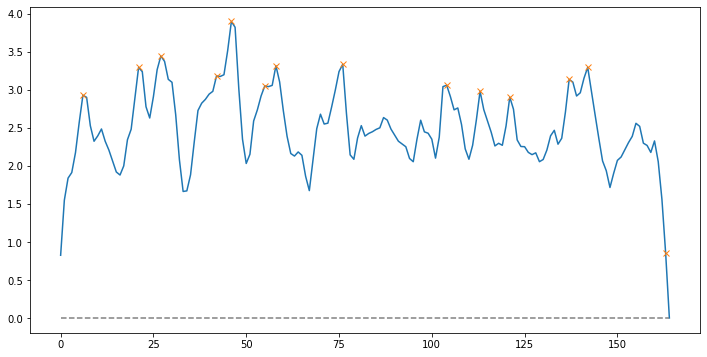

Peak count: 14
Frame tokens: ” 이런 무서워요. ‘정말이지 않아. 도저히 없어’라고요. 않아요. 편이었어요. 아니었어요. 없었지요. 않았지요. 않았어요. 상대였다. 

Similarity : 0.46286973107221274
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, Generator / grammar loss:-0.2242783159017563   similarity loss:-0.14860735833644867


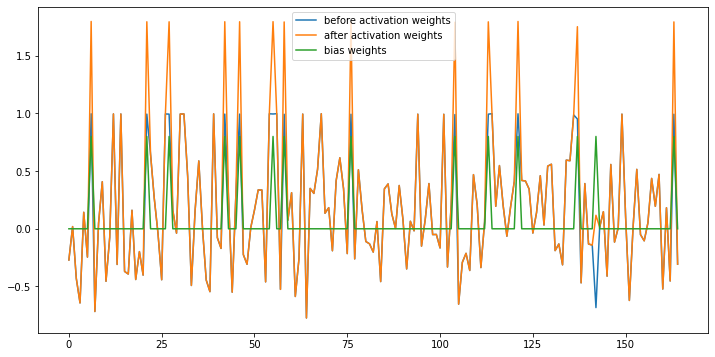

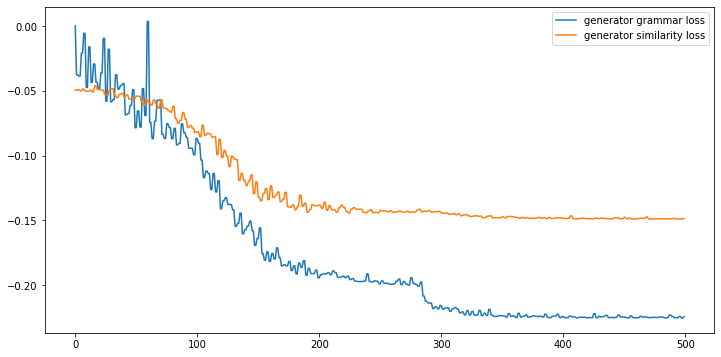

--------------------------------------------------
summary:
” “일리저버스 알지요?” 이런 정말 무서워요. 않아요. 저는 수 ‘정말이지 않아. 살해되다니! 도저히 믿을 없어’라고요. 깨어날지도 꼬집어 않아요. 이번 애는 편이었어요. 아니었어요. 그렇다고 없었지요. 보이지 않았지요. 형사는 상대였다.
--------------------------------------------------
         method  comp ratio     intro  ...       var     total   grammar
0      SAM+WGAN    0.198813  0.454043  ...  0.002724  0.533056  0.994885
1  BERT+LexRank    0.373887  0.329350  ...  0.001278  0.291184  0.999911
2          BESM    0.071217  0.284679  ...  0.000430  0.272294  0.999890
3   BESM+kobert    0.071217  0.284679  ...  0.000430  0.272294  0.999890

[4 rows x 8 columns]
Current result ==================================================
         method  comp rate     intro  ...   isthmus  simlirality  grammarity
0      SAM+WGAN   0.177809  0.533986  ...  0.003525     0.544541    0.995750
1  BERT+LexRank   0.259597  0.179124  ...  0.003695     0.190769    0.999899
2          BESM   0.222701  0.456942  ...  0.004726     0.446094    0.

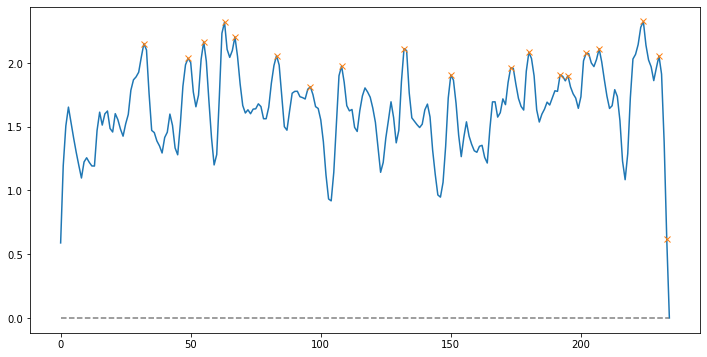

Peak count: 19
Frame tokens: 친하게 있었다. 다니지만, 히글리 모르지만 그녀의 일리저버스 히글리 만나 벡스힐에서 얼마쯤 버너드 남자였다. 오는 있었다. 들어오십시오. 오셨지요. 듯 경찰국에서? 

Similarity : 0.4518713557971886
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, Generator / grammar loss:-0.21083427965641022   similarity loss:-0.09784841537475586


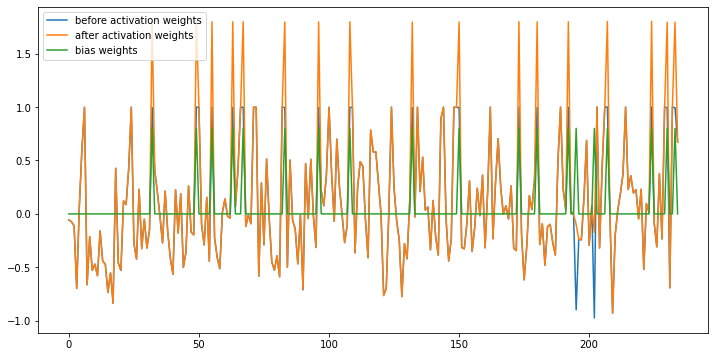

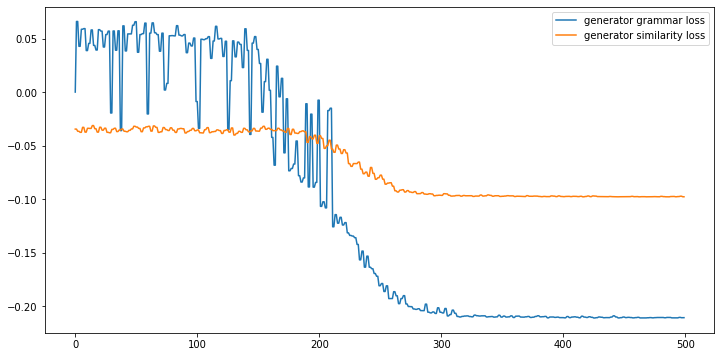

--------------------------------------------------
summary:
그것을 히글리보다 친하게 있었다. 그는 다니지만, 히글리 이름은 모르지만 있다. 잘생긴……그렇다, 분명 그녀의 일리저버스 밤 히글리 양의 새 만나 그 대해 않았고, 어젯밤 벡스힐에서 부모는 얼마쯤 버너드 듯한 남자였다. 그는 안으로 들어오십시오. “이 오셨지요. 느끼는 듯 “런던 경찰국에서?
--------------------------------------------------
         method  comp ratio     intro  ...       var     total   grammar
0      SAM+WGAN    0.175836  0.423829  ...  0.007826  0.484961  0.994317
1  BERT+LexRank    0.267530  0.236298  ...  0.000052  0.234959  0.999904
2          BESM    0.396980  0.587006  ...  0.019966  0.520524  0.999900
3   BESM+kobert    0.374326  0.574139  ...  0.022168  0.492043  0.999901

[4 rows x 8 columns]
Current result ==================================================
         method  comp rate     intro  ...   isthmus  simlirality  grammarity
0      SAM+WGAN   0.177764  0.531482  ...  0.003623     0.543187    0.995718
1  BERT+LexRank   0.259777  0.180423  ...  0.003612     0.191773    0.999899
2          BESM   0.226662  0.459898  ...

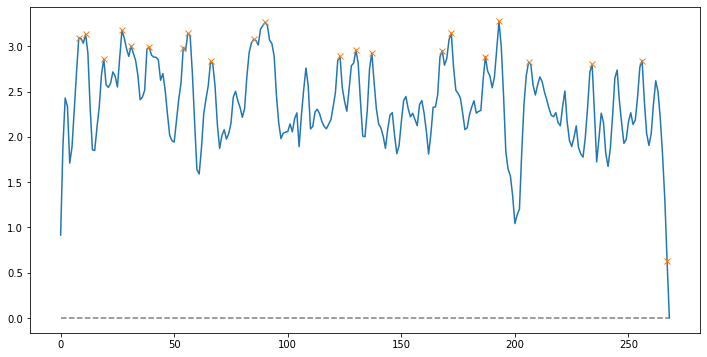

Peak count: 22
Frame tokens: 합니다. 딸……. “그리고 그리고 말했다. “만나 너무나 받아서……. 나타냈다. 말했다. 잘됐소. ” 너무해요! ” “정말 무어라 ” “그러시겠지요. 그렇습니다. ” “우리는 자거든요. 

Similarity : 0.4863612704653517
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, Generator / grammar loss:-0.2079797089099884   similarity loss:-0.12533029913902283


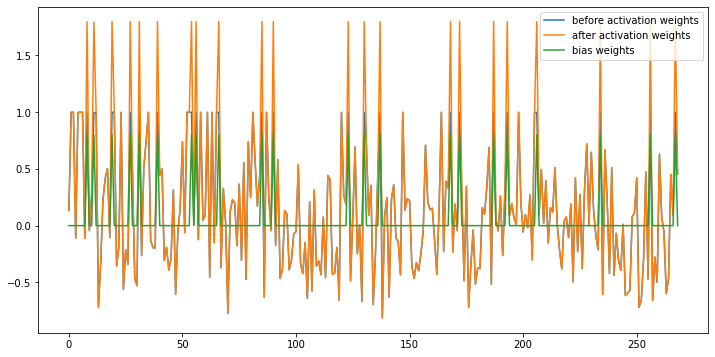

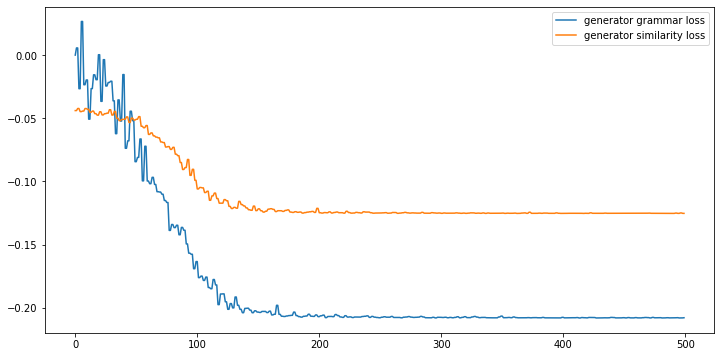

--------------------------------------------------
summary:
고마운 일입니다. 살인범을 어떻게든 꼭 합니다. 딸……. ” “그리고 이분은 씨. 그리고 말했다. 버너드 “만나 잘 모르겠습니다. 너무나 받아서……. 그러나 거실로 버너드 모습을 나타냈다. 걸음으로 말했다. 당신 잘됐소. 와서 ” 너무해요! ” 그녀가 알아차렸다. “정말 무어라 ” “그러시겠지요. 함께 “네, 그렇습니다. ” “우리는 자거든요.
--------------------------------------------------
         method  comp ratio     intro  ...       var     total   grammar
0      SAM+WGAN    0.173405  0.638031  ...  0.010457  0.539091  0.998163
1  BERT+LexRank    0.238994  0.114750  ...  0.018881  0.176704  0.999904
2          BESM    0.233603  0.557010  ...  0.001746  0.537880  0.999305
3   BESM+kobert    0.336029  0.560879  ...  0.002591  0.558838  0.999505

[4 rows x 8 columns]
Current result ==================================================
         method  comp rate     intro  ...   isthmus  simlirality  grammarity
0      SAM+WGAN   0.177667  0.533850  ...  0.003775     0.543095    0.995772
1  BERT+LexRank   0.259315  0.178964  ...  0.003951     0.191438    0.999900
2          

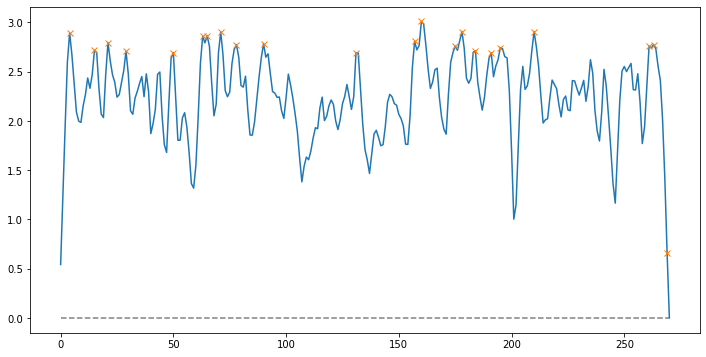

Peak count: 22
Frame tokens: 그래서 그리고……그리고……. “따님은 말했다. ” 언제나 했습니다. ” 않아서……. 아주 번이었지요. 그러나 베티는. “정신 진정하오. ” ” 되풀이했다. 그러나 “맞습니다, 씨. 있습니다. 

Similarity : 0.49100053714130065
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, Generator / grammar loss:-0.18451757729053497   similarity loss:-0.11127971112728119


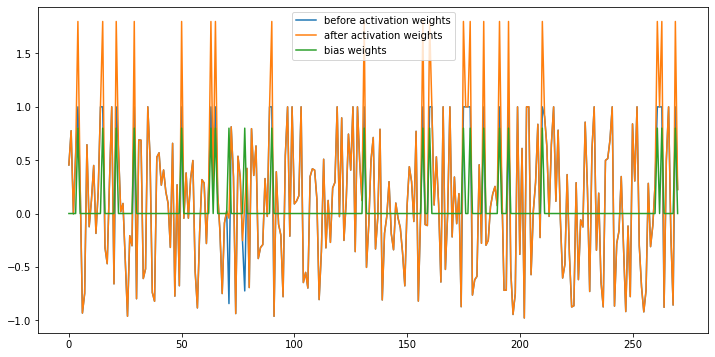

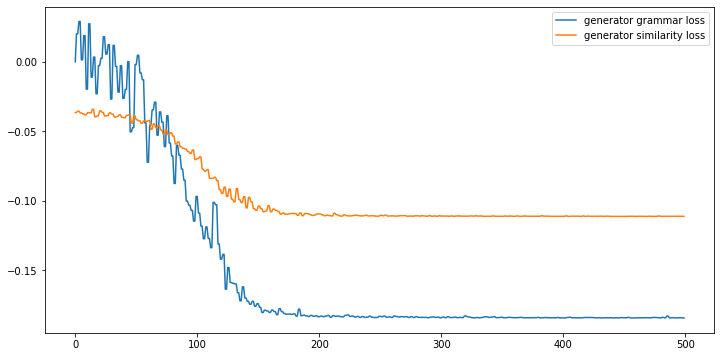

--------------------------------------------------
summary:
그래서 와서, 그리고……그리고……. 울기 “따님은 말했다. 형사님. ” 언제나 했습니다. 좋아했어요. 아주 알면 어떻게 못했겠지요, 뒤 밤은 한 번이었지요. 그러나 베티는. 아, 일이에요. 부인은 “정신 차려요, 여보. 진정하오. ” ” 되풀이했다. ” 쪽을 보았다. 그러나 이런 젊은이와 말했었습니다만. 없습니다. “맞습니다, 버너드 씨. 확인하고 있습니다.
--------------------------------------------------
         method  comp ratio     intro  ...       var     total   grammar
0      SAM+WGAN    0.179304  0.518131  ...  0.003067  0.600580  0.993079
1  BERT+LexRank    0.254237  0.241447  ...  0.002677  0.169192  0.999912
2          BESM    0.100803  0.201443  ...  0.001866  0.250424  0.999896
3   BESM+kobert    0.100803  0.201443  ...  0.001866  0.250424  0.999896

[4 rows x 8 columns]
Current result ==================================================
         method  comp rate     intro  ...   isthmus  simlirality  grammarity
0      SAM+WGAN   0.177703  0.533508  ...  0.003759     0.544345    0.995713
1  BERT+LexRank   0.259205  0.180322  ...  0.003923     0.190955    0.999900
2  

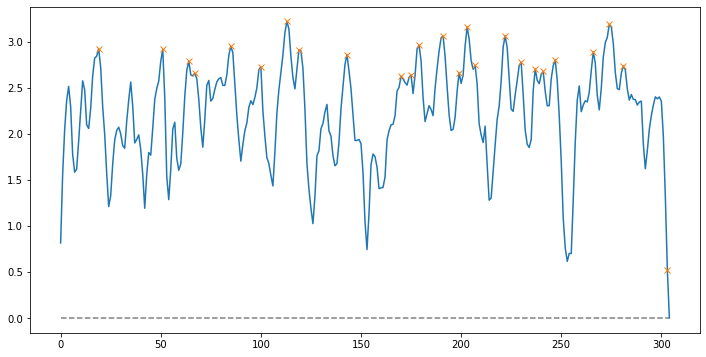

Peak count: 25
Frame tokens: 오십시오. 튀어나왔다. 그리고 내가 그녀는 내 그러나 “네, 그녀의 모난 그녀는 평범했다. 물었다. 그렇다고 ” 가로막았다. ” “이렇게 만일 ” 둘러보았다. ” 오세요. . 닫았다. 

Similarity : 0.49331181984020556
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, Generator / grammar loss:-0.20226812362670898   similarity loss:-0.11297734081745148


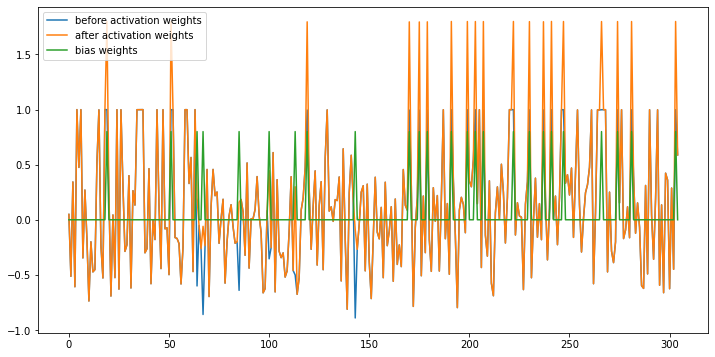

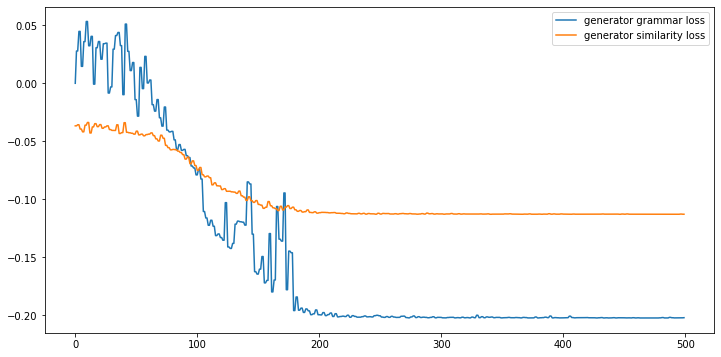

--------------------------------------------------
summary:
싶군요. 편지라든지 일어서면서 이쪽으로 오십시오. 크롬 바로 내가 따랐다. 내가 구두끈을 대 와 튀어나왔다. 그녀는 슈트케이스를 들고 달려왔다. “네, 모자를 모난 그녀는 평범했다. 그녀를 물었다. 그렇다고 ” 내 가로막았다. 아이였어요. 미안합니다. ” “이렇게 만일 ” 주위를 둘러보았다. 사람들에게 계신데 크신 모양입니다. ” 그녀는 마음을 오세요. 그녀는 . 내가 뜻밖에도 닫았다.
--------------------------------------------------
         method  comp ratio     intro  ...       var     total   grammar
0      SAM+WGAN    0.176710  0.618962  ...  0.002981  0.541214  0.996503
1  BERT+LexRank    0.256515  0.100989  ...  0.000936  0.107131  0.999894
2          BESM    0.206026  0.484105  ...  0.001661  0.438836  0.999868
3   BESM+kobert    0.238599  0.568736  ...  0.009473  0.435055  0.999875

[4 rows x 8 columns]
Current result ==================================================
         method  comp rate     intro  ...   isthmus  simlirality  grammarity
0      SAM+WGAN   0.177681  0.535326  ...  0.003743     0.544279    0.995730
1  BERT+LexRank   0.259148  0.178634  ...  0.003860     0.189171

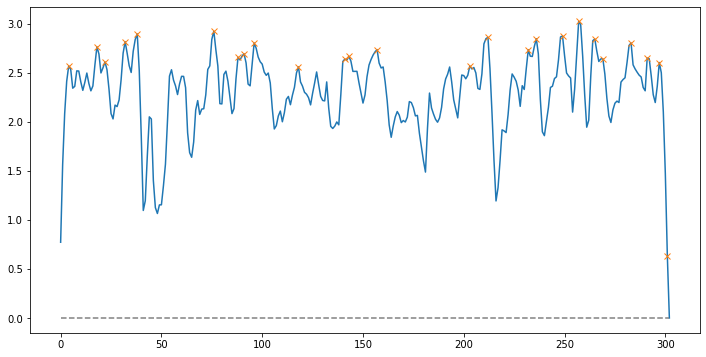

Peak count: 25
Frame tokens: 말했다. 듯한 “이야기는 “그리 좋습니다. “아가씨, 그러나 그리 실제로 나는 알고 말했겠지요. 그녀는 그러면 진실이지요. 했다. 바보였어요. 그 놀라웠다. 아가씨, 사람입니다. 하지만 아니었어요. 타일렀지요. 아니겠어요. 

Similarity : 0.49755021373406916
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, Generator / grammar loss:-0.2090282142162323   similarity loss:-0.12039419263601303


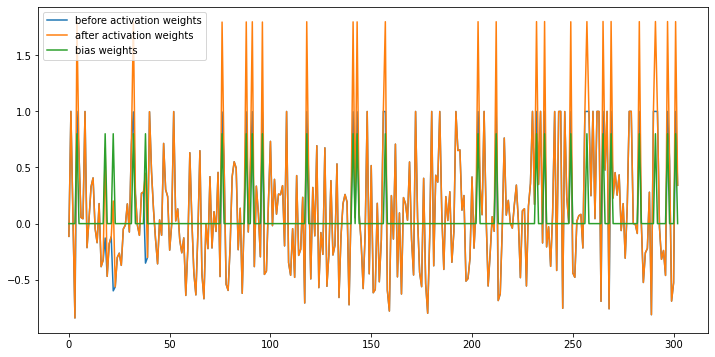

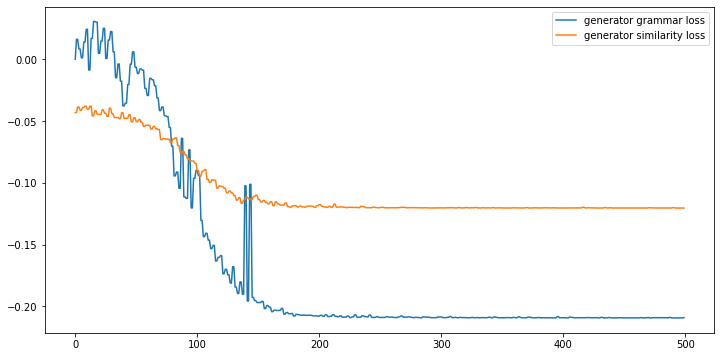

--------------------------------------------------
summary:
가볍게 말했다. 말했다. “그리 그녀는 연기를 “아가씨, 그러나 그리 실제로 죽음이란 나는 알고 말했겠지요. 젊은 일입니다. 그녀는 없었다. 위대한 지금 버너드를 그러면 되는 진실이지요. 깜짝 했다. 처치 바보였어요. > 버너드의 말은 깜짝 그 또한 놀라웠다. 그러나 진지하게 숙여 보였다. 아가씨, 아주 사람입니다. 했다. “저는 하지만 장님은 아니었어요. 게다가 타일렀지요. 아니겠어요.
--------------------------------------------------
         method  comp ratio     intro  ...       var     total   grammar
0      SAM+WGAN    0.181515  0.517591  ...  0.002554  0.567510  0.993934
1  BERT+LexRank    0.223147  0.198016  ...  0.001872  0.178967  0.999906
2          BESM    0.220649  0.496313  ...  0.005895  0.459881  0.999896
3   BESM+kobert    0.217319  0.542795  ...  0.007155  0.476767  0.999894

[4 rows x 8 columns]
Current result ==================================================
         method  comp rate     intro  ...   isthmus  simlirality  grammarity
0      SAM+WGAN   0.177761  0.534957  ...  0.003718     0.544763    0.995693
1  BERT+LexRank   0.258398  0.179038  ...  0.003818     0.18895

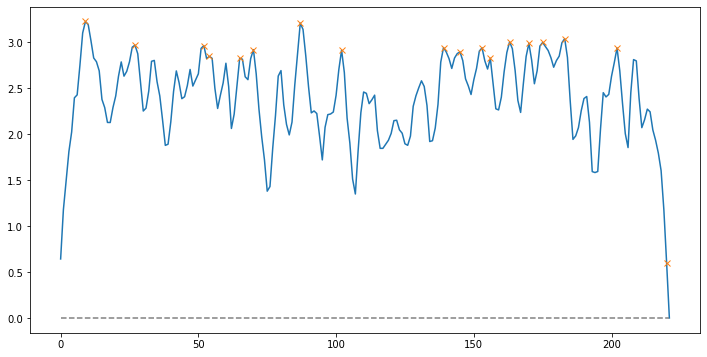

Peak count: 18
Frame tokens: 말했다. “내가 그건 해요. 아니었어요. 다만 거예요. 있었다. 장난기 할 포아로는 말했다. ” 전 그녀는 얼굴이었다. 하지만 있었다. 

Similarity : 0.49620914394500926
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, Generator / grammar loss:-0.21648617088794708   similarity loss:-0.1230214536190033


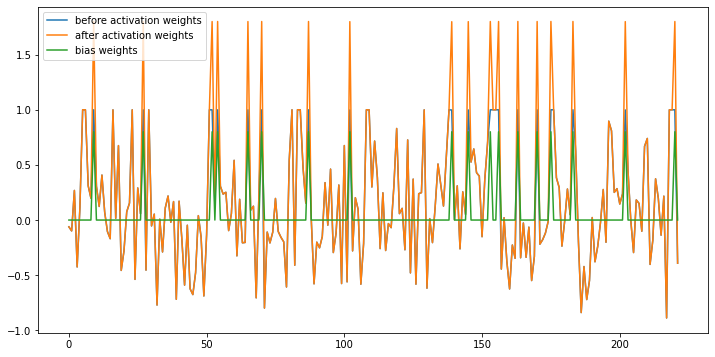

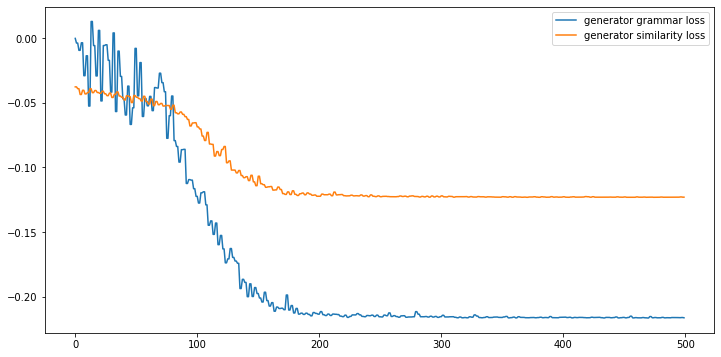

--------------------------------------------------
summary:
조금이나마 새겨들었습니까?” 말했다. 정확하게 슬며시 “내가 당신이 없었어요. 그건 해요. 아니었어요. 다만 입에 말이며 달콤한 거예요. 있었다. 놓인 데로 머리는 있었다. 장난기 할 포아로는 그것을 돌려주며 말했다. ” 전 그녀는 그런 얼굴이었다. 하지만 똑바로 지켜보고 있었다.
--------------------------------------------------
         method  comp ratio     intro  ...       var     total   grammar
0      SAM+WGAN    0.165089  0.585734  ...  0.003629  0.550227  0.996451
1  BERT+LexRank    0.311251  0.186721  ...  0.000568  0.226136  0.999913
2          BESM    0.272345  0.374759  ...  0.008225  0.464838  0.999897
3   BESM+kobert    0.272345  0.374759  ...  0.008225  0.464838  0.999897

[4 rows x 8 columns]
Current result ==================================================
         method  comp rate     intro  ...   isthmus  simlirality  grammarity
0      SAM+WGAN   0.177503  0.535993  ...  0.003716     0.544874    0.995708
1  BERT+LexRank   0.259476  0.179195  ...  0.003752     0.189717    0.999900
2          BESM   0.224623  0.456105  ...  0.00

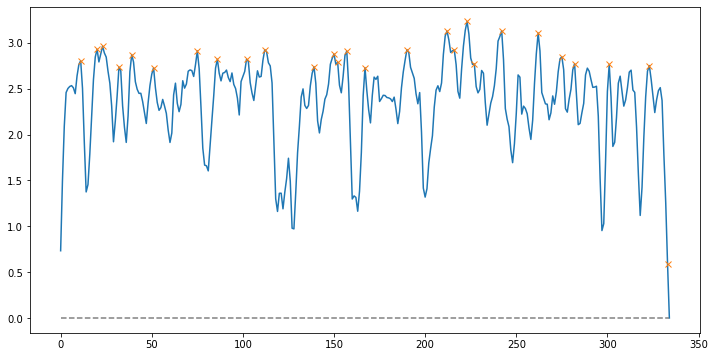

Peak count: 27
Frame tokens: 보였다. 그렇게 그는 있었거든요. 그녀는 그 됩니다. 말했다. 아가씨. 않는 없었다. “그게 사실인가요, ” ” 없습니다. “당신을 이야기하지요. 성품이지요. 잘 있지요. 있었어요. 아니었어요. 그래요, 돌아다녔어요. 그렇다고 없었어요. 

Similarity : 0.491089196324878
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, Generator / grammar loss:-0.20947661995887756   similarity loss:-0.12075928598642349


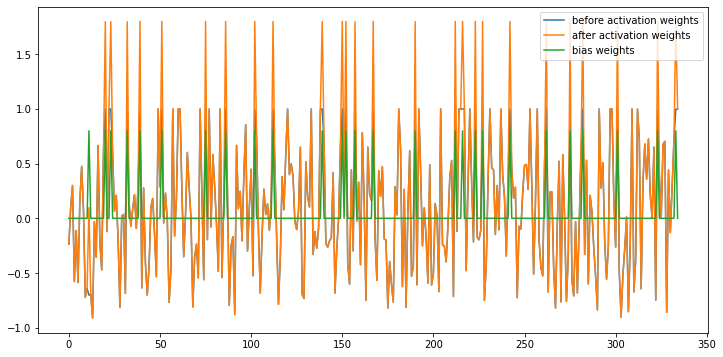

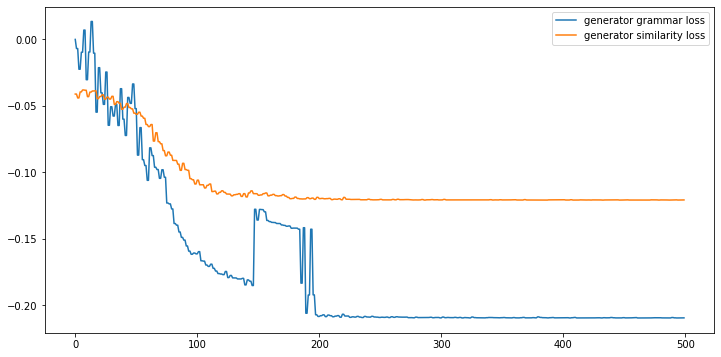

--------------------------------------------------
summary:
그렇게 가엾으니까요. 그는 있었거든요. 그녀는 눈길로 그 거만한 무엇이 섞여 있지 됩니다. 그녀는 몸을 말했다. 아가씨. 않는 이야기며, 아가씨 필요는 없었다. “그게 사실인가요, ” ” 말에 없습니다. “네, 많은 “당신을 모두 사실대로 이야기하지요. 아까도 조용한 성품이지요. 잘 있어요. 세심하게 있지요. 베티에게 물론 있었어요. 아니었어요. 그래요, 그것을 캣>에서 일하며 돌아다녔어요. 누가 되받아요. 그렇다고 없었어요. 
--------------------------------------------------
         method  comp ratio     intro  ...       var     total   grammar
0      SAM+WGAN    0.174259  0.543608  ...  0.000707  0.573874  0.996987
1  BERT+LexRank    0.207520  0.125356  ...  0.002949  0.147245  0.999908
2          BESM    0.225597  0.559361  ...  0.002580  0.509973  0.999902
3   BESM+kobert    0.184382  0.709007  ...  0.014177  0.497229  0.999904

[4 rows x 8 columns]
Current result ==================================================
         method  comp rate     intro  ...   isthmus  simlirality  grammarity
0      SAM+WGAN   0.177438  0.536145  ...  0.003656     0.545454    0.995734
1  BERT+LexRank   0.258437  0.178118  ..

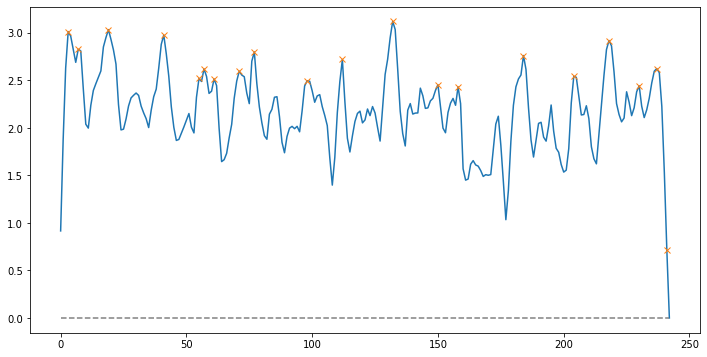

Peak count: 20
Frame tokens: 좋아했을 말했었지요. 거라고요. 만일 그래서 번 싸웠지요. 사람에게 굉장했어요. 몹시 그때였어요. 아니겠지만, 됐어요. 거였어요. 거였어요. 마음에 언젠가, ” 신중하게 끄덕였다. 

Similarity : 0.5070147079956934
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, Generator / grammar loss:-0.1870049685239792   similarity loss:-0.12475625425577164


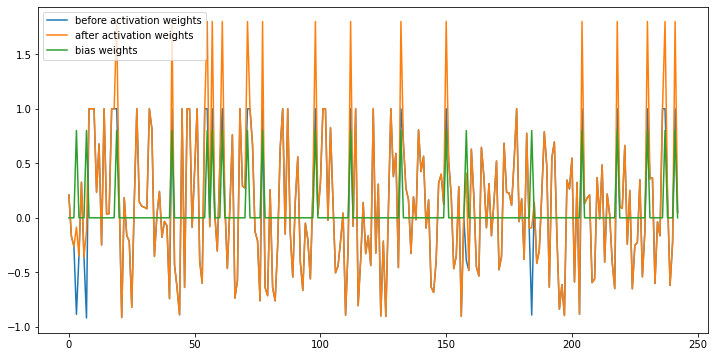

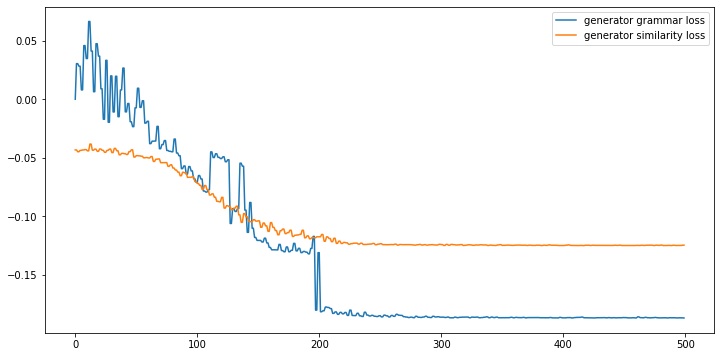

--------------------------------------------------
summary:
언젠가는 돈과 함께 할 동안 즐기는 거라고요. 말했다. ” 만일 어째서 남자와 어울리고 알 거예요. 그래서 번 싸웠지요. 않았다는 사람에게 흔히 굉장했어요. 말았어요. “그게 몹시 전 일이었어요. 그때였어요. 베티에게 자기에게 했어요. 아니겠지만, 됐어요. 간 마음에 언젠가, ” 그는 신중하게 끄덕였다.
--------------------------------------------------
         method  comp ratio     intro  ...       var     total   grammar
0      SAM+WGAN    0.178947  0.724596  ...  0.010975  0.576538  0.990952
1  BERT+LexRank    0.345263  0.138324  ...  0.010773  0.297098  0.999899
2          BESM    0.370526  0.476464  ...  0.005484  0.595813  0.999500
3   BESM+kobert    0.324211  0.283432  ...  0.019293  0.503136  0.999898

[4 rows x 8 columns]
Current result ==================================================
         method  comp rate     intro  ...   isthmus  simlirality  grammarity
0      SAM+WGAN   0.177467  0.539840  ...  0.003800     0.546064    0.995640
1  BERT+LexRank   0.260140  0.177338  ...  0.003874     0.190990    0.999900
2          BESM   0.227503  0.4585

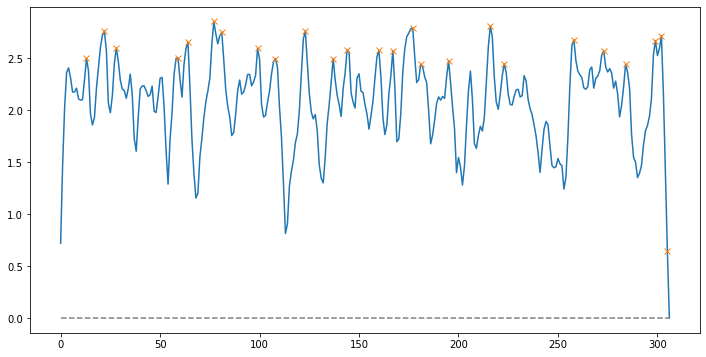

Peak count: 25
Frame tokens: 않았어요. 걱정했지요. 말예요. 잠시 말했다. “몰라요. ” 테니까요. 않아요. ” 생각해요. 없어했어요. 아니었어요. 울렸다. “돈이에요……. 말했다. ” 가엾어졌다. 몰라 말했다. ” 무너지듯 “마십시오, 기운이 테니까요. 

Similarity : 0.5228620624809652
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, Generator / grammar loss:-0.22099751234054565   similarity loss:-0.1083672046661377


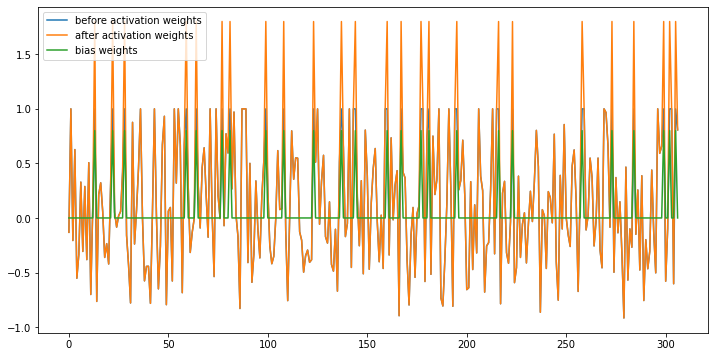

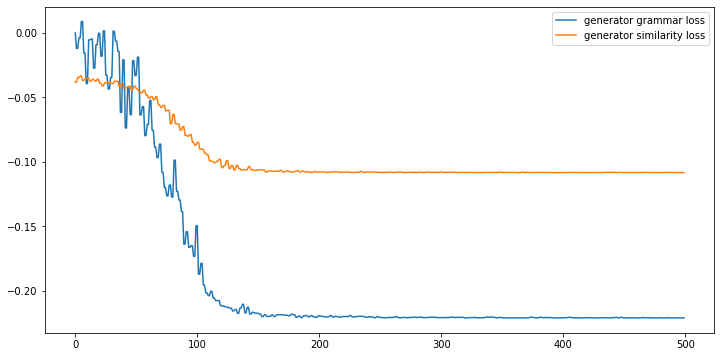

--------------------------------------------------
summary:
“그래서 않았어요. 걱정했지요. 말예요. 그러니 진짜로 어찌보면 미치광이 잠시 말했다. 만났는지 미건은 “몰라요. ” 또 만났다고는 생각되지 테니까요. 않아요. ” 누구에게 생각해요. 아이를 수 없어했어요. 성질이 아니었어요. 울렸다. “돈이에요……. ” 말했다. 형사님들 물어보고 있습니다. ” 돌아왔다. 보자 곧 가엾어졌다. 몰라 말했다. “어떻게 주오. ” 무너지듯 따라 “마십시오, 기운이 좀 테니까요.
--------------------------------------------------
         method  comp ratio     intro  ...       var     total   grammar
0      SAM+WGAN    0.184677  0.581202  ...  0.001280  0.561207  0.996836
1  BERT+LexRank    0.281452  0.216061  ...  0.009675  0.170184  0.999906
2          BESM    0.200000  0.459224  ...  0.000350  0.480998  0.999505
3   BESM+kobert    0.246774  0.459254  ...  0.000655  0.465461  0.999504

[4 rows x 8 columns]
Current result ==================================================
         method  comp rate     intro  ...   isthmus  simlirality  grammarity
0      SAM+WGAN   0.177606  0.540636  ...  0.003751     0.546355    0.995663
1  BERT+LexRank   0.260550  0.178082  ...  0.003986 

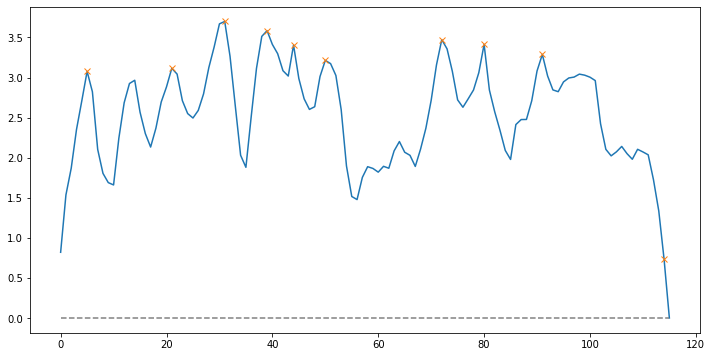

Peak count: 10
Frame tokens: 했다. 보았다. 말했다. “정말이에요, 물었다. “그래요. “그래요. 말했다. ” 모양이었다. 

Similarity : 0.47720184287593026
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, Generator / grammar loss:-0.2100507766008377   similarity loss:-0.14522776007652283


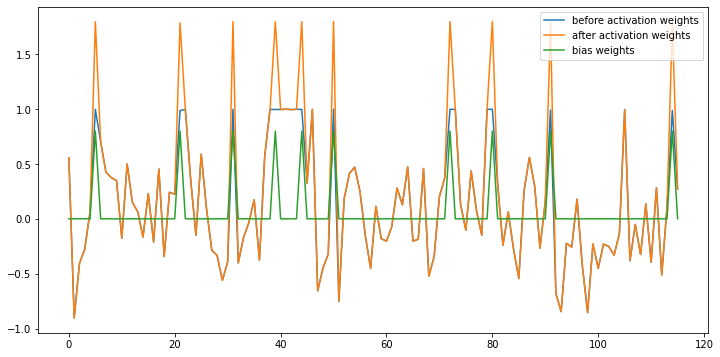

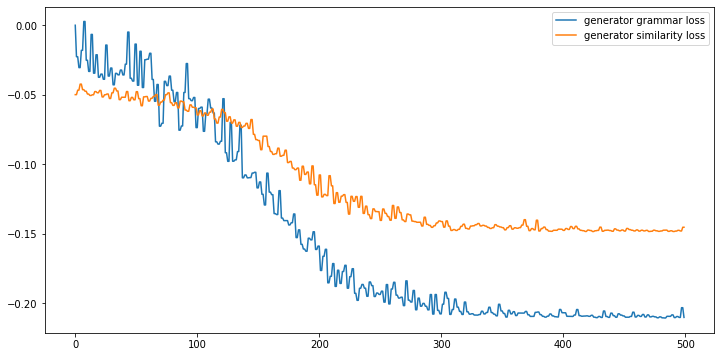

--------------------------------------------------
summary:
했다. 보았다. 그의 말했다. 대답했다. “정말이에요, 돈. ‘ 그는 기계적으로 물었다. 이제 “그래요. “그래요. ” 프레이저가 말했다. ” 많은 모양이었다.
--------------------------------------------------
         method  comp ratio     intro  ...       var     total   grammar
0      SAM+WGAN    0.190987  0.525051  ...  0.007274  0.530880  0.979351
1  BERT+LexRank    0.538627  0.147388  ...  0.001172  0.177357  0.999901
2          BESM    0.242489  0.250714  ...  0.004893  0.240587  0.999909
3   BESM+kobert    0.242489  0.250714  ...  0.004893  0.240587  0.999909

[4 rows x 8 columns]
Current result ==================================================
         method  comp rate     intro  ...   isthmus  simlirality  grammarity
0      SAM+WGAN   0.177859  0.540342  ...  0.003818     0.546063    0.995355
1  BERT+LexRank   0.265796  0.177503  ...  0.003933     0.190340    0.999900
2          BESM   0.227267  0.454621  ...  0.004828     0.446826    0.999508
3   BESM+kobert   0.233886  0.445746  

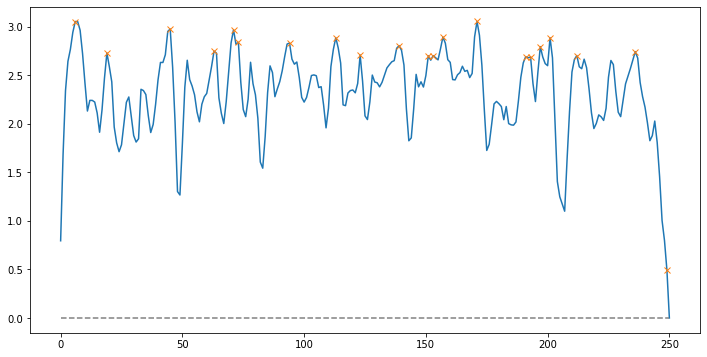

Peak count: 21
Frame tokens: 시작했다. 물었다. “저는……. 떨렸다. 포아로가 말했다. 말했다. 보았다. 말했다. 말했다. 그녀가 말했을 생각했습니다. 시작했습니다. “저는 의심한 하지만 의심스러웠습니다. 그리고 생각했습니다. 있었지요. 

Similarity : 0.48461225144768993
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, Generator / grammar loss:-0.21460340917110443   similarity loss:-0.12820670008659363


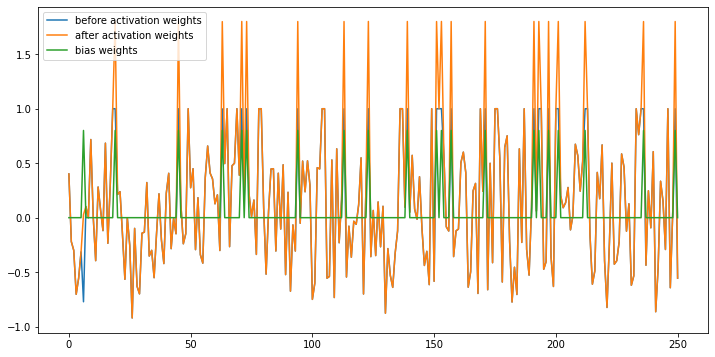

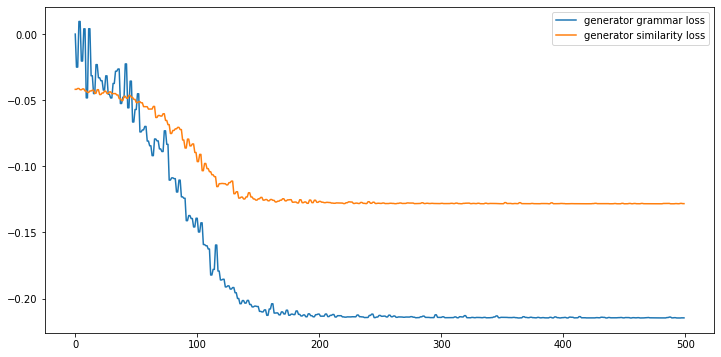

--------------------------------------------------
summary:
목소리로 물었다. “저는……. 피가 떨렸다. 화내는 거라고 포아로가 말했다. 그러니 진실을 말했다. 아니에요. 모조리 보았다. 말했다. 지나지 않았다. 말했다. 수 그녀가 그렇게 말했을 생각했습니다. 그렇습니다, 시작했습니다. 도널드 프레이저 걸고 “저는 의심한 것을 하지만 여전히 의심스러웠습니다. 그리고 실제로 금방 거라고 생각했습니다. 도착해서 있었지요.
--------------------------------------------------
         method  comp ratio     intro  ...       var     total   grammar
0      SAM+WGAN    0.184066  0.499366  ...  0.001384  0.535841  0.996827
1  BERT+LexRank    0.191392  0.192336  ...  0.003561  0.135232  0.999908
2          BESM    0.232601  0.539538  ...  0.000680  0.530597  0.999451
3   BESM+kobert    0.232601  0.539538  ...  0.000680  0.530597  0.999451

[4 rows x 8 columns]
Current result ==================================================
         method  comp rate     intro  ...   isthmus  simlirality  grammarity
0      SAM+WGAN   0.177974  0.539583  ...  0.003772     0.545873    0.995383
1  BERT+LexRank   0.264418  0.177778  ...  0.003926     0.189320    0.999901
2  

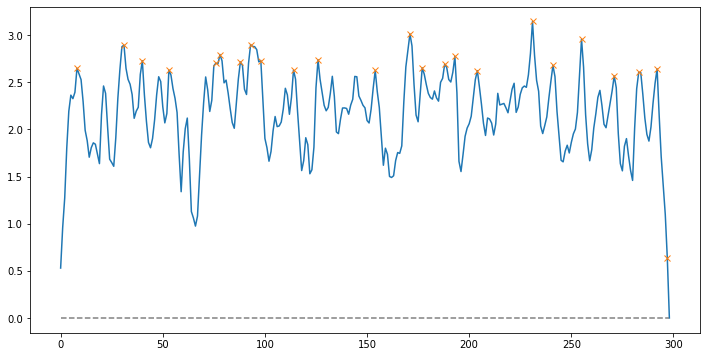

Peak count: 24
Frame tokens: ” 그러나 게다가 말투는 ” “모르겠습니다. ” 켈서 계셨군요. 소개했다. ” ” 나왔다. “뭘 않았다. 나왔다. ” 떠오른다. 등등. 열렸다. 했다. 일이다. 발표되었다. 끌었다. 

Similarity : 0.48022175996061534
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, Generator / grammar loss:-0.20567965507507324   similarity loss:-0.11527466773986816


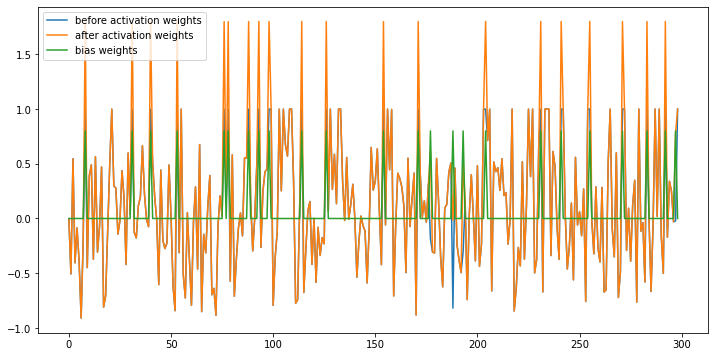

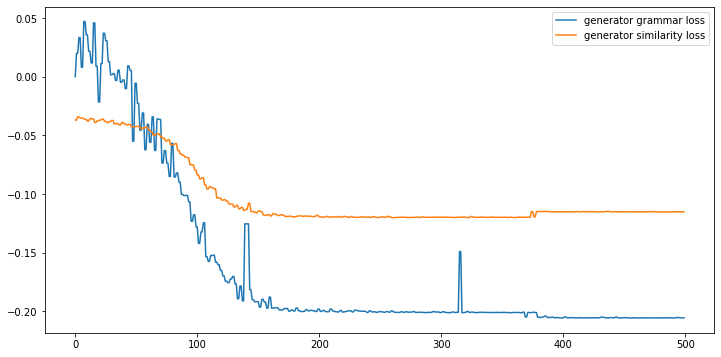

--------------------------------------------------
summary:
” 생각했습니다. 그러나 게다가 말투는 이야기하고 ” “모르겠습니다. ” 켈서 계셨군요. ” 밀쳐내고 포아로와 사람을 흘끔 소개했다. ” 나서 보며 말했다. ” 그렇습니까?” 크롬 나왔다. 헤이스팅즈. ” 그의 > 되새겨 거의 떠오른다. 회의, 포아로 방에서의 등등. 이 위해 열렸다. 이쪽이 했다. 우선 들끊는 일이다. 모두 날마다 발표되었다. 
--------------------------------------------------
         method  comp ratio     intro  ...       var     total   grammar
0      SAM+WGAN    0.161667  0.460013  ...  0.001754  0.530925  0.998305
1  BERT+LexRank    0.220833  0.233337  ...  0.001585  0.184748  0.999905
2          BESM    0.227500  0.546464  ...  0.005845  0.460011  0.999895
3   BESM+kobert    0.210833  0.504751  ...  0.000898  0.454188  0.999906

[4 rows x 8 columns]
Current result ==================================================
         method  comp rate     intro  ...   isthmus  simlirality  grammarity
0      SAM+WGAN   0.177677  0.538136  ...  0.003736     0.545602    0.995436
1  BERT+LexRank   0.263626  0.178788  ...  0.003883     0.189237    0.999901
2         

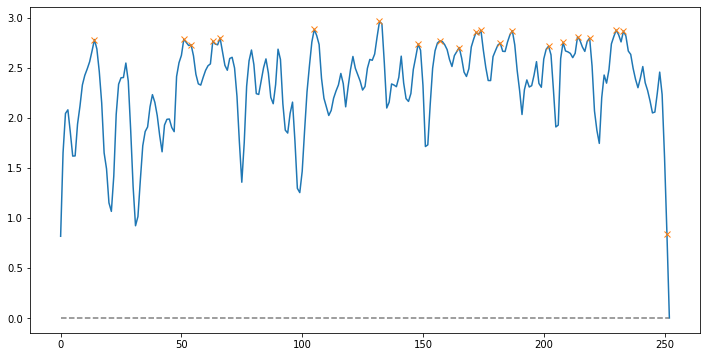

Peak count: 21
Frame tokens: 것이었다. 말했다. 합니다. 겁니다. 사실을 그렇습니다. 그는 생각합니다. 녀석이 녀석이 불러일으키고 겁니다. “그래서 녀석이 입을 “어렵군요, 이해관계가 ‘사실을 않을까요? 평판을 되지요. 

Similarity : 0.47342162388207176
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, Generator / grammar loss:-0.21085382997989655   similarity loss:-0.1355035901069641


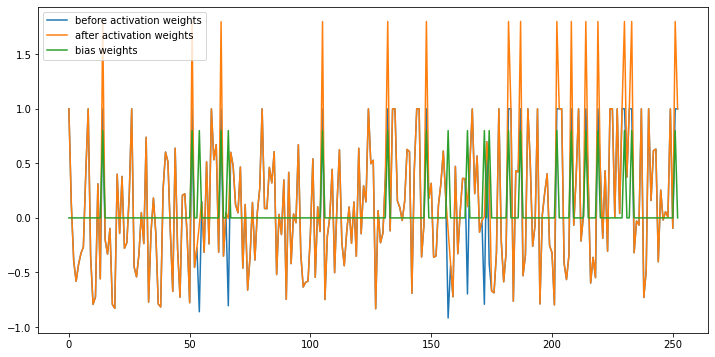

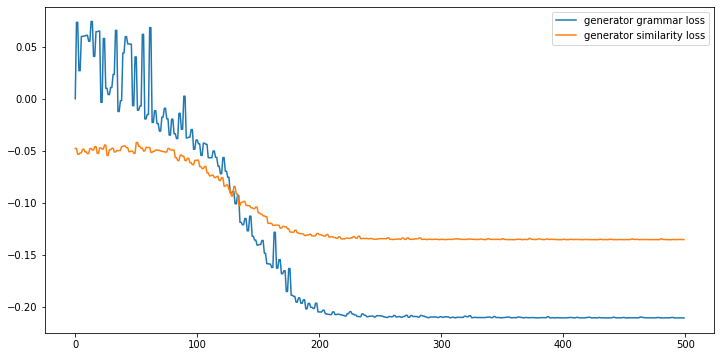

--------------------------------------------------
summary:
 가는 것이었다. 준다고도 말했다. 좋은 겁니다. 그러나 그렇습니다. 이미 그는 그 편지를 의견은 어떤가?” 생각합니다. 바입니다. 끄덕였다. “그래서 자네는 녀석이 화제를 씨, 입을 열자 신중하게 “어렵군요, 아시다시피 이해관계가 ‘사실을 한다면 내 그렇게 생각지 않을까요? 자신의 평판을 말입니다. 어렵습니다. 적어도 되지요. 
--------------------------------------------------
         method  comp ratio     intro  ...       var     total   grammar
0      SAM+WGAN    0.176864  0.325593  ...  0.022189  0.490803  0.995975
1  BERT+LexRank    0.253346  0.350548  ...  0.011005  0.205568  0.999913
2          BESM    0.282983  0.560110  ...  0.010269  0.392767  0.999907
3   BESM+kobert    0.282983  0.560110  ...  0.010269  0.392767  0.999907

[4 rows x 8 columns]
Current result ==================================================
         method  comp rate     intro  ...   isthmus  simlirality  grammarity
0      SAM+WGAN   0.177663  0.534341  ...  0.004065     0.544623    0.995445
1  BERT+LexRank   0.263442  0.181855  ...  0.004010     0.189528    0.999901
2          BESM   0

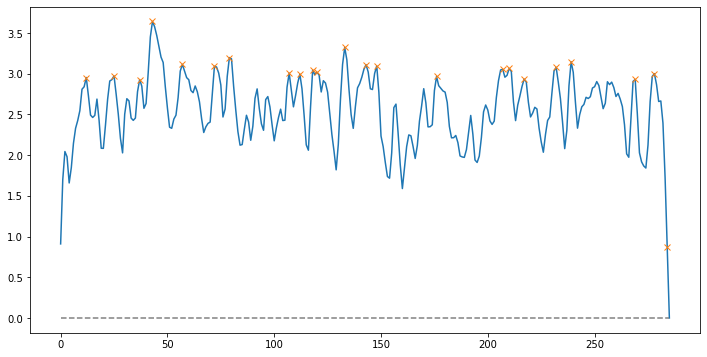

Peak count: 23
Frame tokens: 생각되는군요. 문제의 대답했다. 무리하게라도 “같습니다. 되지요. 겁니다. ” 이었다. 또 가까이에도. 만하겠군요. 말했다. 겁니다. 믿어 다음에는 씨. 약속드립니다. 만일 생각합니다만, 녀석은 됩니다. 되지요. 

Similarity : 0.5020999511163866
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, Generator / grammar loss:-0.18968792259693146   similarity loss:-0.13127771019935608


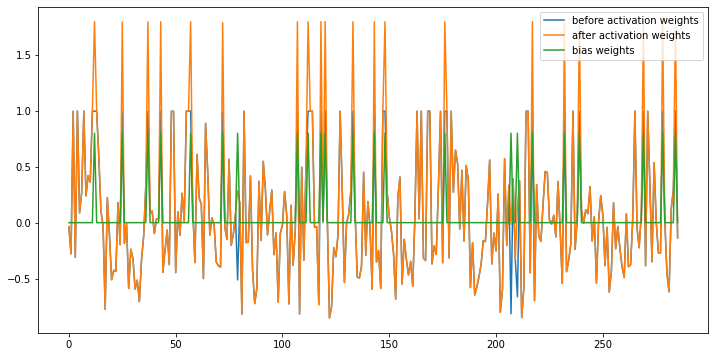

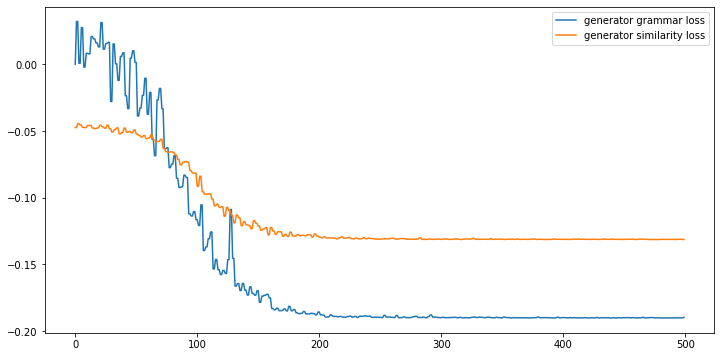

--------------------------------------------------
summary:
동시에 크롬 그것은 점이라고 생각되는군요. ” 문제의 대답했다. 무리하게라도 만일 우리가 어떻게 나올까요?” “같습니다. 되지요. 씨, ” 이었다. “물론 거기까지는 또 가까이에도. 버리시겠지요. 만하겠군요. 말했다. 체포될 겁니다. 살해되어야 겁니까?” 확신을 가지고 않게 믿어 주십시오. 포아로가 이르기까지는 붙잡을 약속드립니다. 만일 박사님이 생각합니다만, 쓰지 녀석은 머리가 됩니다. 되지요.
--------------------------------------------------
         method  comp ratio     intro  ...       var     total   grammar
0      SAM+WGAN    0.185988  0.536234  ...  0.000213  0.564250  0.988690
1  BERT+LexRank    0.141785  0.295026  ...  0.000998  0.244112  0.999901
2          BESM    0.259383  0.534012  ...  0.001289  0.500610  0.999897
3   BESM+kobert    0.249374  0.555561  ...  0.002003  0.477634  0.999903

[4 rows x 8 columns]
Current result ==================================================
         method  comp rate     intro  ...   isthmus  simlirality  grammarity
0      SAM+WGAN   0.177809  0.534374  ...  0.003998     0.544967    0.995327
1  BERT+LexRank   0.261308  0.183841  ...  0.003957     0.

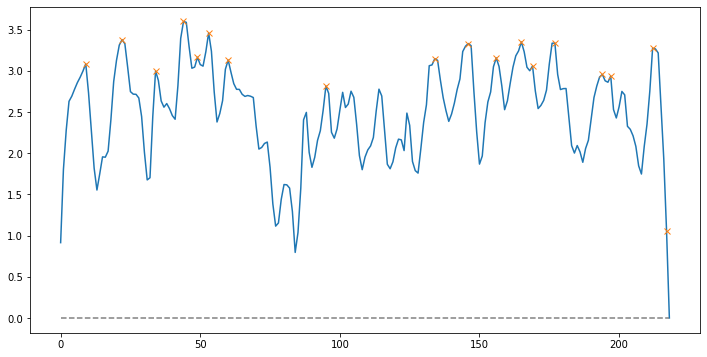

Peak count: 18
Frame tokens: 그렇습니다. 포아로 그는 포아로가 대로지요. “편집광입니다. “벡스힐 확인됐습니다. 말했다. 어떻습니까? “아주 발견입니다. 뚜렷하잖습니까. “그렇습니다. ” 씨? ” “그렇습니다. 

Similarity : 0.519802200351406
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, Generator / grammar loss:-0.20260365307331085   similarity loss:-0.13750965893268585


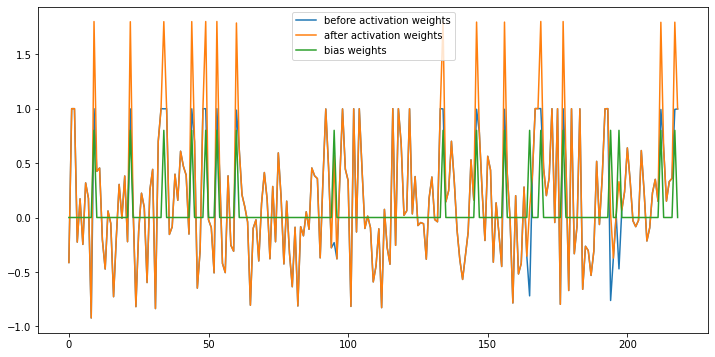

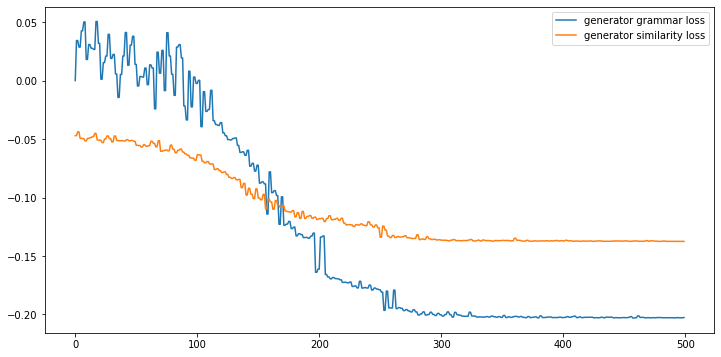

--------------------------------------------------
summary:
그렇겠지요, 박사님?” 그렇습니다. 포아로 모양이었다. 그는 자기, 포아로가 말하는 대로지요. “편집광입니다. “벡스힐 <스컬릿 장교 두 다 이 증인이 대수롭지 수사과장이 말했다. 어떻습니까? “아주 “그것은 꽤 뚜렷하잖습니까. 말씀하셨지요, 포아로가 “그렇습니다. 콤플렉스입니다. 미치광이는 있는 법입니다. ” “그렇습니다. 
--------------------------------------------------
         method  comp ratio     intro  ...       var     total   grammar
0      SAM+WGAN    0.194681  0.611217  ...  0.001194  0.584512  0.997072
1  BERT+LexRank    0.374468  0.169346  ...  0.001136  0.124336  0.999905
2          BESM    0.311702  0.566999  ...  0.003248  0.520541  0.999685
3   BESM+kobert    0.287234  0.551556  ...  0.001223  0.534733  0.999671

[4 rows x 8 columns]
Current result ==================================================
         method  comp rate     intro  ...   isthmus  simlirality  grammarity
0      SAM+WGAN   0.178100  0.535699  ...  0.003949     0.545649    0.995357
1  BERT+LexRank   0.263259  0.183591  ...  0.003909     0.189345    0.999901
2          BESM   0.2

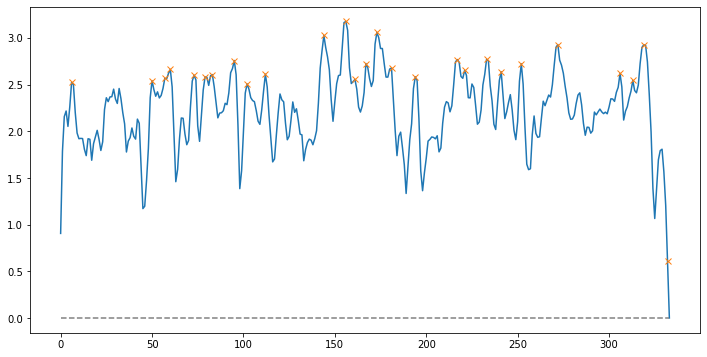

Peak count: 27
Frame tokens: 인물이라면, 성가시던 또 생각됩니다. 이유가 근원이다. 정신이 봅시다. 개인적으로 그러니 이들 보였으니까요. 닥치는 그것에 자기에게 겁니다. 때문입니다. 다음 뚜렷해지겠지요. 다음 다음 거니까요. 하라지. 것일까? 재미삼아 과연 것일까요? 

Similarity : 0.4900423919931942
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, Generator / grammar loss:-0.22078824043273926   similarity loss:-0.1370721161365509


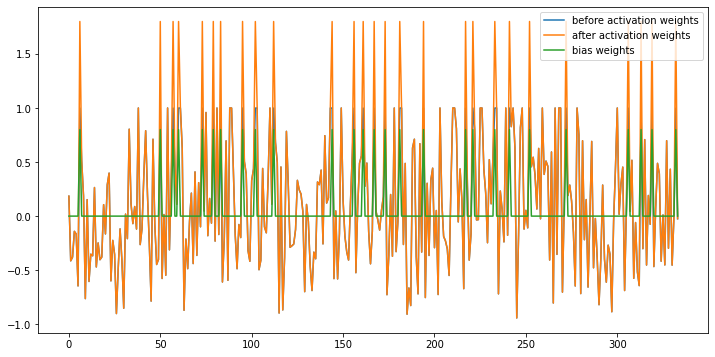

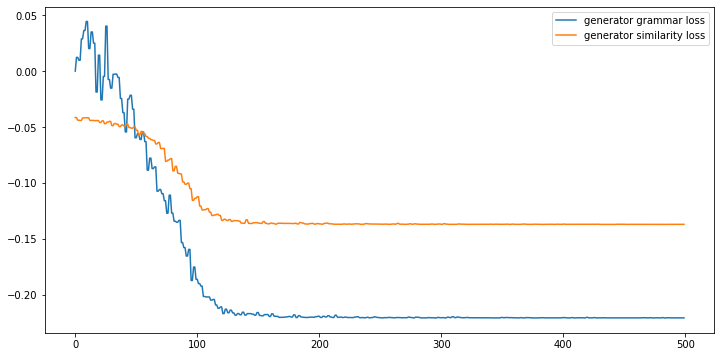

--------------------------------------------------
summary:
인물이라면, 아무 성가시던 행동은 또 생각됩니다. 만일 이유가 근원이다. 죽여야 정신이 같이 움직입니다. 봅시다. 개인적으로 그들이 성립되지 그러니 시작했지요. 이들 시간이 보였으니까요. 닥치는 그것에 자기에게 확신을 겁니다. 성직자나 때문입니다. 연관지을 생각할 수 다음 뚜렷해지겠지요. 초조하게 말했다. 다음 범죄니 주십시오. 다음 막기 모든 거니까요. 그리고 마치 말하는 것 하라지. ” 범인의 것일까? 재미삼아 과연 것일까요?
--------------------------------------------------
         method  comp ratio     intro  ...       var     total   grammar
0      SAM+WGAN    0.177550  0.530562  ...  0.000368  0.557329  0.996960
1  BERT+LexRank    0.124725  0.244280  ...  0.000924  0.225102  0.999906
2          BESM    0.247982  0.535672  ...  0.006429  0.494430  0.999902
3   BESM+kobert    0.246515  0.716323  ...  0.024462  0.475213  0.999907

[4 rows x 8 columns]
Current result ==================================================
         method  comp rate     intro  ...   isthmus  simlirality  grammarity
0      SAM+WGAN   0.178090  0.535612  ...  0.003889     0.545847    0.995384
1  BERT+LexRank   0.260911  0.184619  .

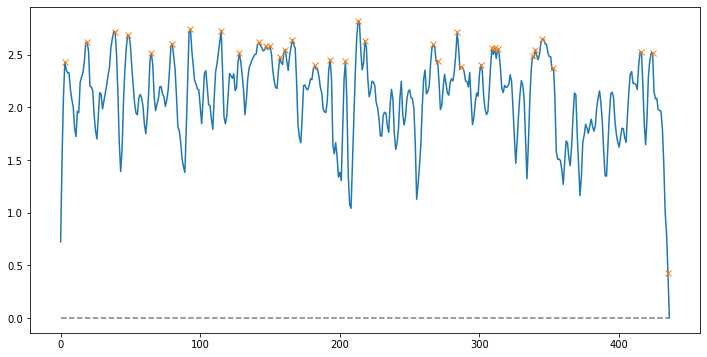

Peak count: 35
Frame tokens: 재미삼아 있으니까요. 그렇다면 어떤 무엇일까요? 온 만일 질문이군요. 아닙니까. 만일 범인에게는 범인이 알게 다음 있게 ‘ 했습니다. 체포되었겠지요. 거고요. 자기가 이유라고는 범인은 되겠지요. 말했다. 하겠습니다. 그때가 공표해도 생각됩니다. 녀석은 해서든 붙잡아 몰랐다. 날카로워졌다. 희망을 심해졌다. 

Similarity : 0.5420094851981972
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, Generator / grammar loss:-0.197639599442482   similarity loss:-0.12966522574424744


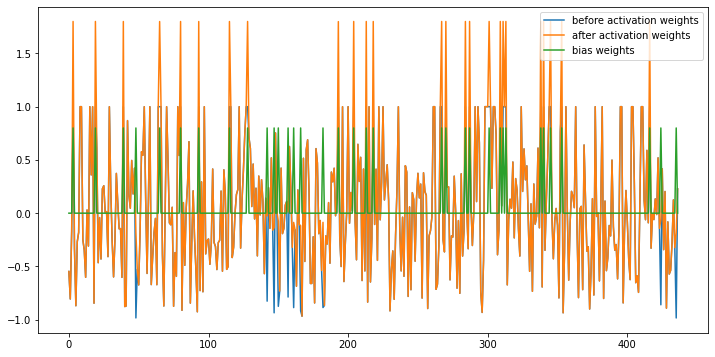

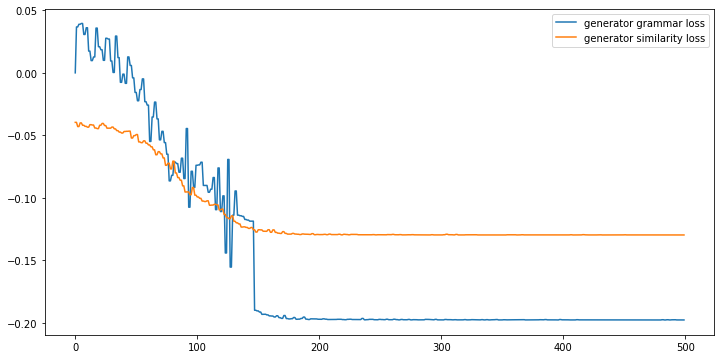

--------------------------------------------------
summary:
재미삼아 그런 짓은 어려움없이 죽일 있으니까요. 그는 그렇다면 그리고 에르큘 동기는 무엇일까요? 내 자신도 나에게 온 만일 된 질문이군요. ” 그럴까요?지금으로선 질문이 아닙니까. 했습니다. 편지 애셔는 체포되었겠지요. 거고요. 그는 자기가 때문에 것을 말했다. 그러나 그렇다고 범죄의 이유라고는 범인은 되겠지요. 말했다. 이르지 셈이군요. “한 가지 제안을 하겠습니다. 다음 받을 때까지 그때가 공표해도 좋으리라 생각됩니다. 일어나겠지만, 녀석은 해서든 그러면 붙잡아 몰랐다. 번째 날아들었던 시간 준비가 만일 포아로와 뜯어보고 지체없이 감에 따라 날카로워졌다.
--------------------------------------------------
         method  comp ratio     intro  ...       var     total   grammar
0      SAM+WGAN    0.178876  0.597755  ...  0.000075  0.589594  0.995805
1  BERT+LexRank    0.157297  0.245752  ...  0.000842  0.199708  0.999902
2          BESM    0.174901  0.560079  ...  0.010177  0.399943  0.999905
3   BESM+kobert    0.182851  0.552322  ...  0.008453  0.407136  0.999906

[4 rows x 8 columns]
Current result ==================================================
         method  comp rate     intro  ...   isthmus  simlirality  grammarity
0      SAM+WGAN   0.178103  0.536648  ...  

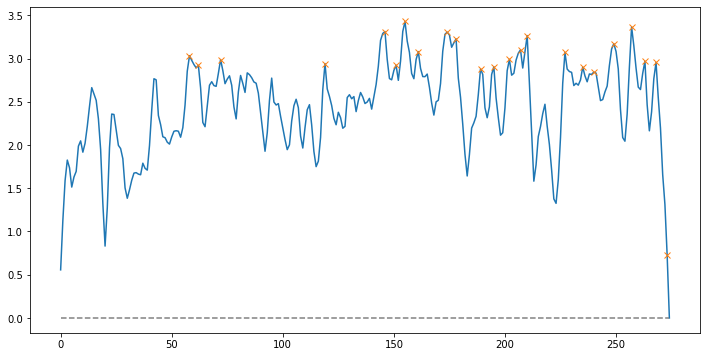

Peak count: 23
Frame tokens: 적어도 그러므로 포아로가 익숙한 “포아로……. “왔군? 빨리. ” 주게. 읽었다. 모양이지? 이번에야말로 이번에는 어디 해봐! “처스턴이라고. “헤이스팅즈, 건가? ” 그러니까……. ” 나는 들었다. 

Similarity : 0.530739622039168
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, Generator / grammar loss:-0.20979195833206177   similarity loss:-0.13633853197097778


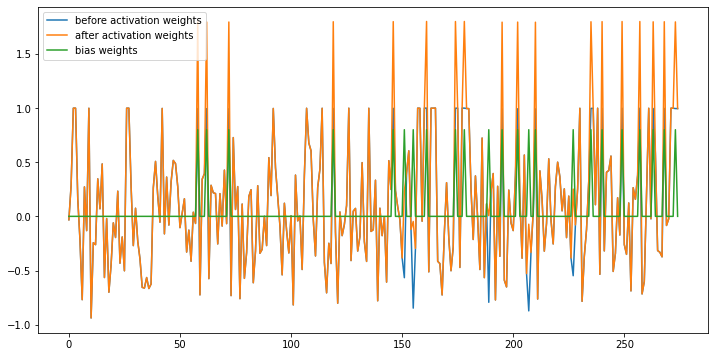

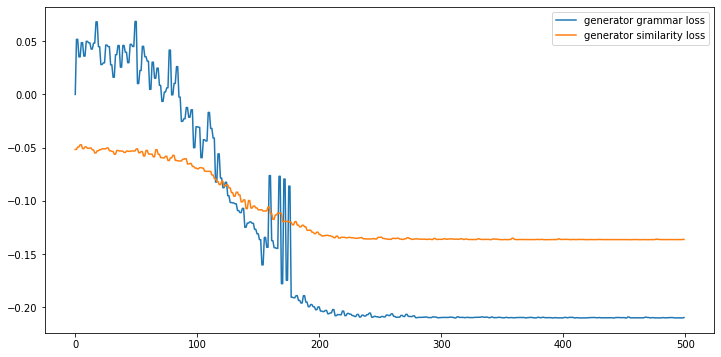

--------------------------------------------------
summary:
버너드와 함께 설명은 쓸모가 없었다. 뿐이었다. 적어도 그러므로 포아로가 런던을 버렸다. 금요일이었다. 익숙한 나는 생각되는데, “포아로……. 급하니까. 계획도 하고. ” 편지를 찢고?포아로도 이때만은 주게. ‘ 큰소리로 읽었다. 가엾은 포아로여, 이번에야말로 이번에는 해봐! 포아로의 “헤이스팅즈, 그 언제 건가? ” 그러니까……. 오늘이 ” 나는 신문을 집어 들었다. 
--------------------------------------------------
         method  comp ratio     intro  ...       var     total   grammar
0      SAM+WGAN    0.181818  0.525179  ...  0.003276  0.608209  0.998585
1  BERT+LexRank    0.274476  0.352439  ...  0.013158  0.175583  0.999904
2          BESM    0.263986  0.529630  ...  0.010151  0.423977  0.999896
3   BESM+kobert    0.276224  0.632308  ...  0.003756  0.545894  0.999682

[4 rows x 8 columns]
Current result ==================================================
         method  comp rate     intro  ...   isthmus  simlirality  grammarity
0      SAM+WGAN   0.178164  0.536460  ...  0.003816     0.547587    0.995444
1  BERT+LexRank   0.259435  0.188373  ...  0.003961     0.189876    0.999

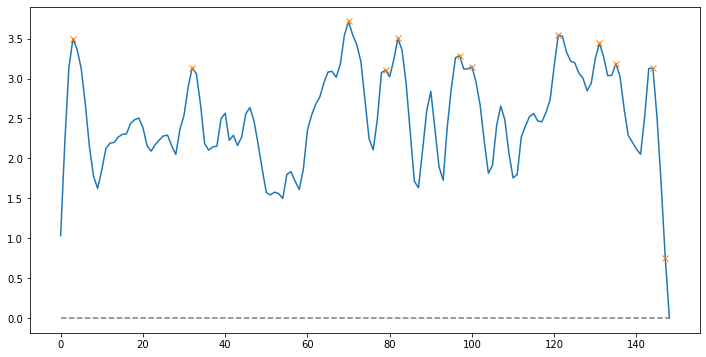

Peak count: 12
Frame tokens: “그렇지만 것이다. 중얼거렸다. 어서 ” 하고 그 포아로가 반박했다. 없지. 이제 없어. 

Similarity : 0.4851165432801158
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, Generator / grammar loss:-0.22427546977996826   similarity loss:-0.16624681651592255


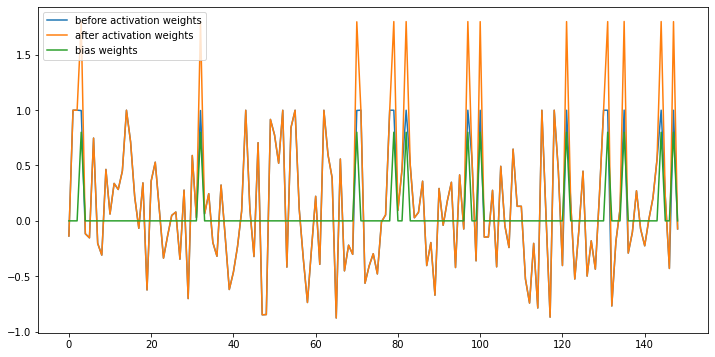

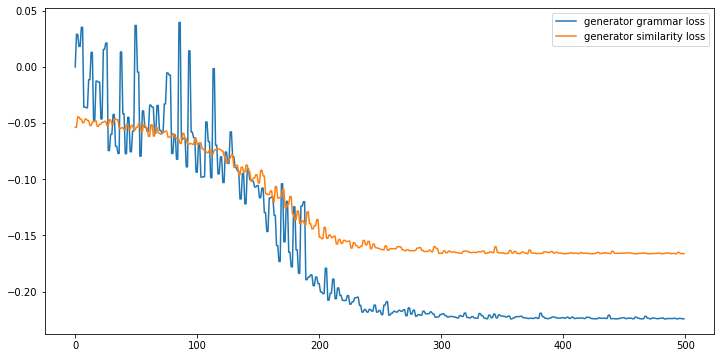

--------------------------------------------------
summary:
나는 더듬거렸다. “그렇지만 다른 것이다. 장, 제1국, 장에도, 헤이븐 중얼거렸다. “이럴 말인가? 어서 ” 하고 그 처스턴으로 급히 포아로가 없으면서 반박했다. 없지. 이제 없어.
--------------------------------------------------
         method  comp ratio     intro  ...       var     total   grammar
0      SAM+WGAN    0.170000  0.574772  ...  0.000751  0.538202  0.998806
1  BERT+LexRank    0.513333  0.322039  ...  0.002892  0.254871  0.999912
2          BESM    0.446667  0.545414  ...  0.009571  0.409904  0.999897
3   BESM+kobert    0.446667  0.545414  ...  0.009571  0.409904  0.999897

[4 rows x 8 columns]
Current result ==================================================
         method  comp rate     intro  ...   isthmus  simlirality  grammarity
0      SAM+WGAN   0.178032  0.537078  ...  0.003767     0.547435    0.995498
1  BERT+LexRank   0.263530  0.190529  ...  0.003944     0.190924    0.999901
2          BESM   0.233756  0.467949  ...  0.005057     0.448622    0.999554
3   BESM+kobert   0.23889

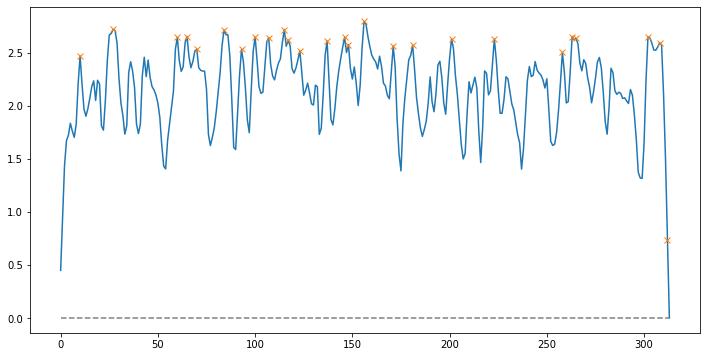

Peak count: 26
Frame tokens: “처스턴, 중얼거렸다. ” ” ” ” 포아로는 몇 “대체 시간이 여겨져서. 헤이스팅즈. 보게. “농담 포아로. 어떤가. 걸세. ” 했다. 모을 내뱉었다. 운명까지 유리하니. ” 질렀다. 생각입니다. 

Similarity : 0.43645550209155837
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, Generator / grammar loss:-0.21835269033908844   similarity loss:-0.1189548522233963


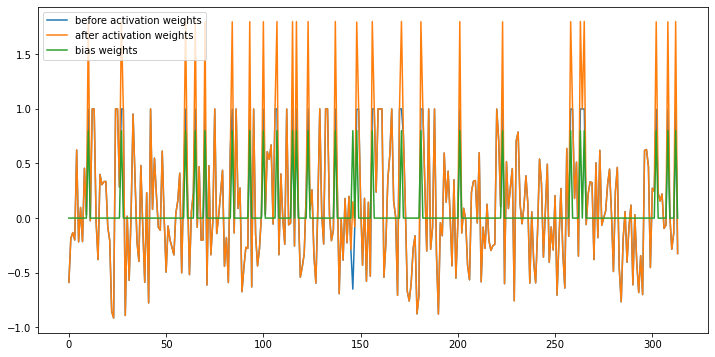

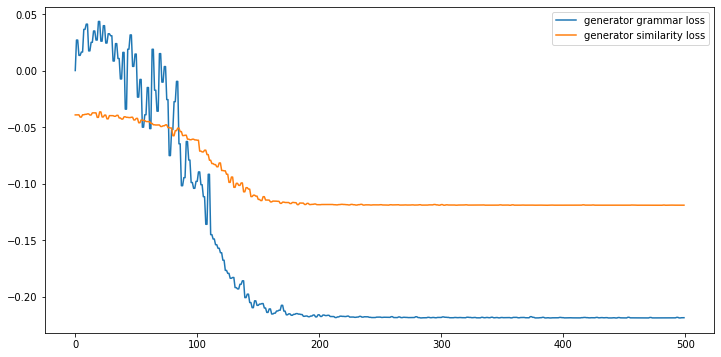

--------------------------------------------------
summary:
“처스턴, 주, 패팅턴에서 쉽겠어. ” 중얼거렸다. “그렇다 빠르겠지. ” ” ” ” ” 그렇겠군. 포아로는 한 몇 말했다. “대체 “자네 시간이 여겨져서. 헤이스팅즈. 그렇게 내 잠옷을 보게. 포아로. 죽느냐 어떤가. ” 시간에 맞춰 간다는 떠나는 없는 걸세. ” 그는 손에서 짐을 했다. 아무 모을 내뱉었다. “신통한 운명까지 그에게 유리하니. ” 질렀다. 생각입니다.
--------------------------------------------------
         method  comp ratio     intro  ...       var     total   grammar
0      SAM+WGAN    0.161365  0.478699  ...  0.000905  0.527022  0.996057
1  BERT+LexRank    0.204810  0.140381  ...  0.001337  0.178960  0.999903
2          BESM    0.175330  0.336222  ...  0.000896  0.373370  0.999810
3   BESM+kobert    0.175330  0.336222  ...  0.000896  0.373370  0.999810

[4 rows x 8 columns]
Current result ==================================================
         method  comp rate     intro  ...   isthmus  simlirality  grammarity
0      SAM+WGAN   0.177768  0.536151  ...  0.003721     0.547111    0.995507
1  BERT+LexRank   0.262598  0.189733  ...  0.003903     0.190734    0.999

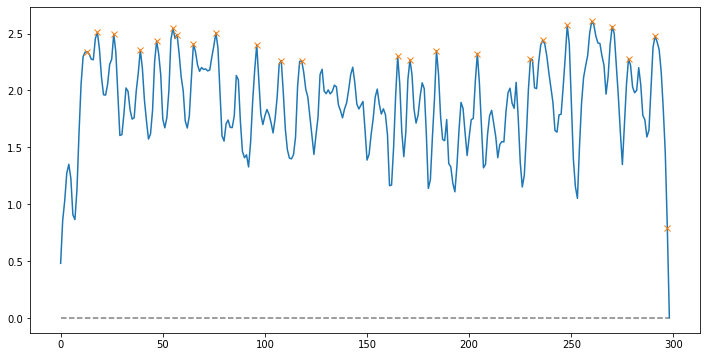

Peak count: 24
Frame tokens: 우리도 저도 있지요. 겁니다. “어떤 처스턴은 장소니까요. 거지요. 있습니다. 말했다. 포아로가 보고입니다. 있었다. 꽤 되었다. 정도였다. 때이니 포아로가 셈일세. 노리는 하지. 거야. ” 소리쳤다. 

Similarity : 0.41310177769211565
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, Generator / grammar loss:-0.20765522122383118   similarity loss:-0.10859940201044083


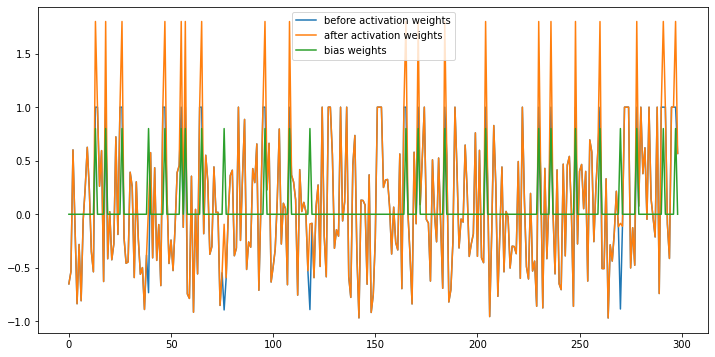

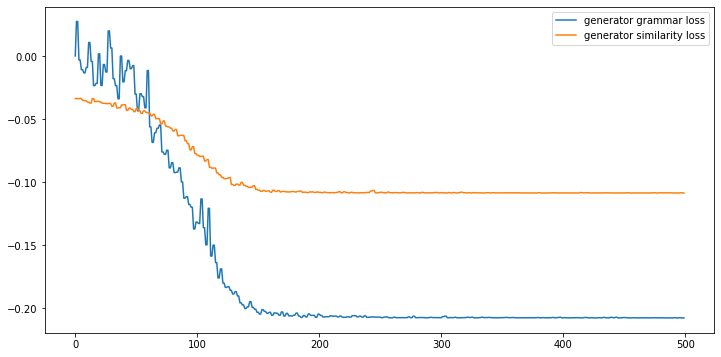

--------------------------------------------------
summary:
우리도 흔히 저도 때가 있지요. 참이었다. “어떤 처스턴은 장소니까요. 있었던 거지요. 플랫폼으로 뭐라고 말했다. 포아로가 죽어 발견됐습니다. ” 여느 알려져 뒤 그 생애를 몰두해 있었다. 꽤 물려받아 되었다. 데븐셔 정도였다. 없는 때이니 포아로가 셈일세. 노리는 기분이 좋아져 손을 거야. 우리가 자기 주는 말일세. ” 나는 생각이 떠올라 소리쳤다.
--------------------------------------------------
         method  comp ratio     intro  ...       var     total   grammar
0      SAM+WGAN    0.168089  0.480560  ...  0.003266  0.475624  0.997117
1  BERT+LexRank    0.146758  0.154443  ...  0.002528  0.163727  0.999909
2          BESM    0.223549  0.441960  ...  0.004677  0.439657  0.999901
3   BESM+kobert    0.226962  0.438648  ...  0.003477  0.432673  0.999899

[4 rows x 8 columns]
Current result ==================================================
         method  comp rate     intro  ...   isthmus  simlirality  grammarity
0      SAM+WGAN   0.177617  0.535282  ...  0.003714     0.545994    0.995532
1  BERT+LexRank   0.260788  0.189181  ...  0.003881     0.190312    0.999901
2      

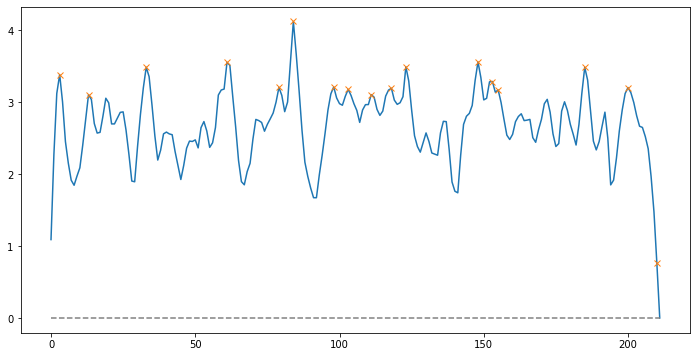

Peak count: 17
Frame tokens: 포아로! 아닌가? 사건이었지. 범죄였지. 거야. “무섭군. 악함과 ” 안돼. 악하다는 악하네. 광적이니까. 보다 것뿐일세. 복잡하지. 데가 걸세. 

Similarity : 0.6079994304995749
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, Generator / grammar loss:-0.19416198134422302   similarity loss:-0.1510317176580429


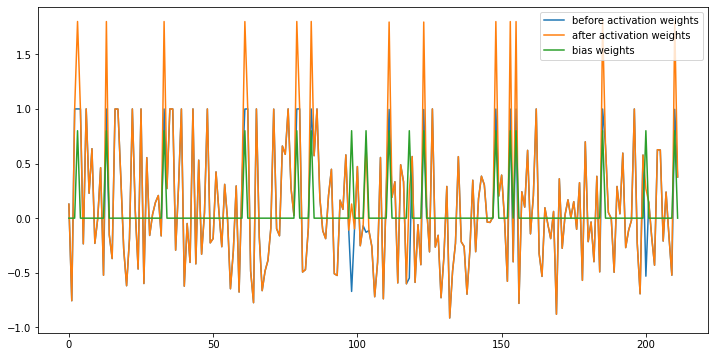

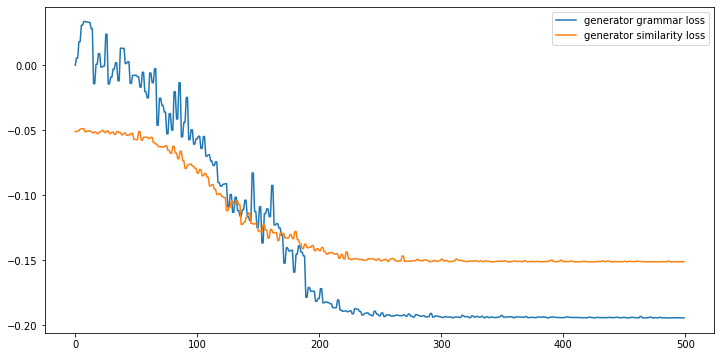

--------------------------------------------------
summary:
이상하잖나, 포아로! 이것은 내가 아닌가? 모두, 이를테면 자네 지금까지의 사건이었지. 중요한 것은 중요한 죽음으로 주변 범죄였지. 그런데 우리가 냉혹하기 살인일세. 거야. ” “무섭군. “그렇네. 안돼. 악하네. 둘레의 광적이니까. 보다 것뿐일세. 한층 복잡하지. 여러 걸세.
--------------------------------------------------
         method  comp ratio     intro  ...       var     total   grammar
0      SAM+WGAN    0.190652  0.697546  ...  0.005980  0.665682  0.998028
1  BERT+LexRank    0.327183  0.201324  ...  0.017450  0.252360  0.999898
2          BESM    0.405904  0.515523  ...  0.007159  0.426667  0.999908
3   BESM+kobert    0.405904  0.515523  ...  0.007159  0.426667  0.999908

[4 rows x 8 columns]
Current result ==================================================
         method  comp rate     intro  ...   isthmus  simlirality  grammarity
0      SAM+WGAN   0.177817  0.537779  ...  0.003749     0.547836    0.995570
1  BERT+LexRank   0.261809  0.189368  ...  0.004090     0.191267    0.999901
2          BESM   0.235348  0.466254  ...  0.0050

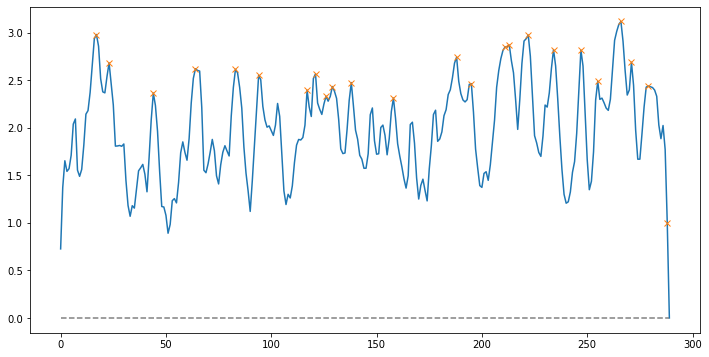

Peak count: 24
Frame tokens: 헤이스팅즈. ” 있었다. 그러나 되었다. 있었다. 우리는 그곳 자세한 주었다. 모양이다. 있었다. 닿았다. 주었는데, 데버릴. “안녕하십니까, 오십시오. 오지요. 들어왔다. 그는 여러분. 소개했다. 그리고 “헤이스팅즈입니다. 

Similarity : 0.44625520424447873
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, Generator / grammar loss:-0.21701796352863312   similarity loss:-0.10331588983535767


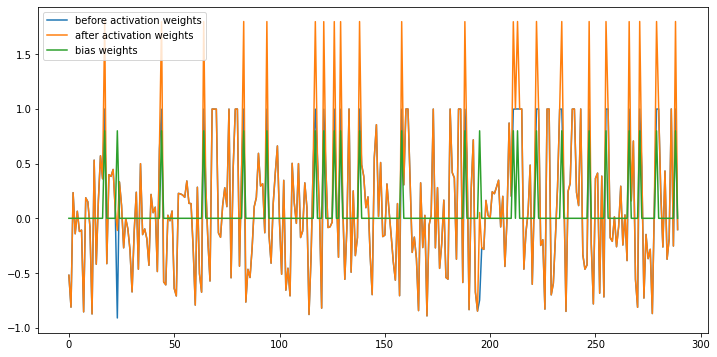

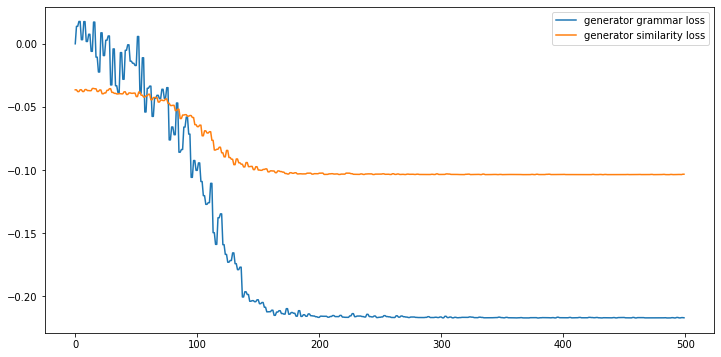

--------------------------------------------------
summary:
헤이스팅즈. 있었다. 그러나 페인턴 사이에 큰 집이며 길 등이 되었다. 있었다. 우리는 그곳 자세한 주었다. 저녁식사 모양이다. 있었다. 무언가 큰 페이지를 지나 불려지고 있었다. 닿았다. 데버릴. ” “안녕하십니까, 웰즈 형사님. 오십시오. ‘ 있는 식당으로 모셔 오지요. 그을은 얼굴에 몸집이 들어왔다. 그는 위급한 여러분. 소개했다. 그리고 저 어투로 “헤이스팅즈입니다.
--------------------------------------------------
         method  comp ratio     intro  ...       var     total   grammar
0      SAM+WGAN    0.177966  0.478150  ...  0.003479  0.526087  0.993321
1  BERT+LexRank    0.194915  0.191266  ...  0.000972  0.166844  0.999907
2          BESM    0.277966  0.414348  ...  0.003745  0.503253  0.999649
3   BESM+kobert    0.244068  0.442283  ...  0.008206  0.357231  0.999898

[4 rows x 8 columns]
Current result ==================================================
         method  comp rate     intro  ...   isthmus  simlirality  grammarity
0      SAM+WGAN   0.177819  0.536875  ...  0.003745     0.547506    0.995536
1  BERT+LexRank   0.260796  0.189397  ...  0.004043     0.190897    0.9

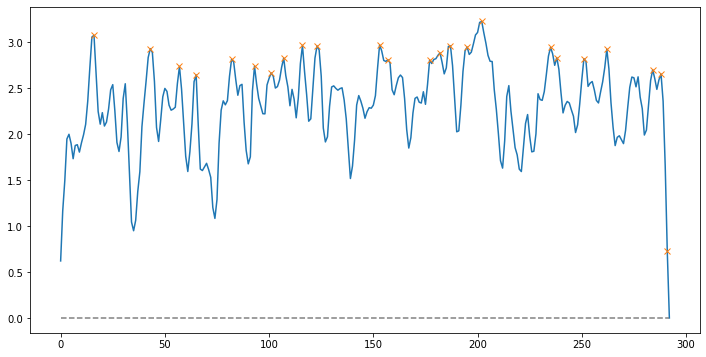

Peak count: 24
Frame tokens: 말했다. “자, 생각했습니다. 그리고 씨. 가장 그 “단번에 “이 상대는 ” 클라크는 내 ” “아무튼 ” 이런 씨. 좋습니다. 않았습니까? 다름없었습니다. 상태입니다. 아시리라 병중이십니다. 

Similarity : 0.4979550897285874
Train... |||||||||||||||||||||| 100.0%   500/500 epochs, Generator / grammar loss:-0.18351052701473236   similarity loss:-0.08774036169052124


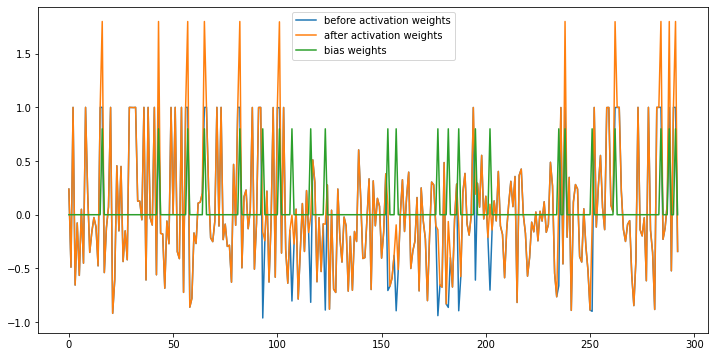

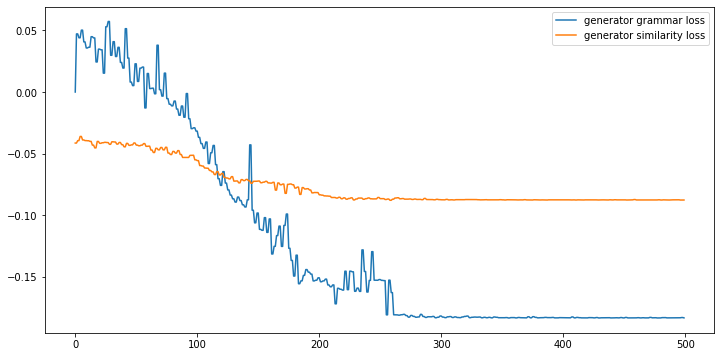

--------------------------------------------------
summary:
프랭클린 그는 그가 말했다. 주십시오. 아무도 없었다. 우리는 곧 커피로 식사를 클라크가 “자, 설명을 정말 듣는 사건이라고 생각했습니다. 그리고 이것은 시체 ABC 클라크 씨. 범죄로 이익이 얻어질까요. 말입니다. 포아로는 그 옳다는 없겠지요. ” 좋습니다. 정신을 “아니오, 여느 다름없었습니다. ” “전혀 그렇게 초조해 여느 때 상태입니다. 아시리라 형수님이 병중이십니다.
--------------------------------------------------
         method  comp ratio     intro  ...       var     total   grammar
0      SAM+WGAN    0.170299  0.624931  ...  0.002686  0.576954  0.993865
1  BERT+LexRank    0.283293  0.222324  ...  0.000810  0.182145  0.999912
2          BESM    0.220339  0.427105  ...  0.001109  0.378163  0.999910
3   BESM+kobert    0.220339  0.427105  ...  0.001109  0.378163  0.999910

[4 rows x 8 columns]
Current result ==================================================
         method  comp rate     intro  ...   isthmus  simlirality  grammarity
0      SAM+WGAN   0.177707  0.538189  ...  0.003729     0.547946    0.995511
1  BERT+LexRank   0.261132  0.189888  ...  0.003994     0.190766    0.

In [ ]:
import sys

def get_features(dct1):
    return [dct1['comp ratio'][0],dct1['intro'][0],dct1['body'][0],dct1['ending'][0],dct1['var'][0],dct1['total'][0],dct1['grammar'][0]]


test_result = {}
test_result['SAM+WGAN']=[]
test_result['BERT+LexRank']=[]
test_result['BESM']=[]
test_result['BESM+kobert']=[]

step = 0
count = 100
for intro,body,end in document[0:count]:
    step += 1
    print("=" * 50)
    print(str(step),"/",count)
    print("=" * 50)

    org_text_1 = intro
    org_text_2 = body
    org_text_3 = end
    try:
        df1,dct1 = sam_wgan([org_text_1,org_text_2,org_text_3])
        df2,dct2 = bert_lexrank_sum([org_text_1,org_text_2,org_text_3])
        df3,dct3 = besm([org_text_1,org_text_2,org_text_3])
        df4,dct4 = besm_bert([org_text_1,org_text_2,org_text_3])
        test_result['SAM+WGAN'].append(get_features(dct1))
        test_result['BERT+LexRank'].append(get_features(dct2))
        test_result['BESM'].append(get_features(dct3))
        test_result['BESM+kobert'].append(get_features(dct4))
        result = pd.concat([df1, df2, df3, df4 ], ignore_index=True)
        print(result)

        print("Current result","=" * 50)
        print(get_test_statistics())

    except KeyboardInterrupt as ki:
        raise ki
    except:
        print("Unexpected error:", sys.exc_info()[0])
        pass


Table2는 비교적 짧은 스토리에 대한 요약 방법별 결과 비교를 나타낸다.'comp ratio'는 요약의 압축율을 나타낸다. comp ration가 낮을 수록 요약의 압축이 많이 되었다는 의미있다. 비교 검증의 신뢰성을 위하여 가능한 comp ratio을 비슷하게 맞추었다. 아래의 표에서 알 수 있듯이, 비교적 짧은 문서에 대해서는 추출방법 대비 지협성 해소의 효과가 크게 나타나지 않는 것을 확인 할 수 있다. 결과적으로 추출 방법에 비해 유사성의 큰 변화가 없었다. 하지만, Table3의 비교적 긴 스토리에 대한 요약 방법별 결과 비교에서 보면, 제안의 방법이 추출 방법 대비 압축율 이 가장 낮음에도 불구하고  지협성 해소의 효과가 있음을 확인 할 수 있다. 서론, 본론, 결론의 각 유사성이 다른 방법에 비해 고르게 분포하고 있다. 또한 그림 4의 분포도에서 서론, 본론, 결론의 각 유사성의 편차가 제안 방법이 가장 낮게 나타나고 있음을 확인할 수 있었다. 

Table 2 shows the comparison of results by summary method for relatively short stories. 'comp ratio' indicates the compression ratio of the summary. The lower the comp ration, the more the summary is compressed. For the reliability of the comparison verification, the comp ratio was similarly adjusted with other method. As can be seen from the table below, it shows that for relatively short stories (document), the effect of resolving isthmus compared to the extractive method does not appear much. As a result, there was no significant change in summarization similarity compared to the extractive method. However, from the comparison of the results of each summary method for the relatively long story in Table 3, it shows that the proposed method has the effect of resolving isthmus, although the compression ratio is the lowest compared to the extractive method. The similarities of the introduction, body, and conclusion are evenly distributed compared to other methods. In addition, in the distribution map of Fig. 4, it was confirmed that the deviation of the similarity between the introduction, the body, and the conclusion was the lowest in the proposed method.

# 6. Conclution

본 논문에서 제안한 방법은 extractive 방법의 지협성을 해결 할 수 있었고, abstractive 방법에서 필요한 대량의 학습셋 없이도 WGAN의 비지도 학습에 의해서 abstractive의 효과를 얻을 수 있었다. 
 원문대비 유사성에 있어서는 비교적 짧은 스토리에서 Extractive 방법과 대등소이한 결과를 보였으나, 비교적 긴 스토리에서는 Extractive보다 Similarity가 서론, 본문, 결론 모두 높게 나타났다. 그러나, grammarlity는 가장 낮았다. 이는, 주요 어절을 기반으로 문법에 맞게 적당한 어절을 만들어내는 기본 알고리즘 구조상 나타나는 현상으로 이해할 수 있다.
 일반 DNN구조로 만들어진 Generator이기 때문에 문법 구성이 부드럽지 못했다. 향후에는 seq2seq 알고리즘으로 Generator를 구성하면 문법적으로 더 완성도 높은 문장을 생성할 것으로 기대한다. 

The method proposed in this paper was able to solve the isthmus of the extractive method, and obtained the abstractive effect by the unsupervised learning of WGAN without the need for a large number of training sets required in the abstractive method. In terms of similarity compared to the original text, the results were comparable to the extractive method in a relatively short story, but the similarity was higher in the introduction, body, and conclusion than in extractive in a relatively long story. However, the grammarlity was the lowest. This can be understood as a phenomenon that appears in the structure of a basic algorithm that generates words appropriate for grammar based on major words. Since it is a generator made with a general DNN structure, the grammar composition was not smooth. In the future, if the generator is configured with the seq2seq algorithm, it is expected that sentences with higher grammatical completion will be generated.

## Reference

[1] Rada Mihalcea and Paul Tarau, (2004). TextRank: Bringing Order into Texts <br>
[2] G¨une¸s Erkan. (2004). LexRank: Graph-based Lexical Centrality as Salience in Text Summarization <br>
[3] Susan T. Dumais (2005). "Latent Semantic Analysis". Annual Review of Information Science and Technology. 38: 188–230. <br>
[4] Hans Peter Luhn (1960). Keyword-in-context index for technical literature. American Documentation, 11(4):288–295. ISSN 0002-823 <br>
[5] Aria Haghighi, (2009). Exploring Content Models for Multi-Document Summarization <br>
[6] Colin Raffel. (2020). Exploring the Limits of Transfer Learning with a Unified Text-to-Text Transformer <br>
[7] Mike Lewis, (2019). BART: Denoising Sequence-to-Sequence Pre-training for Natural Language Generation, Translation, and Comprehension <br>
[8] Alec Radford, (2018). Language Models are Unsupervised Multitask Learners <br>
[9] Guillaume Lample, (2019). Cross-lingual Language Model Pretraining <br>
[10] Nils Reimers and Iryna Gurevych, (2019). Sentence-BERT: Sentence Embeddings using Siamese BERT-Networks <br>
[11] Sharma, P., & Li, Y. (2019). Self-Supervised Contextual Keyword and Keyphrase Retrieval with Self-Labelling <br>
[12] Jacob Devlin, (2019). BERT: Pre-training of Deep Bidirectional Transformers for Language Understanding <br>
[13] Ian J. Goodfellow, (2014). Generative Adversarial Nets <br>
[14] Yau-ShianWang, (2018). Learning to Encode Text as Human-Readable Summaries using Generative Adversarial Networks <br>
[15] Martin Arjovsky, (2017). Wasserstein GAN <br>